In [31]:
import wandb
import numpy  as np
import pandas as pd
import tensorflow as tf
from keras.datasets import fashion_mnist
from tensorflow.keras.datasets import mnist
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import math
import seaborn as sns
from sklearn.metrics import confusion_matrix
import copy

In [32]:
wandb.login()

True

In [33]:
'''LOADING TRAIN AND TEST DATA SET'''
(X_train,Y_train),(X_test,Y_test) = fashion_mnist.load_data()

In [34]:
print(f'Shape of input train data is : {X_train.shape}')
print(f'Shape of input test data is : {X_test.shape}')
print(f'Shape of output train data is : {Y_train.shape}')
print(f'Shape of output test data is : {Y_test.shape}')

Shape of input train data is : (60000, 28, 28)
Shape of input test data is : (10000, 28, 28)
Shape of output train data is : (60000,)
Shape of output test data is : (10000,)


In [35]:
'''Finding image of each category'''
categories=[]
images_list=[]
attributes={0:'T-shirt',1:'Trouser',2:'Pullover',3:'Skirt',4:'Overcoat',5:'Sandal',
            6:'Shirt',7:'Sneakers',8:'Bag',9:'Ankle boot'}
title=list(attributes.values())
print(f'The various categorical variables in the data are : {title}')
for i in range(10):
    categories.append(i)
for i in range(Y_train.shape[0]):
               if Y_train[i]==categories[0]:
                    images_list.append(X_train[i])
                    del(categories[0])
                    if len(categories)==0:
                        break


The various categorical variables in the data are : ['T-shirt', 'Trouser', 'Pullover', 'Skirt', 'Overcoat', 'Sandal', 'Shirt', 'Sneakers', 'Bag', 'Ankle boot']


Numerical value equivalent to categorical variable : 9


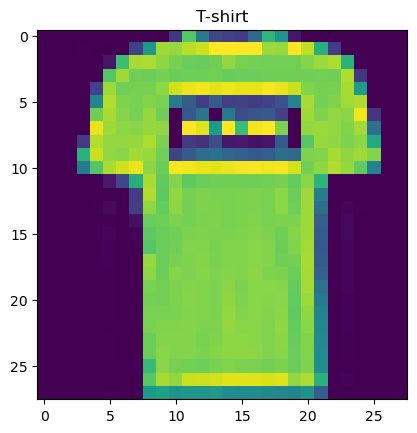

Numerical value equivalent to categorical variable : 0


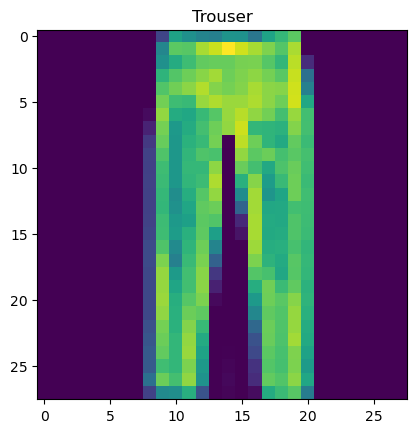

Numerical value equivalent to categorical variable : 0


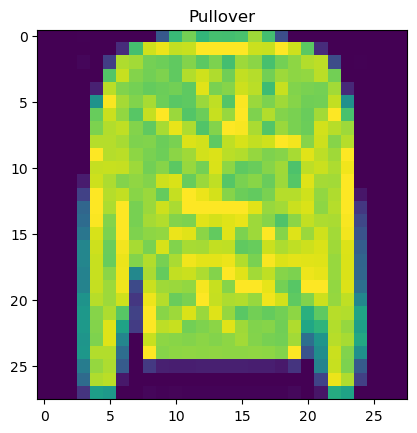

Numerical value equivalent to categorical variable : 3


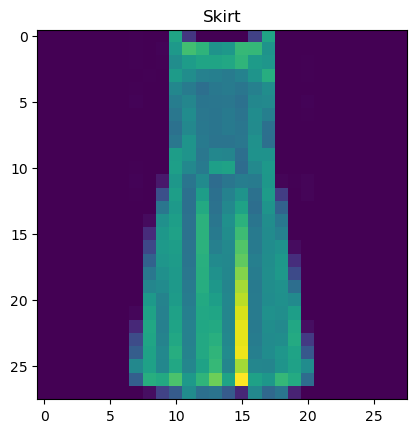

Numerical value equivalent to categorical variable : 0


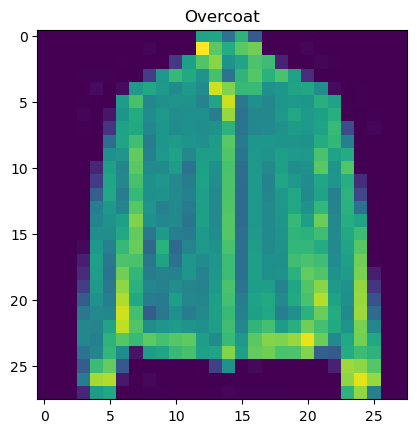

Numerical value equivalent to categorical variable : 2


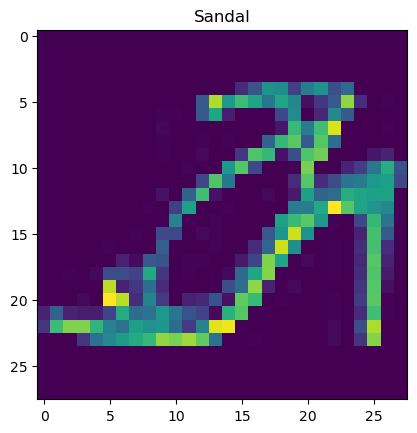

Numerical value equivalent to categorical variable : 7


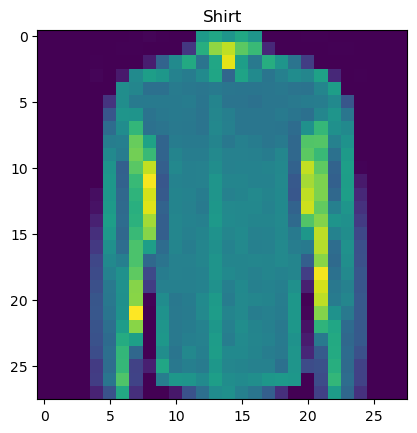

Numerical value equivalent to categorical variable : 2


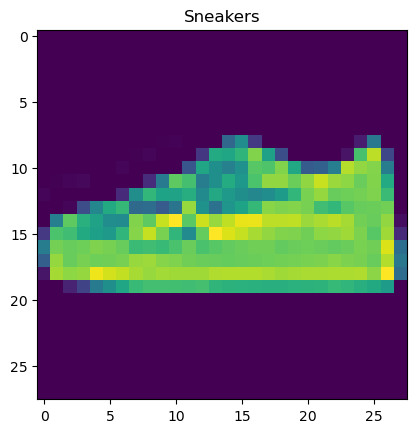

Numerical value equivalent to categorical variable : 5


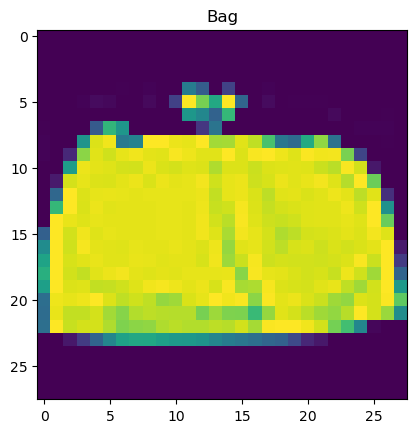

Numerical value equivalent to categorical variable : 5


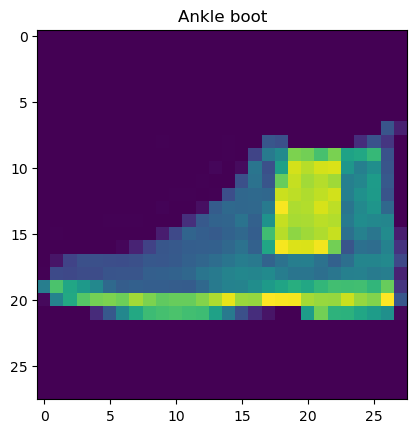

In [36]:
'''Plotting image of each category'''
for i in range(len(attributes)):
    print(f'Numerical value equivalent to categorical variable : {Y_train[i]}')
    plt.imshow(images_list[i], cmap=plt.get_cmap())
    plt.title(attributes[i])
    plt.show()

In [45]:
wandb.init(project="CS6910_DL_ASS1", name='Assignment_1_sample_imgs')
'''Displaying sample images in wandb'''
wandb.log({"Sample Image from each class": [wandb.Image(image, caption=caption) for image, 
                                            caption in zip(images_list,title)]})

wandb: WARNING Ignored wandb.init() arg project when running a sweep.


In [37]:
'''CHANGING THE SHAPE OF INPUT DATA'''
x_train=np.zeros((60000,784))
for i in range(X_train.shape[0]):
    a=X_train[i].reshape(1,784)
    x_train[i]=a
print('Train data',x_train.shape)
x_test=np.zeros((10000,784))
for i in range(X_test.shape[0]):
    a=X_test[i].reshape(1,784)
    x_test[i]=a
print('Test data',x_test.shape)

Train data (60000, 784)
Test data (10000, 784)


In [38]:
'''CONVERTING OUTPUT DATA INTO ONE HOT VECTOR FORM'''
a = np.max(Y_train)+1
y_train=np.zeros((Y_train.shape[0],a))
for i in range(Y_train.shape[0]):
    for j in range(a):
        if Y_train[i]==j:
            y_train[i,j]=1
print('Train data',y_train.shape)
y_test=np.zeros((Y_test.shape[0],a))
for i in range(Y_test.shape[0]):
    for j in range(a):
        if Y_test[i]==j:
            y_test[i,j]=1
#print(y_test[0,:])
print('Test data',y_test.shape)

Train data (60000, 10)
Test data (10000, 10)


In [39]:
'''CREATING VALIDATION DATA SET'''
'''The input data is split into train and validation data where validation comprises of 10% of the data.'''

x_train,x_val,y_train,y_val = train_test_split(x_train,y_train,test_size=0.10,random_state=10)
x_train=x_train.T/255
y_train=y_train.T
x_test=x_test.T/255
y_test=y_test.T
x_val=x_val.T/255
y_val=y_val.T
print(f'The shape of train data is:{x_train.shape}')
print(f'The shape of test data is:{x_test.shape}')
print(f'The shape of validation data is:{x_val.shape}')

The shape of train data is:(784, 54000)
The shape of test data is:(784, 10000)
The shape of validation data is:(784, 6000)


In [40]:
'''ACTIVATION FUNCTIONS'''

'''input: zl = w(l)*a(l-1) + b(l) where l is the lth Layer.The various activation functions implemented here are 
sigmoid,tanh,ReLu and Identity functions.'''


#SIGMOID FUNCTION
def sigmoid_function(z):
    h=1./(1.+np.exp(-z))
    
    return h

#TANH FUNCTION
def tanh_function(z):
    h=np.tanh(z)
    
    return h

#RELU FUNCTION
def relu_function(z):
    h=np.maximum(z,0)
    
    return h
    

#IDENTITY FUNCTION
def identity_function(z):
    
    return z


In [41]:
#OUTPUT LAYER FUNCTION
'''The given problem is a multi-class classification problem.So,we use softmax function for the output layer(L)
    Z(L) = W(L)*A(L-1) + B(L) where Lth layer is the output layer.'''


#SOFTMAX FUNCTION
'''OUTPUT LAYER FUNCTION'''

def softmax_function(z):
    #z=z-np.max(z,axis=0,keepdims=True) # to avoid Nan or division by zero errors
    h = np.exp(z)/np.sum(np.exp(z), axis=0)
    return h

In [42]:
'''DERIVATIVE FUNCTIONS'''

'''These are the derivatives of the corresponding activation functions, which is used in backpropagation to find
the derivative of activation functions.'''

#DERIVATIVE OF SIGMOID FUNCTION
def sigmoid_function_dash(z):
    h = sigmoid_function(z)
    
    return h*(1-h)


#DERIVATIVE OF TANH FUNCTION
def tanh_function_dash(z):
    h=tanh_function(z)
    
    return 1-(h)**2


#DERIVATIVE OF RELU FUNCTION
def relu_function_dash(z):
    return 1*(z>0)
    
#DERIVATIVE OF IDENTITY FUNCTION
def identity_function_dash(z):
    h = identity_function(z)
    
    return np.ones(z.shape)



In [43]:
'''SOFTMAX DERIVATIVE'''
def softmax_dash(Z):
    h= softmax(z) * (1-softmax(z))
    return h

In [44]:
#CROSS ENTROPY FUNCTION(DERIVATIVE OF OUTPUT LAYER)
def cross_entropy_function(y,ycap,w,lambd):
    '''This function is called as categorical cross entropy function.
       input: Y:actual value of output
              YCAP:predicted value of output
              lambd:Regularisation parameter(L2 Rregularization is used here)'''
    
    #ycap = np.clip(ycap, 1e-12, 1.0 - 1e-12) #to avoid Nan error 
    m=y.shape[1]
    cost=-(1/m)*np.sum(y*np.log(ycap))
    regularization_cost=0
    for i in range(len(w)):
        regularization_cost += (lambd/(2*m))*np.sum(np.square(w[i]))
        
    return cost+regularization_cost
     
        
#MEAN SQUARED ERROR FUNCTION
def mean_squared_error_function(y,ycap,w,lambd):
    '''input: Y:actual value of output
              YCAP:predicted value of output
              lambd:Regularisation parameter(L2 Rregularization is used here)'''   
    ycap = np.clip(ycap, 1e-12, 1.0 - 1e-12)
    m = y.shape[1]
    mean_square_error = (1/m)*np.sum((y-ycap)**2)
    reg_cost=0
    for i in range(len(w)):
        reg_cost += (lambd/(2*m))*np.sum(w[i]**2)
    return mean_square_error + reg_cost


In [45]:
#INITIALISE PARAMETERS

'''input:  Layer_attributes is a list consisting of number of 
    neurons in each layer. Here,input layer is considered as 0th Layer, output layer is considered as Lth layer
    and the layers from 1 to (L-1) are considered as hidden layers.Therefore, layer-attributes consists of (L+1)
    values. The methods used here to initialise the values of parameters are Random and Xavier Initialisations.'''

def random_initialization(layer_attributes):
    
    L=len(layer_attributes)-1
    W=[]
    B=[]
    np.random.seed(10)
    for i in range(1,L+1):
        weight_i = np.random.uniform(-1,1,(layer_attributes[i],layer_attributes[i-1]))
        bias_i=np.zeros((layer_attributes[i],1))
        #bias_i=np.full((layer_attributes[i],1),0.01) # in case of relu function to avoid vanishing gradient
        W.append(weight_i)
        B.append(bias_i)
        
    return W,B

def xavier_initialization(layer_attributes):
    
    L=len(layer_attributes)-1
    W=[]
    B=[]
    for i in range(1,L+1):
        lim = np.sqrt(6/(i+(i-1)))
        weight_i = np.random.uniform(-lim,lim,(layer_attributes[i],layer_attributes[i-1]))
        bias_i=np.zeros((layer_attributes[i],1))
        W.append(weight_i)
        B.append(bias_i)
        
    return W,B
        

In [46]:
#FORWARD PROPAGATION
def forward_propagation(x,w,b,activation='sigmoid_function'):
    
    '''Forward propagation is used to find the predicted value of output and cost function by going forward,starting from 
    input layer until the output layer.We calculate the pre-activation and activation values and returns the latter after each
    layer. The input parameters taken are input data set,weights and bias value, and activation function to be used where the 
    default is set as sigmoid function. Softmax function is used to find the values at the output layer.
    Here,z is the linear part and a is the non-linear part(activation function) of a neuron.'''
    A=[]
    Z=[]
    length=len(w)
    #Hidden layers
    A.append(x)
    for i in range(length-1):
        z_i=np.dot(w[i],A[-1])+b[i]
        Z.append(z_i)
        if activation =='sigmoid_function':
            a_i = sigmoid_function(z_i)
            A.append(a_i)
        elif activation=='tanh_function':
            a_i = tanh_function(z_i)
            A.append(a_i)
        elif activation == 'relu_function':
            a_i = relu_function(z_i)
            A.append(a_i)
        elif activation == 'identity_function':
            a_i = identity_function(z_i)
            A.append(a_i)
    #output layer
    z_l = np.dot(w[-1],A[-1]) + b[-1]
    a_l = softmax_function(z_l)
    A.append(a_l)
    Z.append(z_l)

    return Z,A


In [47]:
#BACK PROPAGATION
def back_propagation(A,y,W,B,Z,lambd,activation='sigmoid_function',loss='cross_entropy_function'):
    
    '''Back propagation is used to find the derivatives of each weights and biases at each layers by starting 
    from the output layer and travelling backwards.We find the derivatives wrto ouput layer,wrto hidden layer and eventually
    wrto weights and biases;dw=dJ/dw,db=dJ/db,dz=dJ/dz.'''
    m=y.shape[1]
    L=len(W)
    dW=[]
    dB=[]
    dZ=[]
    #Output Layer
    if loss=='cross_entropy_function':
        dZ.append(A[-1]-y)
        dB.append((1/m)*np.sum(dZ[-1],axis=1,keepdims=True))
        dW.append((1/m)*(np.dot(dZ[-1],A[-2].T))+(lambd/m)*W[-1])
    elif loss=='mean_squared_error_function':
        dZ.append((A[-1]-y)*A[-1]*(1-A[-1]))
        dB.append((1/m)*np.sum(dZ[-1],axis=1,keepdims=True))
        dW.append((1/m)*(np.dot(dZ[-1],A[-2].T))+(lambd/m)*W[-1])
        
   
    #Hidden layers
    l=L-1
    while l >0:
        if activation=='sigmoid_function':
            dz_l = (1/m)*np.dot(W[l].T,dZ[-1])*sigmoid_function_dash(A[l])
            db_l = (1/m)*np.sum(dz_l,axis=1,keepdims=True)
            dw_l = (1/m)*np.dot(dz_l,A[l-1].T) + (lambd/m)*W[l-1]
            dW.append(dw_l)
            dB.append(db_l)
            dZ.append(dz_l)
        
        elif activation == 'relu_function':
            dz_l = (1/m)*np.dot(W[l].T,dZ[-1])*relu_function_dash(A[l])
            db_l = (1/m)*np.sum(dz_l,axis=1,keepdims=True)
            dw_l = (1/m)*np.dot(dz_l,A[l-1].T) + (lambd/m)*W[l-1]
            dW.append(dw_l)
            dB.append(db_l)
            dZ.append(dz_l)
            
        elif activation=='tanh_function':
            dz_l = (1/m)*np.dot(W[l].T,dZ[-1])*tanh_function_dash(A[l])
            db_l = (1/m)*np.sum(dz_l,axis=1,keepdims=True)
            dw_l = (1/m)*np.dot(dz_l,A[l-1].T) + (lambd/m)*W[l-1]
            dW.append(dw_l)
            dB.append(db_l)
            dZ.append(dz_l)
            
        elif activation=='identity_function':
            dz_l = (1/m)*np.dot(W[l].T,dZ[-1])*identity_function_dash(A[l])
            db_l = (1/m)*np.sum(dz_l,axis=1,keepdims=True)
            dw_l = (1/m)*np.dot(dz_l,A[l-1].T) + (lambd/m)*W[l-1]
            dW.append(dw_l)
            dB.append(db_l)
            dZ.append(dz_l)
            
        l=l-1
            
    return dZ[::-1],dW[::-1],dB[::-1]

In [48]:
#OPTIMIZERS
def gradient_descent(W,B,dW,dB,learning_rate):
    
    '''Mini batch,vanilla and stochastic gradient descents can be performed for this basic 
    gradient descent variant.'''
    
    alpha=learning_rate
    length=len(W)
    for i in range(length):
        W[i] = W[i] - alpha*dW[i]
        B[i] = B[i] - alpha*dB[i]
    return W,B

def momentum_gradient_descent(w,b,dw,db,learning_rate,momentum,update_w,update_b):
    
    '''Nesterov accelarated gradient descent can also be implemented as a special case of this Momentum gradient
    descent  where we find wlookahead before calculating gradients '''
    
    for i in range(len(w)):  
        update_w[i] = (momentum*update_w[i]) + dw[i]
        update_b[i] = (momentum*update_b[i]) + db[i]
        w[i] = w[i] - (learning_rate*update_w[i])
        b[i] = b[i] - (learning_rate*update_b[i])
    return w,b,update_w,update_b

def rms_prop(w,b,dw,db,learning_rate,beta,epsilon,v_t_w,v_t_b):
    
    '''RMSProp is an adaptive learning algorithm and the hyperparamteters used 
    here are learning_rate(alpha) and beta.'''
    
    for i in range(len(w)):
        v_t_w[i] = beta*v_t_w[i] + (1-beta)*((dw[i])**2)
        v_t_b[i] = beta*v_t_b[i] + (1-beta)*((db[i])**2)
        w[i] = w[i] - (learning_rate/(np.sqrt(v_t_w[i]+epsilon)))*dw[i]
        b[i] = b[i] - (learning_rate/(np.sqrt(v_t_b[i]+epsilon)))*db[i]
        return w,b,v_t_w,v_t_b


def adam(w,b,dw,db,learning_rate,beta1,beta2,epsilon,m_w,m_b,v_w,v_b,t):
    
    '''Adam(Adaptive moments) is one of the widely used adaptive learning gradient descent variant and it takes 
    beta1,beta2,learning_rate(alpha) as hyperparameters and also a small value epsilon to avoid zero division
    errors.'''
    
    m_w_cap=[]
    m_b_cap=[]
    v_w_cap=[]
    v_b_cap=[]
    for k in range(len(w)):
        upd_w=np.zeros((w[k].shape))
        upd_b=np.zeros((b[k].shape))
        m_w_cap.append(upd_w)
        m_b_cap.append(upd_b)
        v_w_cap.append(upd_w)
        v_b_cap.append(upd_b)
        
    for i in range(len(w)):
        m_w[i]=beta1*m_w[i]+(1-beta1)*dw[i]
        m_b[i]=beta1*m_b[i]+(1-beta1)*db[i]
        v_w[i]=beta2*v_w[i]+(1-beta2)*(dw[i]**2)
        v_b[i]=beta2*v_b[i]+(1-beta2)*(db[i]**2)
        m_w_cap[i] = (1/(1-math.pow(beta1,t)))*m_w[i]
        m_b_cap[i] = (1/(1-math.pow(beta1,t)))*m_b[i]
        v_w_cap[i] = (1/(1-math.pow(beta2,t)))*v_w[i]
        v_b_cap[i] = (1/(1-math.pow(beta2,t)))*v_b[i]
        w[i] = w[i] - (learning_rate/(np.sqrt(v_w_cap[i]+epsilon)))*m_w_cap[i]
        b[i] = b[i] - (learning_rate/(np.sqrt(v_b_cap[i]+epsilon)))*m_b_cap[i]
        
    return w,b,m_w,m_b,v_w,v_b

def nadam(w,b,dw,db,learning_rate,beta1,beta2,epsilon,m_w,m_b,v_w,v_b,t):
    
    '''NAdam(Nesterov Adam) is the nesterov gradient variant of Adam'''
    
    m_w_cap=[]
    m_b_cap=[]
    v_w_cap=[]
    v_b_cap=[]
    for k in range(len(w)):
        upd_w=np.zeros((w[k].shape))
        upd_b=np.zeros((b[k].shape))
        m_w_cap.append(upd_w)
        m_b_cap.append(upd_b)
        v_w_cap.append(upd_w)
        v_b_cap.append(upd_b)
        
    for i in range(len(w)):
        
        m_w[i] = beta1*m_w[i] + (1-beta1)*dw[i]
        m_b[i] = beta1*m_b[i] + (1-beta1)*db[i]
        v_w[i] = beta2*v_w[i] + (1-beta2)*(dw[i])**2
        v_b[i] = beta2*v_b[i] + (1-beta2)*(db[i])**2
        m_w_cap[i] = (1/(1-beta1**t))*m_w[i]
        m_b_cap[i] = (1/(1-beta1**t))*m_b[i]
        v_w_cap[i] = (1/(1-beta2**t))*v_w[i]
        v_b_cap[i] = (1/(1-beta2**t))*v_b[i]
        w[i] = w[i]-(learning_rate/np.sqrt(v_w_cap[i]+epsilon))*(beta1*m_w_cap[i]+(1-beta1)*dw[i]/(1-beta1**t))
        b[i] = b[i]-(learning_rate/np.sqrt(v_b_cap[i]+epsilon))*(beta1*m_b_cap[i]+(1-beta1)*db[i]/(1-beta1**t))
        
    return w,b,m_w,m_b,v_w,v_b
        
                                

In [49]:
#ACCURACY
def accuracy(y,yout):
    '''Function to find the accuracy taking y and ypred as input and returns accracy value.'''
    yout=np.argmax(yout,axis=0)
    y = np.argmax(y,axis=0)   
    acc=np.mean(y==yout)*100
    return acc
    

In [50]:
#FUNCTION FOR PLOTS
def plot_error(j_train, j_val):
    plt.plot(list(range(len(j_train))), j_train, 'r', label="Train Loss")
    plt.plot(list(range(len(j_val))), j_val, 'lime', label="Validation Loss")
    plt.title("Training and Validation Loss vs No. of Epochs", size=16)
    plt.xlabel("No. of epochs", size=16)
    plt.ylabel("Loss", size=16)
    plt.legend()
    plt.grid()
    plt.show()
    
def plot_accuracy(acc_train, acc_val):
    plt.plot(list(range(len(acc_train))), acc_train, 'r', label="Train Accuracy")
    plt.plot(list(range(len(acc_val))), acc_val, 'lime', label="Validation Accuracy")
    plt.title("Training and Validation Accuracy vs No. of Epochs", size=16)
    plt.xlabel("No. of epochs", size=16)
    plt.ylabel("Accuracy", size=16)
    plt.legend()
    plt.grid()
    plt.show()

In [51]:
#PREDICT FUNCTION
def predict(x,y,w,b,lambd,activation='relu_function'):
    '''This function is to predict the cost and accuracy values of the test data
       input :  x(input)
                y(output)
                w,b(weights and biases)
                lambd(regularization parameter)
                loss(loss function)
                activation(activation function)'''
    
    z,a = forward_propagation(x,w,b,activation)
    cost_test = mean_squared_error(y,a[-1],w,lambd)
    acc= accuracy(y,a[-1])
            
    return acc,cost_test

In [58]:
# def neural_network(x_train,y_train,x_val,y_val,learning_rate = 0.1,momentum = 0.9,beta=0.9,beta1=0.9,beta2=0.99,epochs = 20,num_hidden_layers = 1,neurons=64,batch_size=8,epsilon=0.00000001,weight_init='random_initialization',
#                   activation='sigmoid_function',loss='cross_entropy_function',optimizer='stochastic_gradient_descent',lambd=0):
def neural_network():
    
    # Default values for hyper-parameters
    config_defaults = {
        'learning_rate': 0.001,
        'activation': 'relu_function',
        'weight_init': 'random_initialization',
        'optimizer': 'adam',
        'batch_size': 8,
        'epochs': 20,
        'lambd': 0,
        'neurons': 64,
        'num_hidden_layers': 1,
        'momentum':0.9,
        'beta':0.9,
        'beta1':0.9,
        'beta2':0.99,
        'loss':'cross_entropy_function'
        }


    wandb.init(config=config_defaults)
    config = wandb.config

    learning_rate = config.learning_rate
    activation = config.activation
    weight_init = config.weight_init
    optimizer = config.optimizer
    batch_size = config.batch_size
    epochs = config.epochs
    lambd = config.lambd
    neurons = config.neurons
    num_hidden_layers = config.num_hidden_layers
    momentum=config.momentum
    beta = config.beta
    beta1=config.beta1
    beta2=config.beta2
    loss=config.loss
    
    run_name= f'lr_{learning_rate}_acti_{activation}_w_in{weight_init}_opt_{optimizer}_epoch_{epochs}_num_hid_{num_hidden_layers}_loss_{loss}_batchsize_{batch_size}_neur_{neurons}_lam_{lambd}_momentum_{momentum}_beta_{beta}_beta1_{beta1}_beta2_{beta2}'
    print(run_name)
#     x_train=x_train_MNIST
#     y_train=y_train_MNIST
#     x_val=x_val_MNIST
#     y_val=y_val_MNIST
    epsilon=0.00000001
    layer=[]
    n,m=x_train.shape
    J_train=[]
    Accuracy_train=[]
    J_val=[]
    Accuracy_val=[]
    acc_train=0
    acc_val=0
    layer.append(x_train.shape[0])
    for i in range(num_hidden_layers):
        layer.append(neurons)
    layer.append(y_train.shape[0])
    print(f'neuron configuration: {layer}')
    if weight_init=='random_initialization':
        w,b=random_initialization(layer)
    elif weight_init=='xavier_initialization':
        w,b=xavier_initialization(layer)
    update_w=[]
    update_b=[]
    w_lookahead=[]
    b_lookahead=[]
    v_t_w=[]
    v_t_b=[]
    m_w=[]
    m_b=[]
    v_w=[]
    v_b=[]
    for k in range(len(w)):
        upd_w=np.zeros((w[k].shape))
        upd_b=np.zeros((b[k].shape))
        update_w.append(upd_w)
        w_lookahead.append(upd_w)
        update_b.append(upd_b)
        b_lookahead.append(upd_b)
        v_t_w.append(upd_w)
        v_t_b.append(upd_b)
        m_w.append(upd_w)
        m_b.append(upd_b)
        v_w.append(upd_w)
        v_b.append(upd_b)
        
    num_batches = x_train.shape[1]//batch_size
    
    if optimizer=='vanilla_gradient_descent':
        
        for j in range(epochs):
            z,a = forward_propagation(x_train,w,b,activation)
            dz,dw,db=back_propagation(a,y_train,w,b,z,lambd,activation,loss)
            w,b=gradient_descent(w,b,dw,db,learning_rate)
            if loss=='cross_entropy_function':
                
                cost_train=cross_entropy_function(y_train,a[-1],w,lambd)
                J_train.append(cost_train)
                acc_train = accuracy(y_train,a[-1])
                Accuracy_train.append(acc_train)
                z_val,a_val = forward_propagation(x_val,w,b,activation)
                cost_val = cross_entropy_function(y_val,a_val[-1],w,lambd)
                J_val.append(cost_val)
                acc_val=accuracy(y_val,a_val[-1])
                Accuracy_val.append(acc_val)
            elif loss=='mean_squared_error_function':
                
                cost_train=mean_squared_error_function(y_train,a[-1],w,lambd)
                J_train.append(cost_train)
                acc_train = accuracy(y_train,a[-1])
                Accuracy_train.append(acc_train)
                z_val,a_val = forward_propagation(x_val,w,b,activation)
                cost_val = mean_squared_error_function(y_val,a_val[-1],w,lambd)
                J_val.append(cost_val)
                acc_val = accuracy(y_val,a_val[-1])
                Accuracy_val.append(acc_val)
            wandb.log({"accuracy_train": acc_train, "accuracy_validation": acc_val, "loss_train": cost_train, "cost_validation": cost_val, 'epochs': j})
            
            if j%(epochs/10)==0:
                print(f' \n epoch:{j:4d}  Train error:  {J_train[-1]:8.2f}  Train accuracy: {Accuracy_train[-1]:8.2f} Val error: {J_val[-1]:8.2f} Val accuracy: {Accuracy_val[-1]:8.2f}')
            #if j%((epochs/10)/5)==0:
                #print('==',end='')
            
    if optimizer=='stochastic_gradient_descent':
        
        
        for j in range(epochs):
            for i in range(num_batches):
                x_mb = x_train[:,i*batch_size:(i+1)*batch_size].reshape(x_train.shape[0],batch_size)
                y_mb = y_train[:,i*batch_size:(i+1)*batch_size].reshape(y_train.shape[0],batch_size)
                z,a = forward_propagation(x_mb,w,b,activation)
                dz,dw,db=back_propagation(a,y_mb,w,b,z,lambd,activation,loss)
                w,b=gradient_descent(w,b,dw,db,learning_rate)
            if x_train.shape[1] % batch_size !=0:
                x_last = x_train[:,num_batches*batch_size:]
                y_last = y_train[:,num_batches*batch_size:]
                dz,dw,db=back_propagation(a,y_last,w,b,z,lambd,activation,loss)
                w,b=gradient_descent(w,b,dw,db,learning_rate)
            z,a = forward_propagation(x_train,w,b,activation)
            cost_train=cross_entropy_function(y_train,a[-1],w,lambd)
            J_train.append(cost_train)
            acc_train = accuracy(y_train,a[-1])
            Accuracy_train.append(acc_train)
            z_val,a_val = forward_propagation(x_val,w,b,activation)
            cost_val = cross_entropy_function(y_val,a_val[-1],w,lambd)
            J_val.append(cost_val)
            acc_val = accuracy(y_val,a_val[-1])
            wandb.log({"accuracy_train": acc_train, "accuracy_validation": acc_val, "loss_train": cost_train, "cost_validation": cost_val, 'epochs': j})
            Accuracy_val.append(acc_val)
            if j%(epochs/10)==0:
                print(f' \n epoch:{j:4d}  Train error:  {J_train[-1]:8.2f}  Train accuracy: {Accuracy_train[-1]:8.2f} Val error: {J_val[-1]:8.2f} Val accuracy: {Accuracy_val[-1]:8.2f}')
            #if j%((epochs/10)/5)==0:
                #print('==',end='')
            
    if optimizer=='momentum_gradient_descent':
            
        for j in range(epochs):
            
            for i in range(num_batches):
                x_mb = x_train[:,i*batch_size:(i+1)*batch_size].reshape(x_train.shape[0],batch_size)
                y_mb = y_train[:,i*batch_size:(i+1)*batch_size].reshape(y_train.shape[0],batch_size)
                z,a = forward_propagation(x_mb,w,b,activation)
                dz,dw,db=back_propagation(a,y_mb,w,b,z,lambd,activation,loss)
                w,b,update_w,update_b = momentum_gradient_descent(w,b,dw,db,learning_rate,momentum,update_w,update_b)
            if x_train.shape[1] % batch_size !=0:
                x_last = x_train[:,num_batches*batch_size:]
                y_last = y_train[:,num_batches*batch_size:]
                z,a = forward_propagation(x_last,w,b,activation)
                dz,dw,db=back_propagation(a,y_last,w,b,z,lambd,activation,loss)
                w,b,update_w,update_b = momentum_gradient_descent(w,b,dw,db,learning_rate,momentum,update_w,update_b)
            z,a = forward_propagation(x_train,w,b,activation)
            if loss=='cross_entropy_function':
                
                cost_train=cross_entropy_function(y_train,a[-1],w,lambd)
                J_train.append(cost_train)
                acc_train = accuracy(y_train,a[-1])
                Accuracy_train.append(acc_train)
                z_val,a_val = forward_propagation(x_val,w,b,activation)
                cost_val = cross_entropy_function(y_val,a_val[-1],w,lambd)
                J_val.append(cost_val)
                acc_val=accuracy(y_val,a_val[-1])
                Accuracy_val.append(acc_val)
            elif loss=='mean_squared_error_function':
                
                cost_train=mean_squared_error_function(y_train,a[-1],w,lambd)
                J_train.append(cost_train)
                acc_train = accuracy(y_train,a[-1])
                Accuracy_train.append(acc_train)
                z_val,a_val = forward_propagation(x_val,w,b,activation)
                cost_val = mean_squared_error_function(y_val,a_val[-1],w,lambd)
                J_val.append(cost_val)
                acc_val = accuracy(y_val,a_val[-1])
                Accuracy_val.append(acc_val)
            wandb.log({"accuracy_train": acc_train, "accuracy_validation": acc_val, "loss_train": cost_train, "cost_validation": cost_val, 'epochs': j})
            
            if j%(epochs/10)==0:
                print(f' \n epoch:{j:4d}  Train error:  {J_train[-1]:8.2f}  Train accuracy: {Accuracy_train[-1]:8.2f} Val error: {J_val[-1]:8.2f} Val accuracy: {Accuracy_val[-1]:8.2f}')
            #if j%((epochs/10)/5)==0:
                #print('==',end='')
                
                
    if optimizer == 'nesterov_accelarated_gradient_descent':
        
        for j in range(epochs):
            
            for i in range(num_batches):
                x_mb = x_train[:,i*batch_size:(i+1)*batch_size].reshape(x_train.shape[0],batch_size)
                y_mb = y_train[:,i*batch_size:(i+1)*batch_size].reshape(y_train.shape[0],batch_size)
                for i in range(len(w)):
                    w_lookahead[i] = w[i]-momentum*update_w[i]
                    b_lookahead[i] = b[i]-momentum*update_b[i]
                z,a = forward_propagation(x_mb,w_lookahead,b_lookahead,activation)
                dz,dw,db=back_propagation(a,y_mb,w_lookahead,b_lookahead,z,lambd,activation,loss)
                w,b,update_w,update_b = momentum_gradient_descent(w,b,dw,db,learning_rate,momentum,update_w,update_b)
            if x_train.shape[1] % batch_size !=0:
                x_last = x_train[:,num_batches*batch_size:]
                y_last = y_train[:,num_batches*batch_size:]
                z,a = forward_propagation(x_last,w_lookahead,b_lookahead,activation)
                dz,dw,db=back_propagation(a,y_last,w_lookahead,b_lookahead,z,lambd,activation,loss)
                w,b,update_w,update_b = momentum_gradient_descent(w,b,dw,db,learning_rate,momentum,update_w,update_b)
                
            z,a = forward_propagation(x_train,w,b,activation)
            if loss=='cross_entropy_function':
                
                cost_train=cross_entropy_function(y_train,a[-1],w,lambd)
                J_train.append(cost_train)
                acc_train = accuracy(y_train,a[-1])
                Accuracy_train.append(acc_train)
                z_val,a_val = forward_propagation(x_val,w,b,activation)
                cost_val = cross_entropy_function(y_val,a_val[-1],w,lambd)
                J_val.append(cost_val)
                acc_val=accuracy(y_val,a_val[-1])
                Accuracy_val.append(acc_val)
            elif loss=='mean_squared_error_function':
                
                cost_train=mean_squared_error_function(y_train,a[-1],w,lambd)
                J_train.append(cost_train)
                acc_train = accuracy(y_train,a[-1])
                Accuracy_train.append(acc_train)
                z_val,a_val = forward_propagation(x_val,w,b,activation)
                cost_val = mean_squared_error_function(y_val,a_val[-1],w,lambd)
                J_val.append(cost_val)
                acc_val = accuracy(y_val,a_val[-1])
                Accuracy_val.append(acc_val)
            wandb.log({"accuracy_train": acc_train, "accuracy_validation": acc_val, "loss_train": cost_train, "cost_validation": cost_val, 'epochs': j})
            
            if j%(epochs/10)==0:
                print(f' \n epoch:{j:4d}  Train error:  {J_train[-1]:8.2f}  Train accuracy: {Accuracy_train[-1]:8.2f} Val error: {J_val[-1]:8.2f} Val accuracy: {Accuracy_val[-1]:8.2f}')
            #if j%((epochs/10)/5)==0:
                #print('==',end='')
                
                
    if optimizer == 'rms_prop':
            
        for j in range(epochs):
            
            for i in range(num_batches):
                x_mb = x_train[:,i*batch_size:(i+1)*batch_size].reshape(x_train.shape[0],batch_size)
                y_mb = y_train[:,i*batch_size:(i+1)*batch_size].reshape(y_train.shape[0],batch_size)
                z,a = forward_propagation(x_mb,w,b,activation)
                dz,dw,db=back_propagation(a,y_mb,w,b,z,lambd,activation,loss)
                w,b,v_t_w,v_t_b = rms_prop(w,b,dw,db,learning_rate,beta,epsilon,v_t_w,v_t_b)
            if x_train.shape[1] % batch_size !=0:
                x_last = x_train[:,num_batches*batch_size:]
                y_last = y_train[:,num_batches*batch_size:]
                z,a = forward_propagation(x_last,w,b,activation)
                dz,dw,db=back_propagation(a,y_last,w,b,z,lambd,activation,loss)
                w,b,v_t_w,v_t_b = rms_prop(w,b,dw,db,learning_rate,beta,epsilon,v_t_w,v_t_b)
            z,a = forward_propagation(x_train,w,b,activation)
            if loss=='cross_entropy_function':
                
                cost_train=cross_entropy_function(y_train,a[-1],w,lambd)
                J_train.append(cost_train)
                acc_train = accuracy(y_train,a[-1])
                Accuracy_train.append(acc_train)
                z_val,a_val = forward_propagation(x_val,w,b,activation)
                cost_val = cross_entropy_function(y_val,a_val[-1],w,lambd)
                J_val.append(cost_val)
                acc_val=accuracy(y_val,a_val[-1])
                Accuracy_val.append(acc_val)
            elif loss=='mean_squared_error_function':
                
                cost_train=mean_squared_error_function(y_train,a[-1],w,lambd)
                J_train.append(cost_train)
                acc_train = accuracy(y_train,a[-1])
                Accuracy_train.append(acc_train)
                z_val,a_val = forward_propagation(x_val,w,b,activation)
                cost_val = mean_squared_error_function(y_val,a_val[-1],w,lambd)
                J_val.append(cost_val)
                acc_val = accuracy(y_val,a_val[-1])
                Accuracy_val.append(acc_val)
            wandb.log({"accuracy_train": acc_train, "accuracy_validation": acc_val, "loss_train": cost_train, "cost_validation": cost_val, 'epochs': j})
            
            if j%(epochs/10)==0:
                print(f' \n epoch:{j:4d}  Train error:  {J_train[-1]:8.2f}  Train accuracy: {Accuracy_train[-1]:8.2f} Val error: {J_val[-1]:8.2f} Val accuracy: {Accuracy_val[-1]:8.2f}')
            #if j%((epochs/10)/5)==0:
                #print('==',end='')
                
                
                
    if optimizer == 'adam':
        for  j in range(epochs):
            
            for i in range(num_batches):
                x_mb = x_train[:,i*batch_size:(i+1)*batch_size].reshape(x_train.shape[0],batch_size)
                y_mb = y_train[:,i*batch_size:(i+1)*batch_size].reshape(y_train.shape[0],batch_size)
                z,a = forward_propagation(x_mb,w,b,activation)
                dz,dw,db=back_propagation(a,y_mb,w,b,z,lambd,activation,loss)
                w,b,m_w,m_b,v_w,v_b = adam(w,b,dw,db,learning_rate,beta1,beta2,epsilon,m_w,m_b,v_w,v_b,j+1)
            if x_train.shape[1] % batch_size !=0:
                x_last = x_train[:,num_batches*batch_size:]
                y_last = y_train[:,num_batches*batch_size:]
                z,a = forward_propagation(x_last,w,b,activation)
                dz,dw,db=back_propagation(a,y_last,w,b,z,lambd,activation,loss)
                w,b,m_w,m_b,v_w,v_b = adam(w,b,dw,db,learning_rate,beta1,beta2,epsilon,m_w,m_b,v_w,v_b,j+1)
            z,a=forward_propagation(x_train,w,b,activation)
            if loss=='cross_entropy_function':
                
                cost_train=cross_entropy_function(y_train,a[-1],w,lambd)
                J_train.append(cost_train)
                acc_train = accuracy(y_train,a[-1])
                Accuracy_train.append(acc_train)
                z_val,a_val = forward_propagation(x_val,w,b,activation)
                cost_val = cross_entropy_function(y_val,a_val[-1],w,lambd)
                J_val.append(cost_val)
                acc_val=accuracy(y_val,a_val[-1])
                Accuracy_val.append(acc_val)
            elif loss=='mean_squared_error_function':
                
                cost_train=mean_squared_error_function(y_train,a[-1],w,lambd)
                J_train.append(cost_train)
                acc_train = accuracy(y_train,a[-1])
                Accuracy_train.append(acc_train)
                z_val,a_val = forward_propagation(x_val,w,b,activation)
                cost_val = mean_squared_error_function(y_val,a_val[-1],w,lambd)
                J_val.append(cost_val)
                acc_val = accuracy(y_val,a_val[-1])
                Accuracy_val.append(acc_val)
            wandb.log({"accuracy_train": acc_train, "accuracy_validation": acc_val, "loss_train": cost_train, "cost_validation": cost_val, 'epochs': j})
            
            if j%(epochs/10)==0:
                print(f' \n epoch:{j:4d}  Train error:  {J_train[-1]:8.2f}  Train accuracy: {Accuracy_train[-1]:8.2f} Val error: {J_val[-1]:8.2f} Val accuracy: {Accuracy_val[-1]:8.2f}')
            #if j%((epochs/10)/5)==0:
                #print('==',end='')
                
                
    if optimizer =='nadam':
        for  j in range(epochs):
            
            for i in range(num_batches):
                x_mb = x_train[:,i*batch_size:(i+1)*batch_size].reshape(x_train.shape[0],batch_size)
                y_mb = y_train[:,i*batch_size:(i+1)*batch_size].reshape(y_train.shape[0],batch_size)
                z,a = forward_propagation(x_mb,w,b,activation)
                dz,dw,db=back_propagation(a,y_mb,w,b,z,lambd,activation,loss)
                w,b,m_w,m_b,v_w,v_b = nadam(w,b,dw,db,learning_rate,beta1,beta2,epsilon,m_w,m_b,v_w,v_b,j+1)
            if x_train.shape[1] % batch_size !=0:
                x_last = x_train[:,num_batches*batch_size:]
                y_last = y_train[:,num_batches*batch_size:]
                z,a = forward_propagation(x_last,w,b,activation)
                dz,dw,db=back_propagation(a,y_last,w,b,z,lambd,activation,loss)
                w,b,m_w,m_b,v_w,v_b = nadam(w,b,dw,db,learning_rate,beta1,beta2,epsilon,m_w,m_b,v_w,v_b,j+1)
            z,a=forward_propagation(x_train,w,b,activation)
            
            if loss=='cross_entropy_function':
                
                cost_train=cross_entropy_function(y_train,a[-1],w,lambd)
                J_train.append(cost_train)
                acc_train = accuracy(y_train,a[-1])
                Accuracy_train.append(acc_train)
                z_val,a_val = forward_propagation(x_val,w,b,activation)
                cost_val = cross_entropy_function(y_val,a_val[-1],w,lambd)
                J_val.append(cost_val)
                acc_val=accuracy(y_val,a_val[-1])
                Accuracy_val.append(acc_val)
            elif loss=='mean_squared_error_function':
                
                cost_train=mean_squared_error_function(y_train,a[-1],w,lambd)
                J_train.append(cost_train)
                acc_train = accuracy(y_train,a[-1])
                Accuracy_train.append(acc_train)
                z_val,a_val = forward_propagation(x_val,w,b,activation)
                cost_val = mean_squared_error_function(y_val,a_val[-1],w,lambd)
                J_val.append(cost_val)
                acc_val = accuracy(y_val,a_val[-1])
                Accuracy_val.append(acc_val)
            wandb.log({"accuracy_train": acc_train, "accuracy_validation": acc_val, "loss_train": cost_train, "cost_validation": cost_val, 'epochs': j})
            
            if j%(epochs/10)==0:
                print(f' \n epoch:{j:4d}  Train error:  {J_train[-1]:8.2f}  Train accuracy: {Accuracy_train[-1]:8.2f} Val error: {J_val[-1]:8.2f} Val accuracy: {Accuracy_val[-1]:8.2f}')
            #if j%((epochs/10)/5)==0:
                #print('==',end='')
        
            
            
    plot_error(J_train,J_val)
    plot_accuracy(Accuracy_train,Accuracy_val)
    
    wandb.run.name = run_name
    wandb.run.save()
    wandb.run.finish()
    return w,b,J_train,J_val
    
    
        
        
        
        

In [ ]:
'''INITIAL RANDOM SWEEP'''
sweep_config = {
  "name": "Loss and Accuracy",
  "metric": {
      "name":"accuracy_validation",
      "goal": "maximize"
  },
  "method": "random",
  "parameters": {
        "learning_rate": {
            "values": [0.1,0.01,0.001, 0.0001,0.00001]
        },
        "activation": {
            "values": ["sigmoid_function", "relu_function", "tanh_function","identity_function"]
        },
        "weight_init": {
            "values": ["xavier_initialization", "random_initialization"]
        },
        "optimizer": {
            "values": ["stochastic_gradient_descent", "momentum_gradient_descent", "nesterov_accelarated_gradient_descent", "adam", "nadam", "rms_prop"]
        },
        "batch_size": {
            "values": [16,32,64]
        },
        "epochs": {
            "values": [10,20,40]
        },
        "lambd": {
            "values": [0, 0.0005, 0.01]
        },
        "neurons": {
            "values": [16,32,64]
        },
        "num_hidden_layers": {
            "values": [1,2]
        },
        "momentum": {
            "values": [0.8,0.9]
        },
        "beta": {
            "values": [0.9]
        },
        "beta1": {
            "values": [0.9]
        },
        "beta2": {
            "values": [0.99]
        },
        "loss": {
            "values": ['cross_entropy_function']
        }
    }
}

sweep_id = wandb.sweep(sweep_config, project="CS6910_DL_ASS1")
wandb.agent(sweep_id, neural_network, count=150)



In [ ]:
''' BAYES SWEEP'''
sweep_config = {
  "name": "Loss and Accuracy",
  "metric": {
      "name":"accuracy_validation",
      "goal": "maximize"
  },
  "method": "bayes",
  "parameters": {
        "learning_rate": {
            "values": [0.01,0.001]
        },
        "activation": {
            "values": [ "relu_function"]
        },
        "weight_init": {
            "values": [ "random_initialization"]
        },
        "optimizer": {
            "values": ["nadam", "nesterov_accelarated_gradient_descent", "adam", "rms_prop"]
        },
        "batch_size": {
            "values": [4,8,16]
        },
        "epochs": {
            "values": [10,20]
        },
        "lambd": {
            "values": [0, 0.001]
        },
        "neurons": {
            "values": [32,64,128]
        },
        "num_hidden_layers": {
            "values": [1,2]
        },
        "momentum": {
            "values": [0.9]
        },
        "beta": {
            "values": [0.9]
        },
        "beta1": {
            "values": [0.9]
        },
        "beta2": {
            "values": [0.99]
        },
        "loss": {
            "values": ['cross_entropy_function']
        }
    }
}

sweep_id = wandb.sweep(sweep_config, project="CS6910_DL_ASS1")
wandb.agent(sweep_id, neural_network, count=150)


In [ ]:
'''GRID SWEEP'''
sweep_config = {
  "name": "Loss and Accuracy-Highest validation accuracy",
  "metric": {
      "name":"accuracy_validation",
      "goal": "maximize"
  },
  "method": "grid",
  "parameters": {
        "learning_rate": {
            "values": [0.001,0.0001]
        },
        "activation": {
            "values": ["relu_function"]
        },
        "weight_init": {
            "values": ["random_initialization"]
        },
        "optimizer": {
            "values": ["adam","nadam"]
        },
        "batch_size": {
            "values": [2,4,8]
        },
        "epochs": {
            "values": [10,20]
        },
        "lambd": {
            "values": [0,0.001]
        },
        "neurons": {
            "values": [64]
        },
        "num_hidden_layers": {
            "values": [1]
        },
        "momentum": {
            "values": [0.9]
        },
        "beta": {
            "values": [0.9]
        },
        "beta1": {
            "values": [0.9]
        },
        "beta2": {
            "values": [0.99]
        },
        "loss": {
            "values": ['cross_entropy_function']
        }
    }
}

sweep_id = wandb.sweep(sweep_config, project="CS6910_DL_ASS1")
wandb.agent(sweep_id, neural_network)



In [ ]:
sweep_config = {
  "name": "Loss and Accuracy-Highest validation accuracy",
  "metric": {
      "name":"accuracy_validation",
      "goal": "maximize"
  },
  "method": "grid",
  "parameters": {
        "learning_rate": {
            "values": [0.01,0.001]
        },
        "activation": {
            "values": ["relu_function"]
        },
        "weight_init": {
            "values": ["random_initialization"]
        },
        "optimizer": {
            "values": ["adam","nadam"]
        },
        "batch_size": {
            "values": [16]
        },
        "epochs": {
            "values": [10,20]
        },
        "lambd": {
            "values": [0]
        },
        "neurons": {
            "values": [64,128]
        },
        "num_hidden_layers": {
            "values": [1]
        },
        "momentum": {
            "values": [0.9]
        },
        "beta": {
            "values": [0.9]
        },
        "beta1": {
            "values": [0.9]
        },
        "beta2": {
            "values": [0.99]
        },
        "loss": {
            "values": ['cross_entropy_function']
        }
    }
}

sweep_id = wandb.sweep(sweep_config, project="CS6910_DL_ASS1")
wandb.agent(sweep_id, neural_network)

Create sweep with ID: hae6x2jx
Sweep URL: https://wandb.ai/ananthu2014/CS6910_DL_ASS1/sweeps/hae6x2jx


wandb: Agent Starting Run: 2y3c37be with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 20
wandb: 	lambd: 0
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_20_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_64_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.53  Train accuracy:    81.93 Val error:     0.57 Val accuracy:    80.87
 
 epoch:   2  Train error:      0.40  Train accuracy:    85.92 Val error:     0.45 Val accuracy:    84.70
 
 epoch:   4  Train error:      0.36  Train accuracy:    87.23 Val error:     0.43 Val accuracy:    85.65
 
 epoch:   6  Train error:      0.34  Train accuracy:    87.83 Val error:     0.43 Val accuracy:    85.92
 
 epoch:   8  Train error:      0.33  Train accuracy:    88.52 Val error:     0.43 Val accuracy:    86.20
 
 epoch:  10  Train error:      0.32  Train accuracy:    88.82 Val error:     0.44 Val accuracy:    86.47
 
 epoch:  12  Train error:      0.31  Train accuracy:    89.26 Val error:     0.43 Val accuracy:    86.67
 
 epoch:  14  Train error:      0.

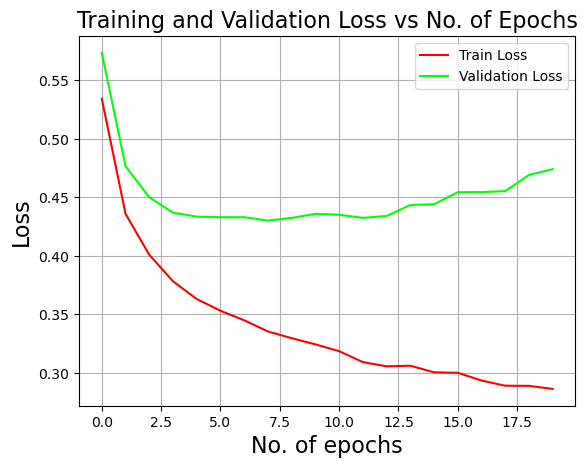

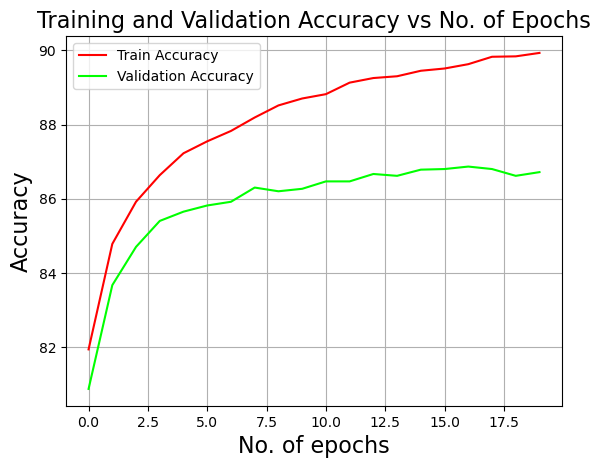

accuracy_train,▁▃▄▅▆▆▆▆▇▇▇▇▇▇██████
accuracy_validation,▁▄▅▆▇▇▇▇▇▇██████████
cost_validation,█▃▂▁▁▁▁▁▁▁▁▁▁▂▂▂▂▂▃▃
epochs,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss_train,█▅▄▄▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁
accuracy_train,89.93333
accuracy_validation,86.71667
cost_validation,0.47419
epochs,19
loss_train,0.28625


wandb: Agent Starting Run: xlzyecyi with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 20
wandb: 	lambd: 0
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_20_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_64_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.52  Train accuracy:    81.92 Val error:     0.55 Val accuracy:    81.22
 
 epoch:   2  Train error:      0.40  Train accuracy:    85.82 Val error:     0.46 Val accuracy:    85.00
 
 epoch:   4  Train error:      0.36  Train accuracy:    87.24 Val error:     0.43 Val accuracy:    85.82
 
 epoch:   6  Train error:      0.33  Train accuracy:    88.15 Val error:     0.43 Val accuracy:    86.35
 
 epoch:   8  Train error:      0.32  Train accuracy:    88.70 Val error:     0.43 Val accuracy:    86.53
 
 epoch:  10  Train error:      0.31  Train accuracy:    89.10 Val error:     0.44 Val accuracy:    86.78
 
 epoch:  12  Train error:      0.30  Train accuracy:    89.35 Val error:     0.44 Val accuracy:    87.03
 
 epoch:  14  Train error:      0.2

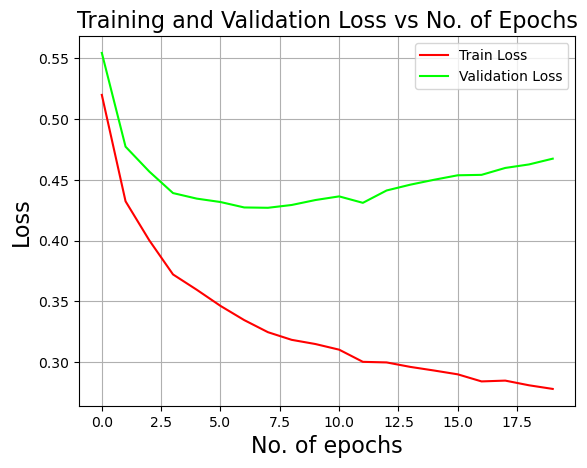

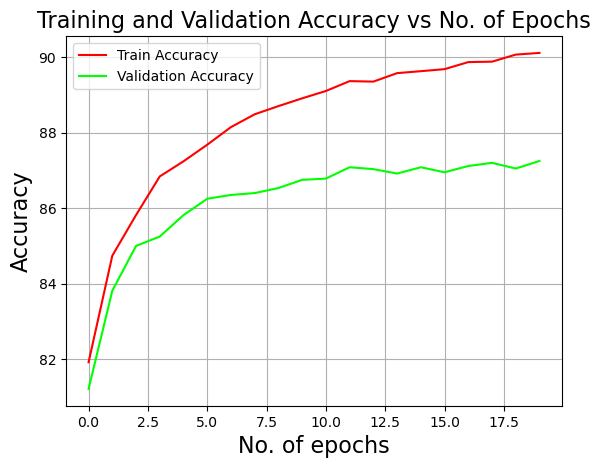

accuracy_train,▁▃▄▅▆▆▆▇▇▇▇▇▇███████
accuracy_validation,▁▄▅▆▆▇▇▇▇▇▇█████████
cost_validation,█▄▃▂▁▁▁▁▁▁▂▁▂▂▂▂▂▃▃▃
epochs,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss_train,█▅▅▄▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁
accuracy_train,90.10926
accuracy_validation,87.25
cost_validation,0.46737
epochs,19
loss_train,0.27808


wandb: Agent Starting Run: 3uzjygsc with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 40
wandb: 	lambd: 0
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization
502 response executing GraphQL.

<html><head>
<meta http-equiv="content-type" content="text/html;charset=utf-8">
<title>502 Server Error</title>
</head>
<body text=#000000 bgcolor=#ffffff>
<h1>Error: Server Error</h1>
<h2>The server encountered a temporary error and could not complete your request.<p>Please try again in 30 seconds.</h2>
<h2></h2>
</body></html>



lr_0.001_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_40_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_64_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.53  Train accuracy:    81.93 Val error:     0.57 Val accuracy:    80.87
 
 epoch:   4  Train error:      0.36  Train accuracy:    87.23 Val error:     0.43 Val accuracy:    85.65
 
 epoch:   8  Train error:      0.33  Train accuracy:    88.52 Val error:     0.43 Val accuracy:    86.20
 
 epoch:  12  Train error:      0.31  Train accuracy:    89.26 Val error:     0.43 Val accuracy:    86.67
 
 epoch:  16  Train error:      0.29  Train accuracy:    89.63 Val error:     0.45 Val accuracy:    86.87
 
 epoch:  20  Train error:      0.28  Train accuracy:    90.06 Val error:     0.48 Val accuracy:    86.97
 
 epoch:  24  Train error:      0.28  Train accuracy:    90.27 Val error:     0.50 Val accuracy:    86.93
 
 epoch:  28  Train error:      0.

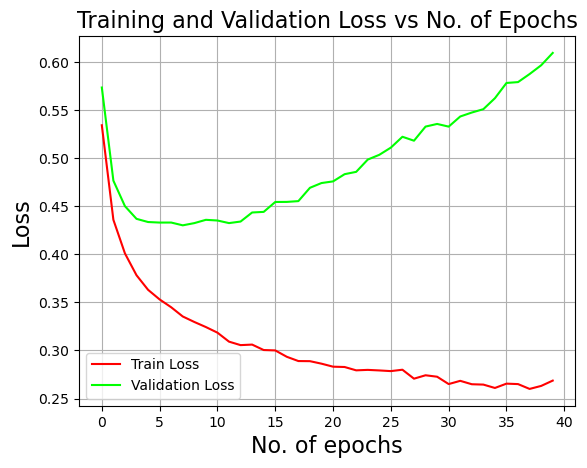

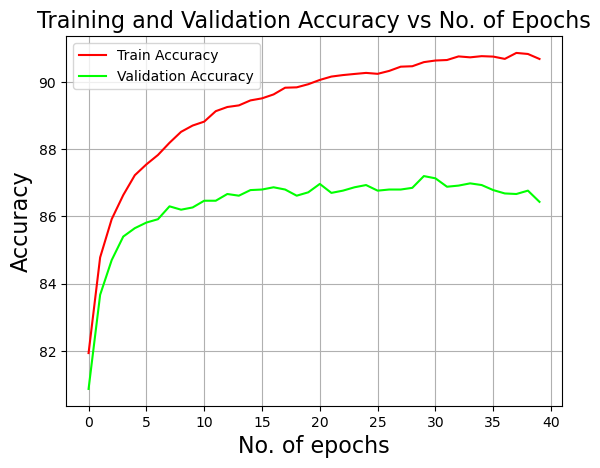

accuracy_train,▁▃▄▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇█████████████████
accuracy_validation,▁▄▅▆▆▆▇▇▇▇▇▇▇▇████▇▇█▇██████████████▇▇█▇
cost_validation,▇▃▂▁▁▁▁▁▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▅▄▅▅▅▅▆▆▆▇▇▇▇█
epochs,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
loss_train,█▅▅▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▁▂▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁
accuracy_train,90.68519
accuracy_validation,86.43333
cost_validation,0.60957
epochs,39
loss_train,0.26864


wandb: Agent Starting Run: uu1youjn with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 40
wandb: 	lambd: 0
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_40_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_64_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.52  Train accuracy:    81.92 Val error:     0.55 Val accuracy:    81.22
 
 epoch:   4  Train error:      0.36  Train accuracy:    87.24 Val error:     0.43 Val accuracy:    85.82
 
 epoch:   8  Train error:      0.32  Train accuracy:    88.70 Val error:     0.43 Val accuracy:    86.53
 
 epoch:  12  Train error:      0.30  Train accuracy:    89.35 Val error:     0.44 Val accuracy:    87.03
 
 epoch:  16  Train error:      0.28  Train accuracy:    89.87 Val error:     0.45 Val accuracy:    87.12
 
 epoch:  20  Train error:      0.28  Train accuracy:    90.05 Val error:     0.48 Val accuracy:    87.12
 
 epoch:  24  Train error:      0.27  Train accuracy:    90.32 Val error:     0.50 Val accuracy:    86.93
 
 epoch:  28  Train error:      0.2

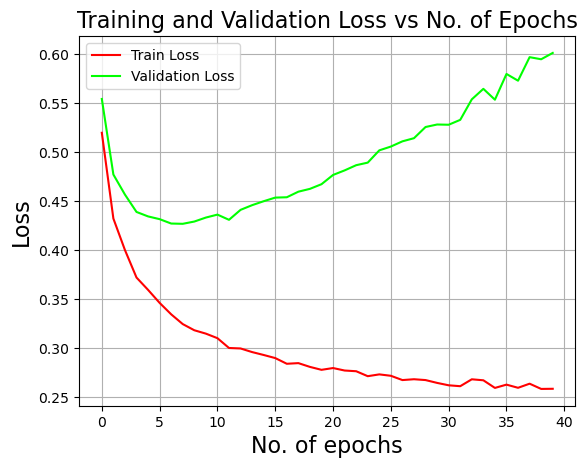

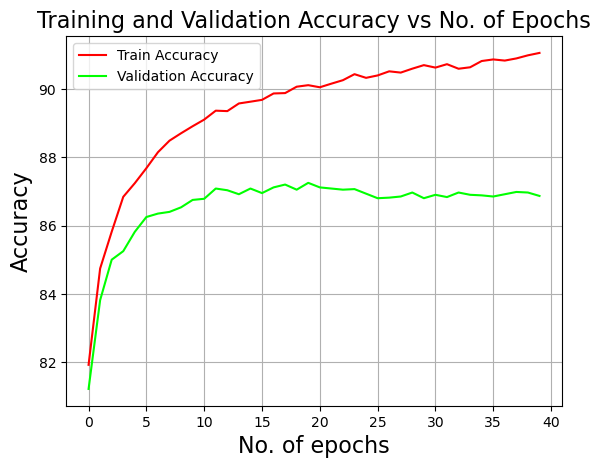

accuracy_train,▁▃▄▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇█▇▇██████████████
accuracy_validation,▁▄▅▆▆▇▇▇▇▇▇██████████████▇▇██▇██████████
cost_validation,▆▃▂▁▁▁▁▁▁▁▁▁▂▂▂▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▅▆▇▆▇▇███
epochs,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
loss_train,█▆▅▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
accuracy_train,91.0537
accuracy_validation,86.86667
cost_validation,0.60124
epochs,39
loss_train,0.25874


wandb: Sweep Agent: Waiting for job.
wandb: Sweep Agent: Exiting.


In [156]:
sweep_config = {
  "name": "Loss and Accuracy-Highest validation accuracy",
  "metric": {
      "name":"accuracy_validation",
      "goal": "maximize"
  },
  "method": "grid",
  "parameters": {
        "learning_rate": {
            "values": [0.001]
        },
        "activation": {
            "values": ["relu_function"]
        },
        "weight_init": {
            "values": ["random_initialization"]
        },
        "optimizer": {
            "values": ["nadam","adam"]
        },
        "batch_size": {
            "values": [8]
        },
        "epochs": {
            "values": [20,40]
        },
        "lambd": {
            "values": [0]
        },
        "neurons": {
            "values": [64]
        },
        "num_hidden_layers": {
            "values": [1]
        },
        "momentum": {
            "values": [0.9]
        },
        "beta": {
            "values": [0.9]
        },
        "beta1": {
            "values": [0.9]
        },
        "beta2": {
            "values": [0.99]
        },
        "loss": {
            "values": ['cross_entropy_function']
        }
    }
}

sweep_id = wandb.sweep(sweep_config, project="CS6910_DL_ASS1")
wandb.agent(sweep_id, neural_network)



Create sweep with ID: 6ju56rcs
Sweep URL: https://wandb.ai/ananthu2014/CS6910_DL_ASS1/sweeps/6ju56rcs


wandb: Agent Starting Run: 5qcl1qet with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 10
wandb: 	lambd: 0
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_10_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_64_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.53  Train accuracy:    81.93 Val error:     0.57 Val accuracy:    80.87
 
 epoch:   1  Train error:      0.44  Train accuracy:    84.78 Val error:     0.48 Val accuracy:    83.67
 
 epoch:   2  Train error:      0.40  Train accuracy:    85.92 Val error:     0.45 Val accuracy:    84.70
 
 epoch:   3  Train error:      0.38  Train accuracy:    86.64 Val error:     0.44 Val accuracy:    85.40
 
 epoch:   4  Train error:      0.36  Train accuracy:    87.23 Val error:     0.43 Val accuracy:    85.65
 
 epoch:   5  Train error:      0.35  Train accuracy:    87.55 Val error:     0.43 Val accuracy:    85.82
 
 epoch:   6  Train error:      0.34  Train accuracy:    87.83 Val error:     0.43 Val accuracy:    85.92
 
 epoch:   7  Train error:      0.

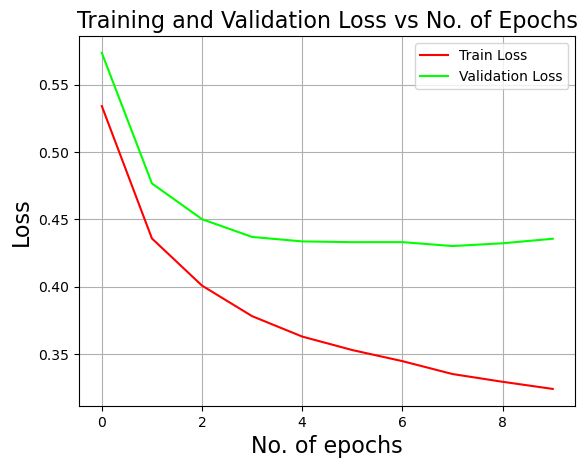

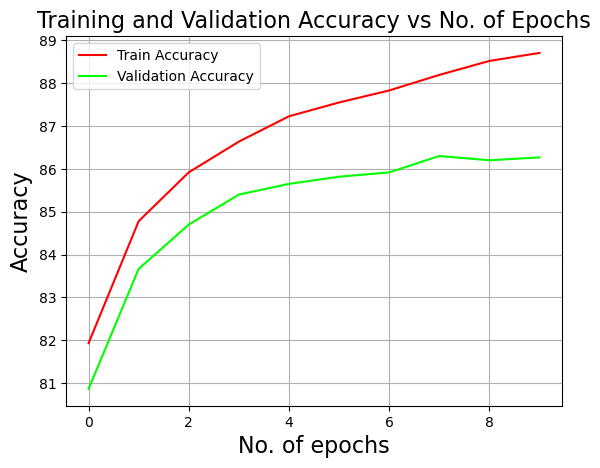

accuracy_train,▁▄▅▆▆▇▇▇██
accuracy_validation,▁▅▆▇▇▇████
cost_validation,█▃▂▁▁▁▁▁▁▁
epochs,▁▂▃▃▄▅▆▆▇█
loss_train,█▅▄▃▂▂▂▁▁▁
accuracy_train,88.7037
accuracy_validation,86.26667
cost_validation,0.43559
epochs,9
loss_train,0.3241


wandb: Agent Starting Run: sfh46zdr with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 10
wandb: 	lambd: 0
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_10_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_64_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.52  Train accuracy:    81.92 Val error:     0.55 Val accuracy:    81.22
 
 epoch:   1  Train error:      0.43  Train accuracy:    84.74 Val error:     0.48 Val accuracy:    83.82
 
 epoch:   2  Train error:      0.40  Train accuracy:    85.82 Val error:     0.46 Val accuracy:    85.00
 
 epoch:   3  Train error:      0.37  Train accuracy:    86.84 Val error:     0.44 Val accuracy:    85.25
 
 epoch:   4  Train error:      0.36  Train accuracy:    87.24 Val error:     0.43 Val accuracy:    85.82
 
 epoch:   5  Train error:      0.35  Train accuracy:    87.68 Val error:     0.43 Val accuracy:    86.25
 
 epoch:   6  Train error:      0.33  Train accuracy:    88.15 Val error:     0.43 Val accuracy:    86.35
 
 epoch:   7  Train error:      0.3

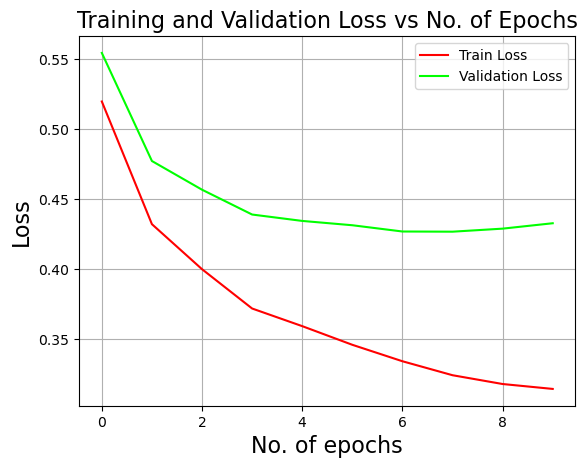

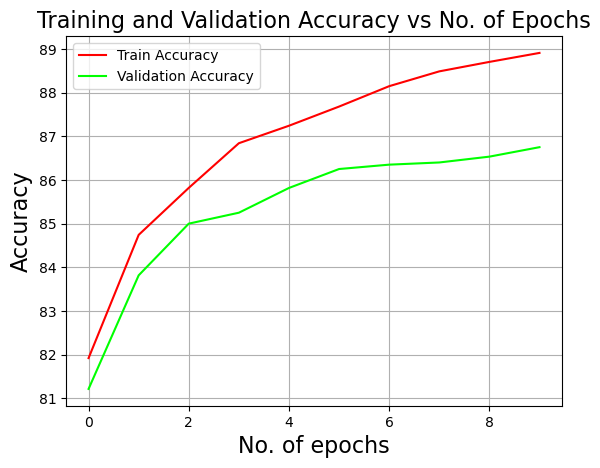

accuracy_train,▁▄▅▆▆▇▇███
accuracy_validation,▁▄▆▆▇▇▇███
cost_validation,█▄▃▂▁▁▁▁▁▁
epochs,▁▂▃▃▄▅▆▆▇█
loss_train,█▅▄▃▃▂▂▁▁▁
accuracy_train,88.90741
accuracy_validation,86.75
cost_validation,0.43286
epochs,9
loss_train,0.31475


wandb: Agent Starting Run: zzcl6mo1 with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 10
wandb: 	lambd: 0
wandb: 	learning_rate: 0.001
wandb: 	loss: mean_squared_error_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_10_num_hid_1_loss_mean_squared_error_function_batchsize_8_neur_64_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.81  Train accuracy:    57.93 Val error:     0.83 Val accuracy:    57.22
 
 epoch:   1  Train error:      1.01  Train accuracy:    48.80 Val error:     1.02 Val accuracy:    47.98
 
 epoch:   2  Train error:      1.23  Train accuracy:    37.71 Val error:     1.25 Val accuracy:    36.93
 
 epoch:   3  Train error:      0.72  Train accuracy:    63.70 Val error:     0.72 Val accuracy:    63.88
 
 epoch:   4  Train error:      0.56  Train accuracy:    71.50 Val error:     0.57 Val accuracy:    71.02
 
 epoch:   5  Train error:      1.15  Train accuracy:    42.07 Val error:     1.17 Val accuracy:    41.13
 
 epoch:   6  Train error:      1.01  Train accuracy:    49.27 Val error:     1.03 Val accuracy:    48.15
 
 epoch:   7  Train error:   

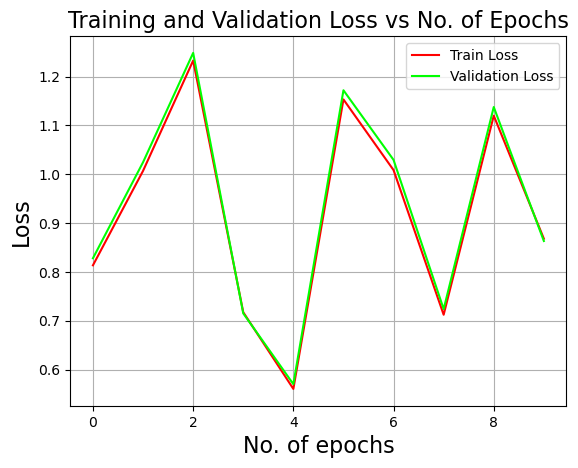

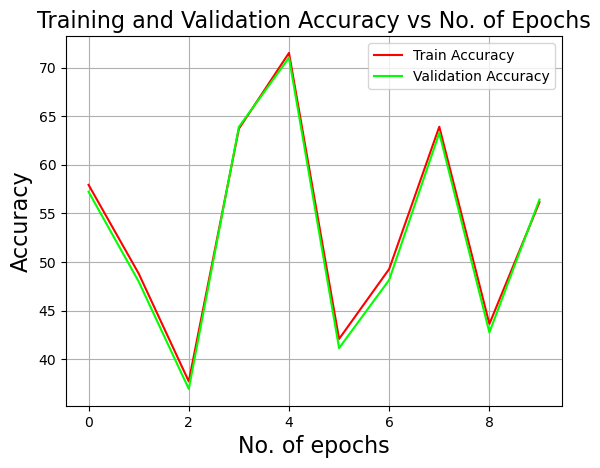

accuracy_train,▅▃▁▆█▂▃▆▂▅
accuracy_validation,▅▃▁▇█▂▃▆▂▅
cost_validation,▄▆█▂▁▇▆▃▇▄
epochs,▁▂▃▃▄▅▆▆▇█
loss_train,▄▆█▃▁▇▆▃▇▄
accuracy_train,56.1537
accuracy_validation,56.41667
cost_validation,0.8634
epochs,9
loss_train,0.86818


wandb: Agent Starting Run: 6fhpvuzo with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 10
wandb: 	lambd: 0
wandb: 	learning_rate: 0.001
wandb: 	loss: mean_squared_error_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_10_num_hid_1_loss_mean_squared_error_function_batchsize_8_neur_64_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.75  Train accuracy:    61.37 Val error:     0.75 Val accuracy:    61.22
 
 epoch:   1  Train error:      0.65  Train accuracy:    66.67 Val error:     0.67 Val accuracy:    66.05
 
 epoch:   2  Train error:      0.81  Train accuracy:    59.31 Val error:     0.82 Val accuracy:    58.78
 
 epoch:   3  Train error:      1.00  Train accuracy:    49.24 Val error:     1.01 Val accuracy:    48.55
 
 epoch:   4  Train error:      0.61  Train accuracy:    69.18 Val error:     0.62 Val accuracy:    68.95
 
 epoch:   5  Train error:      1.42  Train accuracy:    28.63 Val error:     1.44 Val accuracy:    27.93
 
 epoch:   6  Train error:      1.06  Train accuracy:    46.43 Val error:     1.08 Val accuracy:    45.30
 
 epoch:   7  Train error:    

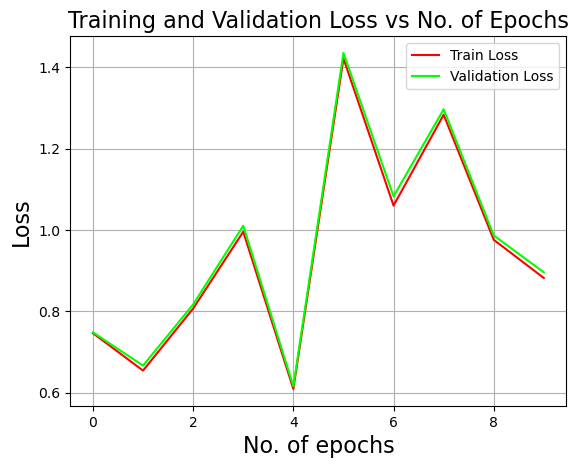

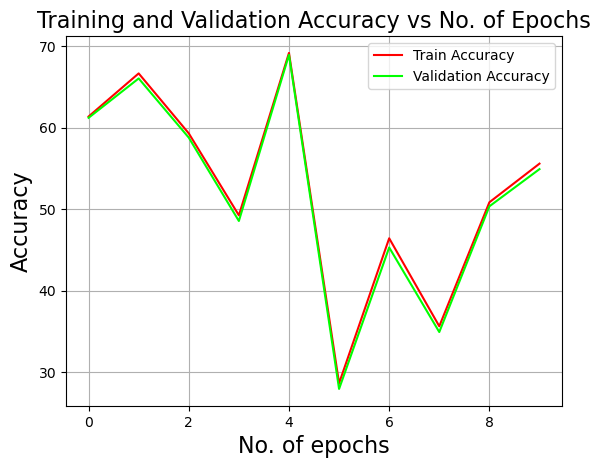

accuracy_train,▇█▆▅█▁▄▂▅▆
accuracy_validation,▇█▆▅█▁▄▂▅▆
cost_validation,▂▁▃▄▁█▅▇▄▃
epochs,▁▂▃▃▄▅▆▆▇█
loss_train,▂▁▃▄▁█▅▇▄▃
accuracy_train,55.59074
accuracy_validation,54.91667
cost_validation,0.8959
epochs,9
loss_train,0.88184


wandb: Agent Starting Run: 0rww8mfi with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 15
wandb: 	lambd: 0
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_15_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_64_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.53  Train accuracy:    81.93 Val error:     0.57 Val accuracy:    80.87
 
 epoch:   3  Train error:      0.38  Train accuracy:    86.64 Val error:     0.44 Val accuracy:    85.40
 
 epoch:   6  Train error:      0.34  Train accuracy:    87.83 Val error:     0.43 Val accuracy:    85.92
 
 epoch:   9  Train error:      0.32  Train accuracy:    88.70 Val error:     0.44 Val accuracy:    86.27
 
 epoch:  12  Train error:      0.31  Train accuracy:    89.26 Val error:     0.43 Val accuracy:    86.67


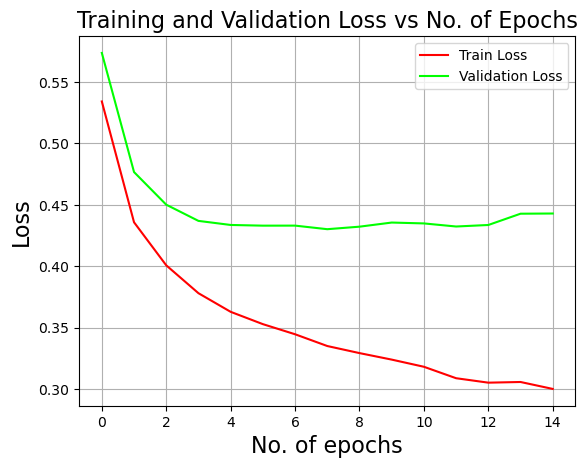

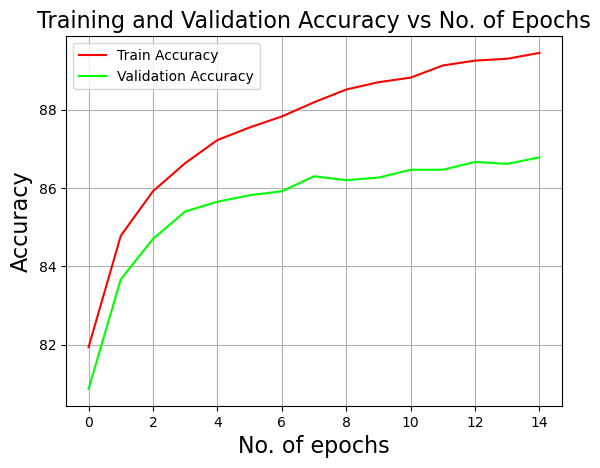

accuracy_train,▁▄▅▅▆▆▆▇▇▇▇████
accuracy_validation,▁▄▆▆▇▇▇▇▇▇█████
cost_validation,█▃▂▁▁▁▁▁▁▁▁▁▁▂▂
epochs,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
loss_train,█▅▄▃▃▃▂▂▂▂▂▁▁▁▁
accuracy_train,89.45185
accuracy_validation,86.78333
cost_validation,0.44295
epochs,14
loss_train,0.30025


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: r3f5pgqf with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 15
wandb: 	lambd: 0
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_15_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_64_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.52  Train accuracy:    81.92 Val error:     0.55 Val accuracy:    81.22
 
 epoch:   3  Train error:      0.37  Train accuracy:    86.84 Val error:     0.44 Val accuracy:    85.25
 
 epoch:   6  Train error:      0.33  Train accuracy:    88.15 Val error:     0.43 Val accuracy:    86.35
 
 epoch:   9  Train error:      0.31  Train accuracy:    88.91 Val error:     0.43 Val accuracy:    86.75
 
 epoch:  12  Train error:      0.30  Train accuracy:    89.35 Val error:     0.44 Val accuracy:    87.03


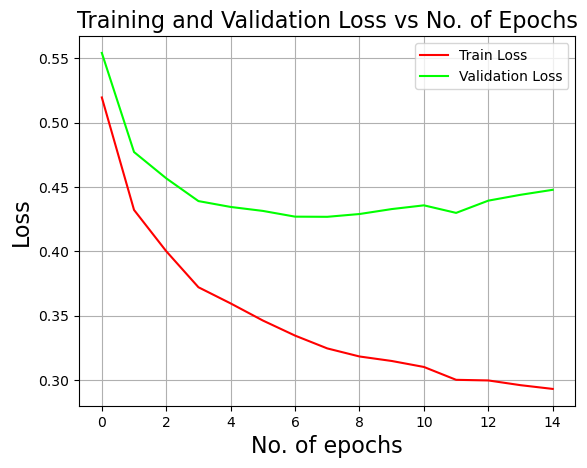

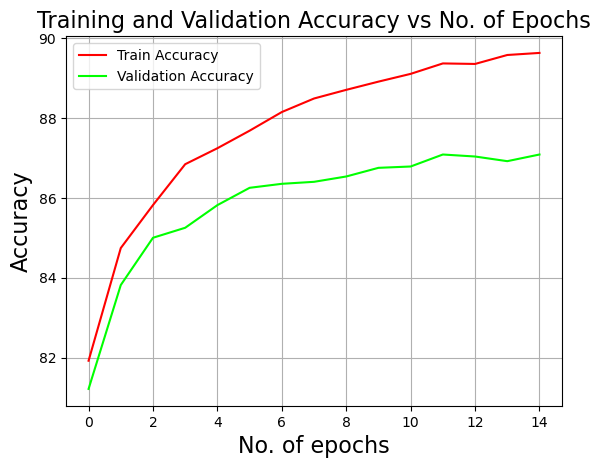

accuracy_train,▁▄▅▅▆▆▇▇▇▇█████
accuracy_validation,▁▄▆▆▆▇▇▇▇██████
cost_validation,█▄▃▂▁▁▁▁▁▁▁▁▂▂▂
epochs,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
loss_train,█▅▄▃▃▃▂▂▂▂▂▁▁▁▁
accuracy_train,89.62593
accuracy_validation,87.08333
cost_validation,0.44785
epochs,14
loss_train,0.29301


wandb: Agent Starting Run: vefv69ya with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 15
wandb: 	lambd: 0
wandb: 	learning_rate: 0.001
wandb: 	loss: mean_squared_error_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_15_num_hid_1_loss_mean_squared_error_function_batchsize_8_neur_64_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.81  Train accuracy:    57.93 Val error:     0.83 Val accuracy:    57.22
 
 epoch:   3  Train error:      0.72  Train accuracy:    63.70 Val error:     0.72 Val accuracy:    63.88
 
 epoch:   6  Train error:      1.01  Train accuracy:    49.27 Val error:     1.03 Val accuracy:    48.15
 
 epoch:   9  Train error:      0.87  Train accuracy:    56.15 Val error:     0.86 Val accuracy:    56.42
 
 epoch:  12  Train error:      0.72  Train accuracy:    63.98 Val error:     0.73 Val accuracy:    63.27


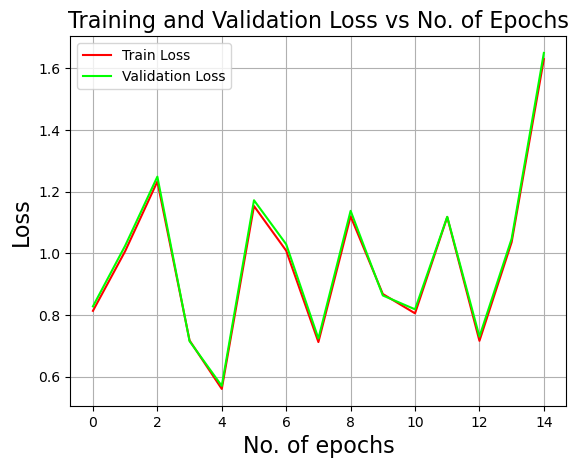

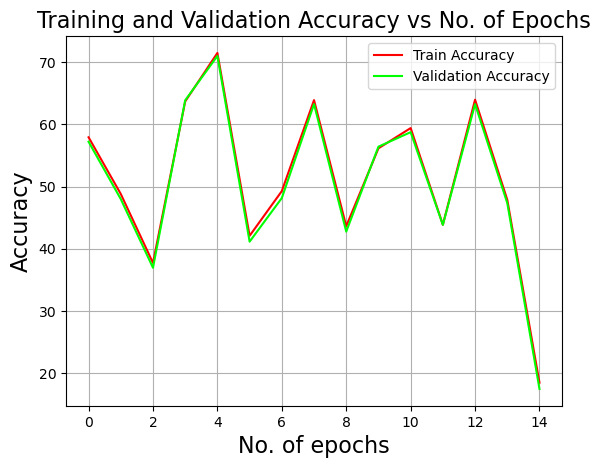

accuracy_train,▆▅▄▇█▄▅▇▄▆▆▄▇▅▁
accuracy_validation,▆▅▄▇█▄▅▇▄▆▆▄▇▅▁
cost_validation,▃▄▅▂▁▅▄▂▅▃▃▅▂▄█
epochs,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
loss_train,▃▄▅▂▁▅▄▂▅▃▃▅▂▄█
accuracy_train,18.43704
accuracy_validation,17.43333
cost_validation,1.6499
epochs,14
loss_train,1.6298


wandb: Agent Starting Run: 50gc3rd1 with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 15
wandb: 	lambd: 0
wandb: 	learning_rate: 0.001
wandb: 	loss: mean_squared_error_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_15_num_hid_1_loss_mean_squared_error_function_batchsize_8_neur_64_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.75  Train accuracy:    61.37 Val error:     0.75 Val accuracy:    61.22
 
 epoch:   3  Train error:      1.00  Train accuracy:    49.24 Val error:     1.01 Val accuracy:    48.55
 
 epoch:   6  Train error:      1.06  Train accuracy:    46.43 Val error:     1.08 Val accuracy:    45.30
 
 epoch:   9  Train error:      0.88  Train accuracy:    55.59 Val error:     0.90 Val accuracy:    54.92
 
 epoch:  12  Train error:      1.07  Train accuracy:    46.31 Val error:     1.09 Val accuracy:    45.15


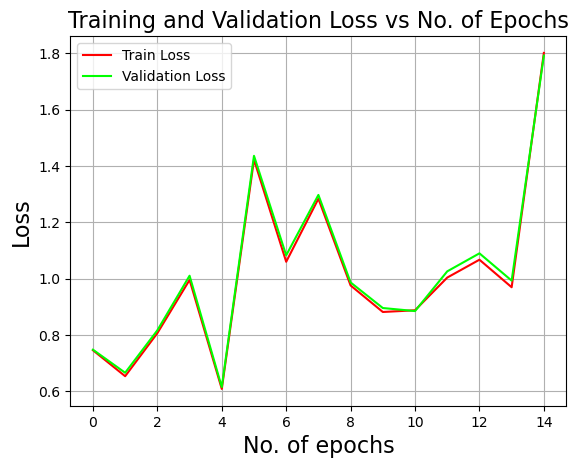

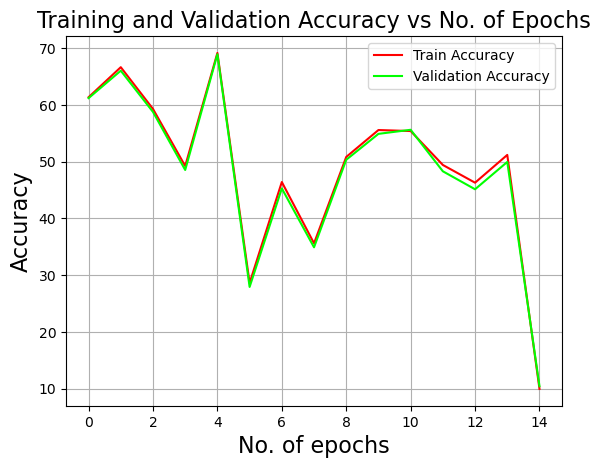

accuracy_train,▇█▇▆█▃▅▄▆▆▆▆▅▆▁
accuracy_validation,▇█▇▆█▃▅▄▆▆▆▆▅▆▁
cost_validation,▂▁▂▃▁▆▄▅▃▃▃▃▄▃█
epochs,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
loss_train,▂▁▂▃▁▆▄▅▃▃▃▃▄▃█
accuracy_train,9.95556
accuracy_validation,10.43333
cost_validation,1.79133
epochs,14
loss_train,1.80089


wandb: Agent Starting Run: 5jx63c2g with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 20
wandb: 	lambd: 0
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_20_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_64_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.53  Train accuracy:    81.93 Val error:     0.57 Val accuracy:    80.87
 
 epoch:   2  Train error:      0.40  Train accuracy:    85.92 Val error:     0.45 Val accuracy:    84.70
 
 epoch:   4  Train error:      0.36  Train accuracy:    87.23 Val error:     0.43 Val accuracy:    85.65
 
 epoch:   6  Train error:      0.34  Train accuracy:    87.83 Val error:     0.43 Val accuracy:    85.92
 
 epoch:   8  Train error:      0.33  Train accuracy:    88.52 Val error:     0.43 Val accuracy:    86.20
 
 epoch:  10  Train error:      0.32  Train accuracy:    88.82 Val error:     0.43 Val accuracy:    86.47
 
 epoch:  12  Train error:      0.31  Train accuracy:    89.26 Val error:     0.43 Val accuracy:    86.67
 
 epoch:  14  Train error:      0.

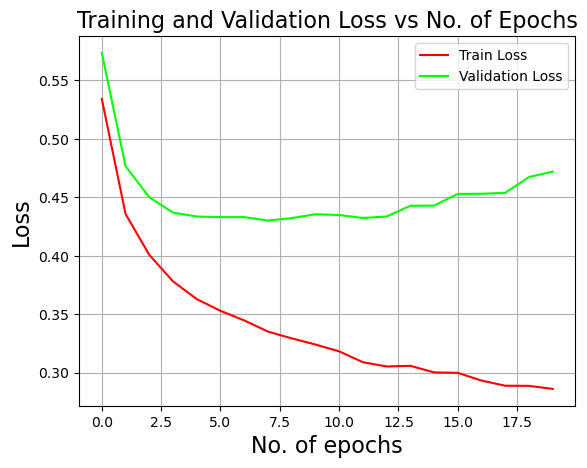

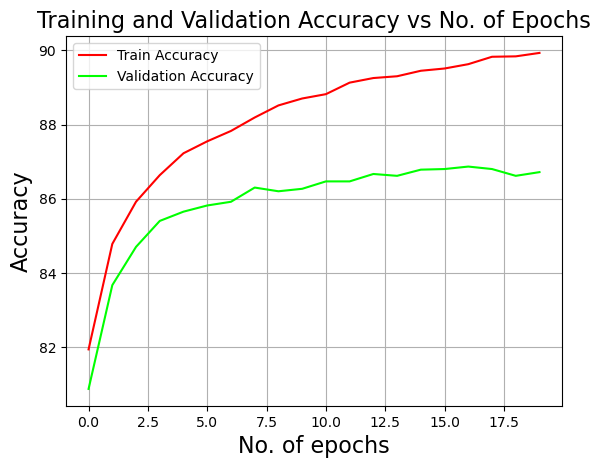

accuracy_train,▁▃▄▅▆▆▆▆▇▇▇▇▇▇██████
accuracy_validation,▁▄▅▆▇▇▇▇▇▇██████████
cost_validation,█▃▂▁▁▁▁▁▁▁▁▁▁▂▂▂▂▂▃▃
epochs,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss_train,█▅▄▄▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁
accuracy_train,89.93333
accuracy_validation,86.71667
cost_validation,0.47205
epochs,19
loss_train,0.28612


wandb: Agent Starting Run: 61hb77uz with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 20
wandb: 	lambd: 0
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_20_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_64_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.52  Train accuracy:    81.92 Val error:     0.55 Val accuracy:    81.22
 
 epoch:   2  Train error:      0.40  Train accuracy:    85.82 Val error:     0.46 Val accuracy:    85.00
 
 epoch:   4  Train error:      0.36  Train accuracy:    87.24 Val error:     0.43 Val accuracy:    85.82
 
 epoch:   6  Train error:      0.33  Train accuracy:    88.15 Val error:     0.43 Val accuracy:    86.35
 
 epoch:   8  Train error:      0.32  Train accuracy:    88.70 Val error:     0.43 Val accuracy:    86.53
 
 epoch:  10  Train error:      0.31  Train accuracy:    89.10 Val error:     0.44 Val accuracy:    86.78
 
 epoch:  12  Train error:      0.30  Train accuracy:    89.35 Val error:     0.44 Val accuracy:    87.03
 
 epoch:  14  Train error:      0.2

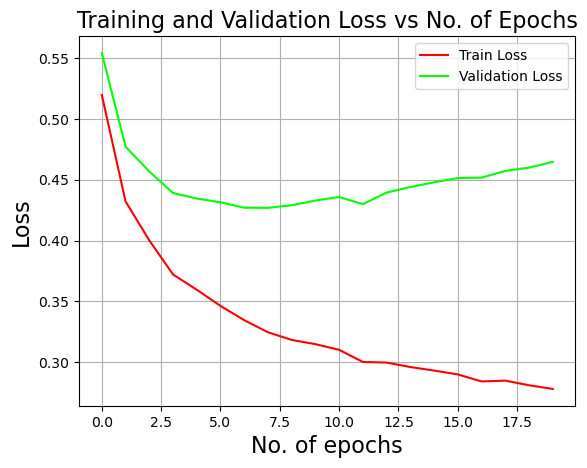

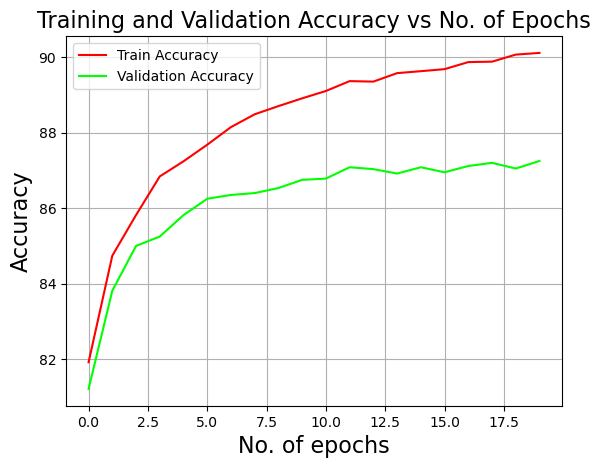

accuracy_train,▁▃▄▅▆▆▆▇▇▇▇▇▇███████
accuracy_validation,▁▄▅▆▆▇▇▇▇▇▇█████████
cost_validation,█▄▃▂▁▁▁▁▁▁▁▁▂▂▂▂▂▃▃▃
epochs,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss_train,█▅▅▄▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁
accuracy_train,90.10926
accuracy_validation,87.25
cost_validation,0.46465
epochs,19
loss_train,0.27792


wandb: Agent Starting Run: l2tqxnnc with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 20
wandb: 	lambd: 0
wandb: 	learning_rate: 0.001
wandb: 	loss: mean_squared_error_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_20_num_hid_1_loss_mean_squared_error_function_batchsize_8_neur_64_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.81  Train accuracy:    57.93 Val error:     0.83 Val accuracy:    57.22
 
 epoch:   2  Train error:      1.23  Train accuracy:    37.71 Val error:     1.25 Val accuracy:    36.93
 
 epoch:   4  Train error:      0.56  Train accuracy:    71.50 Val error:     0.57 Val accuracy:    71.02
 
 epoch:   6  Train error:      1.01  Train accuracy:    49.27 Val error:     1.03 Val accuracy:    48.15
 
 epoch:   8  Train error:      1.12  Train accuracy:    43.62 Val error:     1.14 Val accuracy:    42.75
 
 epoch:  10  Train error:      0.81  Train accuracy:    59.41 Val error:     0.82 Val accuracy:    58.75
 
 epoch:  12  Train error:      0.72  Train accuracy:    63.98 Val error:     0.73 Val accuracy:    63.27
 
 epoch:  14  Train error:   

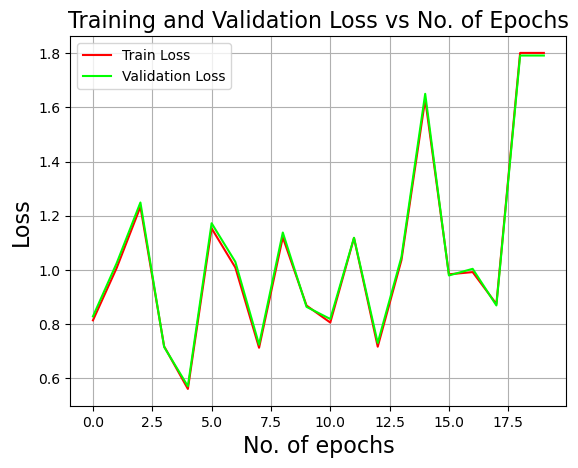

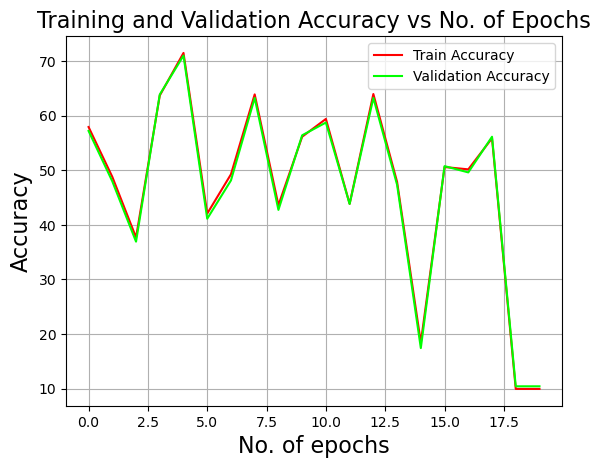

accuracy_train,▆▅▄▇█▅▅▇▅▆▇▅▇▅▂▆▆▆▁▁
accuracy_validation,▆▅▄▇█▅▅▇▅▆▇▅▇▅▂▆▆▆▁▁
cost_validation,▂▄▅▂▁▄▄▂▄▃▂▄▂▄▇▃▃▃██
epochs,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss_train,▂▄▅▂▁▄▄▂▄▃▂▄▂▄▇▃▃▃██
accuracy_train,9.9537
accuracy_validation,10.43333
cost_validation,1.79133
epochs,19
loss_train,1.80093


wandb: Agent Starting Run: bbcx710v with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 20
wandb: 	lambd: 0
wandb: 	learning_rate: 0.001
wandb: 	loss: mean_squared_error_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_20_num_hid_1_loss_mean_squared_error_function_batchsize_8_neur_64_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.75  Train accuracy:    61.37 Val error:     0.75 Val accuracy:    61.22
 
 epoch:   2  Train error:      0.81  Train accuracy:    59.31 Val error:     0.82 Val accuracy:    58.78
 
 epoch:   4  Train error:      0.61  Train accuracy:    69.18 Val error:     0.62 Val accuracy:    68.95
 
 epoch:   6  Train error:      1.06  Train accuracy:    46.43 Val error:     1.08 Val accuracy:    45.30
 
 epoch:   8  Train error:      0.98  Train accuracy:    50.85 Val error:     0.99 Val accuracy:    50.35
 
 epoch:  10  Train error:      0.89  Train accuracy:    55.41 Val error:     0.89 Val accuracy:    55.63
 
 epoch:  12  Train error:      1.07  Train accuracy:    46.31 Val error:     1.09 Val accuracy:    45.15
 
 epoch:  14  Train error:    

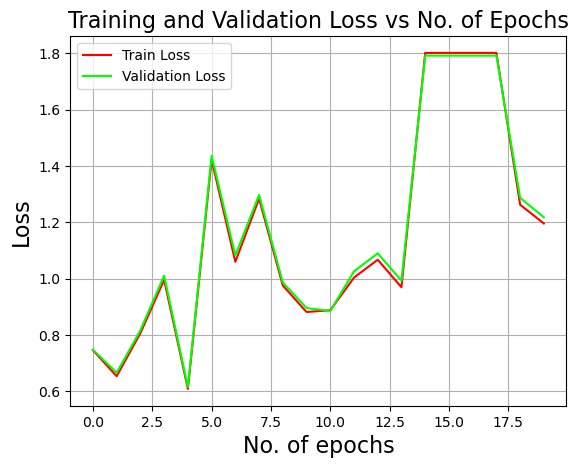

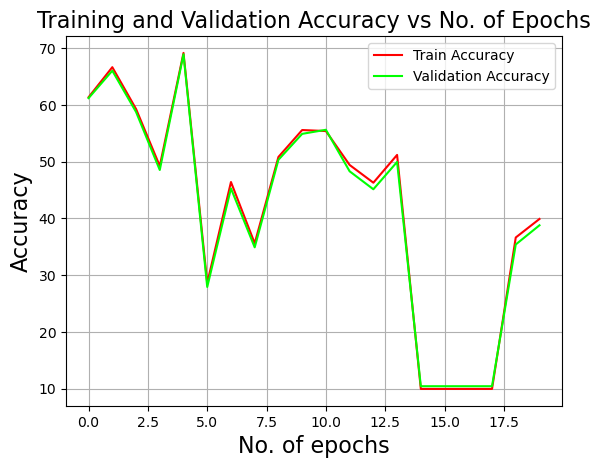

accuracy_train,▇█▇▆█▃▅▄▆▆▆▆▅▆▁▁▁▁▄▅
accuracy_validation,▇█▇▆█▃▅▄▆▆▆▆▅▆▁▁▁▁▄▄
cost_validation,▂▁▂▃▁▆▄▅▃▃▃▃▄▃████▅▅
epochs,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss_train,▂▁▂▃▁▆▄▅▃▃▃▃▄▃████▅▄
accuracy_train,39.91667
accuracy_validation,38.8
cost_validation,1.21777
epochs,19
loss_train,1.19587


wandb: Sweep Agent: Waiting for job.
wandb: Sweep Agent: Exiting.


In [163]:
sweep_config = {
  "name": "Loss and Accuracy-Highest validation accuracy",
  "metric": {
      "name":"accuracy_validation",
      "goal": "maximize"
  },
  "method": "grid",
  "parameters": {
        "learning_rate": {
            "values": [0.001]
        },
        "activation": {
            "values": ["relu_function"]
        },
        "weight_init": {
            "values": ["random_initialization"]
        },
        "optimizer": {
            "values": ["nadam","adam"]
        },
        "batch_size": {
            "values": [8]
        },
        "epochs": {
            "values": [10,15,20]
        },
        "lambd": {
            "values": [0]
        },
        "neurons": {
            "values": [64]
        },
        "num_hidden_layers": {
            "values": [1]
        },
        "momentum": {
            "values": [0.9]
        },
        "beta": {
            "values": [0.9]
        },
        "beta1": {
            "values": [0.9]
        },
        "beta2": {
            "values": [0.99]
        },
        "loss": {
            "values": ['cross_entropy_function','mean_squared_error_function']
        }
    }
}

sweep_id = wandb.sweep(sweep_config, project="CS6910_DL_ASS1")
wandb.agent(sweep_id, neural_network)



Create sweep with ID: tjgapdqh
Sweep URL: https://wandb.ai/ananthu2014/CS6910_DL_ASS1/sweeps/tjgapdqh


wandb: Agent Starting Run: zx3vgj9f with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 20
wandb: 	lambd: 0
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_20_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_64_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.52  Train accuracy:    81.92 Val error:     0.55 Val accuracy:    81.22
 
 epoch:   2  Train error:      0.40  Train accuracy:    85.82 Val error:     0.46 Val accuracy:    85.00
 
 epoch:   4  Train error:      0.36  Train accuracy:    87.24 Val error:     0.43 Val accuracy:    85.82
 
 epoch:   6  Train error:      0.33  Train accuracy:    88.15 Val error:     0.43 Val accuracy:    86.35
 
 epoch:   8  Train error:      0.32  Train accuracy:    88.70 Val error:     0.43 Val accuracy:    86.53
 
 epoch:  10  Train error:      0.31  Train accuracy:    89.10 Val error:     0.44 Val accuracy:    86.78
 
 epoch:  12  Train error:      0.30  Train accuracy:    89.35 Val error:     0.44 Val accuracy:    87.03
 
 epoch:  14  Train error:      0.2

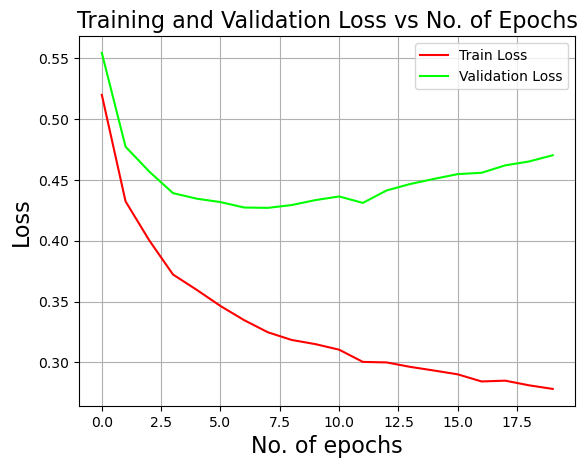

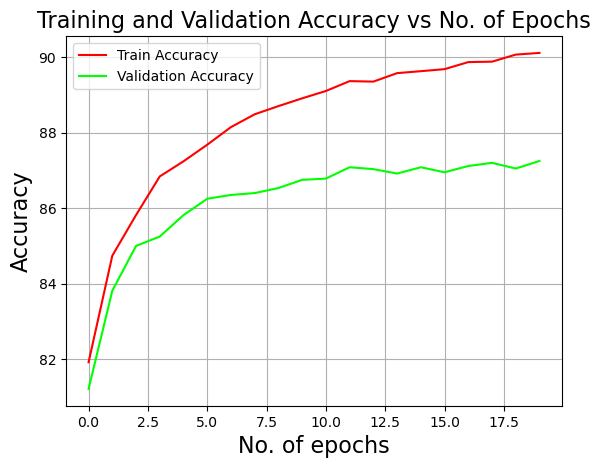

accuracy_train,▁▃▄▅▆▆▆▇▇▇▇▇▇███████
accuracy_validation,▁▄▅▆▆▇▇▇▇▇▇█████████
cost_validation,█▄▃▂▁▁▁▁▁▁▂▁▂▂▂▃▃▃▃▃
epochs,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss_train,█▅▅▄▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁
accuracy_train,90.10926
accuracy_validation,87.25
cost_validation,0.47021
epochs,19
loss_train,0.2782


wandb: Sweep Agent: Waiting for job.
wandb: Sweep Agent: Exiting.


In [23]:
'''HIGHEST ACCURACY'''
sweep_config = {
  "name": "Loss and Accuracy-Highest validation accuracy",
  "metric": {
      "name":"accuracy_validation",
      "goal": "maximize"
  },
  "method": "grid",
  "parameters": {
        "learning_rate": {
            "values": [0.001]
        },
        "activation": {
            "values": ["relu_function"]
        },
        "weight_init": {
            "values": ["random_initialization"]
        },
        "optimizer": {
            "values": ["adam"]
        },
        "batch_size": {
            "values": [8]
        },
        "epochs": {
            "values": [20]
        },
        "lambd": {
            "values": [0]
        },
        "neurons": {
            "values": [64]
        },
        "num_hidden_layers": {
            "values": [1]
        },
        "momentum": {
            "values": [0.9]
        },
        "beta": {
            "values": [0.9]
        },
        "beta1": {
            "values": [0.9]
        },
        "beta2": {
            "values": [0.99]
        },
        "loss": {
            "values": ['cross_entropy_function']
        }
    }
}

sweep_id = wandb.sweep(sweep_config, project="CS6910_DL_ASS1")
wandb.agent(sweep_id, neural_network)

neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.52  Train accuracy:    81.92 Val error:     0.55 Val accuracy:    81.22
 
 epoch:   2  Train error:      0.40  Train accuracy:    85.82 Val error:     0.46 Val accuracy:    85.00
 
 epoch:   4  Train error:      0.36  Train accuracy:    87.24 Val error:     0.43 Val accuracy:    85.82
 
 epoch:   6  Train error:      0.33  Train accuracy:    88.15 Val error:     0.43 Val accuracy:    86.35
 
 epoch:   8  Train error:      0.32  Train accuracy:    88.70 Val error:     0.43 Val accuracy:    86.53
 
 epoch:  10  Train error:      0.31  Train accuracy:    89.10 Val error:     0.44 Val accuracy:    86.78
 
 epoch:  12  Train error:      0.30  Train accuracy:    89.35 Val error:     0.44 Val accuracy:    87.03
 
 epoch:  14  Train error:      0.29  Train accuracy:    89.63 Val error:     0.45 Val accuracy:    87.08
 
 epoch:  16  Train error:      0.28  Train accuracy:    89.87 Val error:     0.46 Val accuracy:    87.12
 

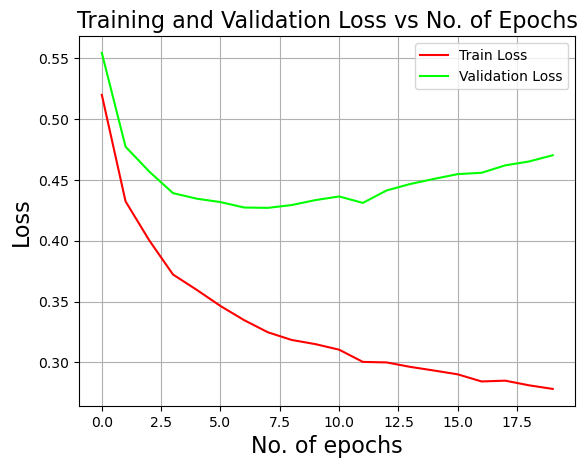

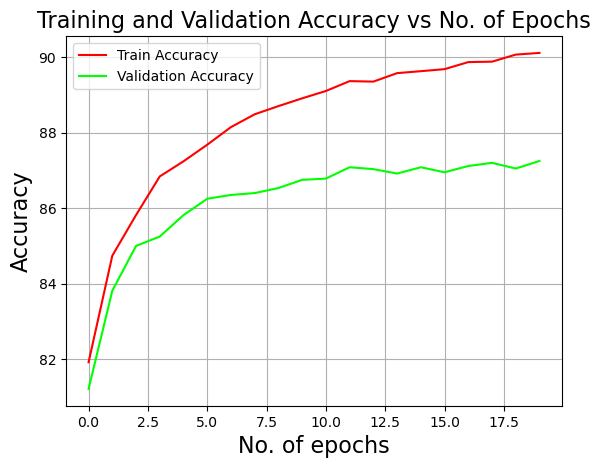

In [27]:
'''HIGHEST ACCURACY
EARNING RATE:0.001
EPOCHS:20
OPTIMIZER:Adam
REGULARIZATION PARAMETER:0.0001
ACTIVATION FUNCTION:RELu function
BETA1:0.9
BETA2:0.99
INITIALIZATION:RANDOM
LOSS FUNCTION:CROSS-ENTROPY
BATCH SIZE:8
NEURONS:64
HIDDEN LAYERS:1'''
w_max,b_max,J_train,J_val=neural_network(x_train,y_train,x_val,y_val,learning_rate=0.001,epochs=20,activation='relu_function',optimizer='adam',loss='cross_entropy_function',
                                        batch_size=8,num_hidden_layers=1,neurons=64,lambd=0,epsilon=0.00000001)

In [34]:
'''ACCURACY OF VALIDATION DATA FOR THE HIGHEST ACCURACY CASE'''
z,a=forward_propagation(x_val,w_max,b_max,activation='relu_function')
y_pred=a[-1]
y_pred=np.argmax(y_pred,axis=0)
Y=np.argmax(y_val,axis=0)
acc_val=np.mean(Y_pred==Y)*100
print(f'Highest accuracy of validation data is :{acc_val}')


Highest accuracy of validation data is :87.25


In [36]:
'''ACCURACY OF TEST DATA FOR THE HIGHEST ACCURACY CASE'''
z_test,a_test=forward_propagation(x_test,w_max,b_max,activation='relu_function')
y_pred_test=a_test[-1]
y_pred_test=np.argmax(y_pred_test,axis=0)
Y_test=np.argmax(y_test,axis=0)
acc_test=np.mean(y_pred_test==Y_test)*100
print(f'Highest accuracy of test data is :{acc_test}')


Highest accuracy of test data is :86.1


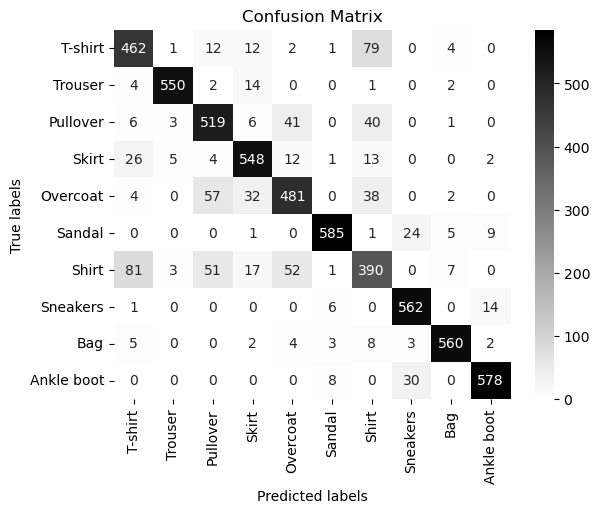

In [39]:
'''VALIDATION DATA'''

cm = confusion_matrix(Y, Y_pred)
fig, ax = plt.subplots()
sns.heatmap(cm, annot=True, cmap="binary", fmt='g', ax=ax,xticklabels=['T-shirt','Trouser','Pullover','Skirt',
    'Overcoat','Sandal','Shirt','Sneakers','Bag','Ankle boot'],yticklabels=['T-shirt','Trouser','Pullover','Skirt',
                                                        'Overcoat','Sandal','Shirt','Sneakers','Bag','Ankle boot'])
ax.set_xlabel("Predicted labels")
ax.set_ylabel("True labels")
ax.set_title("Confusion Matrix")

plt.show()


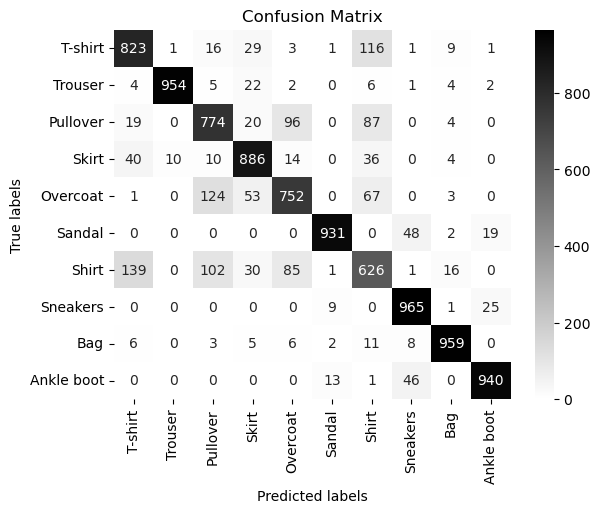

In [40]:
'''TEST DATA'''

cm = confusion_matrix(Y_test, y_pred_test)
fig, ax = plt.subplots()
sns.heatmap(cm, annot=True, cmap="binary", fmt='g', ax=ax,xticklabels=['T-shirt','Trouser','Pullover','Skirt',
    'Overcoat','Sandal','Shirt','Sneakers','Bag','Ankle boot'],yticklabels=['T-shirt','Trouser','Pullover','Skirt',
                                                        'Overcoat','Sandal','Shirt','Sneakers','Bag','Ankle boot'])
ax.set_xlabel("Predicted labels")
ax.set_ylabel("True labels")
ax.set_title("Confusion Matrix")

plt.show()

In [41]:
'''VALIDATION DATA'''
wandb.init(project="CS6910_DL_ASS1", name='CONFUSION MATRIX')

wandb.log({"conf_mat" : wandb.plot.confusion_matrix(probs=None,
                        y_true=Y, preds=Y_pred,class_names=['T-shirt','Trouser','Pullover','Skirt',
                                                        'Overcoat','Sandal','Shirt','Sneakers','Bag','Ankle boot'])})

wandb: WARNING Ignored wandb.init() arg project when running a sweep.


In [53]:
X_t=copy.deepcopy(x_train)
X_v=copy.deepcopy(x_val)

In [57]:
'''DATA AUGMENTATION BY ADDING NOISE TO TRAIN DATA'''
n,m=x_train.shape
p,q=x_val.shape
mean=0
variance=0.01
std=np.sqrt(variance)
k=np.random.normal(loc=mean,scale=std,size=(n,m))
e=np.random.normal(loc=mean,scale=std,size=(p,q))
x_train=x_train+k
x_train=np.clip(x_train,0,1)

Create sweep with ID: zwvkhbew
Sweep URL: https://wandb.ai/ananthu2014/CS6910_DL_ASS1/sweeps/zwvkhbew


wandb: Agent Starting Run: sng2yx6g with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 10
wandb: 	lambd: 0
wandb: 	learning_rate: 0.01
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 32
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.01_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_10_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_32_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 32, 10]
 
 epoch:   0  Train error:      0.56  Train accuracy:    81.09 Val error:     0.59 Val accuracy:    80.28
 
 epoch:   1  Train error:      0.60  Train accuracy:    80.74 Val error:     0.65 Val accuracy:    79.37
 
 epoch:   2  Train error:      0.53  Train accuracy:    82.78 Val error:     0.58 Val accuracy:    81.58
 
 epoch:   3  Train error:      0.50  Train accuracy:    83.19 Val error:     0.57 Val accuracy:    81.57
 
 epoch:   4  Train error:      0.49  Train accuracy:    83.62 Val error:     0.57 Val accuracy:    81.97
 
 epoch:   5  Train error:      0.47  Train accuracy:    84.08 Val error:     0.55 Val accuracy:    82.40
 
 epoch:   6  Train error:      0.49  Train accuracy:    83.94 Val error:     0.57 Val accuracy:    82.17
 
 epoch:   7  Train error:      0.5

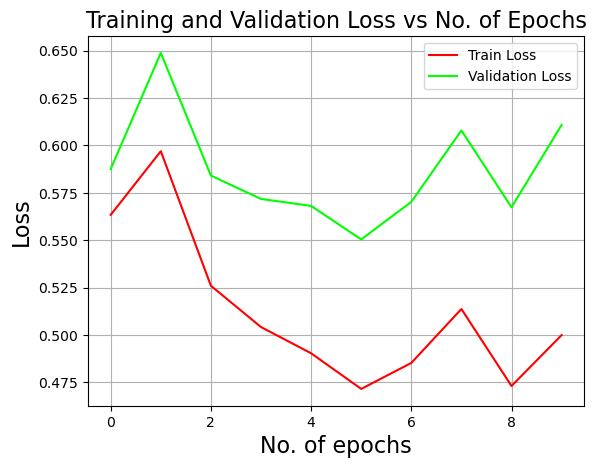

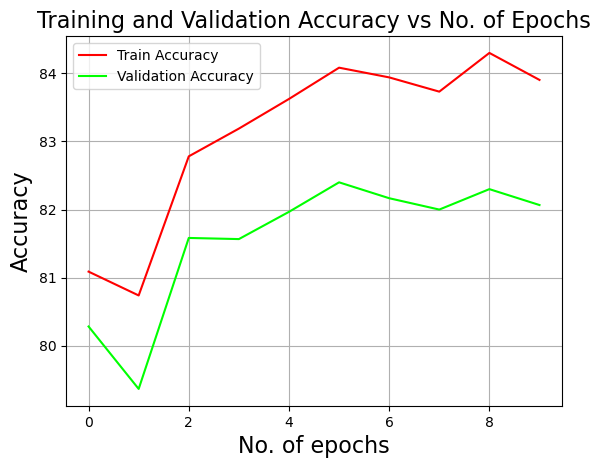

accuracy_train,▂▁▅▆▇█▇▇█▇
accuracy_validation,▃▁▆▆▇█▇▇█▇
cost_validation,▄█▃▃▂▁▂▅▂▅
epochs,▁▂▃▃▄▅▆▆▇█
loss_train,▆█▄▃▂▁▂▃▁▃
accuracy_train,83.9037
accuracy_validation,82.06667
cost_validation,0.61075
epochs,9
loss_train,0.49995


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 2udzzv51 with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 10
wandb: 	lambd: 0
wandb: 	learning_rate: 0.01
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 32
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.01_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_10_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_32_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 32, 10]
 
 epoch:   0  Train error:      0.60  Train accuracy:    79.41 Val error:     0.62 Val accuracy:    78.70
 
 epoch:   1  Train error:      0.52  Train accuracy:    82.63 Val error:     0.56 Val accuracy:    81.50
 
 epoch:   2  Train error:      0.52  Train accuracy:    82.89 Val error:     0.58 Val accuracy:    81.57
 
 epoch:   3  Train error:      0.48  Train accuracy:    83.84 Val error:     0.54 Val accuracy:    82.75
 
 epoch:   4  Train error:      0.48  Train accuracy:    83.33 Val error:     0.56 Val accuracy:    82.13
 
 epoch:   5  Train error:      0.47  Train accuracy:    84.13 Val error:     0.55 Val accuracy:    83.17
 
 epoch:   6  Train error:      0.47  Train accuracy:    83.87 Val error:     0.54 Val accuracy:    82.73
 
 epoch:   7  Train error:      0.47

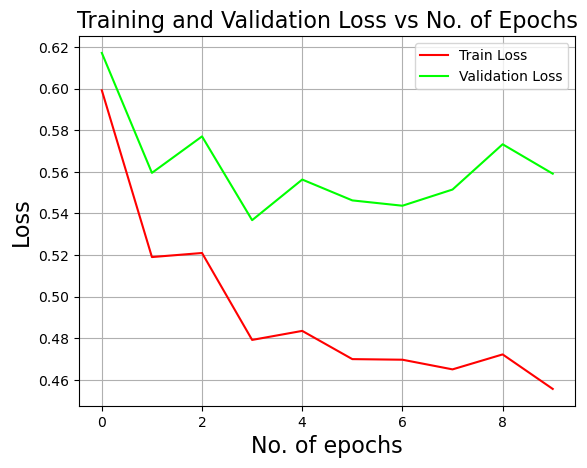

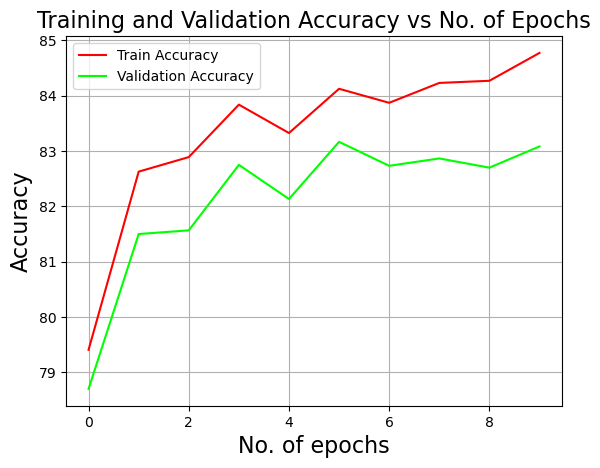

accuracy_train,▁▅▆▇▆▇▇▇▇█
accuracy_validation,▁▅▅▇▆█▇█▇█
cost_validation,█▃▅▁▃▂▂▂▄▃
epochs,▁▂▃▃▄▅▆▆▇█
loss_train,█▄▄▂▂▂▂▁▂▁
accuracy_train,84.77407
accuracy_validation,83.08333
cost_validation,0.5591
epochs,9
loss_train,0.45573


wandb: Agent Starting Run: jearvh7w with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 10
wandb: 	lambd: 0
wandb: 	learning_rate: 0.01
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.01_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_10_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_64_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.61  Train accuracy:    78.82 Val error:     0.65 Val accuracy:    78.65
 
 epoch:   1  Train error:      0.53  Train accuracy:    83.84 Val error:     0.59 Val accuracy:    82.83
 
 epoch:   2  Train error:      0.48  Train accuracy:    84.20 Val error:     0.55 Val accuracy:    83.40
 
 epoch:   3  Train error:      0.46  Train accuracy:    85.31 Val error:     0.53 Val accuracy:    84.23
 
 epoch:   4  Train error:      0.45  Train accuracy:    85.55 Val error:     0.54 Val accuracy:    84.22
 
 epoch:   5  Train error:      0.45  Train accuracy:    85.74 Val error:     0.54 Val accuracy:    84.22
 
 epoch:   6  Train error:      0.45  Train accuracy:    85.72 Val error:     0.56 Val accuracy:    84.22
 
 epoch:   7  Train error:      0.4

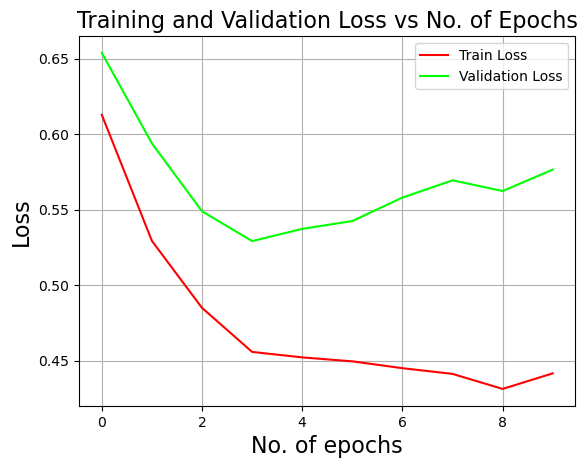

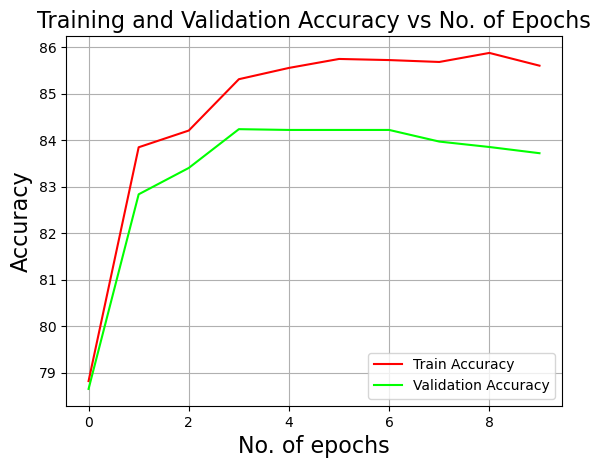

accuracy_train,▁▆▆▇██████
accuracy_validation,▁▆▇██████▇
cost_validation,█▅▂▁▁▂▃▃▃▄
epochs,▁▂▃▃▄▅▆▆▇█
loss_train,█▅▃▂▂▂▂▁▁▁
accuracy_train,85.59815
accuracy_validation,83.71667
cost_validation,0.57656
epochs,9
loss_train,0.44165


wandb: Agent Starting Run: d3xt6nm2 with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 10
wandb: 	lambd: 0
wandb: 	learning_rate: 0.01
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.01_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_10_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_64_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.63  Train accuracy:    79.03 Val error:     0.68 Val accuracy:    78.00
 
 epoch:   1  Train error:      0.54  Train accuracy:    81.78 Val error:     0.58 Val accuracy:    80.75
 
 epoch:   2  Train error:      0.50  Train accuracy:    82.72 Val error:     0.56 Val accuracy:    81.77
 
 epoch:   3  Train error:      0.51  Train accuracy:    82.13 Val error:     0.58 Val accuracy:    81.05
 
 epoch:   4  Train error:      0.51  Train accuracy:    82.59 Val error:     0.59 Val accuracy:    81.52
 
 epoch:   5  Train error:      0.49  Train accuracy:    83.34 Val error:     0.58 Val accuracy:    82.00
 
 epoch:   6  Train error:      0.48  Train accuracy:    83.69 Val error:     0.58 Val accuracy:    81.62
 
 epoch:   7  Train error:      0.46

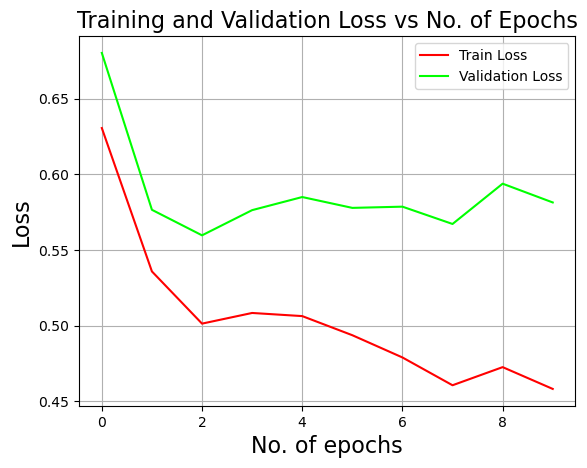

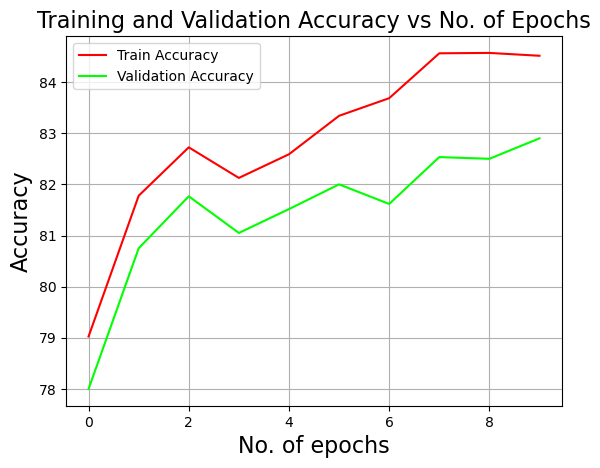

accuracy_train,▁▄▆▅▅▆▇███
accuracy_validation,▁▅▆▅▆▇▆▇▇█
cost_validation,█▂▁▂▂▂▂▁▃▂
epochs,▁▂▃▃▄▅▆▆▇█
loss_train,█▄▃▃▃▂▂▁▂▁
accuracy_train,84.51481
accuracy_validation,82.9
cost_validation,0.58147
epochs,9
loss_train,0.45823


wandb: Agent Starting Run: gao6awlp with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 10
wandb: 	lambd: 0
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 32
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_10_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_32_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 32, 10]
 
 epoch:   0  Train error:      0.56  Train accuracy:    80.93 Val error:     0.57 Val accuracy:    80.15
 
 epoch:   1  Train error:      0.48  Train accuracy:    83.42 Val error:     0.50 Val accuracy:    82.42
 
 epoch:   2  Train error:      0.45  Train accuracy:    84.37 Val error:     0.47 Val accuracy:    83.33
 
 epoch:   3  Train error:      0.43  Train accuracy:    84.99 Val error:     0.46 Val accuracy:    84.05
 
 epoch:   4  Train error:      0.42  Train accuracy:    85.37 Val error:     0.46 Val accuracy:    84.23
 
 epoch:   5  Train error:      0.40  Train accuracy:    85.78 Val error:     0.45 Val accuracy:    84.42
 
 epoch:   6  Train error:      0.40  Train accuracy:    85.96 Val error:     0.46 Val accuracy:    84.58
 
 epoch:   7  Train error:      0.

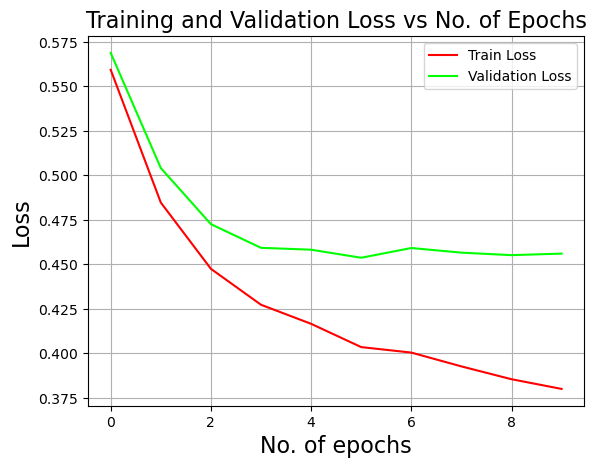

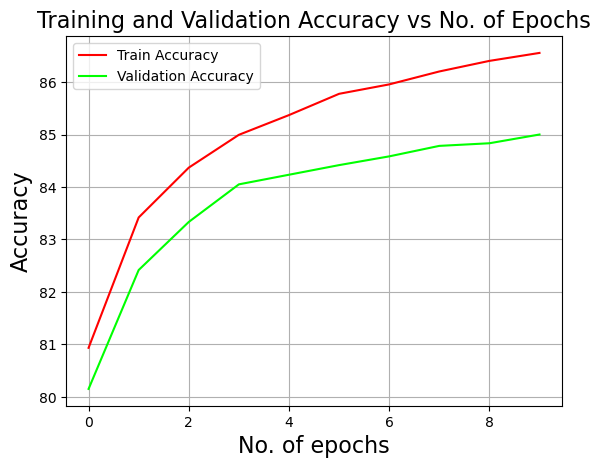

accuracy_train,▁▄▅▆▇▇▇███
accuracy_validation,▁▄▆▇▇▇▇███
cost_validation,█▄▂▁▁▁▁▁▁▁
epochs,▁▂▃▃▄▅▆▆▇█
loss_train,█▅▄▃▂▂▂▁▁▁
accuracy_train,86.55556
accuracy_validation,85.0
cost_validation,0.45608
epochs,9
loss_train,0.38008


wandb: Agent Starting Run: xitjqvvi with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 10
wandb: 	lambd: 0
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 32
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_10_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_32_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 32, 10]
 
 epoch:   0  Train error:      0.56  Train accuracy:    80.79 Val error:     0.58 Val accuracy:    79.92
 
 epoch:   1  Train error:      0.48  Train accuracy:    83.36 Val error:     0.50 Val accuracy:    82.50
 
 epoch:   2  Train error:      0.46  Train accuracy:    84.10 Val error:     0.48 Val accuracy:    83.28
 
 epoch:   3  Train error:      0.43  Train accuracy:    84.82 Val error:     0.47 Val accuracy:    83.78
 
 epoch:   4  Train error:      0.42  Train accuracy:    85.25 Val error:     0.46 Val accuracy:    83.87
 
 epoch:   5  Train error:      0.41  Train accuracy:    85.60 Val error:     0.46 Val accuracy:    83.92
 
 epoch:   6  Train error:      0.40  Train accuracy:    85.88 Val error:     0.46 Val accuracy:    84.40
 
 epoch:   7  Train error:      0.3

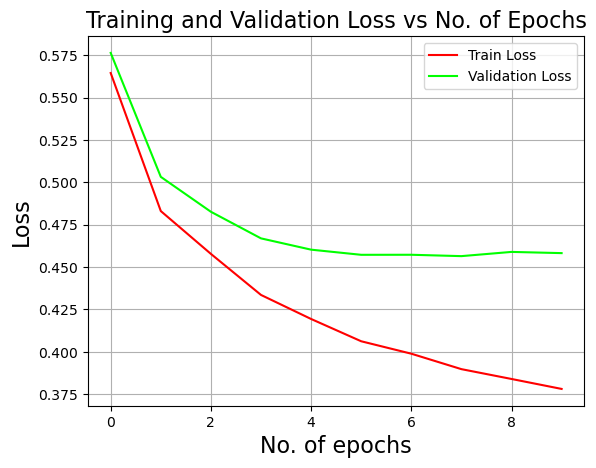

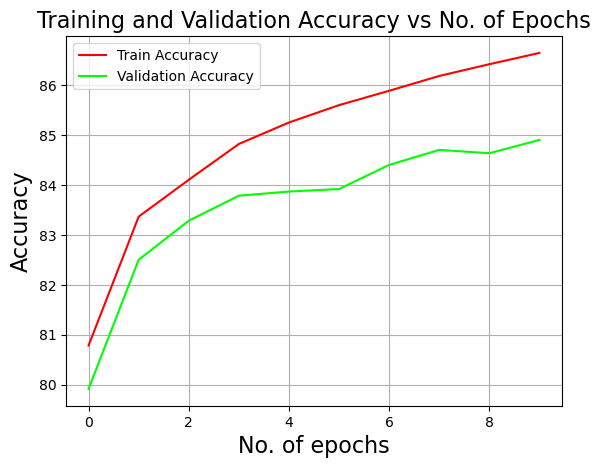

accuracy_train,▁▄▅▆▆▇▇▇██
accuracy_validation,▁▅▆▆▇▇▇███
cost_validation,█▄▃▂▁▁▁▁▁▁
epochs,▁▂▃▃▄▅▆▆▇█
loss_train,█▅▄▃▃▂▂▁▁▁
accuracy_train,86.64074
accuracy_validation,84.9
cost_validation,0.45826
epochs,9
loss_train,0.37812


wandb: Agent Starting Run: 1tfjg3v9 with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 10
wandb: 	lambd: 0
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_10_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_64_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.54  Train accuracy:    81.63 Val error:     0.57 Val accuracy:    80.57
 
 epoch:   1  Train error:      0.45  Train accuracy:    84.10 Val error:     0.50 Val accuracy:    83.17
 
 epoch:   2  Train error:      0.41  Train accuracy:    85.56 Val error:     0.47 Val accuracy:    84.45
 
 epoch:   3  Train error:      0.38  Train accuracy:    86.27 Val error:     0.46 Val accuracy:    85.25
 
 epoch:   4  Train error:      0.37  Train accuracy:    86.97 Val error:     0.45 Val accuracy:    85.53
 
 epoch:   5  Train error:      0.36  Train accuracy:    87.42 Val error:     0.45 Val accuracy:    85.87
 
 epoch:   6  Train error:      0.34  Train accuracy:    87.77 Val error:     0.44 Val accuracy:    85.97
 
 epoch:   7  Train error:      0.

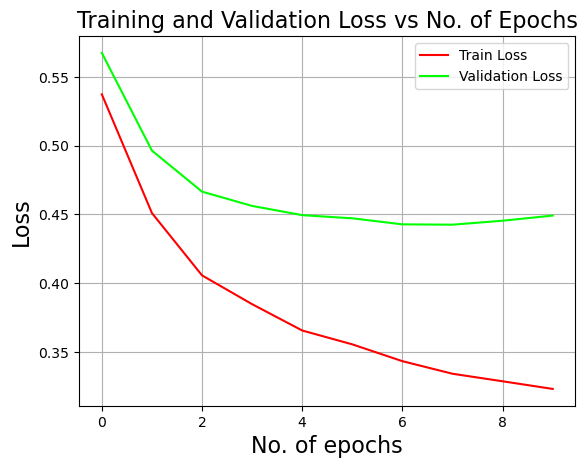

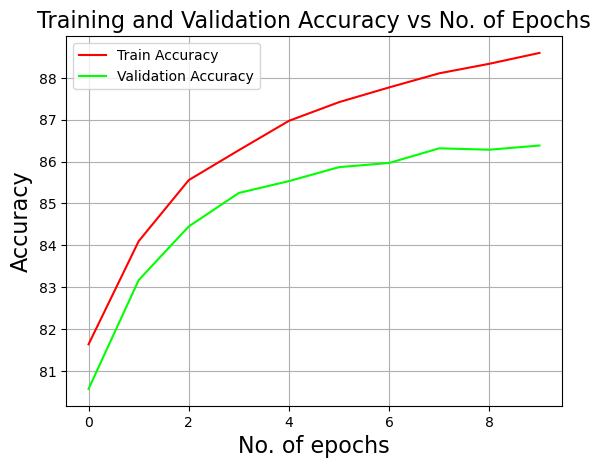

accuracy_train,▁▃▅▆▆▇▇███
accuracy_validation,▁▄▆▇▇▇▇███
cost_validation,█▄▂▂▁▁▁▁▁▁
epochs,▁▂▃▃▄▅▆▆▇█
loss_train,█▅▄▃▂▂▂▁▁▁
accuracy_train,88.5963
accuracy_validation,86.38333
cost_validation,0.4492
epochs,9
loss_train,0.3232


wandb: Agent Starting Run: fxaofzsd with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 10
wandb: 	lambd: 0
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_10_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_64_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.55  Train accuracy:    81.24 Val error:     0.59 Val accuracy:    79.80
 
 epoch:   1  Train error:      0.44  Train accuracy:    84.31 Val error:     0.49 Val accuracy:    82.78
 
 epoch:   2  Train error:      0.40  Train accuracy:    85.55 Val error:     0.46 Val accuracy:    84.15
 
 epoch:   3  Train error:      0.38  Train accuracy:    86.21 Val error:     0.45 Val accuracy:    84.62
 
 epoch:   4  Train error:      0.37  Train accuracy:    86.84 Val error:     0.44 Val accuracy:    84.93
 
 epoch:   5  Train error:      0.35  Train accuracy:    87.47 Val error:     0.43 Val accuracy:    85.12
 
 epoch:   6  Train error:      0.34  Train accuracy:    87.79 Val error:     0.43 Val accuracy:    85.35
 
 epoch:   7  Train error:      0.3

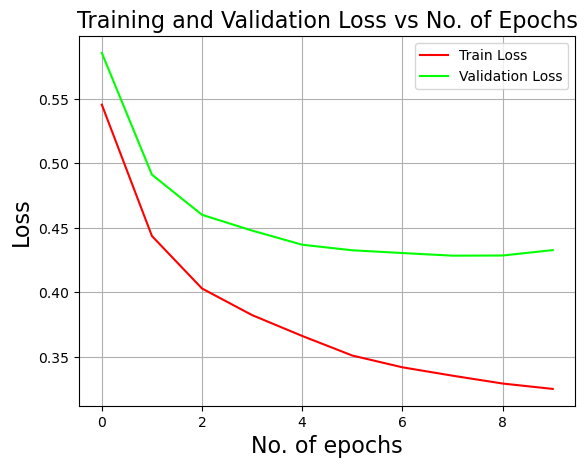

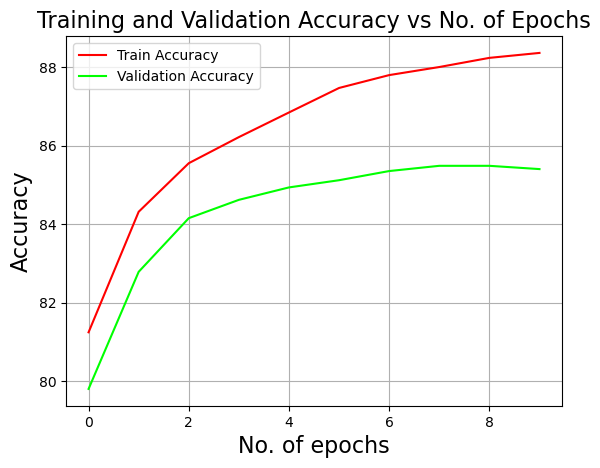

accuracy_train,▁▄▅▆▇▇▇███
accuracy_validation,▁▅▆▇▇█████
cost_validation,█▄▂▂▁▁▁▁▁▁
epochs,▁▂▃▃▄▅▆▆▇█
loss_train,█▅▃▃▂▂▂▁▁▁
accuracy_train,88.35926
accuracy_validation,85.4
cost_validation,0.43283
epochs,9
loss_train,0.32523


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: rmad6hk3 with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 10
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.01
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 32
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.01_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_10_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_32_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 32, 10]
 
 epoch:   0  Train error:      0.61  Train accuracy:    78.18 Val error:     0.62 Val accuracy:    76.88
 
 epoch:   1  Train error:      0.57  Train accuracy:    79.33 Val error:     0.60 Val accuracy:    77.73
 
 epoch:   2  Train error:      0.54  Train accuracy:    80.53 Val error:     0.57 Val accuracy:    79.02
 
 epoch:   3  Train error:      0.52  Train accuracy:    81.43 Val error:     0.55 Val accuracy:    79.73
 
 epoch:   4  Train error:      0.50  Train accuracy:    82.18 Val error:     0.52 Val accuracy:    80.82
 
 epoch:   5  Train error:      0.47  Train accuracy:    83.03 Val error:     0.50 Val accuracy:    81.80
 
 epoch:   6  Train error:      0.49  Train accuracy:    82.43 Val error:     0.52 Val accuracy:    80.83
 
 epoch:   7  Train error:     

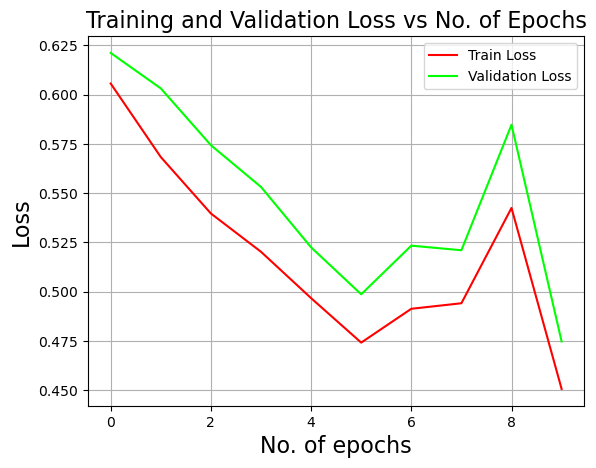

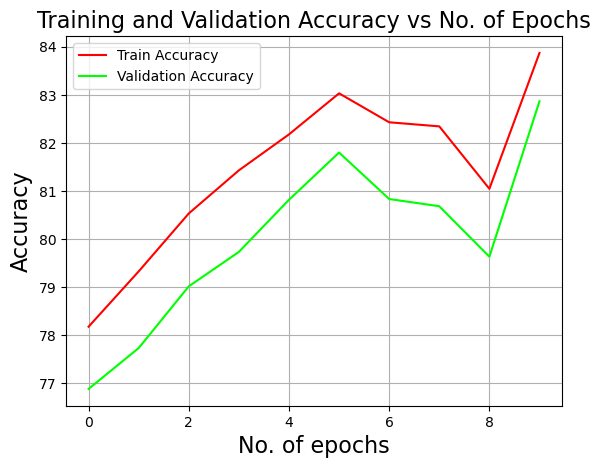

accuracy_train,▁▂▄▅▆▇▆▆▅█
accuracy_validation,▁▂▃▄▆▇▆▅▄█
cost_validation,█▇▆▅▃▂▃▃▆▁
epochs,▁▂▃▃▄▅▆▆▇█
loss_train,█▆▅▄▃▂▃▃▅▁
accuracy_train,83.87222
accuracy_validation,82.86667
cost_validation,0.47478
epochs,9
loss_train,0.45069


wandb: Agent Starting Run: mhyo0c74 with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 10
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.01
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 32
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.01_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_10_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_32_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 32, 10]
 
 epoch:   0  Train error:      0.68  Train accuracy:    75.91 Val error:     0.72 Val accuracy:    74.60
 
 epoch:   1  Train error:      0.65  Train accuracy:    77.64 Val error:     0.69 Val accuracy:    76.52
 
 epoch:   2  Train error:      0.64  Train accuracy:    77.56 Val error:     0.68 Val accuracy:    75.88
 
 epoch:   3  Train error:      0.56  Train accuracy:    79.60 Val error:     0.60 Val accuracy:    78.30
 
 epoch:   4  Train error:      0.60  Train accuracy:    78.61 Val error:     0.64 Val accuracy:    77.48
 
 epoch:   5  Train error:      0.52  Train accuracy:    81.44 Val error:     0.55 Val accuracy:    80.98
 
 epoch:   6  Train error:      0.57  Train accuracy:    79.37 Val error:     0.60 Val accuracy:    78.62
 
 epoch:   7  Train error:      

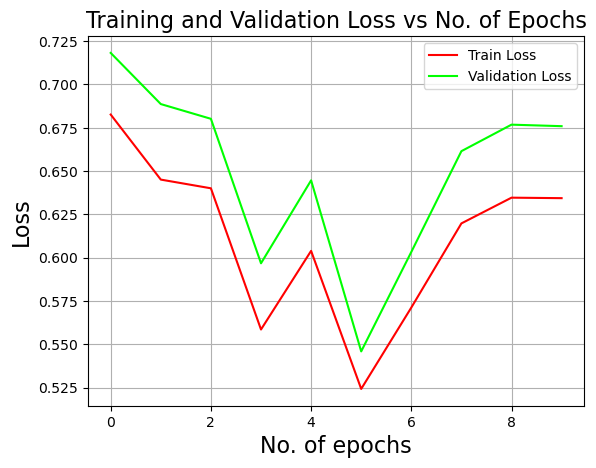

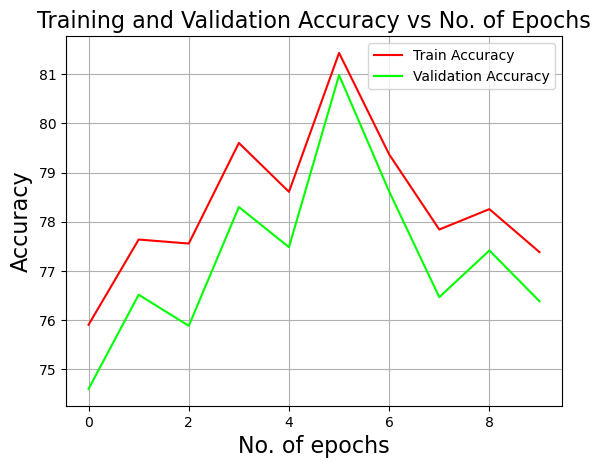

accuracy_train,▁▃▃▆▄█▅▃▄▃
accuracy_validation,▁▃▂▅▄█▅▃▄▃
cost_validation,█▇▆▃▅▁▃▆▆▆
epochs,▁▂▃▃▄▅▆▆▇█
loss_train,█▆▆▃▅▁▃▅▆▆
accuracy_train,77.38333
accuracy_validation,76.38333
cost_validation,0.67594
epochs,9
loss_train,0.6344


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: tckzaod2 with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 10
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.01
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.01_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_10_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_64_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.69  Train accuracy:    75.71 Val error:     0.72 Val accuracy:    74.02
 
 epoch:   1  Train error:      0.60  Train accuracy:    78.40 Val error:     0.64 Val accuracy:    77.13
 
 epoch:   2  Train error:      0.54  Train accuracy:    80.19 Val error:     0.56 Val accuracy:    79.17
 
 epoch:   3  Train error:      0.55  Train accuracy:    80.01 Val error:     0.58 Val accuracy:    78.60
 
 epoch:   4  Train error:      0.58  Train accuracy:    78.91 Val error:     0.61 Val accuracy:    77.85
 
 epoch:   5  Train error:      0.55  Train accuracy:    79.87 Val error:     0.59 Val accuracy:    78.57
 
 epoch:   6  Train error:      0.54  Train accuracy:    80.64 Val error:     0.57 Val accuracy:    79.72
 
 epoch:   7  Train error:     

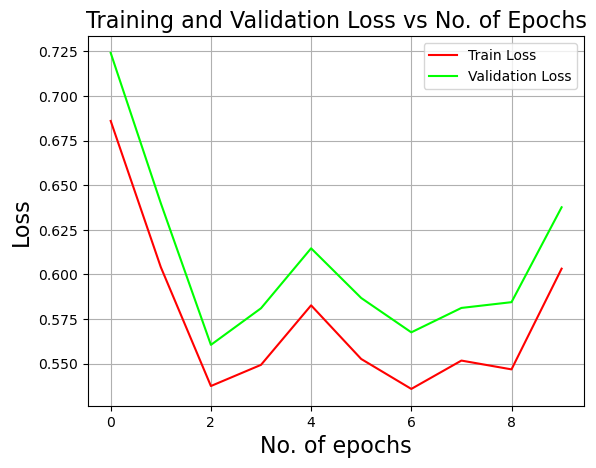

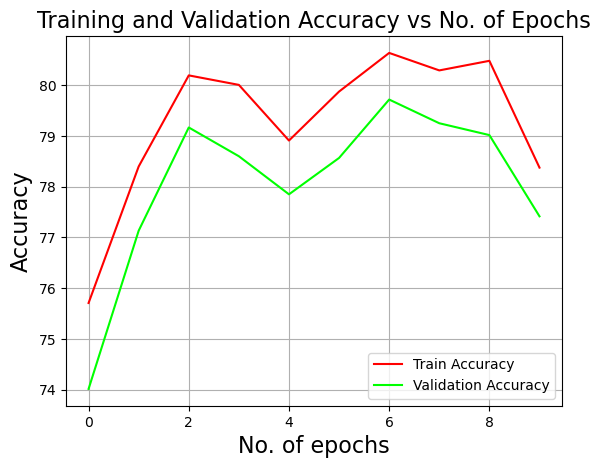

accuracy_train,▁▅▇▇▆▇███▅
accuracy_validation,▁▅▇▇▆▇█▇▇▅
cost_validation,█▄▁▂▃▂▁▂▂▄
epochs,▁▂▃▃▄▅▆▆▇█
loss_train,█▄▁▂▃▂▁▂▂▄
accuracy_train,78.37593
accuracy_validation,77.41667
cost_validation,0.63766
epochs,9
loss_train,0.60324


wandb: Agent Starting Run: uzw9n8om with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 10
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.01
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.01_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_10_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_64_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.65  Train accuracy:    77.21 Val error:     0.68 Val accuracy:    75.80
 
 epoch:   1  Train error:      0.61  Train accuracy:    78.49 Val error:     0.65 Val accuracy:    77.10
 
 epoch:   2  Train error:      0.59  Train accuracy:    79.04 Val error:     0.63 Val accuracy:    77.83
 
 epoch:   3  Train error:      0.49  Train accuracy:    82.69 Val error:     0.51 Val accuracy:    82.27
 
 epoch:   4  Train error:      0.55  Train accuracy:    80.07 Val error:     0.59 Val accuracy:    79.23
 
 epoch:   5  Train error:      0.56  Train accuracy:    80.35 Val error:     0.58 Val accuracy:    79.28
 
 epoch:   6  Train error:      0.50  Train accuracy:    82.26 Val error:     0.52 Val accuracy:    81.43
 
 epoch:   7  Train error:      

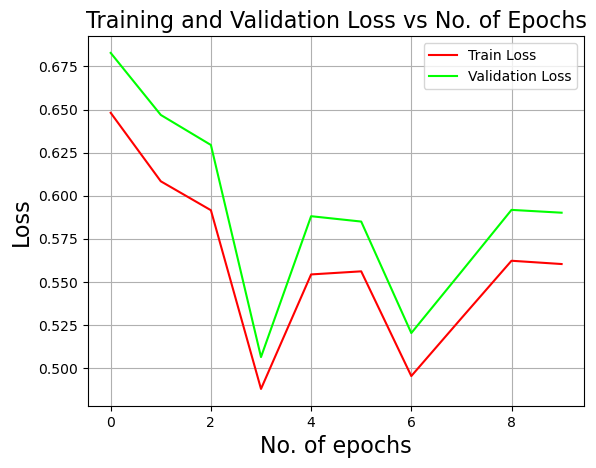

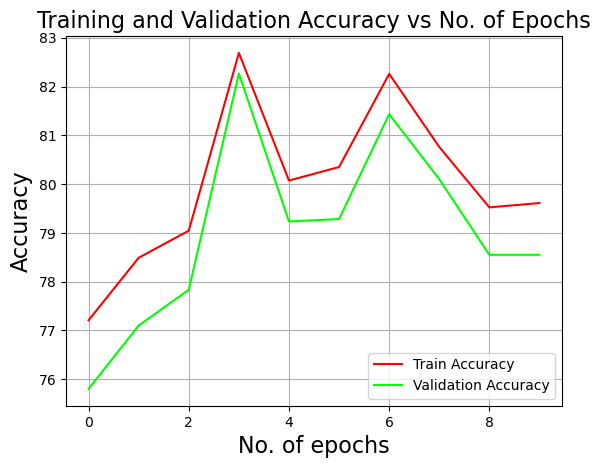

accuracy_train,▁▃▃█▅▅▇▆▄▄
accuracy_validation,▁▂▃█▅▅▇▆▄▄
cost_validation,█▇▆▁▄▄▂▃▄▄
epochs,▁▂▃▃▄▅▆▆▇█
loss_train,█▆▆▁▄▄▁▃▄▄
accuracy_train,79.61111
accuracy_validation,78.55
cost_validation,0.59012
epochs,9
loss_train,0.56032


wandb: Agent Starting Run: 0rcex7vv with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 10
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 32
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_10_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_32_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 32, 10]
 
 epoch:   0  Train error:      0.49  Train accuracy:    82.55 Val error:     0.51 Val accuracy:    81.30
 
 epoch:   1  Train error:      0.42  Train accuracy:    84.94 Val error:     0.45 Val accuracy:    83.77
 
 epoch:   2  Train error:      0.39  Train accuracy:    85.95 Val error:     0.42 Val accuracy:    84.60
 
 epoch:   3  Train error:      0.37  Train accuracy:    86.58 Val error:     0.41 Val accuracy:    85.25
 
 epoch:   4  Train error:      0.36  Train accuracy:    86.88 Val error:     0.40 Val accuracy:    85.55
 
 epoch:   5  Train error:      0.35  Train accuracy:    87.37 Val error:     0.39 Val accuracy:    85.92
 
 epoch:   6  Train error:      0.35  Train accuracy:    87.37 Val error:     0.39 Val accuracy:    85.97
 
 epoch:   7  Train error:    

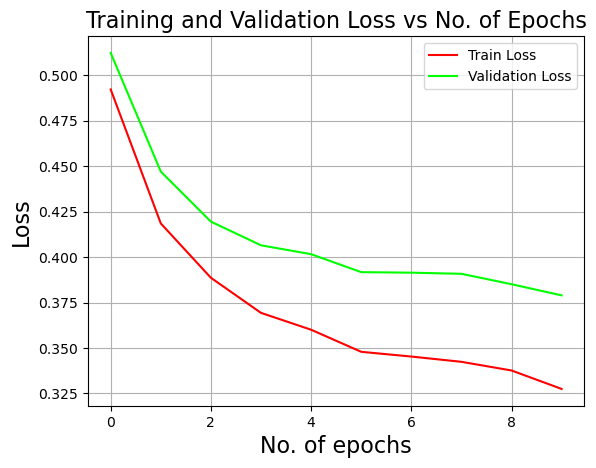

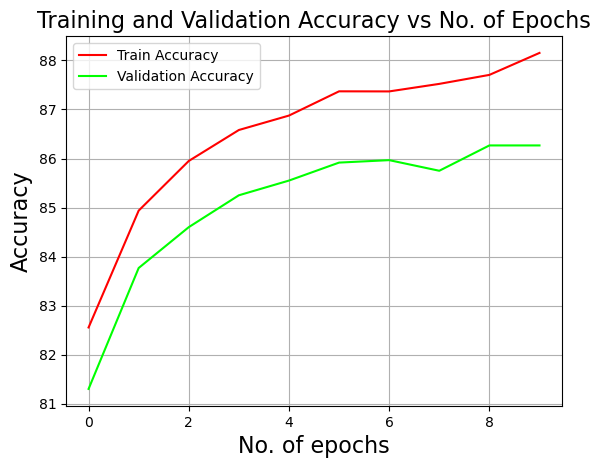

accuracy_train,▁▄▅▆▆▇▇▇▇█
accuracy_validation,▁▄▆▇▇██▇██
cost_validation,█▅▃▂▂▂▂▂▁▁
epochs,▁▂▃▃▄▅▆▆▇█
loss_train,█▅▄▃▂▂▂▂▁▁
accuracy_train,88.1537
accuracy_validation,86.26667
cost_validation,0.37892
epochs,9
loss_train,0.32751


wandb: Agent Starting Run: l39d7ji8 with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 10
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 32
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_10_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_32_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 32, 10]
 
 epoch:   0  Train error:      0.52  Train accuracy:    81.76 Val error:     0.54 Val accuracy:    80.85
 
 epoch:   1  Train error:      0.43  Train accuracy:    84.42 Val error:     0.46 Val accuracy:    83.45
 
 epoch:   2  Train error:      0.40  Train accuracy:    85.74 Val error:     0.43 Val accuracy:    84.73
 
 epoch:   3  Train error:      0.38  Train accuracy:    86.16 Val error:     0.42 Val accuracy:    84.93
 
 epoch:   4  Train error:      0.37  Train accuracy:    86.64 Val error:     0.41 Val accuracy:    85.70
 
 epoch:   5  Train error:      0.37  Train accuracy:    86.67 Val error:     0.41 Val accuracy:    85.38
 
 epoch:   6  Train error:      0.37  Train accuracy:    86.72 Val error:     0.41 Val accuracy:    85.42
 
 epoch:   7  Train error:     

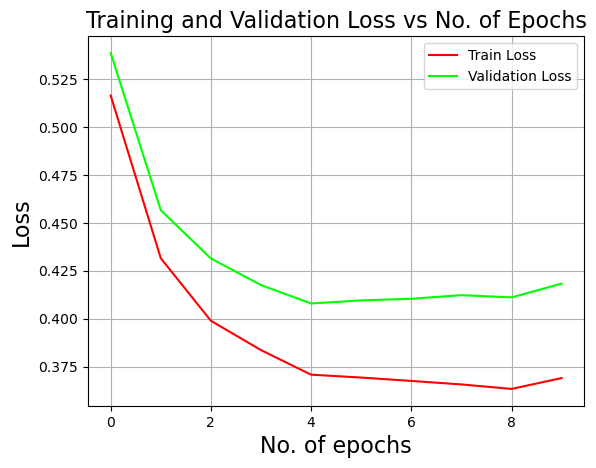

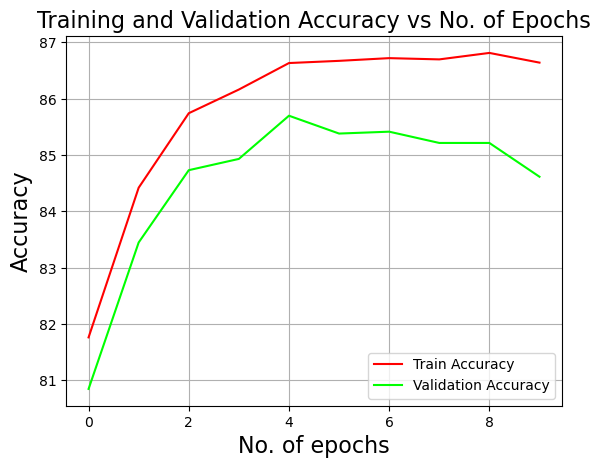

accuracy_train,▁▅▇▇██████
accuracy_validation,▁▅▇▇███▇▇▆
cost_validation,█▄▂▂▁▁▁▁▁▂
epochs,▁▂▃▃▄▅▆▆▇█
loss_train,█▄▃▂▁▁▁▁▁▁
accuracy_train,86.64259
accuracy_validation,84.61667
cost_validation,0.41828
epochs,9
loss_train,0.36897


wandb: Agent Starting Run: p4nxqi32 with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 10
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_10_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_64_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.51  Train accuracy:    81.76 Val error:     0.55 Val accuracy:    80.25
 
 epoch:   1  Train error:      0.41  Train accuracy:    84.96 Val error:     0.45 Val accuracy:    83.58
 
 epoch:   2  Train error:      0.38  Train accuracy:    86.20 Val error:     0.42 Val accuracy:    84.45
 
 epoch:   3  Train error:      0.36  Train accuracy:    86.67 Val error:     0.41 Val accuracy:    84.98
 
 epoch:   4  Train error:      0.36  Train accuracy:    86.91 Val error:     0.40 Val accuracy:    85.23
 
 epoch:   5  Train error:      0.35  Train accuracy:    87.34 Val error:     0.40 Val accuracy:    85.65
 
 epoch:   6  Train error:      0.34  Train accuracy:    87.45 Val error:     0.39 Val accuracy:    85.57
 
 epoch:   7  Train error:    

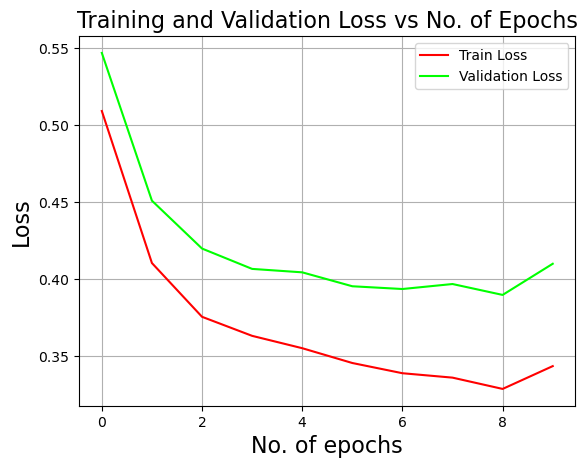

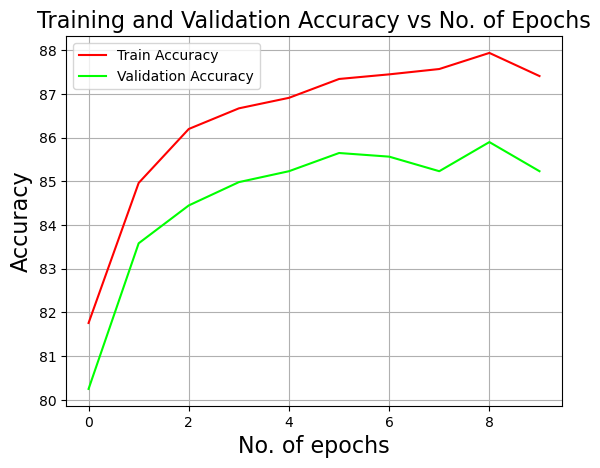

accuracy_train,▁▅▆▇▇▇▇██▇
accuracy_validation,▁▅▆▇▇██▇█▇
cost_validation,█▄▂▂▂▁▁▁▁▂
epochs,▁▂▃▃▄▅▆▆▇█
loss_train,█▄▃▂▂▂▁▁▁▂
accuracy_train,87.41111
accuracy_validation,85.23333
cost_validation,0.40999
epochs,9
loss_train,0.34345


wandb: Agent Starting Run: ze1o23s7 with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 10
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_10_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_64_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.52  Train accuracy:    81.69 Val error:     0.56 Val accuracy:    80.58
 
 epoch:   1  Train error:      0.41  Train accuracy:    84.93 Val error:     0.45 Val accuracy:    83.38
 
 epoch:   2  Train error:      0.39  Train accuracy:    85.77 Val error:     0.43 Val accuracy:    84.10
 
 epoch:   3  Train error:      0.36  Train accuracy:    86.93 Val error:     0.40 Val accuracy:    84.98
 
 epoch:   4  Train error:      0.35  Train accuracy:    87.40 Val error:     0.40 Val accuracy:    85.50
 
 epoch:   5  Train error:      0.35  Train accuracy:    87.35 Val error:     0.40 Val accuracy:    85.53
 
 epoch:   6  Train error:      0.35  Train accuracy:    87.18 Val error:     0.41 Val accuracy:    85.18
 
 epoch:   7  Train error:     

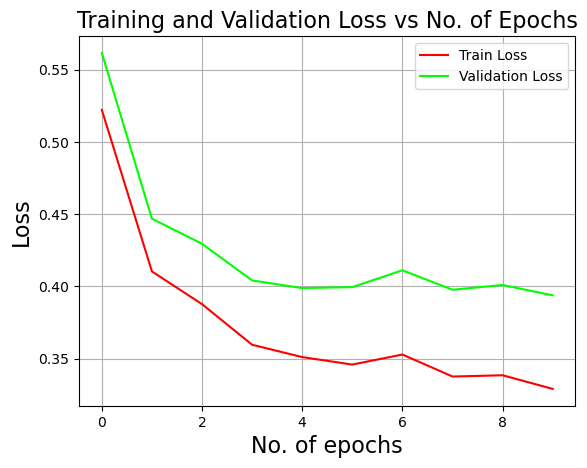

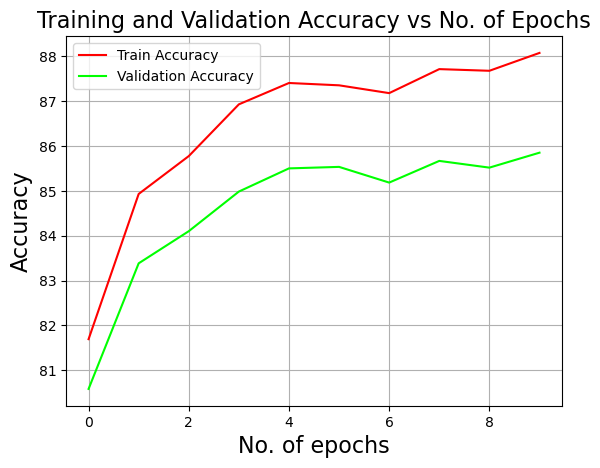

accuracy_train,▁▅▅▇▇▇▇███
accuracy_validation,▁▅▆▇██▇███
cost_validation,█▃▂▁▁▁▂▁▁▁
epochs,▁▂▃▃▄▅▆▆▇█
loss_train,█▄▃▂▂▂▂▁▁▁
accuracy_train,88.07407
accuracy_validation,85.85
cost_validation,0.3938
epochs,9
loss_train,0.32903


wandb: Agent Starting Run: wvqznvi8 with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 15
wandb: 	lambd: 0
wandb: 	learning_rate: 0.01
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 32
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.01_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_15_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_32_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 32, 10]
 
 epoch:   0  Train error:      0.56  Train accuracy:    81.09 Val error:     0.59 Val accuracy:    80.28
 
 epoch:   3  Train error:      0.50  Train accuracy:    83.19 Val error:     0.57 Val accuracy:    81.57
 
 epoch:   6  Train error:      0.49  Train accuracy:    83.94 Val error:     0.57 Val accuracy:    82.17
 
 epoch:   9  Train error:      0.50  Train accuracy:    83.90 Val error:     0.61 Val accuracy:    82.07
 
 epoch:  12  Train error:      0.48  Train accuracy:    84.62 Val error:     0.62 Val accuracy:    82.27


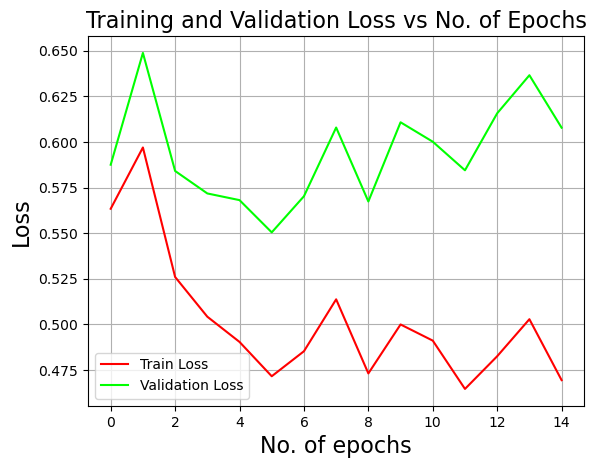

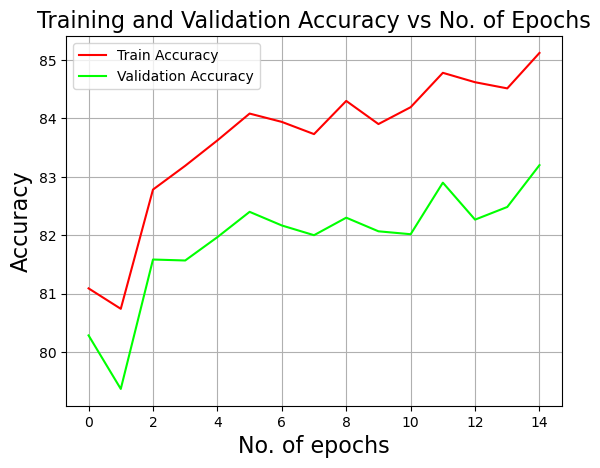

accuracy_train,▂▁▄▅▆▆▆▆▇▆▇▇▇▇█
accuracy_validation,▃▁▅▅▆▇▆▆▆▆▆▇▆▇█
cost_validation,▄█▃▃▂▁▂▅▂▅▅▃▆▇▅
epochs,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
loss_train,▆█▄▃▂▁▂▄▁▃▂▁▂▃▁
accuracy_train,85.12222
accuracy_validation,83.2
cost_validation,0.60778
epochs,14
loss_train,0.46943


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: vy44jqvo with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 15
wandb: 	lambd: 0
wandb: 	learning_rate: 0.01
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 32
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.01_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_15_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_32_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 32, 10]
 
 epoch:   0  Train error:      0.60  Train accuracy:    79.41 Val error:     0.62 Val accuracy:    78.70
 
 epoch:   3  Train error:      0.48  Train accuracy:    83.84 Val error:     0.54 Val accuracy:    82.75
 
 epoch:   6  Train error:      0.47  Train accuracy:    83.87 Val error:     0.54 Val accuracy:    82.73
 
 epoch:   9  Train error:      0.46  Train accuracy:    84.77 Val error:     0.56 Val accuracy:    83.08
 
 epoch:  12  Train error:      0.47  Train accuracy:    84.20 Val error:     0.58 Val accuracy:    82.70


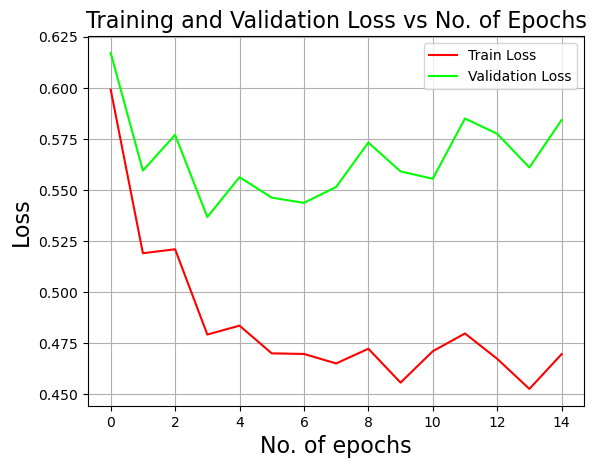

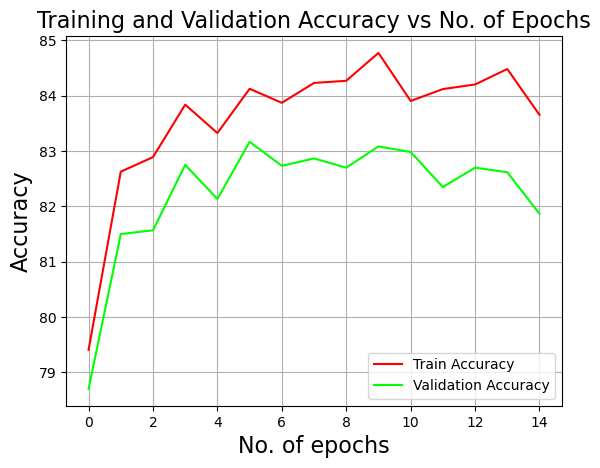

accuracy_train,▁▅▆▇▆▇▇▇▇█▇▇▇█▇
accuracy_validation,▁▅▅▇▆█▇█▇██▇▇▇▆
cost_validation,█▃▅▁▃▂▂▂▄▃▃▅▅▃▅
epochs,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
loss_train,█▄▄▂▂▂▂▂▂▁▂▂▂▁▂
accuracy_train,83.6537
accuracy_validation,81.86667
cost_validation,0.58426
epochs,14
loss_train,0.46967


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: sbajvn07 with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 15
wandb: 	lambd: 0
wandb: 	learning_rate: 0.01
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.01_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_15_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_64_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.61  Train accuracy:    78.82 Val error:     0.65 Val accuracy:    78.65
 
 epoch:   3  Train error:      0.46  Train accuracy:    85.31 Val error:     0.53 Val accuracy:    84.23
 
 epoch:   6  Train error:      0.45  Train accuracy:    85.72 Val error:     0.56 Val accuracy:    84.22
 
 epoch:   9  Train error:      0.44  Train accuracy:    85.60 Val error:     0.58 Val accuracy:    83.72
 
 epoch:  12  Train error:      0.43  Train accuracy:    86.24 Val error:     0.60 Val accuracy:    84.08


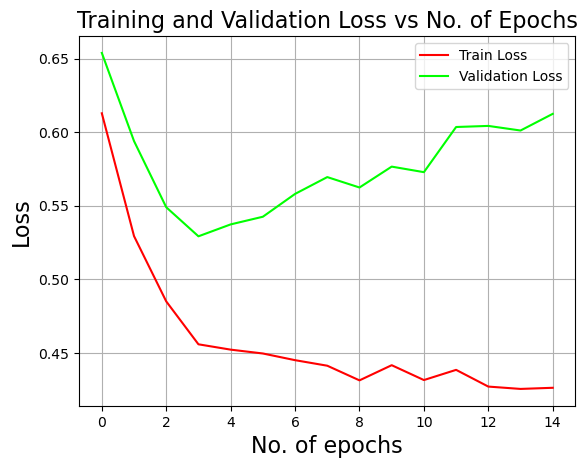

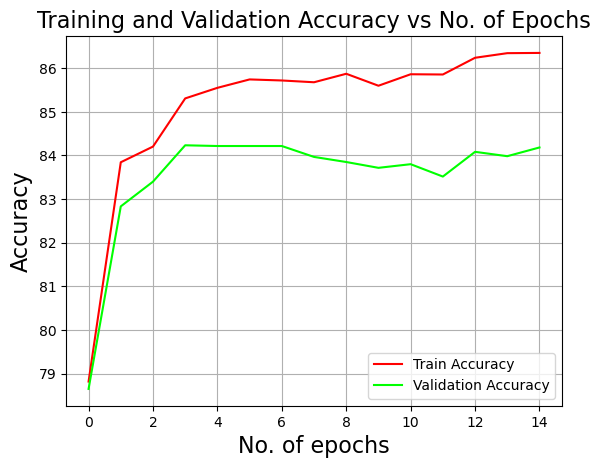

accuracy_train,▁▆▆▇▇▇▇▇█▇█████
accuracy_validation,▁▆▇██████▇▇▇███
cost_validation,█▅▂▁▁▂▃▃▃▄▃▅▅▅▆
epochs,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
loss_train,█▅▃▂▂▂▂▂▁▂▁▁▁▁▁
accuracy_train,86.35
accuracy_validation,84.18333
cost_validation,0.61242
epochs,14
loss_train,0.4263


wandb: Agent Starting Run: va5iplhr with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 15
wandb: 	lambd: 0
wandb: 	learning_rate: 0.01
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.01_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_15_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_64_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.63  Train accuracy:    79.03 Val error:     0.68 Val accuracy:    78.00
 
 epoch:   3  Train error:      0.51  Train accuracy:    82.13 Val error:     0.58 Val accuracy:    81.05
 
 epoch:   6  Train error:      0.48  Train accuracy:    83.69 Val error:     0.58 Val accuracy:    81.62
 
 epoch:   9  Train error:      0.46  Train accuracy:    84.51 Val error:     0.58 Val accuracy:    82.90
 
 epoch:  12  Train error:      0.47  Train accuracy:    83.92 Val error:     0.63 Val accuracy:    81.22


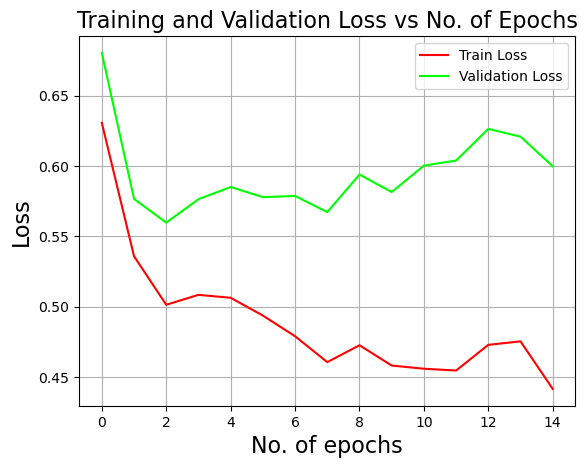

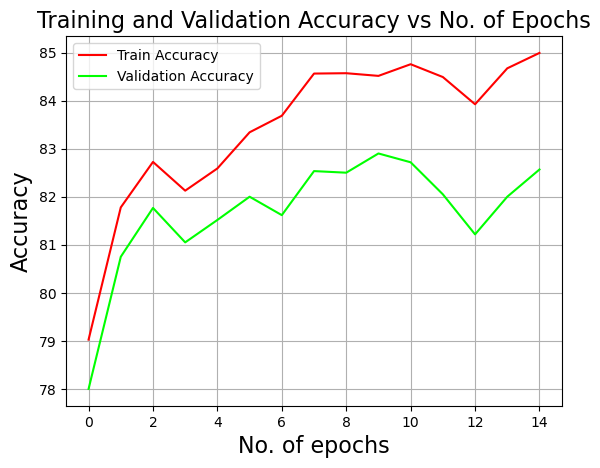

accuracy_train,▁▄▅▅▅▆▆▇█▇█▇▇██
accuracy_validation,▁▅▆▅▆▇▆▇▇██▇▆▇█
cost_validation,█▂▁▂▂▂▂▁▃▂▃▄▅▅▃
epochs,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
loss_train,█▄▃▃▃▃▂▂▂▂▂▁▂▂▁
accuracy_train,84.99259
accuracy_validation,82.56667
cost_validation,0.59977
epochs,14
loss_train,0.44162


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: lx56yqy5 with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 15
wandb: 	lambd: 0
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 32
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_15_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_32_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 32, 10]
 
 epoch:   0  Train error:      0.56  Train accuracy:    80.93 Val error:     0.57 Val accuracy:    80.15
 
 epoch:   3  Train error:      0.43  Train accuracy:    84.99 Val error:     0.46 Val accuracy:    84.05
 
 epoch:   6  Train error:      0.40  Train accuracy:    85.96 Val error:     0.46 Val accuracy:    84.58
 
 epoch:   9  Train error:      0.38  Train accuracy:    86.56 Val error:     0.46 Val accuracy:    85.00
 
 epoch:  12  Train error:      0.37  Train accuracy:    87.06 Val error:     0.46 Val accuracy:    85.35


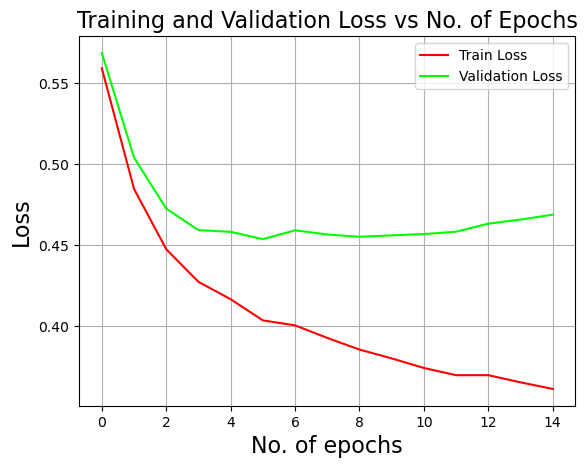

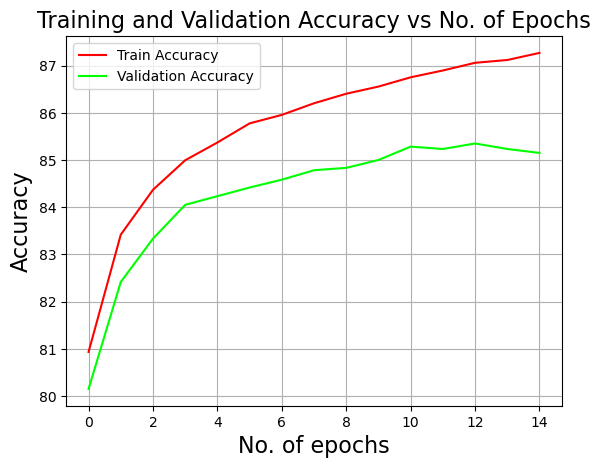

accuracy_train,▁▄▅▅▆▆▇▇▇▇▇████
accuracy_validation,▁▄▅▆▆▇▇▇▇██████
cost_validation,█▄▂▁▁▁▁▁▁▁▁▁▂▂▂
epochs,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
loss_train,█▅▄▃▃▂▂▂▂▂▁▁▁▁▁
accuracy_train,87.26852
accuracy_validation,85.15
cost_validation,0.46886
epochs,14
loss_train,0.36122


wandb: Agent Starting Run: dlqfv6ll with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 15
wandb: 	lambd: 0
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 32
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_15_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_32_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 32, 10]
 
 epoch:   0  Train error:      0.56  Train accuracy:    80.79 Val error:     0.58 Val accuracy:    79.92
 
 epoch:   3  Train error:      0.43  Train accuracy:    84.82 Val error:     0.47 Val accuracy:    83.78
 
 epoch:   6  Train error:      0.40  Train accuracy:    85.88 Val error:     0.46 Val accuracy:    84.40
 
 epoch:   9  Train error:      0.38  Train accuracy:    86.64 Val error:     0.46 Val accuracy:    84.90
 
 epoch:  12  Train error:      0.37  Train accuracy:    87.20 Val error:     0.47 Val accuracy:    85.55


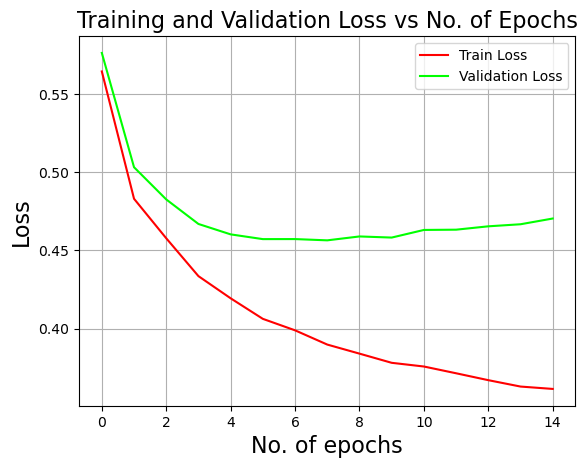

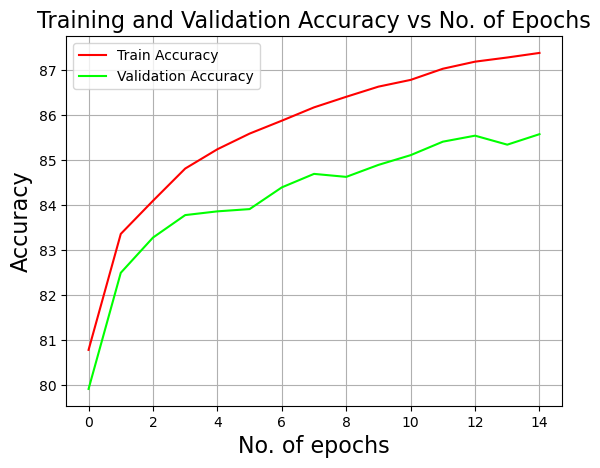

accuracy_train,▁▄▅▅▆▆▆▇▇▇▇████
accuracy_validation,▁▄▅▆▆▆▇▇▇▇▇████
cost_validation,█▄▃▂▁▁▁▁▁▁▁▁▂▂▂
epochs,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
loss_train,█▅▄▃▃▃▂▂▂▂▁▁▁▁▁
accuracy_train,87.39074
accuracy_validation,85.58333
cost_validation,0.47045
epochs,14
loss_train,0.36142


wandb: Agent Starting Run: 9m0cqky3 with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 15
wandb: 	lambd: 0
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_15_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_64_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.54  Train accuracy:    81.63 Val error:     0.57 Val accuracy:    80.57
 
 epoch:   3  Train error:      0.38  Train accuracy:    86.27 Val error:     0.46 Val accuracy:    85.25
 
 epoch:   6  Train error:      0.34  Train accuracy:    87.77 Val error:     0.44 Val accuracy:    85.97
 
 epoch:   9  Train error:      0.32  Train accuracy:    88.60 Val error:     0.45 Val accuracy:    86.38
 
 epoch:  12  Train error:      0.31  Train accuracy:    89.11 Val error:     0.46 Val accuracy:    86.42


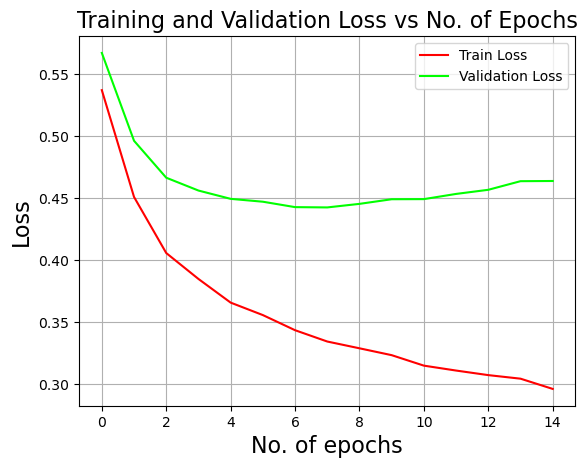

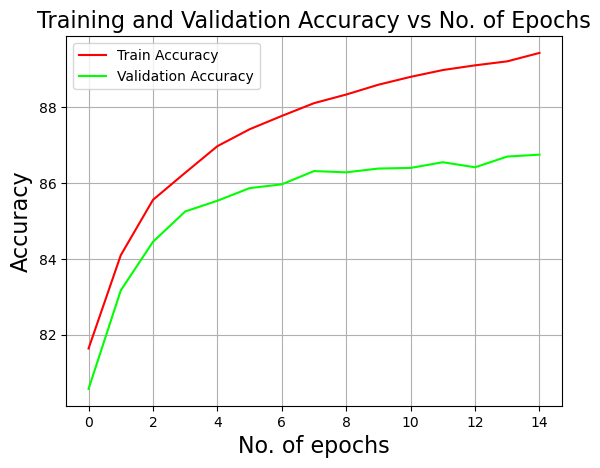

accuracy_train,▁▃▅▅▆▆▇▇▇▇▇████
accuracy_validation,▁▄▅▆▇▇▇█▇██████
cost_validation,█▄▂▂▁▁▁▁▁▁▁▂▂▂▂
epochs,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
loss_train,█▅▄▄▃▃▂▂▂▂▂▁▁▁▁
accuracy_train,89.43519
accuracy_validation,86.75
cost_validation,0.46394
epochs,14
loss_train,0.29592


wandb: Agent Starting Run: ac0h6pcr with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 15
wandb: 	lambd: 0
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_15_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_64_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.55  Train accuracy:    81.24 Val error:     0.59 Val accuracy:    79.80
 
 epoch:   3  Train error:      0.38  Train accuracy:    86.21 Val error:     0.45 Val accuracy:    84.62
 
 epoch:   6  Train error:      0.34  Train accuracy:    87.79 Val error:     0.43 Val accuracy:    85.35
 
 epoch:   9  Train error:      0.33  Train accuracy:    88.36 Val error:     0.43 Val accuracy:    85.40
 
 epoch:  12  Train error:      0.31  Train accuracy:    89.04 Val error:     0.44 Val accuracy:    86.23


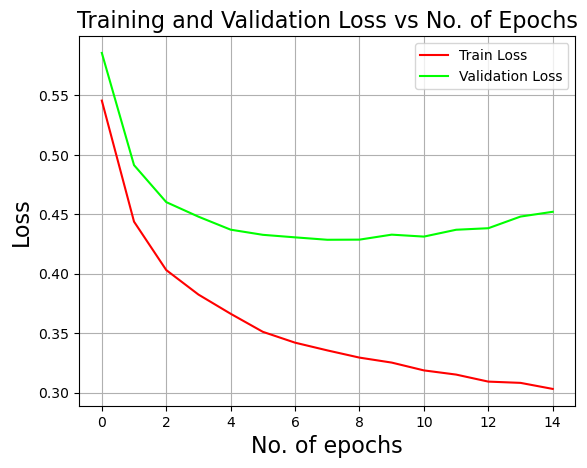

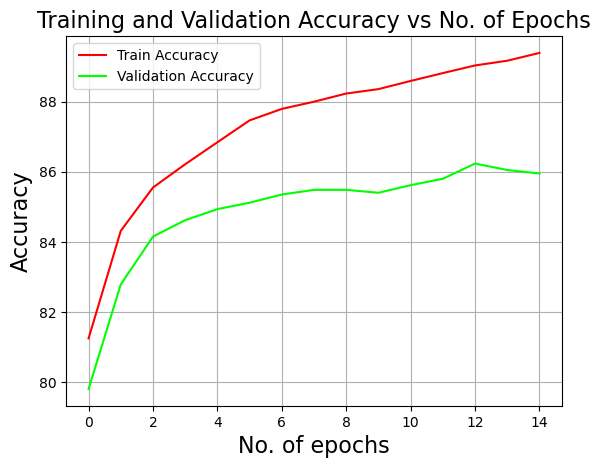

accuracy_train,▁▄▅▅▆▆▇▇▇▇▇████
accuracy_validation,▁▄▆▆▇▇▇▇▇▇▇████
cost_validation,█▄▂▂▁▁▁▁▁▁▁▁▁▂▂
epochs,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
loss_train,█▅▄▃▃▂▂▂▂▂▁▁▁▁▁
accuracy_train,89.39259
accuracy_validation,85.95
cost_validation,0.45206
epochs,14
loss_train,0.30308


wandb: Agent Starting Run: a33rbeqo with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 15
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.01
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 32
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.01_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_15_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_32_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 32, 10]
 
 epoch:   0  Train error:      0.61  Train accuracy:    78.18 Val error:     0.62 Val accuracy:    76.88
 
 epoch:   3  Train error:      0.52  Train accuracy:    81.43 Val error:     0.55 Val accuracy:    79.73
 
 epoch:   6  Train error:      0.49  Train accuracy:    82.43 Val error:     0.52 Val accuracy:    80.83
 
 epoch:   9  Train error:      0.45  Train accuracy:    83.87 Val error:     0.47 Val accuracy:    82.87
 
 epoch:  12  Train error:      0.52  Train accuracy:    81.42 Val error:     0.56 Val accuracy:    80.00


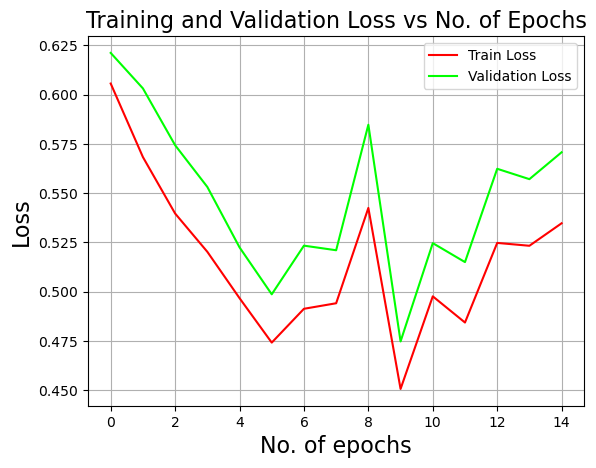

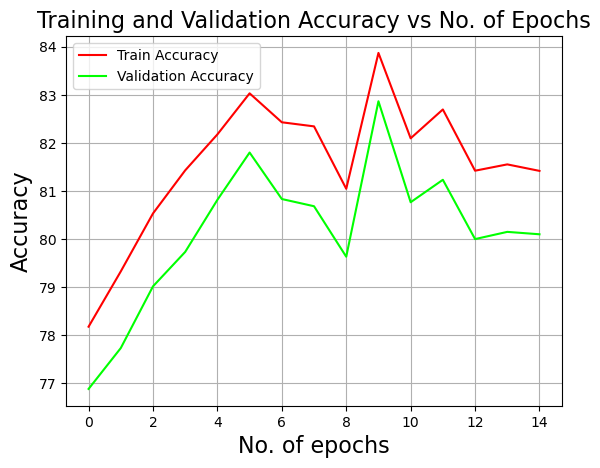

accuracy_train,▁▂▄▅▆▇▆▆▅█▆▇▅▅▅
accuracy_validation,▁▂▃▄▆▇▆▅▄█▆▆▅▅▅
cost_validation,█▇▆▅▃▂▃▃▆▁▃▃▅▅▆
epochs,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
loss_train,█▆▅▄▃▂▃▃▅▁▃▃▄▄▅
accuracy_train,81.41852
accuracy_validation,80.1
cost_validation,0.57072
epochs,14
loss_train,0.53471


wandb: Agent Starting Run: iiabs9nf with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 15
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.01
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 32
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.01_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_15_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_32_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 32, 10]
 
 epoch:   0  Train error:      0.68  Train accuracy:    75.91 Val error:     0.72 Val accuracy:    74.60
 
 epoch:   3  Train error:      0.56  Train accuracy:    79.60 Val error:     0.60 Val accuracy:    78.30
 
 epoch:   6  Train error:      0.57  Train accuracy:    79.37 Val error:     0.60 Val accuracy:    78.62
 
 epoch:   9  Train error:      0.63  Train accuracy:    77.38 Val error:     0.68 Val accuracy:    76.38
 
 epoch:  12  Train error:      0.60  Train accuracy:    78.58 Val error:     0.64 Val accuracy:    77.57


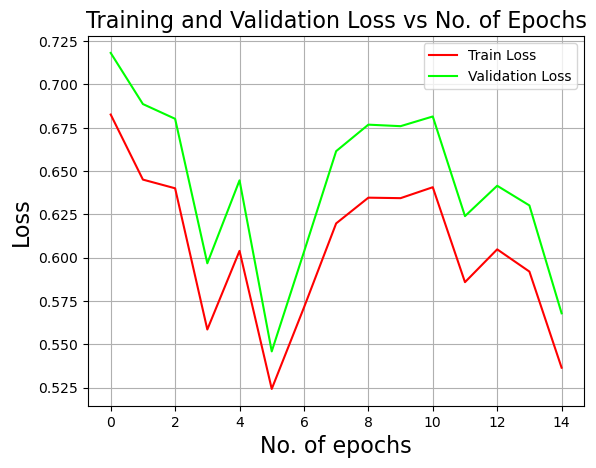

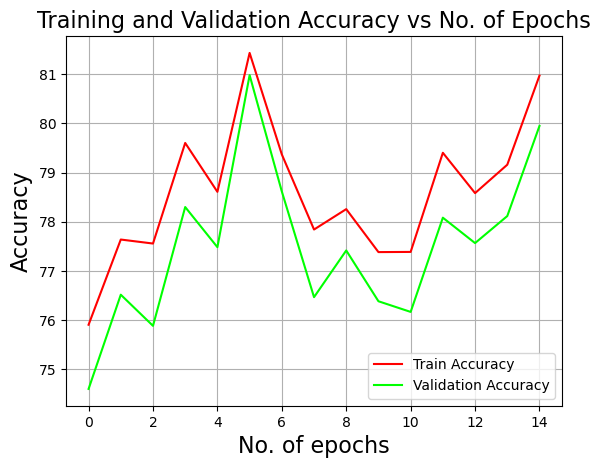

accuracy_train,▁▃▃▆▄█▅▃▄▃▃▅▄▅▇
accuracy_validation,▁▃▂▅▄█▅▃▄▃▃▅▄▅▇
cost_validation,█▇▆▃▅▁▃▆▆▆▇▄▅▄▂
epochs,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
loss_train,█▆▆▃▅▁▃▅▆▆▆▄▅▄▂
accuracy_train,80.97407
accuracy_validation,79.95
cost_validation,0.56795
epochs,14
loss_train,0.53657


wandb: Agent Starting Run: zjw47rzw with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 15
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.01
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.01_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_15_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_64_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.69  Train accuracy:    75.71 Val error:     0.72 Val accuracy:    74.02
 
 epoch:   3  Train error:      0.55  Train accuracy:    80.01 Val error:     0.58 Val accuracy:    78.60
 
 epoch:   6  Train error:      0.54  Train accuracy:    80.64 Val error:     0.57 Val accuracy:    79.72
 
 epoch:   9  Train error:      0.60  Train accuracy:    78.38 Val error:     0.64 Val accuracy:    77.42
 
 epoch:  12  Train error:      0.57  Train accuracy:    80.16 Val error:     0.60 Val accuracy:    79.03


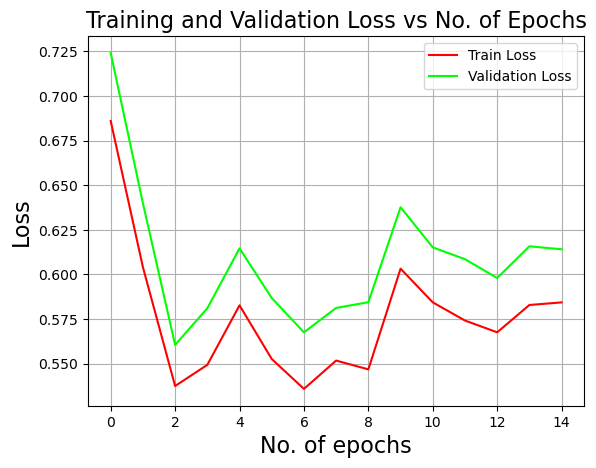

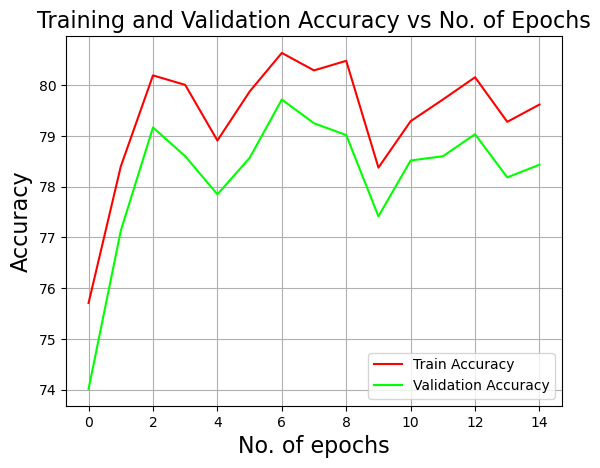

accuracy_train,▁▅▇▇▆▇███▅▆▇▇▆▇
accuracy_validation,▁▅▇▇▆▇█▇▇▅▇▇▇▆▆
cost_validation,█▄▁▂▃▂▁▂▂▄▃▃▃▃▃
epochs,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
loss_train,█▄▁▂▃▂▁▂▂▄▃▃▂▃▃
accuracy_train,79.61852
accuracy_validation,78.43333
cost_validation,0.61411
epochs,14
loss_train,0.58435


wandb: Agent Starting Run: fdnnesas with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 15
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.01
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.01_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_15_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_64_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.65  Train accuracy:    77.21 Val error:     0.68 Val accuracy:    75.80
 
 epoch:   3  Train error:      0.49  Train accuracy:    82.69 Val error:     0.51 Val accuracy:    82.27
 
 epoch:   6  Train error:      0.50  Train accuracy:    82.26 Val error:     0.52 Val accuracy:    81.43
 
 epoch:   9  Train error:      0.56  Train accuracy:    79.61 Val error:     0.59 Val accuracy:    78.55
 
 epoch:  12  Train error:      0.53  Train accuracy:    80.82 Val error:     0.54 Val accuracy:    80.12


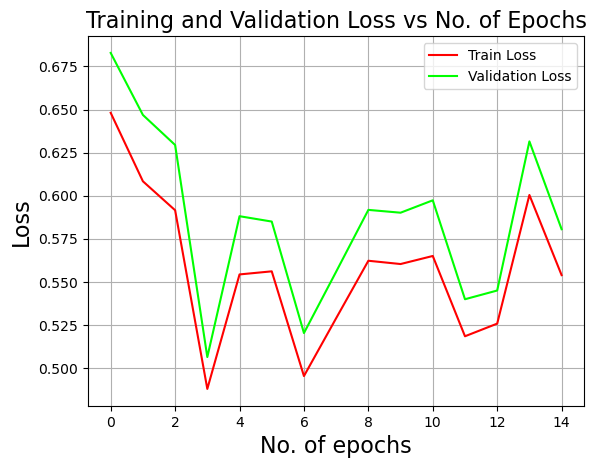

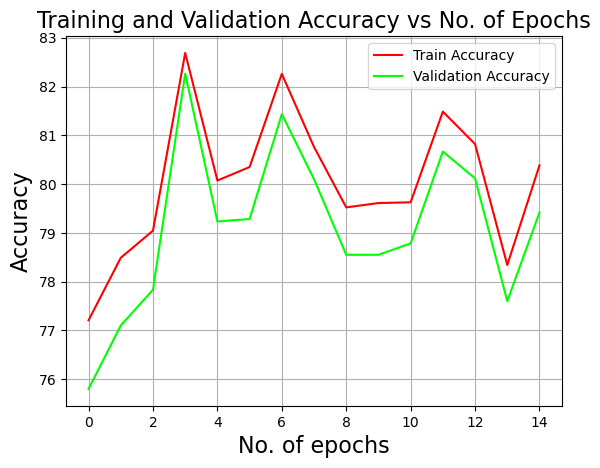

accuracy_train,▁▃▃█▅▅▇▆▄▄▄▆▆▂▅
accuracy_validation,▁▂▃█▅▅▇▆▄▄▄▆▆▃▅
cost_validation,█▇▆▁▄▄▂▃▄▄▅▂▃▆▄
epochs,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
loss_train,█▆▆▁▄▄▁▃▄▄▄▂▃▆▄
accuracy_train,80.38333
accuracy_validation,79.41667
cost_validation,0.58054
epochs,14
loss_train,0.55387


wandb: Agent Starting Run: kzltcv1g with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 15
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 32
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_15_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_32_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 32, 10]
 
 epoch:   0  Train error:      0.49  Train accuracy:    82.55 Val error:     0.51 Val accuracy:    81.30
 
 epoch:   3  Train error:      0.37  Train accuracy:    86.58 Val error:     0.41 Val accuracy:    85.25
 
 epoch:   6  Train error:      0.35  Train accuracy:    87.37 Val error:     0.39 Val accuracy:    85.97
 
 epoch:   9  Train error:      0.33  Train accuracy:    88.15 Val error:     0.38 Val accuracy:    86.27
 
 epoch:  12  Train error:      0.32  Train accuracy:    88.35 Val error:     0.38 Val accuracy:    86.23


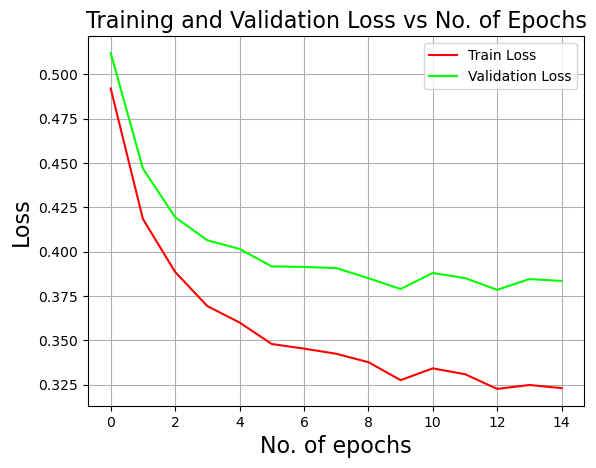

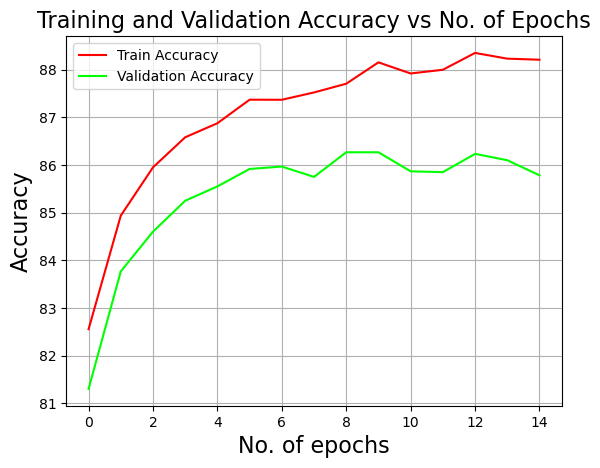

accuracy_train,▁▄▅▆▆▇▇▇▇█▇████
accuracy_validation,▁▄▆▇▇██▇██▇▇██▇
cost_validation,█▅▃▂▂▂▂▂▁▁▁▁▁▁▁
epochs,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
loss_train,█▅▄▃▃▂▂▂▂▁▁▁▁▁▁
accuracy_train,88.20926
accuracy_validation,85.78333
cost_validation,0.3835
epochs,14
loss_train,0.32299


wandb: Agent Starting Run: 2ktxq1kc with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 15
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 32
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_15_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_32_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 32, 10]
 
 epoch:   0  Train error:      0.52  Train accuracy:    81.76 Val error:     0.54 Val accuracy:    80.85
 
 epoch:   3  Train error:      0.38  Train accuracy:    86.16 Val error:     0.42 Val accuracy:    84.93
 
 epoch:   6  Train error:      0.37  Train accuracy:    86.72 Val error:     0.41 Val accuracy:    85.42
 
 epoch:   9  Train error:      0.37  Train accuracy:    86.64 Val error:     0.42 Val accuracy:    84.62
 
 epoch:  12  Train error:      0.36  Train accuracy:    86.81 Val error:     0.42 Val accuracy:    84.95


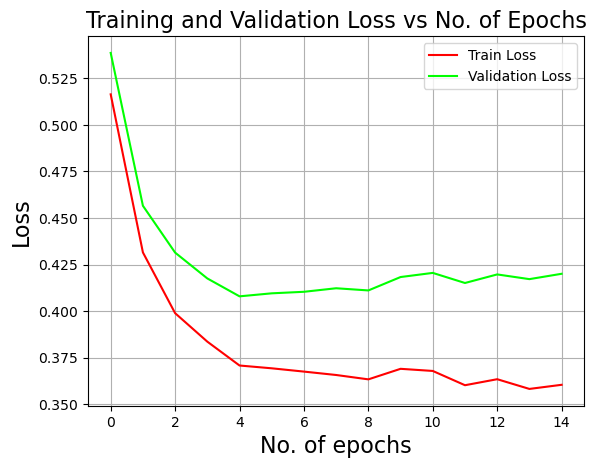

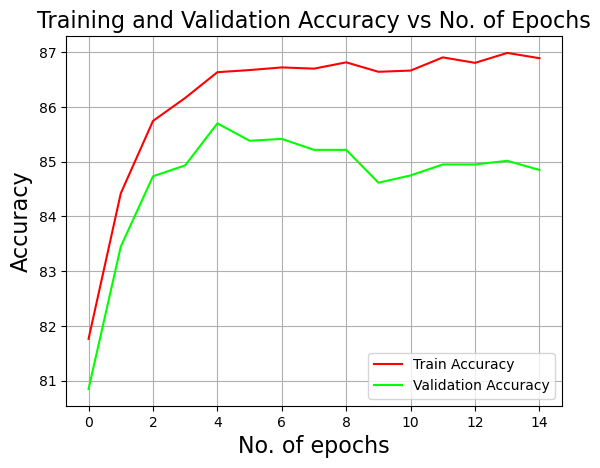

accuracy_train,▁▅▆▇███████████
accuracy_validation,▁▅▇▇███▇▇▆▇▇▇▇▇
cost_validation,█▄▂▂▁▁▁▁▁▂▂▁▂▁▂
epochs,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
loss_train,█▄▃▂▂▁▁▁▁▁▁▁▁▁▁
accuracy_train,86.89074
accuracy_validation,84.85
cost_validation,0.42002
epochs,14
loss_train,0.36038


wandb: Agent Starting Run: mtoy0svl with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 15
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_15_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_64_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.51  Train accuracy:    81.76 Val error:     0.55 Val accuracy:    80.25
 
 epoch:   3  Train error:      0.36  Train accuracy:    86.67 Val error:     0.41 Val accuracy:    84.98
 
 epoch:   6  Train error:      0.34  Train accuracy:    87.45 Val error:     0.39 Val accuracy:    85.57
 
 epoch:   9  Train error:      0.34  Train accuracy:    87.41 Val error:     0.41 Val accuracy:    85.23
 
 epoch:  12  Train error:      0.32  Train accuracy:    88.16 Val error:     0.40 Val accuracy:    86.00


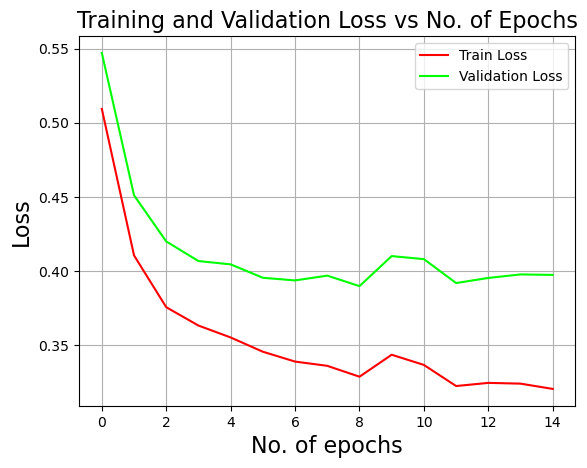

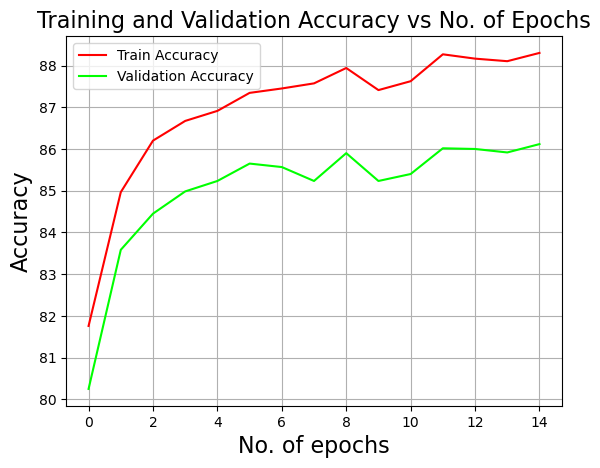

accuracy_train,▁▄▆▆▇▇▇▇█▇▇████
accuracy_validation,▁▅▆▇▇▇▇▇█▇▇████
cost_validation,█▄▂▂▂▁▁▁▁▂▂▁▁▁▁
epochs,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
loss_train,█▄▃▃▂▂▂▂▁▂▂▁▁▁▁
accuracy_train,88.30185
accuracy_validation,86.11667
cost_validation,0.3973
epochs,14
loss_train,0.32038


wandb: Agent Starting Run: 1l7p2r18 with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 15
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_15_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_64_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.52  Train accuracy:    81.69 Val error:     0.56 Val accuracy:    80.58
 
 epoch:   3  Train error:      0.36  Train accuracy:    86.93 Val error:     0.40 Val accuracy:    84.98
 
 epoch:   6  Train error:      0.35  Train accuracy:    87.18 Val error:     0.41 Val accuracy:    85.18
 
 epoch:   9  Train error:      0.33  Train accuracy:    88.07 Val error:     0.39 Val accuracy:    85.85
 
 epoch:  12  Train error:      0.32  Train accuracy:    88.18 Val error:     0.39 Val accuracy:    85.77


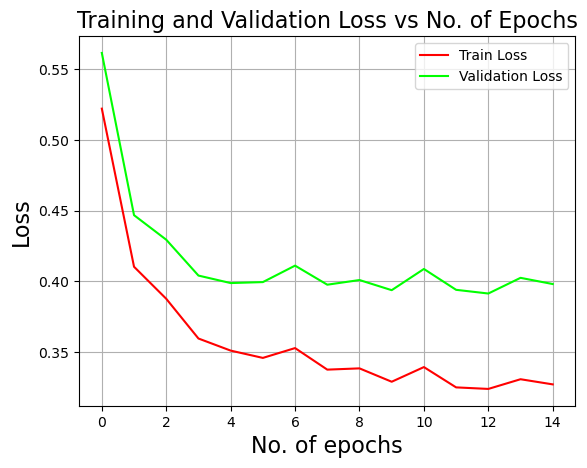

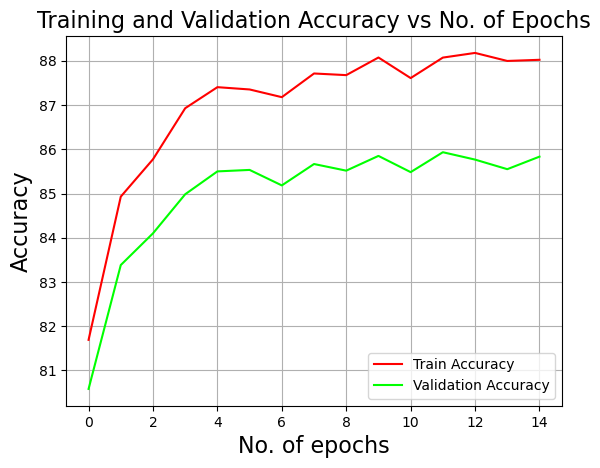

accuracy_train,▁▄▅▇▇▇▇▇▇█▇████
accuracy_validation,▁▅▆▇▇▇▇█▇█▇██▇█
cost_validation,█▃▃▂▁▁▂▁▁▁▂▁▁▁▁
epochs,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
loss_train,█▄▃▂▂▂▂▁▂▁▂▁▁▁▁
accuracy_train,88.02222
accuracy_validation,85.83333
cost_validation,0.39813
epochs,14
loss_train,0.32716


wandb: Sweep Agent: Waiting for job.
502 response executing GraphQL.

<html><head>
<meta http-equiv="content-type" content="text/html;charset=utf-8">
<title>502 Server Error</title>
</head>
<body text=#000000 bgcolor=#ffffff>
<h1>Error: Server Error</h1>
<h2>The server encountered a temporary error and could not complete your request.<p>Please try again in 30 seconds.</h2>
<h2></h2>
</body></html>

wandb: Job received.
wandb: Agent Starting Run: 6hotarxl with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 20
wandb: 	lambd: 0
wandb: 	learning_rate: 0.01
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 32
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.01_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_20_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_32_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 32, 10]
 
 epoch:   0  Train error:      0.56  Train accuracy:    81.09 Val error:     0.59 Val accuracy:    80.28
 
 epoch:   2  Train error:      0.53  Train accuracy:    82.78 Val error:     0.58 Val accuracy:    81.58
 
 epoch:   4  Train error:      0.49  Train accuracy:    83.62 Val error:     0.57 Val accuracy:    81.97
 
 epoch:   6  Train error:      0.49  Train accuracy:    83.94 Val error:     0.57 Val accuracy:    82.17
 
 epoch:   8  Train error:      0.47  Train accuracy:    84.30 Val error:     0.57 Val accuracy:    82.30
 
 epoch:  10  Train error:      0.49  Train accuracy:    84.19 Val error:     0.60 Val accuracy:    82.02
 
 epoch:  12  Train error:      0.48  Train accuracy:    84.62 Val error:     0.62 Val accuracy:    82.27
 
 epoch:  14  Train error:      0.4

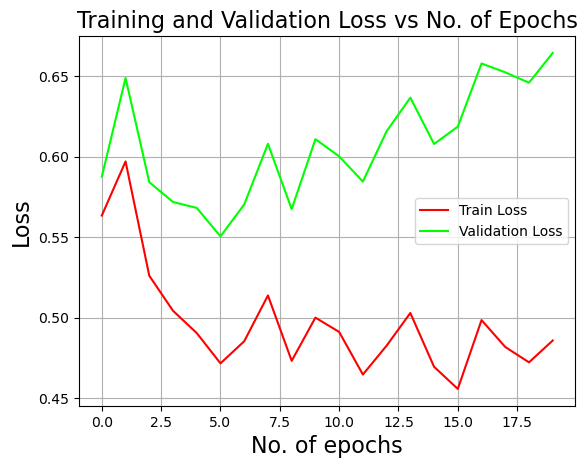

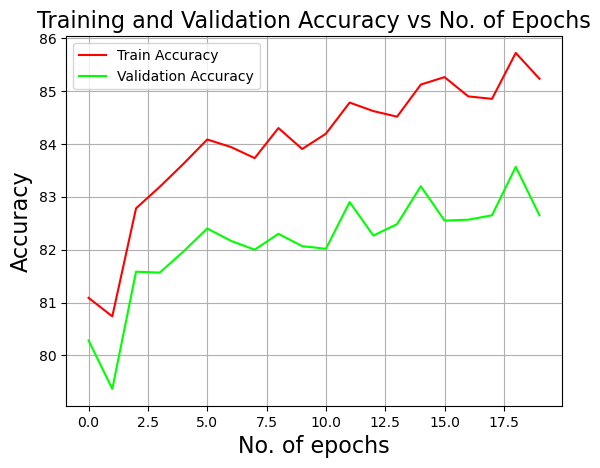

accuracy_train,▁▁▄▄▅▆▅▅▆▅▆▇▆▆▇▇▇▇█▇
accuracy_validation,▃▁▅▅▅▆▆▅▆▅▅▇▆▆▇▆▆▆█▆
cost_validation,▃▇▃▂▂▁▂▅▂▅▄▃▅▆▅▅█▇▇█
epochs,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss_train,▆█▄▃▃▂▂▄▂▃▃▁▂▃▂▁▃▂▂▂
accuracy_train,85.23148
accuracy_validation,82.65
cost_validation,0.66432
epochs,19
loss_train,0.48575


wandb: Agent Starting Run: 9mv3i3a5 with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 20
wandb: 	lambd: 0
wandb: 	learning_rate: 0.01
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 32
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.01_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_20_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_32_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 32, 10]
 
 epoch:   0  Train error:      0.60  Train accuracy:    79.41 Val error:     0.62 Val accuracy:    78.70
 
 epoch:   2  Train error:      0.52  Train accuracy:    82.89 Val error:     0.58 Val accuracy:    81.57
 
 epoch:   4  Train error:      0.48  Train accuracy:    83.33 Val error:     0.56 Val accuracy:    82.13
 
 epoch:   6  Train error:      0.47  Train accuracy:    83.87 Val error:     0.54 Val accuracy:    82.73
 
 epoch:   8  Train error:      0.47  Train accuracy:    84.27 Val error:     0.57 Val accuracy:    82.70
 
 epoch:  10  Train error:      0.47  Train accuracy:    83.91 Val error:     0.56 Val accuracy:    82.98
 
 epoch:  12  Train error:      0.47  Train accuracy:    84.20 Val error:     0.58 Val accuracy:    82.70
 
 epoch:  14  Train error:      0.47

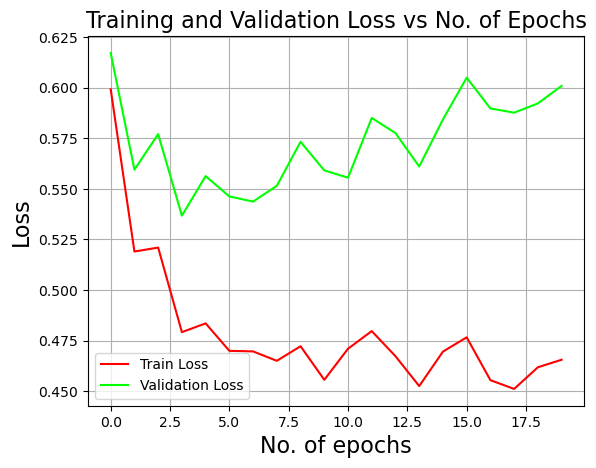

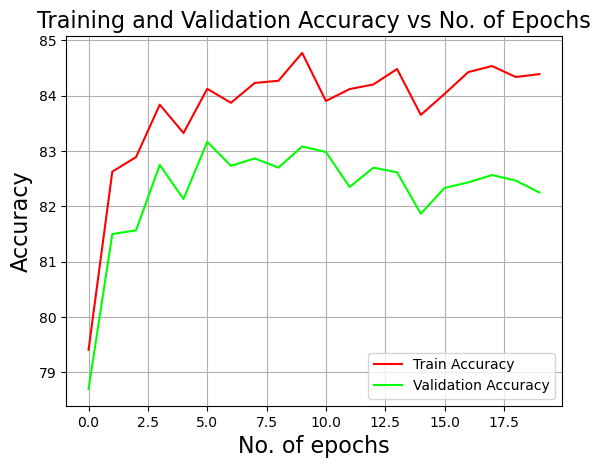

accuracy_train,▁▅▆▇▆▇▇▇▇█▇▇▇█▇▇██▇█
accuracy_validation,▁▅▅▇▆█▇█▇██▇▇▇▆▇▇▇▇▇
cost_validation,█▃▅▁▃▂▂▂▄▃▃▅▅▃▅▇▆▅▆▇
epochs,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss_train,█▄▄▂▃▂▂▂▂▁▂▂▂▁▂▂▁▁▂▂
accuracy_train,84.39074
accuracy_validation,82.25
cost_validation,0.60083
epochs,19
loss_train,0.46564


wandb: Agent Starting Run: kyrq8m4d with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 20
wandb: 	lambd: 0
wandb: 	learning_rate: 0.01
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.01_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_20_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_64_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.61  Train accuracy:    78.82 Val error:     0.65 Val accuracy:    78.65
 
 epoch:   2  Train error:      0.48  Train accuracy:    84.20 Val error:     0.55 Val accuracy:    83.40
 
 epoch:   4  Train error:      0.45  Train accuracy:    85.55 Val error:     0.54 Val accuracy:    84.22
 
 epoch:   6  Train error:      0.45  Train accuracy:    85.72 Val error:     0.56 Val accuracy:    84.22
 
 epoch:   8  Train error:      0.43  Train accuracy:    85.87 Val error:     0.56 Val accuracy:    83.85
 
 epoch:  10  Train error:      0.43  Train accuracy:    85.86 Val error:     0.57 Val accuracy:    83.80
 
 epoch:  12  Train error:      0.43  Train accuracy:    86.24 Val error:     0.60 Val accuracy:    84.08
 
 epoch:  14  Train error:      0.4

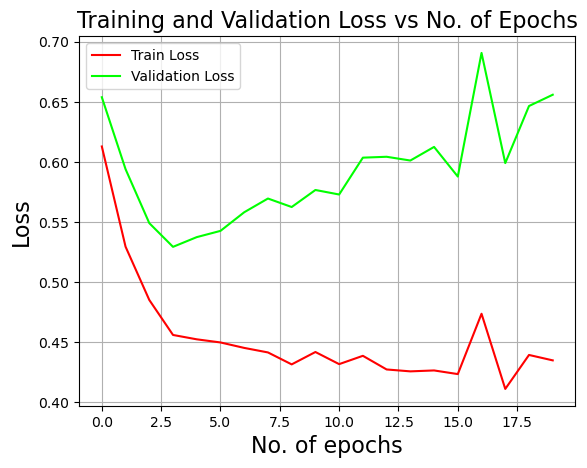

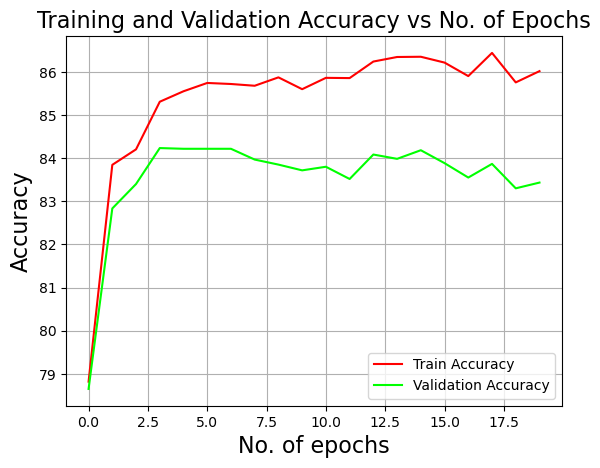

accuracy_train,▁▆▆▇▇▇▇▇▇▇▇▇██████▇█
accuracy_validation,▁▆▇██████▇▇▇████▇█▇▇
cost_validation,▆▄▂▁▁▂▂▃▂▃▃▄▄▄▅▄█▄▆▆
epochs,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss_train,█▅▄▃▂▂▂▂▂▂▂▂▂▂▂▁▃▁▂▂
accuracy_train,86.01667
accuracy_validation,83.43333
cost_validation,0.65588
epochs,19
loss_train,0.43469


wandb: Agent Starting Run: vj3ans26 with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 20
wandb: 	lambd: 0
wandb: 	learning_rate: 0.01
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.01_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_20_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_64_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.63  Train accuracy:    79.03 Val error:     0.68 Val accuracy:    78.00
 
 epoch:   2  Train error:      0.50  Train accuracy:    82.72 Val error:     0.56 Val accuracy:    81.77
 
 epoch:   4  Train error:      0.51  Train accuracy:    82.59 Val error:     0.59 Val accuracy:    81.52
 
 epoch:   6  Train error:      0.48  Train accuracy:    83.69 Val error:     0.58 Val accuracy:    81.62
 
 epoch:   8  Train error:      0.47  Train accuracy:    84.57 Val error:     0.59 Val accuracy:    82.50
 
 epoch:  10  Train error:      0.46  Train accuracy:    84.76 Val error:     0.60 Val accuracy:    82.72
 
 epoch:  12  Train error:      0.47  Train accuracy:    83.92 Val error:     0.63 Val accuracy:    81.22
 
 epoch:  14  Train error:      0.44

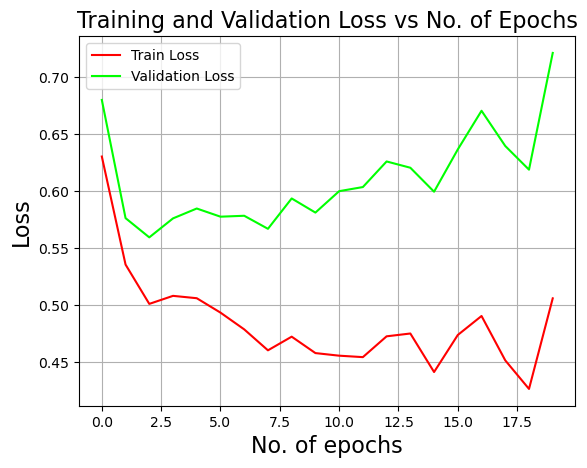

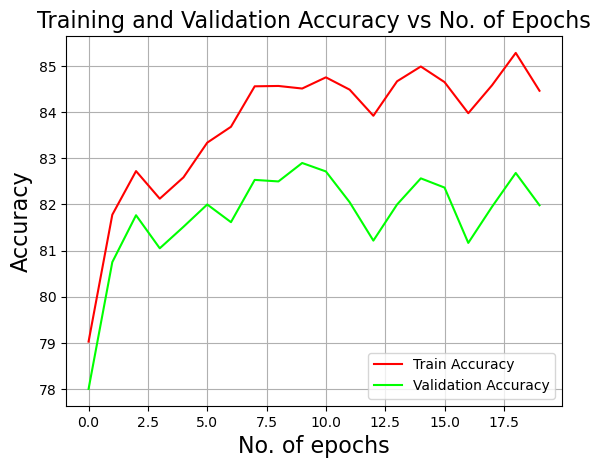

accuracy_train,▁▄▅▄▅▆▆▇▇▇▇▇▆▇█▇▇▇█▇
accuracy_validation,▁▅▆▅▆▇▆▇▇██▇▆▇█▇▆▇█▇
cost_validation,▆▂▁▂▂▂▂▁▂▂▃▃▄▄▃▄▆▄▄█
epochs,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss_train,█▅▄▄▄▃▃▂▃▂▂▂▃▃▂▃▃▂▁▄
accuracy_train,84.46667
accuracy_validation,81.98333
cost_validation,0.72152
epochs,19
loss_train,0.50625


wandb: Sweep Agent: Waiting for job.
502 response executing GraphQL.

<html><head>
<meta http-equiv="content-type" content="text/html;charset=utf-8">
<title>502 Server Error</title>
</head>
<body text=#000000 bgcolor=#ffffff>
<h1>Error: Server Error</h1>
<h2>The server encountered a temporary error and could not complete your request.<p>Please try again in 30 seconds.</h2>
<h2></h2>
</body></html>

wandb: Job received.
wandb: Agent Starting Run: jc3pqjo0 with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 20
wandb: 	lambd: 0
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 32
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_20_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_32_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 32, 10]
 
 epoch:   0  Train error:      0.56  Train accuracy:    80.93 Val error:     0.57 Val accuracy:    80.15
 
 epoch:   2  Train error:      0.45  Train accuracy:    84.37 Val error:     0.47 Val accuracy:    83.33
 
 epoch:   4  Train error:      0.42  Train accuracy:    85.37 Val error:     0.46 Val accuracy:    84.23
 
 epoch:   6  Train error:      0.40  Train accuracy:    85.96 Val error:     0.46 Val accuracy:    84.58
 
 epoch:   8  Train error:      0.39  Train accuracy:    86.40 Val error:     0.46 Val accuracy:    84.83
 
 epoch:  10  Train error:      0.37  Train accuracy:    86.75 Val error:     0.46 Val accuracy:    85.28
 
 epoch:  12  Train error:      0.37  Train accuracy:    87.06 Val error:     0.46 Val accuracy:    85.35
 
 epoch:  14  Train error:      0.

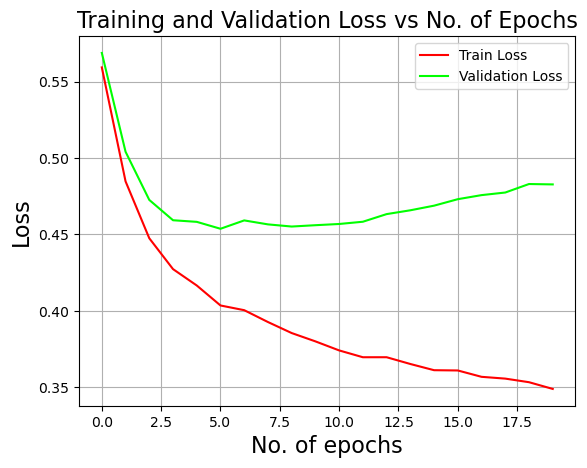

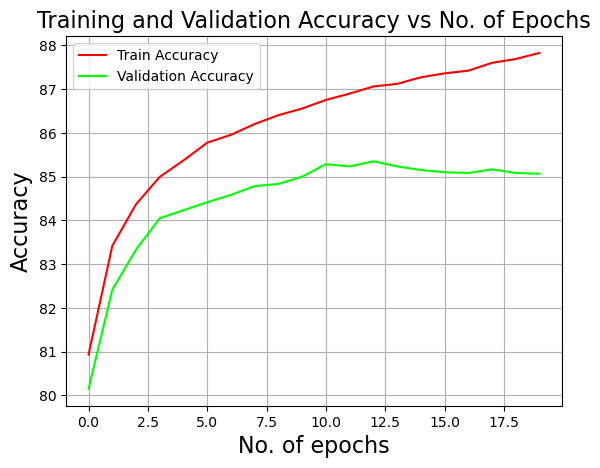

accuracy_train,▁▄▄▅▆▆▆▆▇▇▇▇▇▇▇█████
accuracy_validation,▁▄▅▆▆▇▇▇▇███████████
cost_validation,█▄▂▁▁▁▁▁▁▁▁▁▂▂▂▂▂▂▃▃
epochs,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss_train,█▆▄▄▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁
accuracy_train,87.82593
accuracy_validation,85.06667
cost_validation,0.48277
epochs,19
loss_train,0.34897


wandb: Agent Starting Run: 6uiupnsd with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 20
wandb: 	lambd: 0
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 32
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_20_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_32_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 32, 10]
 
 epoch:   0  Train error:      0.56  Train accuracy:    80.79 Val error:     0.58 Val accuracy:    79.92
 
 epoch:   2  Train error:      0.46  Train accuracy:    84.10 Val error:     0.48 Val accuracy:    83.28
 
 epoch:   4  Train error:      0.42  Train accuracy:    85.25 Val error:     0.46 Val accuracy:    83.87
 
 epoch:   6  Train error:      0.40  Train accuracy:    85.88 Val error:     0.46 Val accuracy:    84.40
 
 epoch:   8  Train error:      0.38  Train accuracy:    86.41 Val error:     0.46 Val accuracy:    84.63
 
 epoch:  10  Train error:      0.38  Train accuracy:    86.79 Val error:     0.46 Val accuracy:    85.12
 
 epoch:  12  Train error:      0.37  Train accuracy:    87.20 Val error:     0.47 Val accuracy:    85.55
 
 epoch:  14  Train error:      0.3

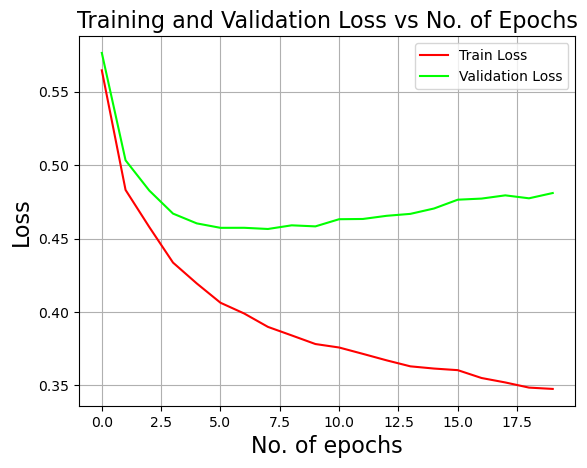

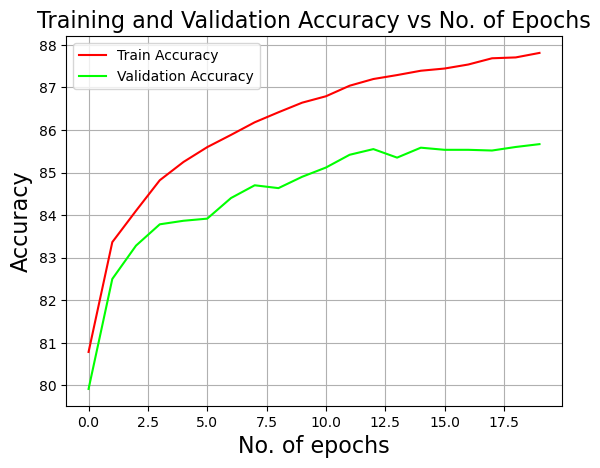

accuracy_train,▁▄▄▅▅▆▆▆▇▇▇▇▇▇██████
accuracy_validation,▁▄▅▆▆▆▆▇▇▇▇█████████
cost_validation,█▄▃▂▁▁▁▁▁▁▁▁▂▂▂▂▂▂▂▂
epochs,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss_train,█▅▅▄▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁
accuracy_train,87.80926
accuracy_validation,85.66667
cost_validation,0.48098
epochs,19
loss_train,0.34755


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: g6ml0s64 with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 20
wandb: 	lambd: 0
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_20_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_64_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.55  Train accuracy:    81.24 Val error:     0.59 Val accuracy:    79.80
 
 epoch:   2  Train error:      0.40  Train accuracy:    85.55 Val error:     0.46 Val accuracy:    84.15
 
 epoch:   4  Train error:      0.37  Train accuracy:    86.84 Val error:     0.44 Val accuracy:    84.93
 
 epoch:   6  Train error:      0.34  Train accuracy:    87.79 Val error:     0.43 Val accuracy:    85.35
 
 epoch:   8  Train error:      0.33  Train accuracy:    88.23 Val error:     0.43 Val accuracy:    85.48
 
 epoch:  10  Train error:      0.32  Train accuracy:    88.59 Val error:     0.43 Val accuracy:    85.62
 
 epoch:  12  Train error:      0.31  Train accuracy:    89.04 Val error:     0.44 Val accuracy:    86.23
 
 epoch:  14  Train error:      0.3

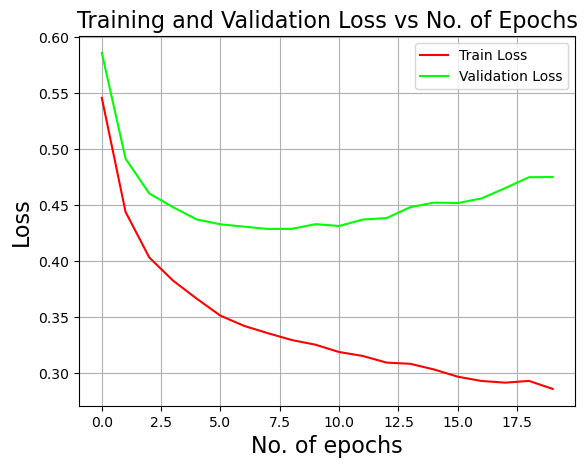

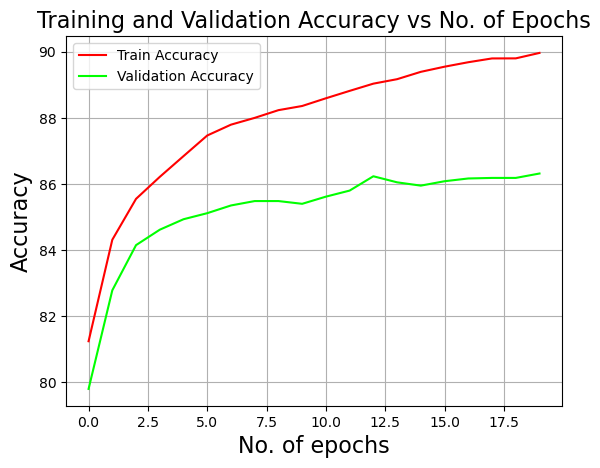

accuracy_train,▁▃▄▅▅▆▆▆▇▇▇▇▇▇██████
accuracy_validation,▁▄▆▆▇▇▇▇▇▇▇▇████████
cost_validation,█▄▂▂▁▁▁▁▁▁▁▁▁▂▂▂▂▃▃▃
epochs,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss_train,█▅▄▄▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁
accuracy_train,89.96481
accuracy_validation,86.31667
cost_validation,0.4749
epochs,19
loss_train,0.28575


wandb: Agent Starting Run: lfqhs9n3 with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 20
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.01
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 32
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.01_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_20_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_32_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 32, 10]
 
 epoch:   0  Train error:      0.61  Train accuracy:    78.18 Val error:     0.62 Val accuracy:    76.88
 
 epoch:   2  Train error:      0.54  Train accuracy:    80.53 Val error:     0.57 Val accuracy:    79.02
 
 epoch:   4  Train error:      0.50  Train accuracy:    82.18 Val error:     0.52 Val accuracy:    80.82
 
 epoch:   6  Train error:      0.49  Train accuracy:    82.43 Val error:     0.52 Val accuracy:    80.83
 
 epoch:   8  Train error:      0.54  Train accuracy:    81.05 Val error:     0.58 Val accuracy:    79.63
 
 epoch:  10  Train error:      0.50  Train accuracy:    82.10 Val error:     0.52 Val accuracy:    80.77
 
 epoch:  12  Train error:      0.52  Train accuracy:    81.42 Val error:     0.56 Val accuracy:    80.00
 
 epoch:  14  Train error:     

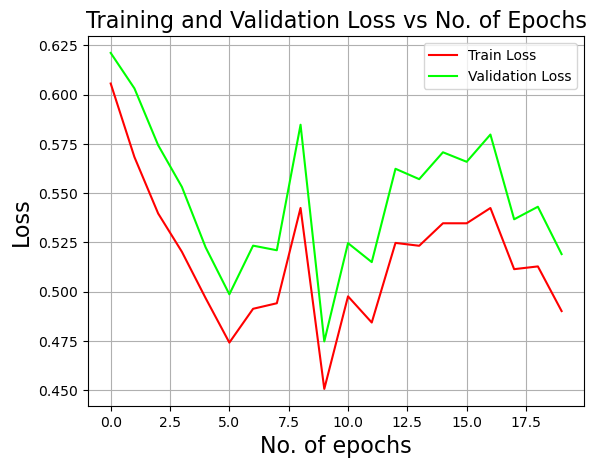

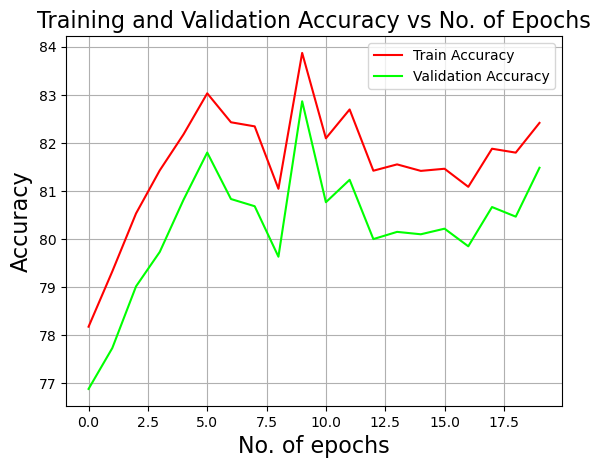

accuracy_train,▁▂▄▅▆▇▆▆▅█▆▇▅▅▅▅▅▆▅▆
accuracy_validation,▁▂▃▄▆▇▆▅▄█▆▆▅▅▅▅▄▅▅▆
cost_validation,█▇▆▅▃▂▃▃▆▁▃▃▅▅▆▅▆▄▄▃
epochs,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss_train,█▆▅▄▃▂▃▃▅▁▃▃▄▄▅▅▅▄▄▃
accuracy_train,82.41667
accuracy_validation,81.48333
cost_validation,0.51907
epochs,19
loss_train,0.49017


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: izlx5u7i with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 20
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.01
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 32
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.01_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_20_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_32_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 32, 10]
 
 epoch:   0  Train error:      0.68  Train accuracy:    75.91 Val error:     0.72 Val accuracy:    74.60
 
 epoch:   2  Train error:      0.64  Train accuracy:    77.56 Val error:     0.68 Val accuracy:    75.88
 
 epoch:   4  Train error:      0.60  Train accuracy:    78.61 Val error:     0.64 Val accuracy:    77.48
 
 epoch:   6  Train error:      0.57  Train accuracy:    79.37 Val error:     0.60 Val accuracy:    78.62
 
 epoch:   8  Train error:      0.63  Train accuracy:    78.26 Val error:     0.68 Val accuracy:    77.42
 
 epoch:  10  Train error:      0.64  Train accuracy:    77.39 Val error:     0.68 Val accuracy:    76.17
 
 epoch:  12  Train error:      0.60  Train accuracy:    78.58 Val error:     0.64 Val accuracy:    77.57
 
 epoch:  14  Train error:      

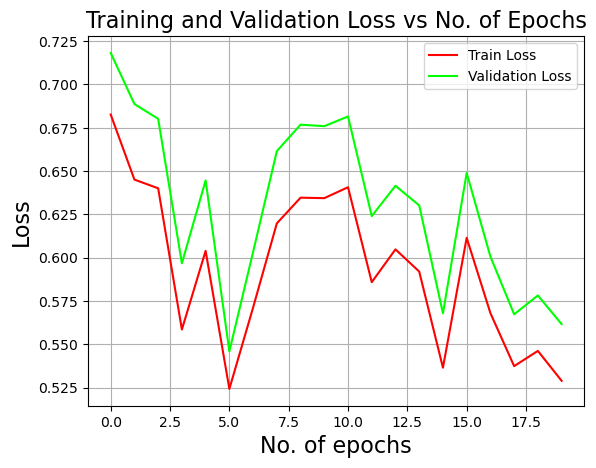

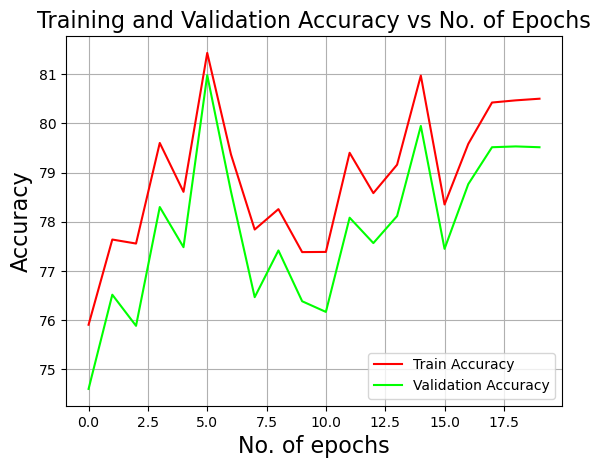

accuracy_train,▁▃▃▆▄█▅▃▄▃▃▅▄▅▇▄▆▇▇▇
accuracy_validation,▁▃▂▅▄█▅▃▄▃▃▅▄▅▇▄▆▆▆▆
cost_validation,█▇▆▃▅▁▃▆▆▆▇▄▅▄▂▅▃▂▂▂
epochs,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss_train,█▆▆▃▅▁▃▅▆▆▆▄▅▄▂▅▃▂▂▁
accuracy_train,80.5037
accuracy_validation,79.51667
cost_validation,0.56171
epochs,19
loss_train,0.52902


wandb: Agent Starting Run: dkgohwyo with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 20
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.01
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.01_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_20_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_64_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.69  Train accuracy:    75.71 Val error:     0.72 Val accuracy:    74.02
 
 epoch:   2  Train error:      0.54  Train accuracy:    80.19 Val error:     0.56 Val accuracy:    79.17
 
 epoch:   4  Train error:      0.58  Train accuracy:    78.91 Val error:     0.61 Val accuracy:    77.85
 
 epoch:   6  Train error:      0.54  Train accuracy:    80.64 Val error:     0.57 Val accuracy:    79.72
 
 epoch:   8  Train error:      0.55  Train accuracy:    80.48 Val error:     0.58 Val accuracy:    79.02
 
 epoch:  10  Train error:      0.58  Train accuracy:    79.29 Val error:     0.62 Val accuracy:    78.52
 
 epoch:  12  Train error:      0.57  Train accuracy:    80.16 Val error:     0.60 Val accuracy:    79.03
 
 epoch:  14  Train error:     

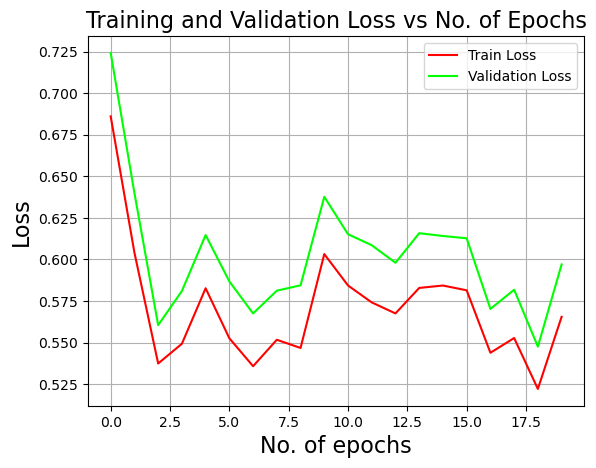

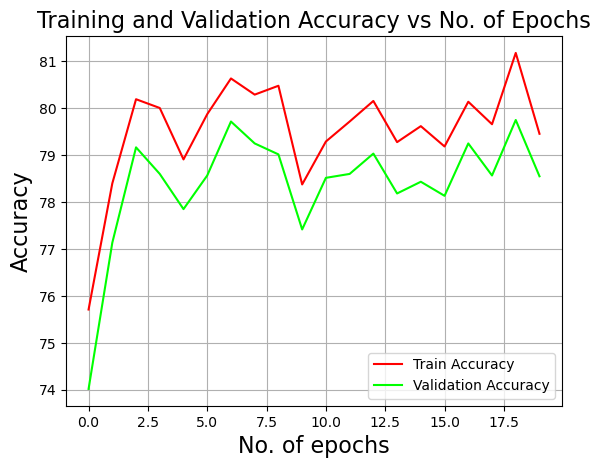

accuracy_train,▁▄▇▆▅▆▇▇▇▄▆▆▇▆▆▅▇▆█▆
accuracy_validation,▁▅▇▇▆▇█▇▇▅▆▇▇▆▆▆▇▇█▇
cost_validation,█▅▂▂▄▃▂▂▂▅▄▃▃▄▄▄▂▂▁▃
epochs,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss_train,█▅▂▂▄▂▂▂▂▄▄▃▃▄▄▄▂▂▁▃
accuracy_train,79.45556
accuracy_validation,78.55
cost_validation,0.59703
epochs,19
loss_train,0.56554


wandb: Agent Starting Run: 7b3nqvvv with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 20
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.01
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.01_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_20_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_64_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.65  Train accuracy:    77.21 Val error:     0.68 Val accuracy:    75.80
 
 epoch:   2  Train error:      0.59  Train accuracy:    79.04 Val error:     0.63 Val accuracy:    77.83
 
 epoch:   4  Train error:      0.55  Train accuracy:    80.07 Val error:     0.59 Val accuracy:    79.23
 
 epoch:   6  Train error:      0.50  Train accuracy:    82.26 Val error:     0.52 Val accuracy:    81.43
 
 epoch:   8  Train error:      0.56  Train accuracy:    79.52 Val error:     0.59 Val accuracy:    78.55
 
 epoch:  10  Train error:      0.56  Train accuracy:    79.63 Val error:     0.60 Val accuracy:    78.78
 
 epoch:  12  Train error:      0.53  Train accuracy:    80.82 Val error:     0.54 Val accuracy:    80.12
 
 epoch:  14  Train error:      

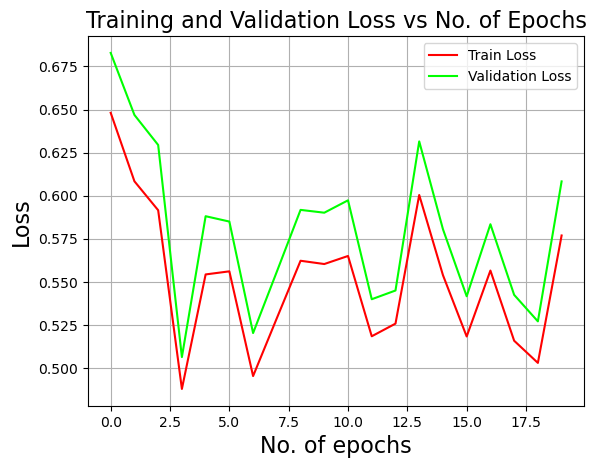

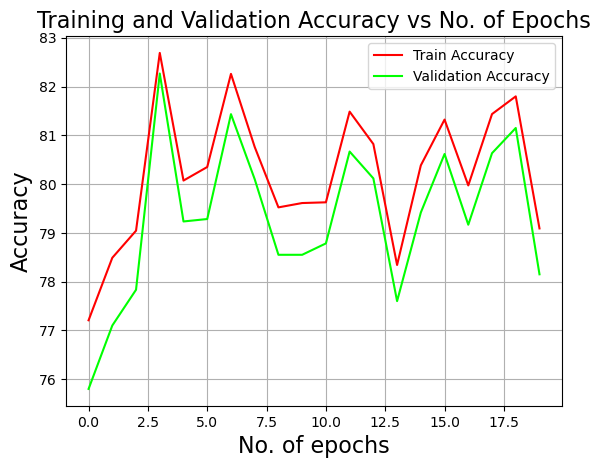

accuracy_train,▁▃▃█▅▅▇▆▄▄▄▆▆▂▅▆▅▆▇▃
accuracy_validation,▁▂▃█▅▅▇▆▄▄▄▆▆▃▅▆▅▆▇▄
cost_validation,█▇▆▁▄▄▂▃▄▄▅▂▃▆▄▂▄▂▂▅
epochs,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss_train,█▆▆▁▄▄▁▃▄▄▄▂▃▆▄▂▄▂▂▅
accuracy_train,79.09074
accuracy_validation,78.15
cost_validation,0.60829
epochs,19
loss_train,0.57689


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: dns937cn with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 20
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 32
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_20_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_32_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 32, 10]
 
 epoch:   0  Train error:      0.49  Train accuracy:    82.55 Val error:     0.51 Val accuracy:    81.30
 
 epoch:   2  Train error:      0.39  Train accuracy:    85.95 Val error:     0.42 Val accuracy:    84.60
 
 epoch:   4  Train error:      0.36  Train accuracy:    86.88 Val error:     0.40 Val accuracy:    85.55
 
 epoch:   6  Train error:      0.35  Train accuracy:    87.37 Val error:     0.39 Val accuracy:    85.97
 
 epoch:   8  Train error:      0.34  Train accuracy:    87.71 Val error:     0.39 Val accuracy:    86.27
 
 epoch:  10  Train error:      0.33  Train accuracy:    87.92 Val error:     0.39 Val accuracy:    85.87
 
 epoch:  12  Train error:      0.32  Train accuracy:    88.35 Val error:     0.38 Val accuracy:    86.23
 
 epoch:  14  Train error:    

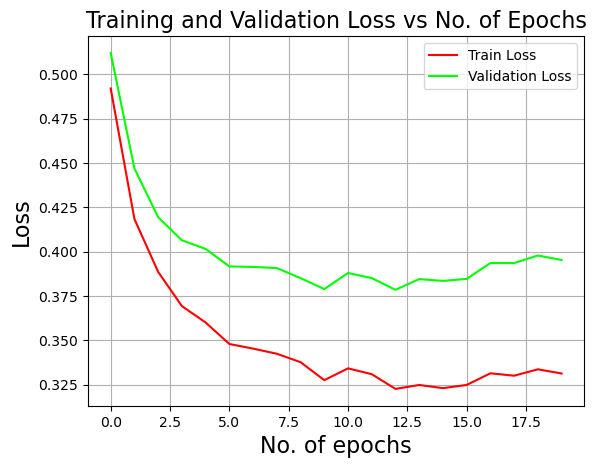

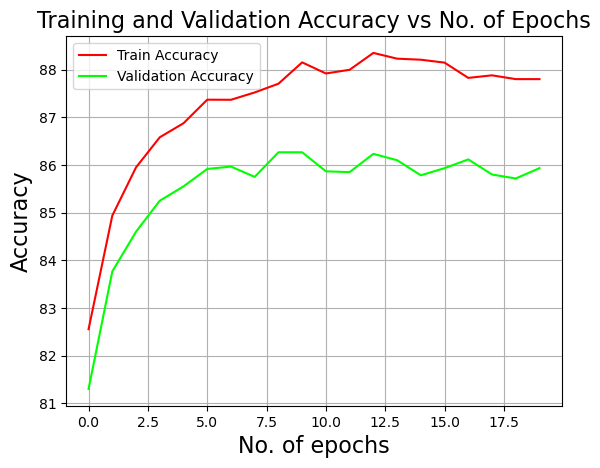

accuracy_train,▁▄▅▆▆▇▇▇▇█▇█████▇▇▇▇
accuracy_validation,▁▄▆▇▇██▇██▇▇██▇██▇▇█
cost_validation,█▅▃▂▂▂▂▂▁▁▁▁▁▁▁▁▂▂▂▂
epochs,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss_train,█▅▄▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
accuracy_train,87.80185
accuracy_validation,85.93333
cost_validation,0.39532
epochs,19
loss_train,0.33127


wandb: Agent Starting Run: gw59wz9w with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 20
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 32
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_20_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_32_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 32, 10]
 
 epoch:   0  Train error:      0.52  Train accuracy:    81.76 Val error:     0.54 Val accuracy:    80.85
 
 epoch:   2  Train error:      0.40  Train accuracy:    85.74 Val error:     0.43 Val accuracy:    84.73
 
 epoch:   4  Train error:      0.37  Train accuracy:    86.64 Val error:     0.41 Val accuracy:    85.70
 
 epoch:   6  Train error:      0.37  Train accuracy:    86.72 Val error:     0.41 Val accuracy:    85.42
 
 epoch:   8  Train error:      0.36  Train accuracy:    86.81 Val error:     0.41 Val accuracy:    85.22
 
 epoch:  10  Train error:      0.37  Train accuracy:    86.66 Val error:     0.42 Val accuracy:    84.75
 
 epoch:  12  Train error:      0.36  Train accuracy:    86.81 Val error:     0.42 Val accuracy:    84.95
 
 epoch:  14  Train error:     

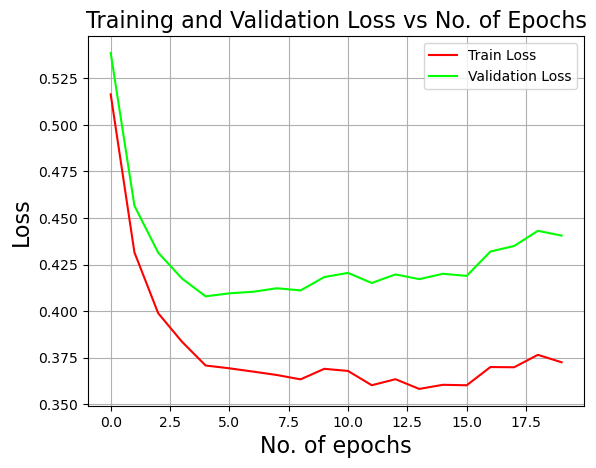

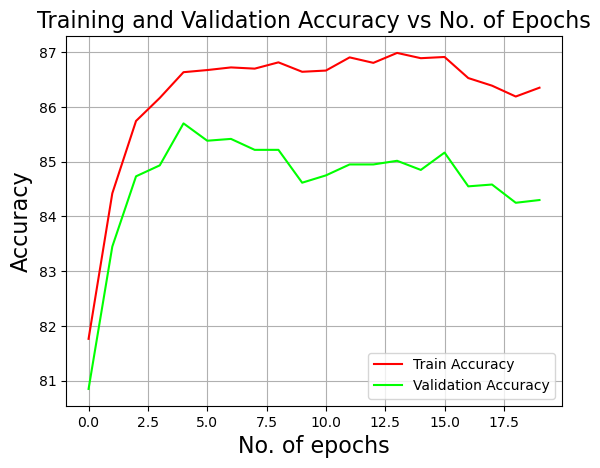

accuracy_train,▁▅▆▇████████████▇▇▇▇
accuracy_validation,▁▅▇▇███▇▇▆▇▇▇▇▇▇▆▆▆▆
cost_validation,█▄▂▂▁▁▁▁▁▂▂▁▂▁▂▂▂▂▃▃
epochs,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss_train,█▄▃▂▂▁▁▁▁▁▁▁▁▁▁▁▂▂▂▂
accuracy_train,86.35185
accuracy_validation,84.3
cost_validation,0.44054
epochs,19
loss_train,0.37249


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: n1ekctkk with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 20
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_20_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_64_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.51  Train accuracy:    81.76 Val error:     0.55 Val accuracy:    80.25
 
 epoch:   2  Train error:      0.38  Train accuracy:    86.20 Val error:     0.42 Val accuracy:    84.45
 
 epoch:   4  Train error:      0.36  Train accuracy:    86.91 Val error:     0.40 Val accuracy:    85.23
 
 epoch:   6  Train error:      0.34  Train accuracy:    87.45 Val error:     0.39 Val accuracy:    85.57
 
 epoch:   8  Train error:      0.33  Train accuracy:    87.94 Val error:     0.39 Val accuracy:    85.90
 
 epoch:  10  Train error:      0.34  Train accuracy:    87.62 Val error:     0.41 Val accuracy:    85.40
 
 epoch:  12  Train error:      0.32  Train accuracy:    88.16 Val error:     0.40 Val accuracy:    86.00
 
 epoch:  14  Train error:    

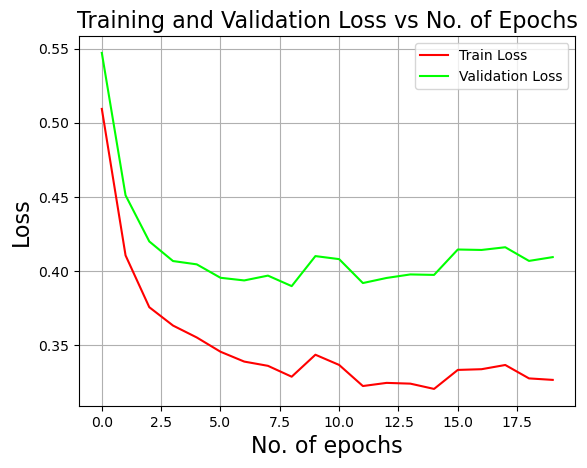

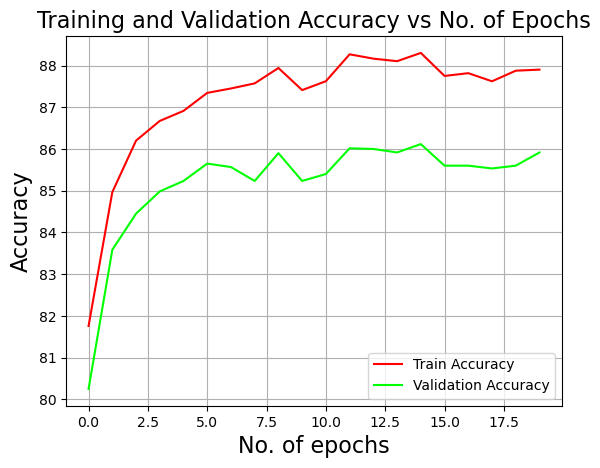

accuracy_train,▁▄▆▆▇▇▇▇█▇▇████▇▇▇██
accuracy_validation,▁▅▆▇▇▇▇▇█▇▇████▇▇▇▇█
cost_validation,█▄▂▂▂▁▁▁▁▂▂▁▁▁▁▂▂▂▂▂
epochs,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss_train,█▄▃▃▂▂▂▂▁▂▂▁▁▁▁▁▁▂▁▁
accuracy_train,87.90185
accuracy_validation,85.91667
cost_validation,0.4093
epochs,19
loss_train,0.32647


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 2ezj7352 with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 20
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_20_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_64_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.52  Train accuracy:    81.69 Val error:     0.56 Val accuracy:    80.58
 
 epoch:   2  Train error:      0.39  Train accuracy:    85.77 Val error:     0.43 Val accuracy:    84.10
 
 epoch:   4  Train error:      0.35  Train accuracy:    87.40 Val error:     0.40 Val accuracy:    85.50
 
 epoch:   6  Train error:      0.35  Train accuracy:    87.18 Val error:     0.41 Val accuracy:    85.18
 
 epoch:   8  Train error:      0.34  Train accuracy:    87.68 Val error:     0.40 Val accuracy:    85.52
 
 epoch:  10  Train error:      0.34  Train accuracy:    87.61 Val error:     0.41 Val accuracy:    85.48
 
 epoch:  12  Train error:      0.32  Train accuracy:    88.18 Val error:     0.39 Val accuracy:    85.77
 
 epoch:  14  Train error:     

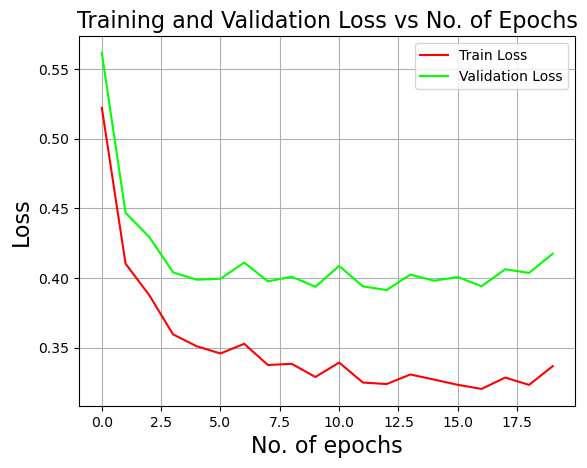

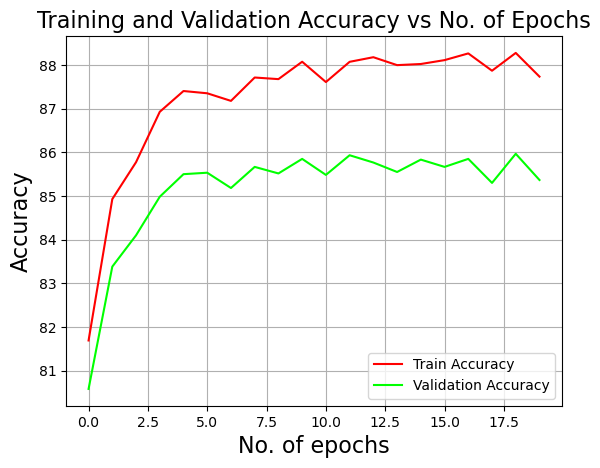

accuracy_train,▁▄▅▇▇▇▇▇▇█▇████████▇
accuracy_validation,▁▅▆▇▇▇▇█▇█▇██▇███▇█▇
cost_validation,█▃▃▂▁▁▂▁▁▁▂▁▁▁▁▁▁▂▂▂
epochs,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss_train,█▄▃▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▂
accuracy_train,87.73333
accuracy_validation,85.36667
cost_validation,0.4175
epochs,19
loss_train,0.33678


wandb: Agent Starting Run: jyqa50aj with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 16
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 10
wandb: 	lambd: 0
wandb: 	learning_rate: 0.01
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 32
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.01_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_10_num_hid_1_loss_cross_entropy_function_batchsize_16_neur_32_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 32, 10]
 
 epoch:   0  Train error:      0.51  Train accuracy:    81.69 Val error:     0.54 Val accuracy:    81.18
 
 epoch:   1  Train error:      0.47  Train accuracy:    83.12 Val error:     0.52 Val accuracy:    82.30
 
 epoch:   2  Train error:      0.44  Train accuracy:    84.04 Val error:     0.51 Val accuracy:    82.88
 
 epoch:   3  Train error:      0.44  Train accuracy:    84.43 Val error:     0.51 Val accuracy:    82.98
 
 epoch:   4  Train error:      0.43  Train accuracy:    84.69 Val error:     0.50 Val accuracy:    83.30
 
 epoch:   5  Train error:      0.41  Train accuracy:    85.29 Val error:     0.49 Val accuracy:    83.53
 
 epoch:   6  Train error:      0.40  Train accuracy:    85.38 Val error:     0.49 Val accuracy:    83.90
 
 epoch:   7  Train error:      0.

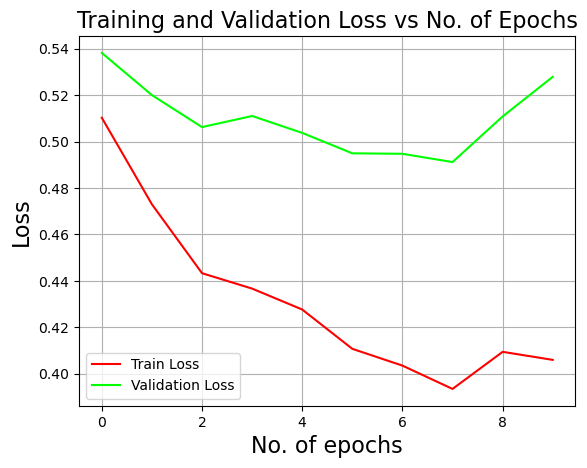

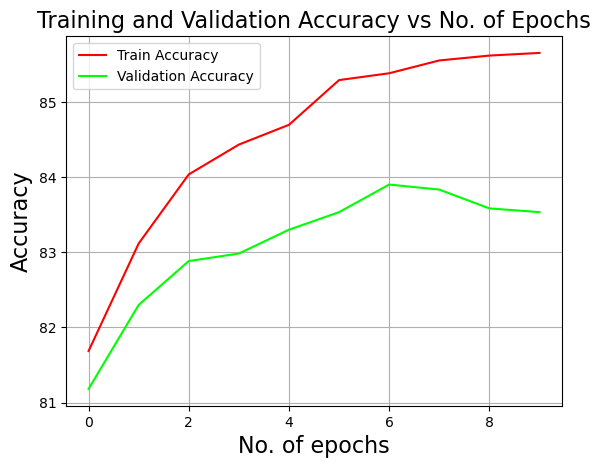

accuracy_train,▁▄▅▆▆▇████
accuracy_validation,▁▄▅▆▆▇██▇▇
cost_validation,█▅▃▄▃▂▂▁▄▆
epochs,▁▂▃▃▄▅▆▆▇█
loss_train,█▆▄▄▃▂▂▁▂▂
accuracy_train,85.65
accuracy_validation,83.53333
cost_validation,0.52788
epochs,9
loss_train,0.40598


wandb: Agent Starting Run: 6sknam92 with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 16
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 10
wandb: 	lambd: 0
wandb: 	learning_rate: 0.01
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 32
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.01_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_10_num_hid_1_loss_cross_entropy_function_batchsize_16_neur_32_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 32, 10]
 
 epoch:   0  Train error:      0.57  Train accuracy:    80.23 Val error:     0.59 Val accuracy:    78.93
 
 epoch:   1  Train error:      0.51  Train accuracy:    82.41 Val error:     0.55 Val accuracy:    81.25
 
 epoch:   2  Train error:      0.46  Train accuracy:    83.83 Val error:     0.51 Val accuracy:    82.80
 
 epoch:   3  Train error:      0.44  Train accuracy:    84.52 Val error:     0.49 Val accuracy:    83.55
 
 epoch:   4  Train error:      0.47  Train accuracy:    84.53 Val error:     0.53 Val accuracy:    83.62
 
 epoch:   5  Train error:      0.42  Train accuracy:    85.13 Val error:     0.48 Val accuracy:    84.08
 
 epoch:   6  Train error:      0.42  Train accuracy:    85.51 Val error:     0.49 Val accuracy:    84.25
 
 epoch:   7  Train error:      0.4

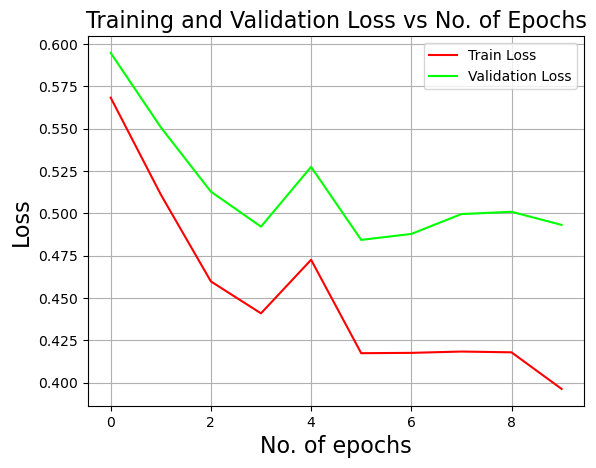

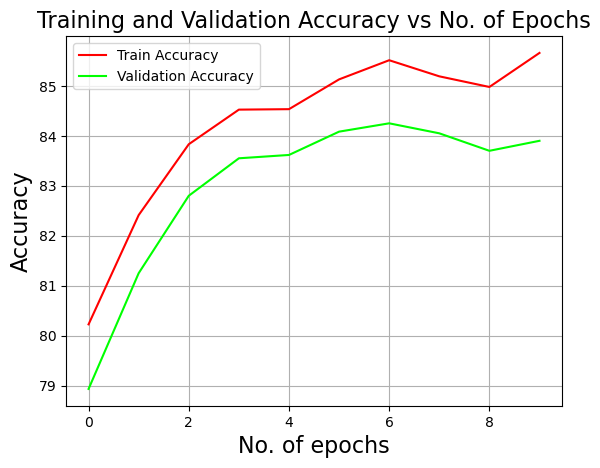

accuracy_train,▁▄▆▇▇▇█▇▇█
accuracy_validation,▁▄▆▇▇███▇█
cost_validation,█▅▃▁▄▁▁▂▂▂
epochs,▁▂▃▃▄▅▆▆▇█
loss_train,█▆▄▃▄▂▂▂▂▁
accuracy_train,85.65926
accuracy_validation,83.9
cost_validation,0.49315
epochs,9
loss_train,0.3963


wandb: Agent Starting Run: yqtejf24 with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 16
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 10
wandb: 	lambd: 0
wandb: 	learning_rate: 0.01
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.01_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_10_num_hid_1_loss_cross_entropy_function_batchsize_16_neur_64_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.52  Train accuracy:    82.25 Val error:     0.55 Val accuracy:    81.38
 
 epoch:   1  Train error:      0.49  Train accuracy:    83.16 Val error:     0.55 Val accuracy:    82.57
 
 epoch:   2  Train error:      0.46  Train accuracy:    83.87 Val error:     0.53 Val accuracy:    82.82
 
 epoch:   3  Train error:      0.45  Train accuracy:    84.32 Val error:     0.53 Val accuracy:    83.15
 
 epoch:   4  Train error:      0.42  Train accuracy:    85.17 Val error:     0.50 Val accuracy:    84.08
 
 epoch:   5  Train error:      0.43  Train accuracy:    85.01 Val error:     0.53 Val accuracy:    83.52
 
 epoch:   6  Train error:      0.44  Train accuracy:    85.65 Val error:     0.54 Val accuracy:    84.10
 
 epoch:   7  Train error:      0.

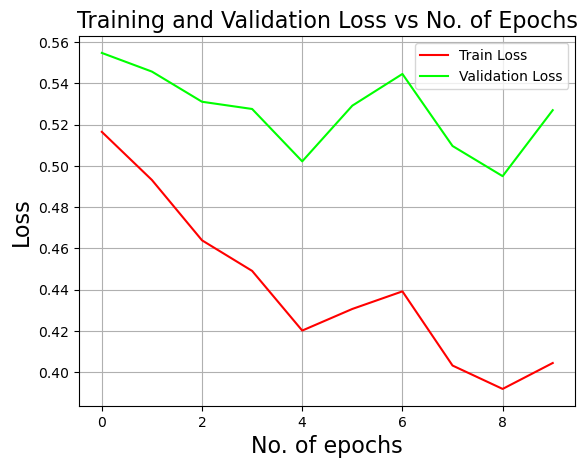

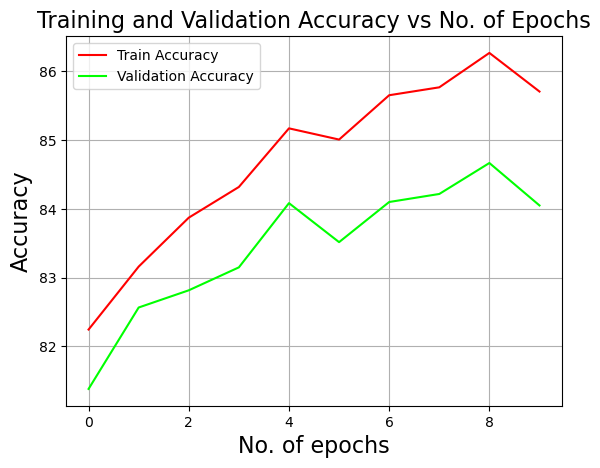

accuracy_train,▁▃▄▅▆▆▇▇█▇
accuracy_validation,▁▄▄▅▇▆▇▇█▇
cost_validation,█▇▅▅▂▅▇▃▁▅
epochs,▁▂▃▃▄▅▆▆▇█
loss_train,█▇▅▄▃▃▄▂▁▂
accuracy_train,85.70556
accuracy_validation,84.05
cost_validation,0.52702
epochs,9
loss_train,0.40448


wandb: Agent Starting Run: ypshkfm8 with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 16
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 10
wandb: 	lambd: 0
wandb: 	learning_rate: 0.01
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.01_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_10_num_hid_1_loss_cross_entropy_function_batchsize_16_neur_64_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.55  Train accuracy:    81.55 Val error:     0.59 Val accuracy:    80.33
 
 epoch:   1  Train error:      0.52  Train accuracy:    82.35 Val error:     0.56 Val accuracy:    81.40
 
 epoch:   2  Train error:      0.45  Train accuracy:    84.64 Val error:     0.49 Val accuracy:    83.57
 
 epoch:   3  Train error:      0.44  Train accuracy:    85.08 Val error:     0.49 Val accuracy:    83.87
 
 epoch:   4  Train error:      0.42  Train accuracy:    85.46 Val error:     0.48 Val accuracy:    84.53
 
 epoch:   5  Train error:      0.42  Train accuracy:    85.81 Val error:     0.49 Val accuracy:    84.78
 
 epoch:   6  Train error:      0.41  Train accuracy:    85.78 Val error:     0.50 Val accuracy:    84.67
 
 epoch:   7  Train error:      0.4

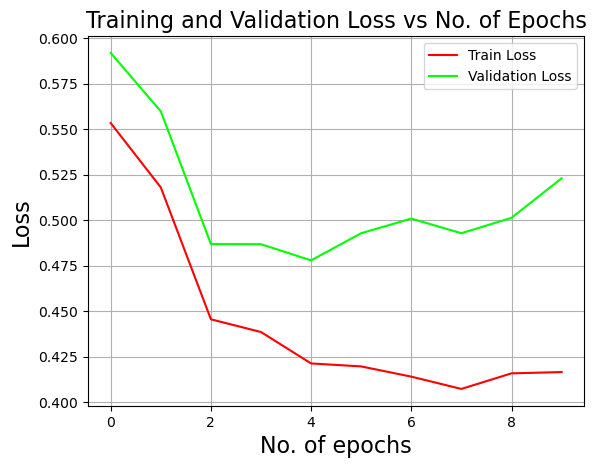

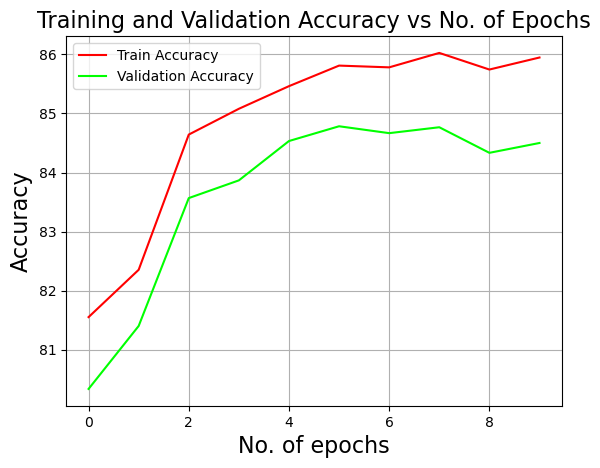

accuracy_train,▁▂▆▇▇█████
accuracy_validation,▁▃▆▇████▇█
cost_validation,█▆▂▂▁▂▂▂▂▄
epochs,▁▂▃▃▄▅▆▆▇█
loss_train,█▆▃▂▂▂▁▁▁▁
accuracy_train,85.94815
accuracy_validation,84.5
cost_validation,0.52303
epochs,9
loss_train,0.41654


wandb: Agent Starting Run: ygere29t with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 16
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 10
wandb: 	lambd: 0
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 32
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_10_num_hid_1_loss_cross_entropy_function_batchsize_16_neur_32_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 32, 10]
 
 epoch:   0  Train error:      0.60  Train accuracy:    78.18 Val error:     0.62 Val accuracy:    77.82
 
 epoch:   1  Train error:      0.51  Train accuracy:    82.11 Val error:     0.53 Val accuracy:    80.92
 
 epoch:   2  Train error:      0.46  Train accuracy:    83.72 Val error:     0.49 Val accuracy:    82.27
 
 epoch:   3  Train error:      0.44  Train accuracy:    84.47 Val error:     0.47 Val accuracy:    83.28
 
 epoch:   4  Train error:      0.42  Train accuracy:    84.99 Val error:     0.45 Val accuracy:    84.18
 
 epoch:   5  Train error:      0.41  Train accuracy:    85.37 Val error:     0.44 Val accuracy:    84.40
 
 epoch:   6  Train error:      0.40  Train accuracy:    85.70 Val error:     0.43 Val accuracy:    84.72
 
 epoch:   7  Train error:      0

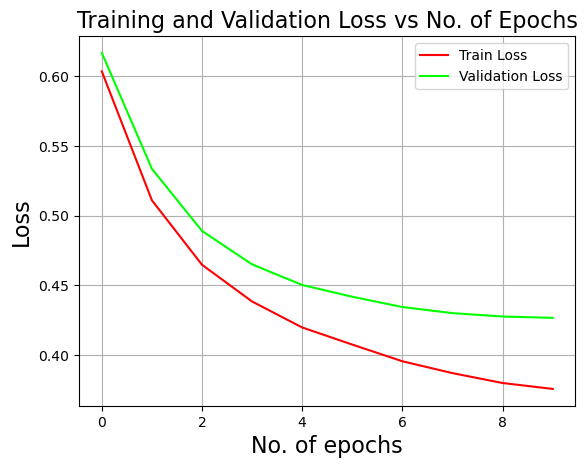

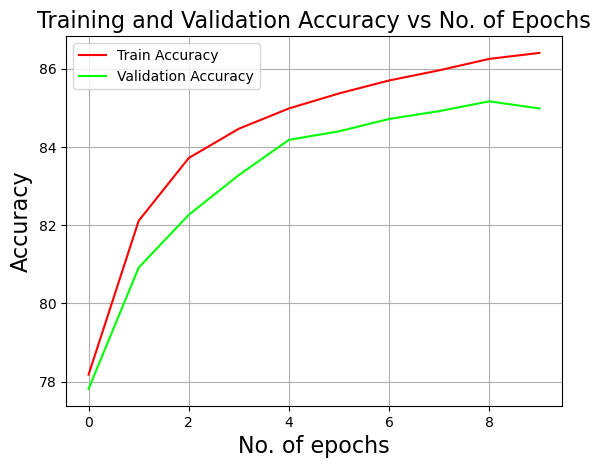

accuracy_train,▁▄▆▆▇▇▇███
accuracy_validation,▁▄▅▆▇▇████
cost_validation,█▅▃▂▂▂▁▁▁▁
epochs,▁▂▃▃▄▅▆▆▇█
loss_train,█▅▄▃▂▂▂▁▁▁
accuracy_train,86.4037
accuracy_validation,84.98333
cost_validation,0.42668
epochs,9
loss_train,0.37572


wandb: Agent Starting Run: abq7gixc with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 16
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 10
wandb: 	lambd: 0
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 32
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_10_num_hid_1_loss_cross_entropy_function_batchsize_16_neur_32_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 32, 10]
 
 epoch:   0  Train error:      0.61  Train accuracy:    78.17 Val error:     0.62 Val accuracy:    77.67
 
 epoch:   1  Train error:      0.51  Train accuracy:    82.18 Val error:     0.53 Val accuracy:    81.08
 
 epoch:   2  Train error:      0.46  Train accuracy:    83.71 Val error:     0.49 Val accuracy:    82.33
 
 epoch:   3  Train error:      0.44  Train accuracy:    84.44 Val error:     0.46 Val accuracy:    83.37
 
 epoch:   4  Train error:      0.42  Train accuracy:    85.00 Val error:     0.45 Val accuracy:    83.95
 
 epoch:   5  Train error:      0.40  Train accuracy:    85.40 Val error:     0.44 Val accuracy:    84.45
 
 epoch:   6  Train error:      0.39  Train accuracy:    85.72 Val error:     0.43 Val accuracy:    84.77
 
 epoch:   7  Train error:      0.

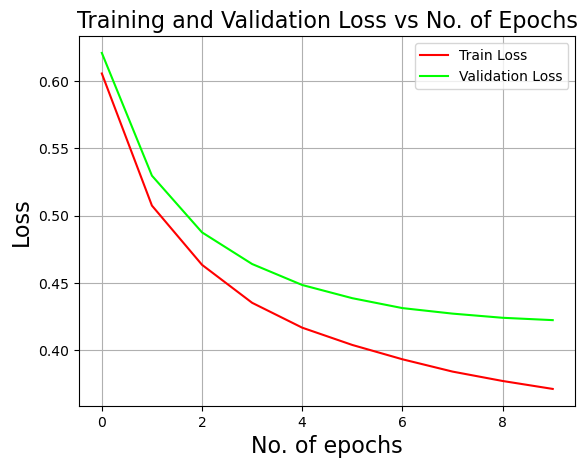

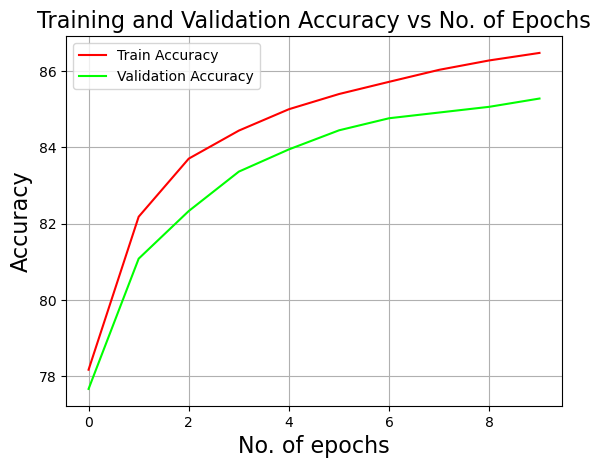

accuracy_train,▁▄▆▆▇▇▇███
accuracy_validation,▁▄▅▆▇▇████
cost_validation,█▅▃▂▂▂▁▁▁▁
epochs,▁▂▃▃▄▅▆▆▇█
loss_train,█▅▄▃▂▂▂▁▁▁
accuracy_train,86.47963
accuracy_validation,85.28333
cost_validation,0.42223
epochs,9
loss_train,0.37107


wandb: Agent Starting Run: e3i34edu with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 16
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 10
wandb: 	lambd: 0
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_10_num_hid_1_loss_cross_entropy_function_batchsize_16_neur_64_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.59  Train accuracy:    80.49 Val error:     0.62 Val accuracy:    79.35
 
 epoch:   1  Train error:      0.46  Train accuracy:    83.85 Val error:     0.50 Val accuracy:    82.67
 
 epoch:   2  Train error:      0.41  Train accuracy:    85.28 Val error:     0.46 Val accuracy:    83.92
 
 epoch:   3  Train error:      0.38  Train accuracy:    86.17 Val error:     0.44 Val accuracy:    84.73
 
 epoch:   4  Train error:      0.37  Train accuracy:    86.80 Val error:     0.43 Val accuracy:    84.92
 
 epoch:   5  Train error:      0.35  Train accuracy:    87.20 Val error:     0.43 Val accuracy:    85.33
 
 epoch:   6  Train error:      0.34  Train accuracy:    87.61 Val error:     0.43 Val accuracy:    85.47
 
 epoch:   7  Train error:      0

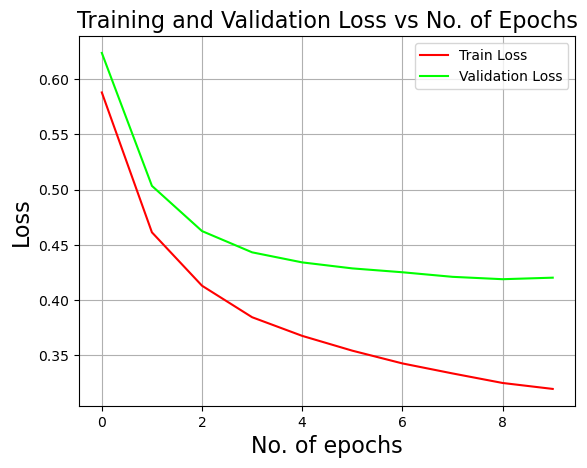

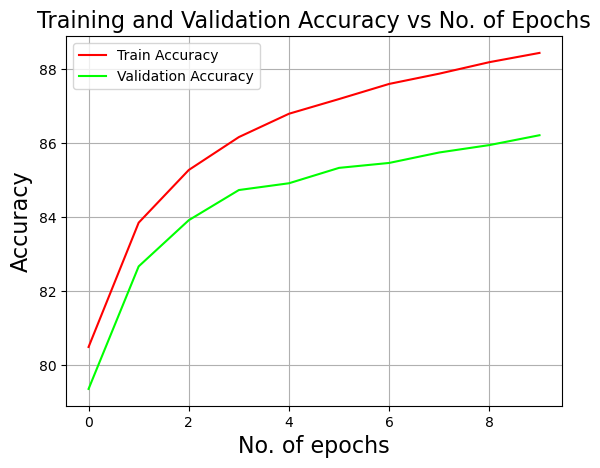

accuracy_train,▁▄▅▆▇▇▇███
accuracy_validation,▁▄▆▆▇▇▇███
cost_validation,█▄▂▂▂▁▁▁▁▁
epochs,▁▂▃▃▄▅▆▆▇█
loss_train,█▅▃▃▂▂▂▁▁▁
accuracy_train,88.44444
accuracy_validation,86.21667
cost_validation,0.42036
epochs,9
loss_train,0.31968


wandb: Agent Starting Run: lc6k5ghj with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 16
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 10
wandb: 	lambd: 0
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_10_num_hid_1_loss_cross_entropy_function_batchsize_16_neur_64_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.58  Train accuracy:    80.93 Val error:     0.61 Val accuracy:    79.75
 
 epoch:   1  Train error:      0.46  Train accuracy:    84.08 Val error:     0.50 Val accuracy:    82.78
 
 epoch:   2  Train error:      0.41  Train accuracy:    85.42 Val error:     0.46 Val accuracy:    83.93
 
 epoch:   3  Train error:      0.39  Train accuracy:    86.18 Val error:     0.45 Val accuracy:    84.53
 
 epoch:   4  Train error:      0.37  Train accuracy:    86.83 Val error:     0.44 Val accuracy:    85.15
 
 epoch:   5  Train error:      0.35  Train accuracy:    87.34 Val error:     0.43 Val accuracy:    85.53
 
 epoch:   6  Train error:      0.34  Train accuracy:    87.67 Val error:     0.43 Val accuracy:    85.52
 
 epoch:   7  Train error:      0.

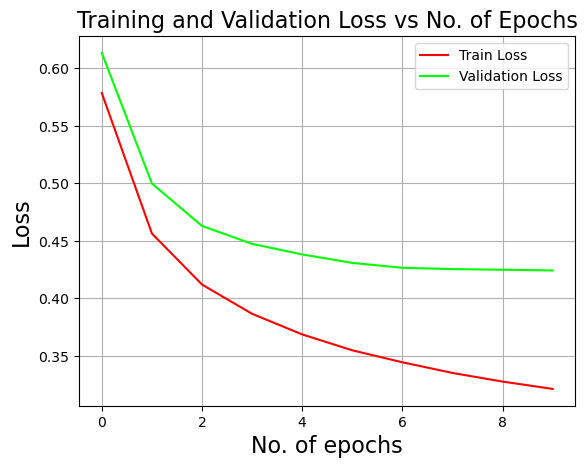

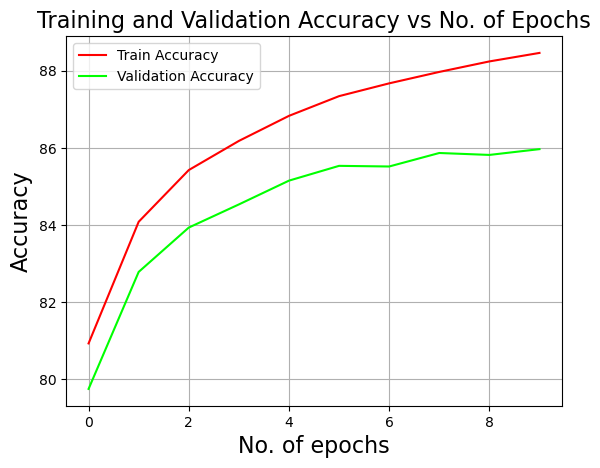

accuracy_train,▁▄▅▆▆▇▇███
accuracy_validation,▁▄▆▆▇█▇███
cost_validation,█▄▂▂▂▁▁▁▁▁
epochs,▁▂▃▃▄▅▆▆▇█
loss_train,█▅▃▃▂▂▂▁▁▁
accuracy_train,88.46111
accuracy_validation,85.96667
cost_validation,0.42433
epochs,9
loss_train,0.3213


wandb: Agent Starting Run: wg9yl2rd with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 16
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 10
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.01
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 32
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.01_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_10_num_hid_1_loss_cross_entropy_function_batchsize_16_neur_32_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 32, 10]
 
 epoch:   0  Train error:      0.62  Train accuracy:    77.78 Val error:     0.64 Val accuracy:    76.67
 
 epoch:   1  Train error:      0.58  Train accuracy:    78.87 Val error:     0.61 Val accuracy:    77.73
 
 epoch:   2  Train error:      0.51  Train accuracy:    81.14 Val error:     0.54 Val accuracy:    80.37
 
 epoch:   3  Train error:      0.51  Train accuracy:    81.44 Val error:     0.53 Val accuracy:    81.02
 
 epoch:   4  Train error:      0.53  Train accuracy:    81.00 Val error:     0.56 Val accuracy:    80.78
 
 epoch:   5  Train error:      0.52  Train accuracy:    81.04 Val error:     0.55 Val accuracy:    80.33
 
 epoch:   6  Train error:      0.50  Train accuracy:    82.18 Val error:     0.53 Val accuracy:    81.58
 
 epoch:   7  Train error:    

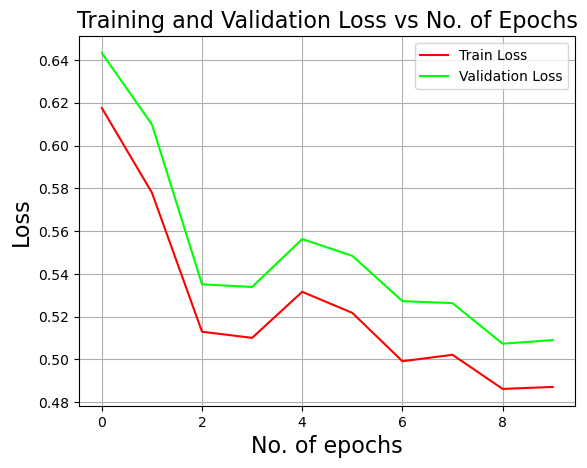

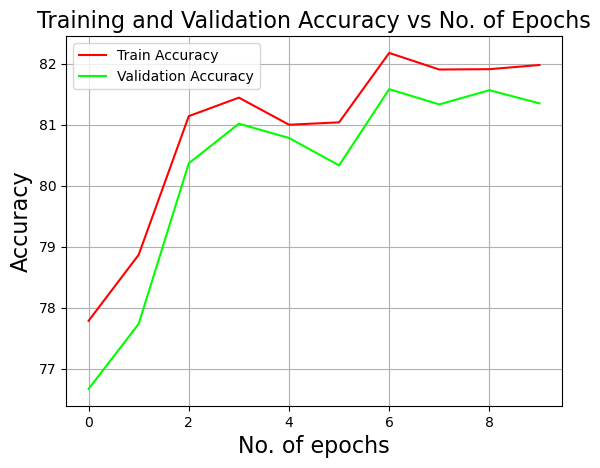

accuracy_train,▁▃▆▇▆▆████
accuracy_validation,▁▃▆▇▇▆████
cost_validation,█▆▂▂▄▃▂▂▁▁
epochs,▁▂▃▃▄▅▆▆▇█
loss_train,█▆▂▂▃▃▂▂▁▁
accuracy_train,81.97963
accuracy_validation,81.35
cost_validation,0.50903
epochs,9
loss_train,0.48714


wandb: Agent Starting Run: z4xxjnn9 with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 20
wandb: 	lambd: 0
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_20_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_64_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.54  Train accuracy:    81.63 Val error:     0.57 Val accuracy:    80.57
 
 epoch:   2  Train error:      0.41  Train accuracy:    85.56 Val error:     0.47 Val accuracy:    84.45
 
 epoch:   4  Train error:      0.37  Train accuracy:    86.97 Val error:     0.45 Val accuracy:    85.53
 
 epoch:   6  Train error:      0.34  Train accuracy:    87.77 Val error:     0.44 Val accuracy:    85.97
 
 epoch:   8  Train error:      0.33  Train accuracy:    88.34 Val error:     0.45 Val accuracy:    86.28
 
 epoch:  10  Train error:      0.31  Train accuracy:    88.80 Val error:     0.45 Val accuracy:    86.40
 
 epoch:  12  Train error:      0.31  Train accuracy:    89.11 Val error:     0.46 Val accuracy:    86.42
 
 epoch:  14  Train error:      0.

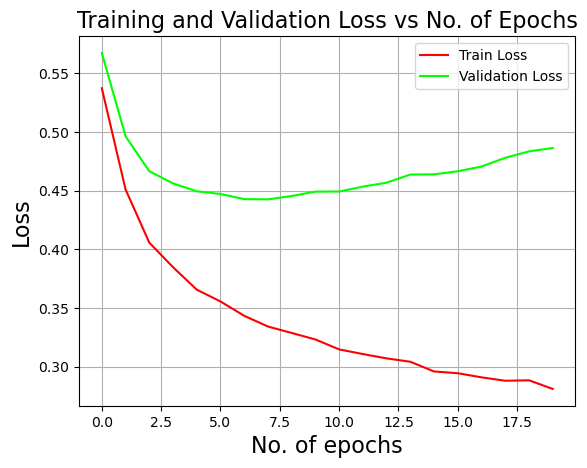

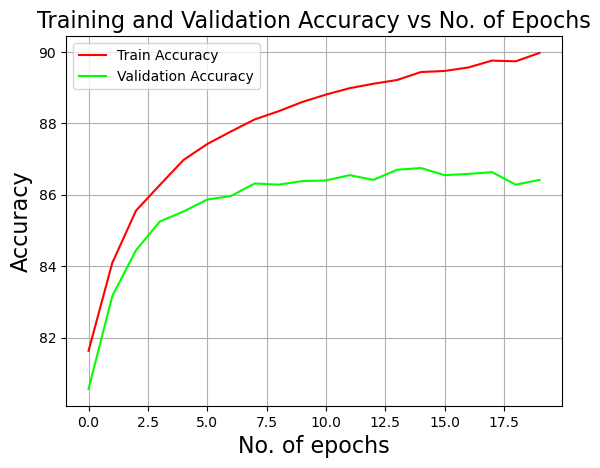

accuracy_train,▁▃▄▅▅▆▆▆▇▇▇▇▇▇██████
accuracy_validation,▁▄▅▆▇▇▇█▇█████████▇█
cost_validation,█▄▂▂▁▁▁▁▁▁▁▂▂▂▂▂▃▃▃▃
epochs,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss_train,█▆▄▄▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁
accuracy_train,89.97037
accuracy_validation,86.41667
cost_validation,0.48639
epochs,19
loss_train,0.28105


wandb: Agent Starting Run: 1yf4z6sn with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 16
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 10
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.01
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 32
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.01_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_10_num_hid_1_loss_cross_entropy_function_batchsize_16_neur_32_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 32, 10]
 
 epoch:   0  Train error:      0.62  Train accuracy:    76.52 Val error:     0.65 Val accuracy:    75.70
 
 epoch:   1  Train error:      0.52  Train accuracy:    81.41 Val error:     0.54 Val accuracy:    80.92
 
 epoch:   2  Train error:      0.56  Train accuracy:    80.19 Val error:     0.58 Val accuracy:    79.58
 
 epoch:   3  Train error:      0.52  Train accuracy:    81.23 Val error:     0.54 Val accuracy:    81.15
 
 epoch:   4  Train error:      0.53  Train accuracy:    80.81 Val error:     0.55 Val accuracy:    80.32
 
 epoch:   5  Train error:      0.51  Train accuracy:    81.19 Val error:     0.53 Val accuracy:    81.07
 
 epoch:   6  Train error:      0.48  Train accuracy:    82.53 Val error:     0.50 Val accuracy:    82.27
 
 epoch:   7  Train error:     

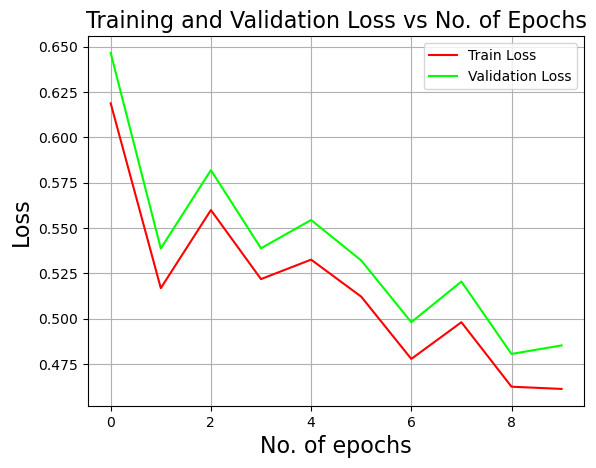

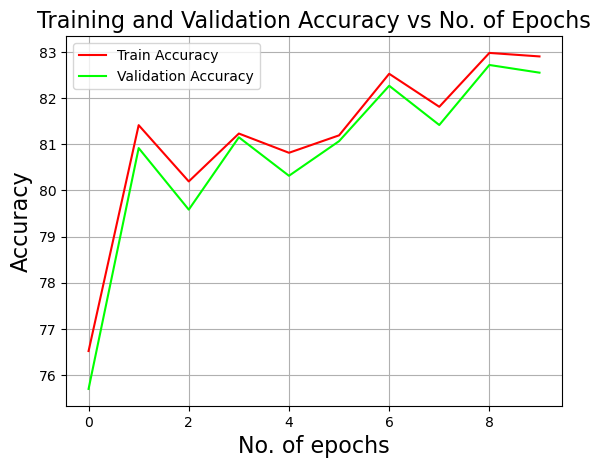

accuracy_train,▁▆▅▆▆▆█▇██
accuracy_validation,▁▆▅▆▆▆█▇██
cost_validation,█▃▅▃▄▃▂▃▁▁
epochs,▁▂▃▃▄▅▆▆▇█
loss_train,█▃▅▄▄▃▂▃▁▁
accuracy_train,82.90185
accuracy_validation,82.55
cost_validation,0.48523
epochs,9
loss_train,0.46124


wandb: Agent Starting Run: n9r9fybi with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 16
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 10
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.01
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.01_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_10_num_hid_1_loss_cross_entropy_function_batchsize_16_neur_64_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.59  Train accuracy:    78.56 Val error:     0.62 Val accuracy:    77.33
 
 epoch:   1  Train error:      0.51  Train accuracy:    81.29 Val error:     0.54 Val accuracy:    80.27
 
 epoch:   2  Train error:      0.52  Train accuracy:    81.05 Val error:     0.54 Val accuracy:    80.10
 
 epoch:   3  Train error:      0.52  Train accuracy:    80.81 Val error:     0.55 Val accuracy:    80.05
 
 epoch:   4  Train error:      0.49  Train accuracy:    82.40 Val error:     0.51 Val accuracy:    82.15
 
 epoch:   5  Train error:      0.45  Train accuracy:    83.67 Val error:     0.47 Val accuracy:    83.68
 
 epoch:   6  Train error:      0.46  Train accuracy:    83.23 Val error:     0.48 Val accuracy:    82.97
 
 epoch:   7  Train error:    

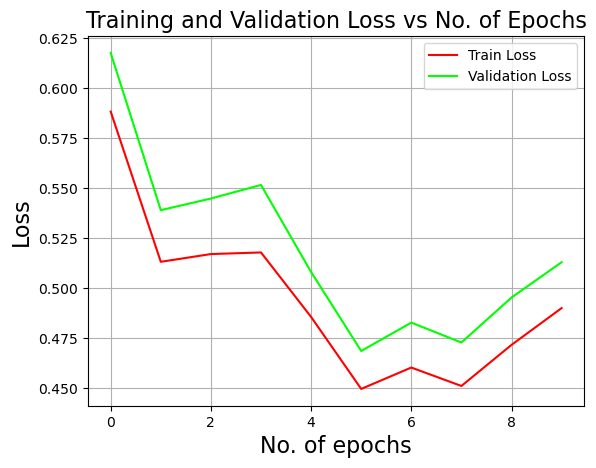

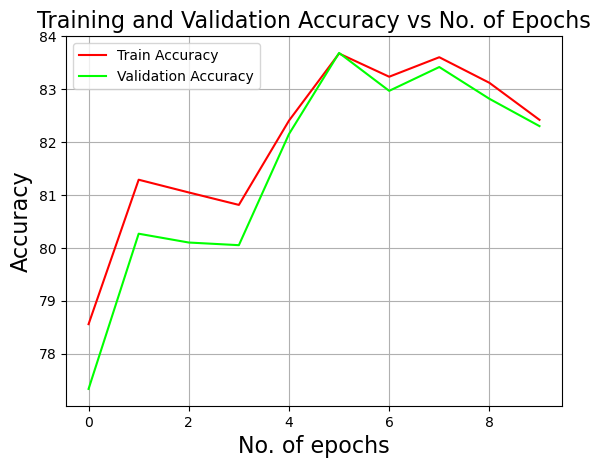

accuracy_train,▁▅▄▄▆█▇█▇▆
accuracy_validation,▁▄▄▄▆█▇█▇▆
cost_validation,█▄▅▅▃▁▂▁▂▃
epochs,▁▂▃▃▄▅▆▆▇█
loss_train,█▄▄▄▃▁▂▁▂▃
accuracy_train,82.41852
accuracy_validation,82.3
cost_validation,0.51296
epochs,9
loss_train,0.49002


wandb: Agent Starting Run: gqm35sgg with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 16
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 10
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.01
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.01_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_10_num_hid_1_loss_cross_entropy_function_batchsize_16_neur_64_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.53  Train accuracy:    81.30 Val error:     0.55 Val accuracy:    80.50
 
 epoch:   1  Train error:      0.55  Train accuracy:    79.85 Val error:     0.57 Val accuracy:    78.87
 
 epoch:   2  Train error:      0.55  Train accuracy:    79.86 Val error:     0.57 Val accuracy:    79.37
 
 epoch:   3  Train error:      0.51  Train accuracy:    81.18 Val error:     0.53 Val accuracy:    80.72
 
 epoch:   4  Train error:      0.50  Train accuracy:    81.58 Val error:     0.52 Val accuracy:    80.73
 
 epoch:   5  Train error:      0.50  Train accuracy:    81.36 Val error:     0.52 Val accuracy:    80.68
 
 epoch:   6  Train error:      0.52  Train accuracy:    80.43 Val error:     0.54 Val accuracy:    79.90
 
 epoch:   7  Train error:     

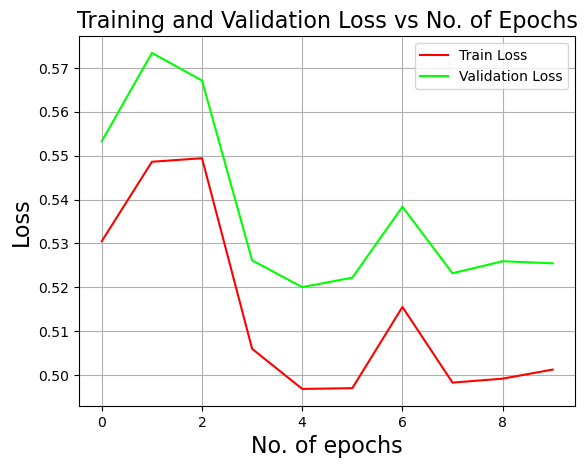

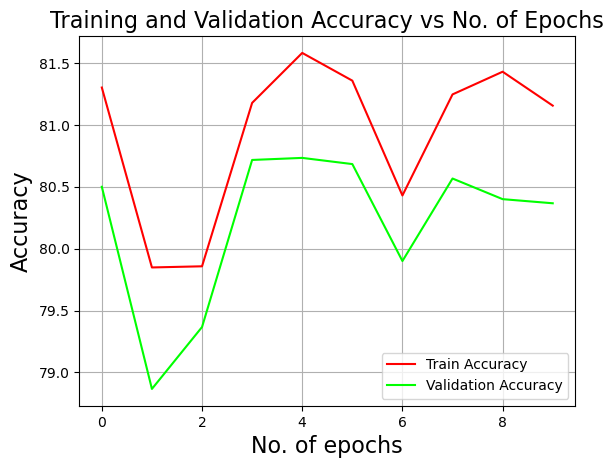

accuracy_train,▇▁▁▆█▇▃▇▇▆
accuracy_validation,▇▁▃███▅▇▇▇
cost_validation,▅█▇▂▁▁▃▁▂▂
epochs,▁▂▃▃▄▅▆▆▇█
loss_train,▅██▂▁▁▃▁▁▂
accuracy_train,81.15556
accuracy_validation,80.36667
cost_validation,0.52547
epochs,9
loss_train,0.50125


wandb: Agent Starting Run: 4r5g4vdp with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 16
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 10
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 32
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_10_num_hid_1_loss_cross_entropy_function_batchsize_16_neur_32_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 32, 10]
 
 epoch:   0  Train error:      0.56  Train accuracy:    80.23 Val error:     0.58 Val accuracy:    79.42
 
 epoch:   1  Train error:      0.46  Train accuracy:    83.53 Val error:     0.48 Val accuracy:    82.30
 
 epoch:   2  Train error:      0.41  Train accuracy:    85.21 Val error:     0.44 Val accuracy:    84.17
 
 epoch:   3  Train error:      0.38  Train accuracy:    86.24 Val error:     0.42 Val accuracy:    84.78
 
 epoch:   4  Train error:      0.37  Train accuracy:    86.79 Val error:     0.40 Val accuracy:    85.55
 
 epoch:   5  Train error:      0.36  Train accuracy:    87.25 Val error:     0.40 Val accuracy:    85.73
 
 epoch:   6  Train error:      0.35  Train accuracy:    87.61 Val error:     0.39 Val accuracy:    85.88
 
 epoch:   7  Train error:   

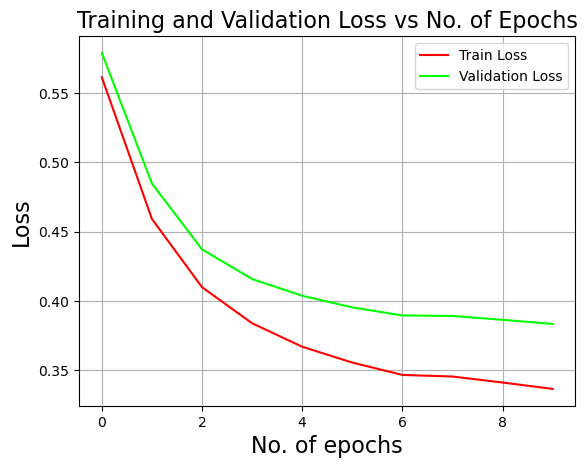

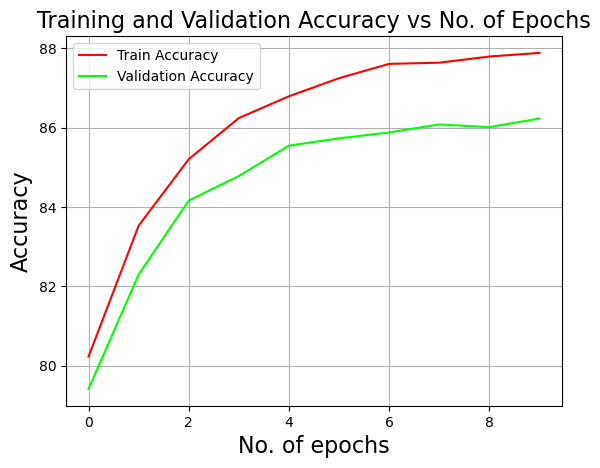

accuracy_train,▁▄▆▆▇▇████
accuracy_validation,▁▄▆▇▇▇████
cost_validation,█▅▃▂▂▁▁▁▁▁
epochs,▁▂▃▃▄▅▆▆▇█
loss_train,█▅▃▂▂▂▁▁▁▁
accuracy_train,87.88704
accuracy_validation,86.23333
cost_validation,0.38335
epochs,9
loss_train,0.33641


wandb: Agent Starting Run: ildatdsf with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 16
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 10
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 32
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_10_num_hid_1_loss_cross_entropy_function_batchsize_16_neur_32_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 32, 10]
 
 epoch:   0  Train error:      0.57  Train accuracy:    80.23 Val error:     0.58 Val accuracy:    79.50
 
 epoch:   1  Train error:      0.46  Train accuracy:    83.89 Val error:     0.48 Val accuracy:    83.10
 
 epoch:   2  Train error:      0.41  Train accuracy:    85.28 Val error:     0.44 Val accuracy:    84.05
 
 epoch:   3  Train error:      0.38  Train accuracy:    86.26 Val error:     0.41 Val accuracy:    85.07
 
 epoch:   4  Train error:      0.37  Train accuracy:    86.79 Val error:     0.40 Val accuracy:    85.55
 
 epoch:   5  Train error:      0.36  Train accuracy:    87.04 Val error:     0.40 Val accuracy:    85.73
 
 epoch:   6  Train error:      0.35  Train accuracy:    87.23 Val error:     0.39 Val accuracy:    85.87
 
 epoch:   7  Train error:    

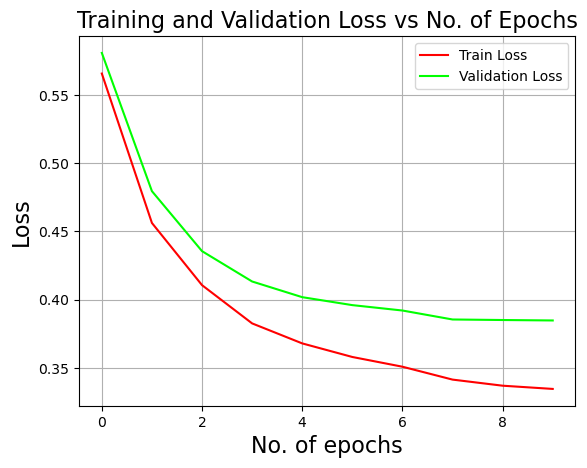

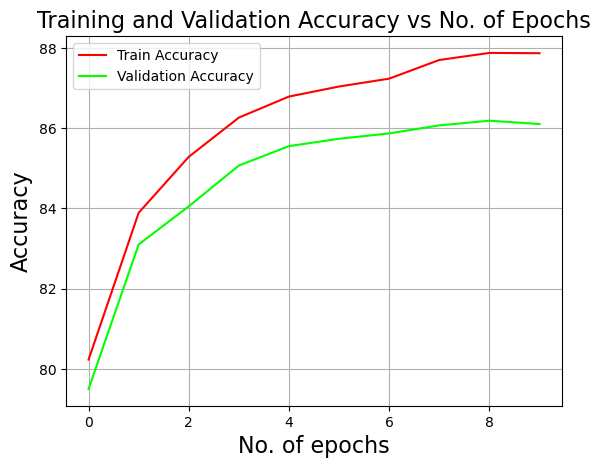

accuracy_train,▁▄▆▇▇▇▇███
accuracy_validation,▁▅▆▇▇█████
cost_validation,█▄▃▂▂▁▁▁▁▁
epochs,▁▂▃▃▄▅▆▆▇█
loss_train,█▅▃▂▂▂▁▁▁▁
accuracy_train,87.86481
accuracy_validation,86.1
cost_validation,0.38473
epochs,9
loss_train,0.33453


wandb: Agent Starting Run: 6xkzk9rh with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 16
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 10
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_10_num_hid_1_loss_cross_entropy_function_batchsize_16_neur_64_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.55  Train accuracy:    81.07 Val error:     0.58 Val accuracy:    80.48
 
 epoch:   1  Train error:      0.44  Train accuracy:    84.21 Val error:     0.48 Val accuracy:    82.83
 
 epoch:   2  Train error:      0.39  Train accuracy:    85.92 Val error:     0.43 Val accuracy:    84.38
 
 epoch:   3  Train error:      0.37  Train accuracy:    86.73 Val error:     0.41 Val accuracy:    85.28
 
 epoch:   4  Train error:      0.36  Train accuracy:    87.19 Val error:     0.40 Val accuracy:    85.28
 
 epoch:   5  Train error:      0.34  Train accuracy:    87.99 Val error:     0.38 Val accuracy:    85.75
 
 epoch:   6  Train error:      0.33  Train accuracy:    88.18 Val error:     0.38 Val accuracy:    85.73
 
 epoch:   7  Train error:   

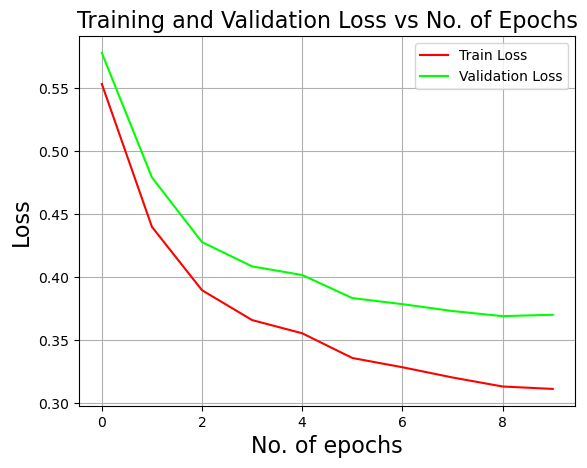

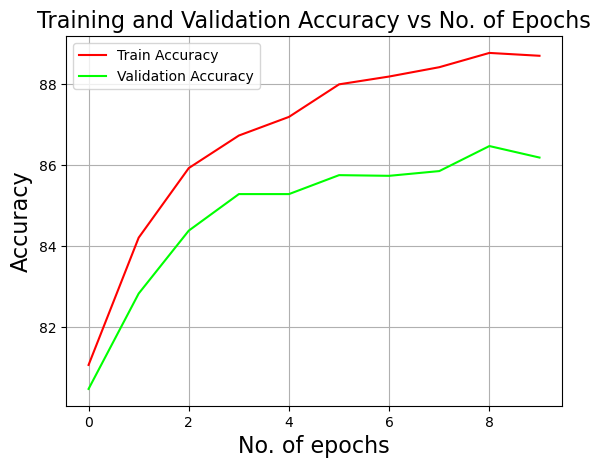

accuracy_train,▁▄▅▆▇▇▇███
accuracy_validation,▁▄▆▇▇▇▇▇██
cost_validation,█▅▃▂▂▁▁▁▁▁
epochs,▁▂▃▃▄▅▆▆▇█
loss_train,█▅▃▃▂▂▁▁▁▁
accuracy_train,88.69074
accuracy_validation,86.18333
cost_validation,0.37007
epochs,9
loss_train,0.31118


wandb: Agent Starting Run: jdivvjlj with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 16
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 10
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_10_num_hid_1_loss_cross_entropy_function_batchsize_16_neur_64_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.55  Train accuracy:    80.74 Val error:     0.58 Val accuracy:    79.87
 
 epoch:   1  Train error:      0.44  Train accuracy:    84.28 Val error:     0.47 Val accuracy:    83.23
 
 epoch:   2  Train error:      0.40  Train accuracy:    85.59 Val error:     0.44 Val accuracy:    84.38
 
 epoch:   3  Train error:      0.37  Train accuracy:    86.55 Val error:     0.41 Val accuracy:    85.03
 
 epoch:   4  Train error:      0.36  Train accuracy:    86.97 Val error:     0.40 Val accuracy:    85.37
 
 epoch:   5  Train error:      0.34  Train accuracy:    87.57 Val error:     0.39 Val accuracy:    85.87
 
 epoch:   6  Train error:      0.33  Train accuracy:    88.13 Val error:     0.38 Val accuracy:    86.23
 
 epoch:   7  Train error:    

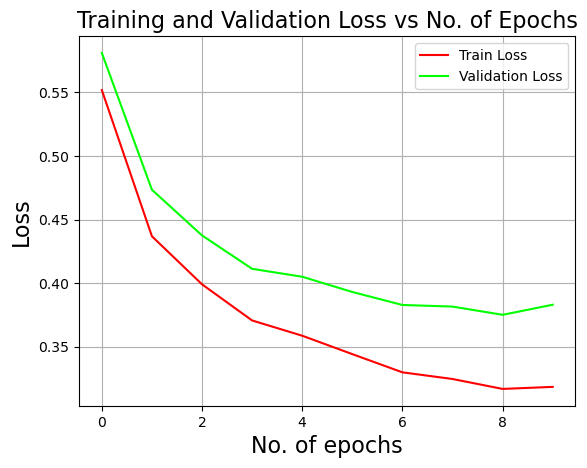

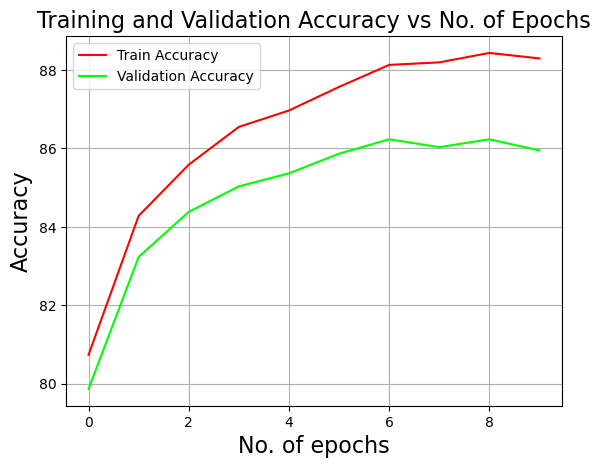

accuracy_train,▁▄▅▆▇▇████
accuracy_validation,▁▅▆▇▇█████
cost_validation,█▄▃▂▂▂▁▁▁▁
epochs,▁▂▃▃▄▅▆▆▇█
loss_train,█▅▃▃▂▂▁▁▁▁
accuracy_train,88.2963
accuracy_validation,85.95
cost_validation,0.38293
epochs,9
loss_train,0.31827


wandb: Agent Starting Run: i10hqtgr with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 16
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 15
wandb: 	lambd: 0
wandb: 	learning_rate: 0.01
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 32
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.01_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_15_num_hid_1_loss_cross_entropy_function_batchsize_16_neur_32_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 32, 10]
 
 epoch:   0  Train error:      0.51  Train accuracy:    81.69 Val error:     0.54 Val accuracy:    81.18
 
 epoch:   3  Train error:      0.44  Train accuracy:    84.43 Val error:     0.51 Val accuracy:    82.98
 
 epoch:   6  Train error:      0.40  Train accuracy:    85.38 Val error:     0.49 Val accuracy:    83.90
 
 epoch:   9  Train error:      0.41  Train accuracy:    85.65 Val error:     0.53 Val accuracy:    83.53
 
 epoch:  12  Train error:      0.40  Train accuracy:    86.07 Val error:     0.53 Val accuracy:    83.42


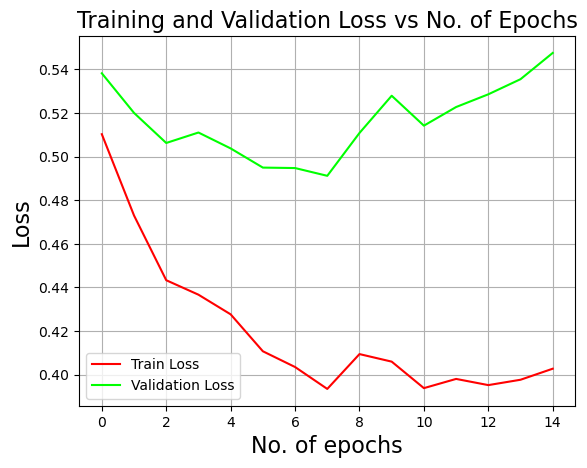

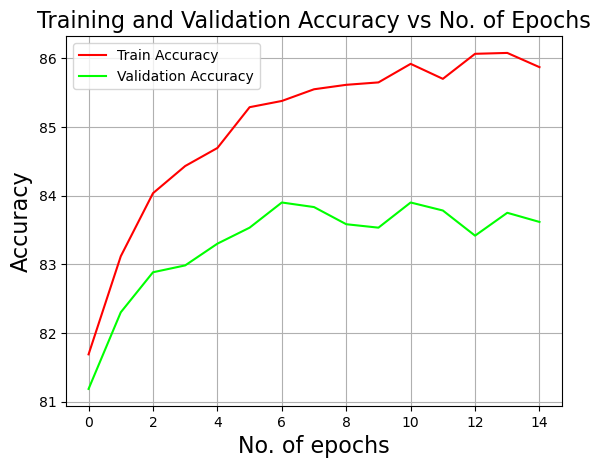

accuracy_train,▁▃▅▅▆▇▇▇▇▇█▇███
accuracy_validation,▁▄▅▆▆▇██▇▇██▇█▇
cost_validation,▇▅▃▃▃▁▁▁▃▆▄▅▆▇█
epochs,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
loss_train,█▆▄▄▃▂▂▁▂▂▁▁▁▁▂
accuracy_train,85.87222
accuracy_validation,83.61667
cost_validation,0.54751
epochs,14
loss_train,0.40274


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: mw7g75nj with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 16
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 15
wandb: 	lambd: 0
wandb: 	learning_rate: 0.01
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 32
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.01_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_15_num_hid_1_loss_cross_entropy_function_batchsize_16_neur_32_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 32, 10]
 
 epoch:   0  Train error:      0.57  Train accuracy:    80.23 Val error:     0.59 Val accuracy:    78.93
 
 epoch:   3  Train error:      0.44  Train accuracy:    84.52 Val error:     0.49 Val accuracy:    83.55
 
 epoch:   6  Train error:      0.42  Train accuracy:    85.51 Val error:     0.49 Val accuracy:    84.25
 
 epoch:   9  Train error:      0.40  Train accuracy:    85.66 Val error:     0.49 Val accuracy:    83.90
 
 epoch:  12  Train error:      0.38  Train accuracy:    86.14 Val error:     0.49 Val accuracy:    84.37


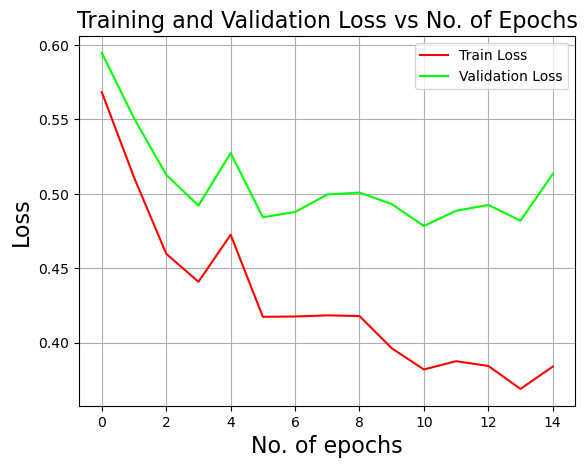

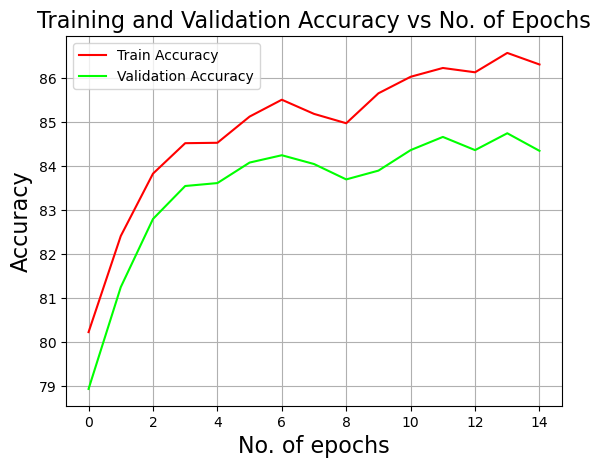

accuracy_train,▁▃▅▆▆▆▇▆▆▇▇████
accuracy_validation,▁▄▆▇▇▇▇▇▇▇█████
cost_validation,█▅▃▂▄▁▂▂▂▂▁▂▂▁▃
epochs,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
loss_train,█▆▄▄▅▃▃▃▃▂▁▂▂▁▂
accuracy_train,86.31481
accuracy_validation,84.35
cost_validation,0.51332
epochs,14
loss_train,0.38394


wandb: Agent Starting Run: dn4qzq4s with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 16
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 15
wandb: 	lambd: 0
wandb: 	learning_rate: 0.01
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.01_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_15_num_hid_1_loss_cross_entropy_function_batchsize_16_neur_64_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.52  Train accuracy:    82.25 Val error:     0.55 Val accuracy:    81.38
 
 epoch:   3  Train error:      0.45  Train accuracy:    84.32 Val error:     0.53 Val accuracy:    83.15
 
 epoch:   6  Train error:      0.44  Train accuracy:    85.65 Val error:     0.54 Val accuracy:    84.10
 
 epoch:   9  Train error:      0.40  Train accuracy:    85.71 Val error:     0.53 Val accuracy:    84.05
 
 epoch:  12  Train error:      0.51  Train accuracy:    84.71 Val error:     0.65 Val accuracy:    83.02


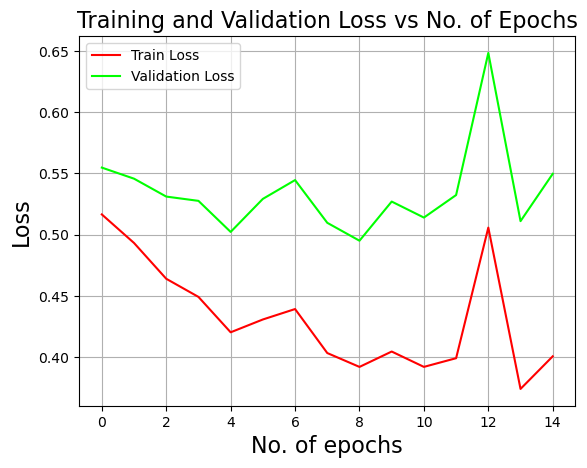

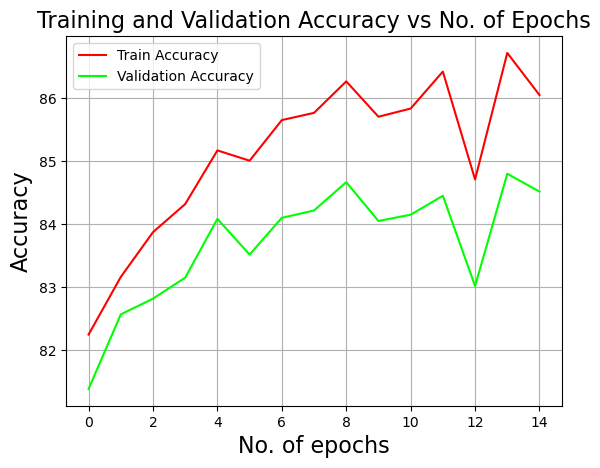

accuracy_train,▁▂▄▄▆▅▆▇▇▆▇█▅█▇
accuracy_validation,▁▃▄▅▇▅▇▇█▆▇▇▄█▇
cost_validation,▄▃▃▂▁▃▃▂▁▂▂▃█▂▃
epochs,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
loss_train,█▇▅▅▃▄▄▂▂▂▂▂▇▁▂
accuracy_train,86.05
accuracy_validation,84.51667
cost_validation,0.54969
epochs,14
loss_train,0.40057


wandb: Agent Starting Run: 9su3b1rd with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 16
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 15
wandb: 	lambd: 0
wandb: 	learning_rate: 0.01
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.01_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_15_num_hid_1_loss_cross_entropy_function_batchsize_16_neur_64_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.55  Train accuracy:    81.55 Val error:     0.59 Val accuracy:    80.33
 
 epoch:   3  Train error:      0.44  Train accuracy:    85.08 Val error:     0.49 Val accuracy:    83.87
 
 epoch:   6  Train error:      0.41  Train accuracy:    85.78 Val error:     0.50 Val accuracy:    84.67
 
 epoch:   9  Train error:      0.42  Train accuracy:    85.95 Val error:     0.52 Val accuracy:    84.50
 
 epoch:  12  Train error:      0.41  Train accuracy:    86.33 Val error:     0.52 Val accuracy:    84.60


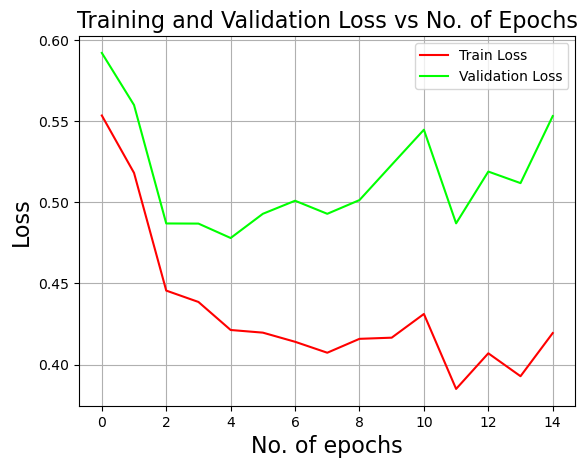

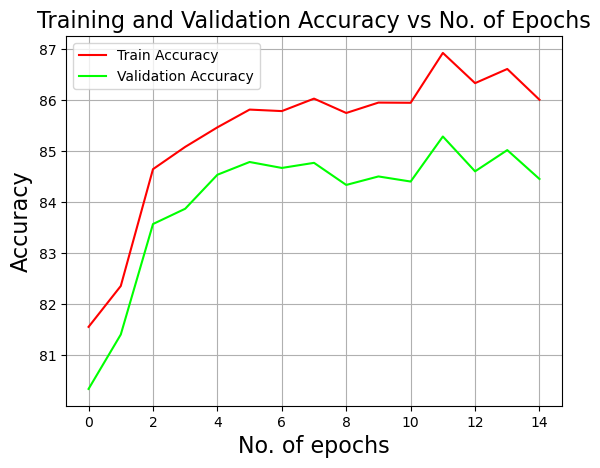

accuracy_train,▁▂▅▆▆▇▇▇▆▇▇█▇█▇
accuracy_validation,▁▃▆▆▇▇▇▇▇▇▇█▇█▇
cost_validation,█▆▂▂▁▂▂▂▂▄▅▂▄▃▆
epochs,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
loss_train,█▇▄▃▃▂▂▂▂▂▃▁▂▁▂
accuracy_train,86.0037
accuracy_validation,84.45
cost_validation,0.55306
epochs,14
loss_train,0.41939


wandb: Agent Starting Run: s3md362k with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 16
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 15
wandb: 	lambd: 0
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 32
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_15_num_hid_1_loss_cross_entropy_function_batchsize_16_neur_32_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 32, 10]
 
 epoch:   0  Train error:      0.60  Train accuracy:    78.18 Val error:     0.62 Val accuracy:    77.82
 
 epoch:   3  Train error:      0.44  Train accuracy:    84.47 Val error:     0.47 Val accuracy:    83.28
 
 epoch:   6  Train error:      0.40  Train accuracy:    85.70 Val error:     0.43 Val accuracy:    84.72
 
 epoch:   9  Train error:      0.38  Train accuracy:    86.40 Val error:     0.43 Val accuracy:    84.98
 
 epoch:  12  Train error:      0.36  Train accuracy:    86.87 Val error:     0.42 Val accuracy:    85.35


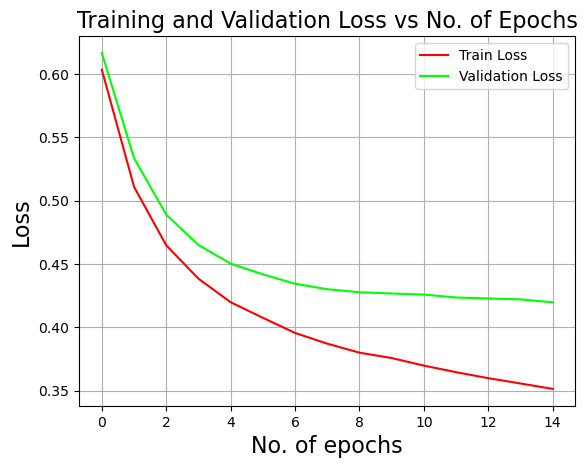

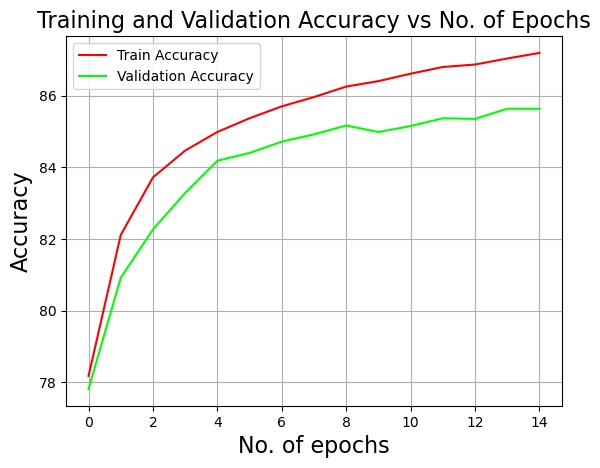

accuracy_train,▁▄▅▆▆▇▇▇▇▇█████
accuracy_validation,▁▄▅▆▇▇▇▇█▇█████
cost_validation,█▅▃▃▂▂▂▁▁▁▁▁▁▁▁
epochs,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
loss_train,█▅▄▃▃▃▂▂▂▂▂▁▁▁▁
accuracy_train,87.19074
accuracy_validation,85.63333
cost_validation,0.41971
epochs,14
loss_train,0.35132


wandb: Agent Starting Run: 57c8hakr with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 16
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 15
wandb: 	lambd: 0
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 32
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_15_num_hid_1_loss_cross_entropy_function_batchsize_16_neur_32_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 32, 10]
 
 epoch:   0  Train error:      0.61  Train accuracy:    78.17 Val error:     0.62 Val accuracy:    77.67
 
 epoch:   3  Train error:      0.44  Train accuracy:    84.44 Val error:     0.46 Val accuracy:    83.37
 
 epoch:   6  Train error:      0.39  Train accuracy:    85.72 Val error:     0.43 Val accuracy:    84.77
 
 epoch:   9  Train error:      0.37  Train accuracy:    86.48 Val error:     0.42 Val accuracy:    85.28
 
 epoch:  12  Train error:      0.35  Train accuracy:    87.03 Val error:     0.42 Val accuracy:    85.55


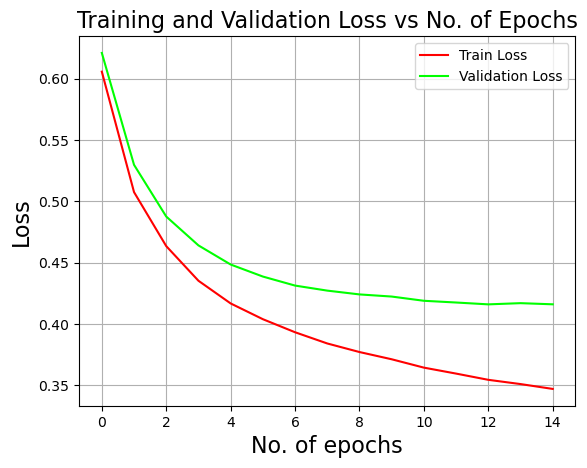

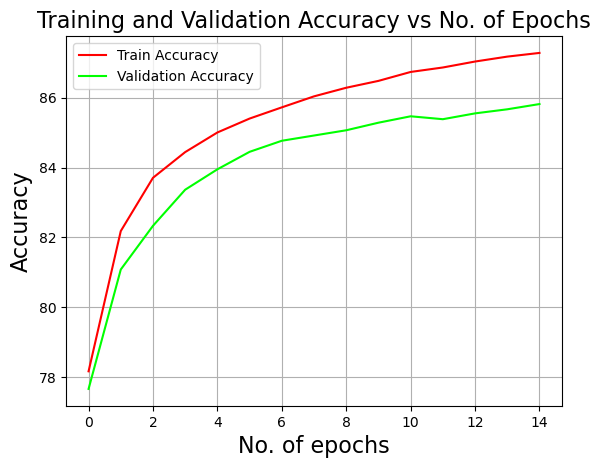

accuracy_train,▁▄▅▆▆▇▇▇▇▇█████
accuracy_validation,▁▄▅▆▆▇▇▇▇██████
cost_validation,█▅▃▃▂▂▂▁▁▁▁▁▁▁▁
epochs,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
loss_train,█▅▄▃▃▃▂▂▂▂▁▁▁▁▁
accuracy_train,87.27963
accuracy_validation,85.81667
cost_validation,0.41591
epochs,14
loss_train,0.34689


wandb: Agent Starting Run: guvgwc9c with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 16
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 15
wandb: 	lambd: 0
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_15_num_hid_1_loss_cross_entropy_function_batchsize_16_neur_64_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.59  Train accuracy:    80.49 Val error:     0.62 Val accuracy:    79.35
 
 epoch:   3  Train error:      0.38  Train accuracy:    86.17 Val error:     0.44 Val accuracy:    84.73
 
 epoch:   6  Train error:      0.34  Train accuracy:    87.61 Val error:     0.43 Val accuracy:    85.47
 
 epoch:   9  Train error:      0.32  Train accuracy:    88.44 Val error:     0.42 Val accuracy:    86.22
 
 epoch:  12  Train error:      0.30  Train accuracy:    89.08 Val error:     0.42 Val accuracy:    86.25


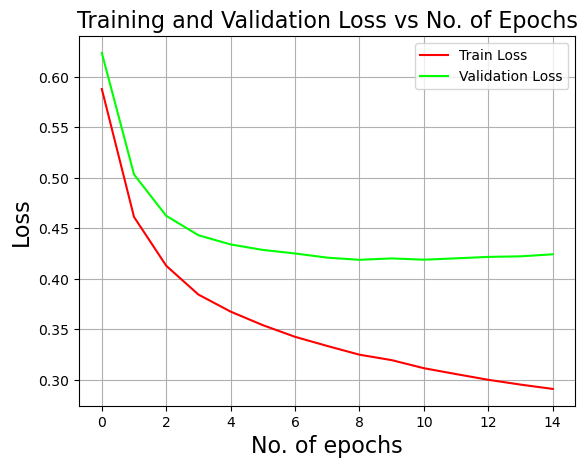

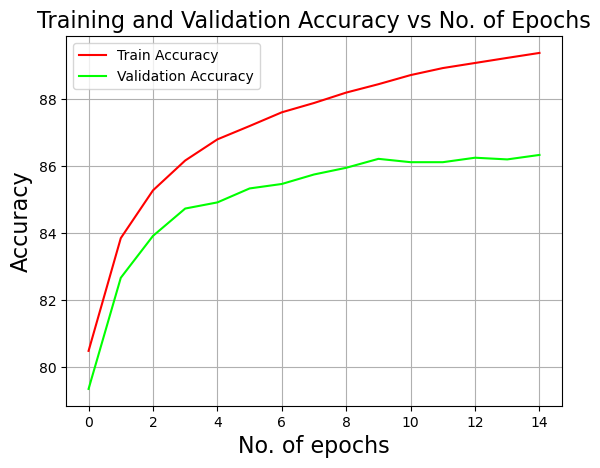

accuracy_train,▁▄▅▅▆▆▇▇▇▇▇████
accuracy_validation,▁▄▆▆▇▇▇▇███████
cost_validation,█▄▂▂▂▁▁▁▁▁▁▁▁▁▁
epochs,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
loss_train,█▅▄▃▃▂▂▂▂▂▁▁▁▁▁
accuracy_train,89.37778
accuracy_validation,86.33333
cost_validation,0.42443
epochs,14
loss_train,0.29118


wandb: Agent Starting Run: h1plcdcs with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 16
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 15
wandb: 	lambd: 0
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_15_num_hid_1_loss_cross_entropy_function_batchsize_16_neur_64_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.58  Train accuracy:    80.93 Val error:     0.61 Val accuracy:    79.75
 
 epoch:   3  Train error:      0.39  Train accuracy:    86.18 Val error:     0.45 Val accuracy:    84.53
 
 epoch:   6  Train error:      0.34  Train accuracy:    87.67 Val error:     0.43 Val accuracy:    85.52
 
 epoch:   9  Train error:      0.32  Train accuracy:    88.46 Val error:     0.42 Val accuracy:    85.97
 
 epoch:  12  Train error:      0.31  Train accuracy:    88.92 Val error:     0.43 Val accuracy:    85.95


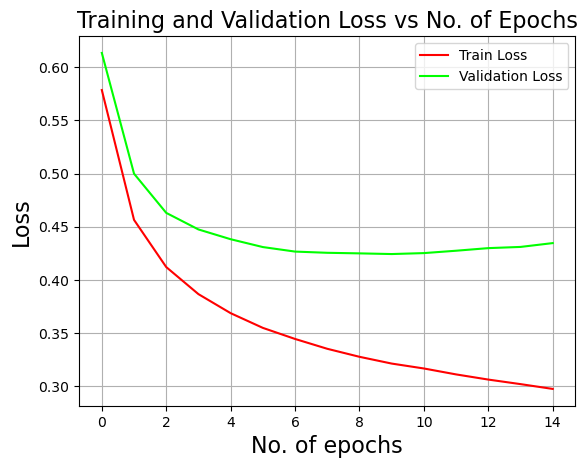

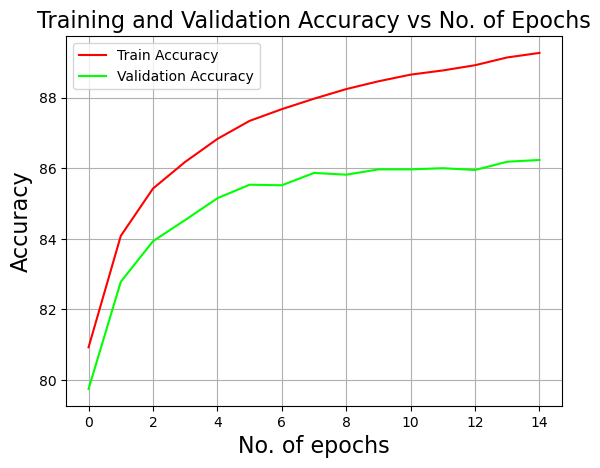

accuracy_train,▁▄▅▅▆▆▇▇▇▇▇████
accuracy_validation,▁▄▆▆▇▇▇████████
cost_validation,█▄▂▂▂▁▁▁▁▁▁▁▁▁▁
epochs,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
loss_train,█▅▄▃▃▂▂▂▂▂▁▁▁▁▁
accuracy_train,89.26481
accuracy_validation,86.23333
cost_validation,0.43463
epochs,14
loss_train,0.29745


wandb: Agent Starting Run: 9yvqj2it with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 16
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 15
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.01
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 32
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.01_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_15_num_hid_1_loss_cross_entropy_function_batchsize_16_neur_32_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 32, 10]
 
 epoch:   0  Train error:      0.62  Train accuracy:    77.78 Val error:     0.64 Val accuracy:    76.67
 
 epoch:   3  Train error:      0.51  Train accuracy:    81.44 Val error:     0.53 Val accuracy:    81.02
 
 epoch:   6  Train error:      0.50  Train accuracy:    82.18 Val error:     0.53 Val accuracy:    81.58
 
 epoch:   9  Train error:      0.49  Train accuracy:    81.98 Val error:     0.51 Val accuracy:    81.35
 
 epoch:  12  Train error:      0.49  Train accuracy:    81.76 Val error:     0.51 Val accuracy:    81.17


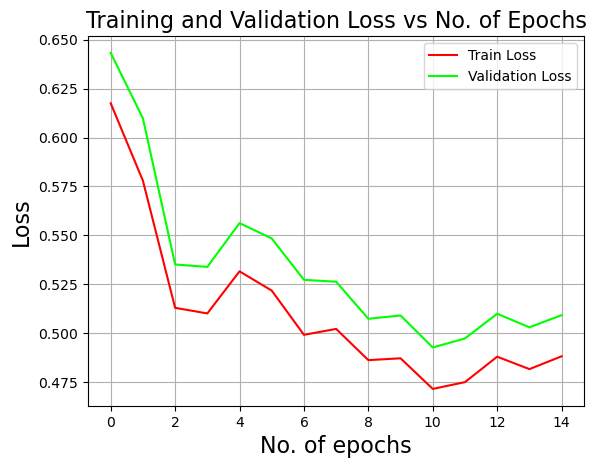

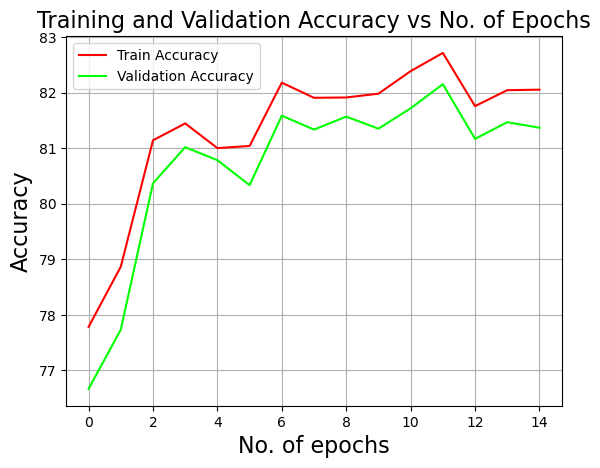

accuracy_train,▁▃▆▆▆▆▇▇▇▇██▇▇▇
accuracy_validation,▁▂▆▇▆▆▇▇▇▇▇█▇▇▇
cost_validation,█▆▃▃▄▄▃▃▂▂▁▁▂▁▂
epochs,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
loss_train,█▆▃▃▄▃▂▂▂▂▁▁▂▁▂
accuracy_train,82.05185
accuracy_validation,81.36667
cost_validation,0.5092
epochs,14
loss_train,0.48816


wandb: Agent Starting Run: io60o1nl with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 16
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 15
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.01
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 32
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.01_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_15_num_hid_1_loss_cross_entropy_function_batchsize_16_neur_32_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 32, 10]
 
 epoch:   0  Train error:      0.62  Train accuracy:    76.52 Val error:     0.65 Val accuracy:    75.70
 
 epoch:   3  Train error:      0.52  Train accuracy:    81.23 Val error:     0.54 Val accuracy:    81.15
 
 epoch:   6  Train error:      0.48  Train accuracy:    82.53 Val error:     0.50 Val accuracy:    82.27
 
 epoch:   9  Train error:      0.46  Train accuracy:    82.90 Val error:     0.49 Val accuracy:    82.55
 
 epoch:  12  Train error:      0.47  Train accuracy:    82.65 Val error:     0.49 Val accuracy:    82.77


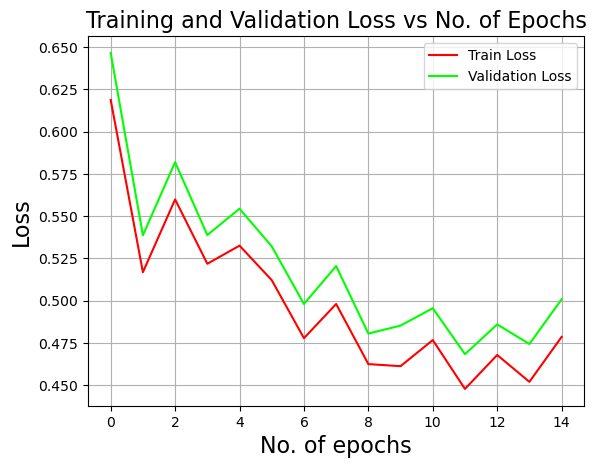

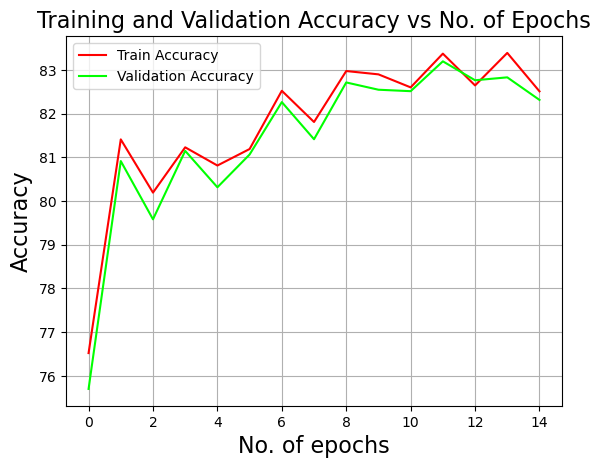

accuracy_train,▁▆▅▆▅▆▇▆██▇█▇█▇
accuracy_validation,▁▆▅▆▅▆▇▆█▇▇███▇
cost_validation,█▄▅▄▄▄▂▃▁▂▂▁▂▁▂
epochs,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
loss_train,█▄▆▄▄▄▂▃▂▂▂▁▂▁▂
accuracy_train,82.51296
accuracy_validation,82.31667
cost_validation,0.50076
epochs,14
loss_train,0.47853


wandb: Agent Starting Run: uuqe32js with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 16
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 15
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.01
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.01_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_15_num_hid_1_loss_cross_entropy_function_batchsize_16_neur_64_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.59  Train accuracy:    78.56 Val error:     0.62 Val accuracy:    77.33
 
 epoch:   3  Train error:      0.52  Train accuracy:    80.81 Val error:     0.55 Val accuracy:    80.05
 
 epoch:   6  Train error:      0.46  Train accuracy:    83.23 Val error:     0.48 Val accuracy:    82.97
 
 epoch:   9  Train error:      0.49  Train accuracy:    82.42 Val error:     0.51 Val accuracy:    82.30
 
 epoch:  12  Train error:      0.47  Train accuracy:    82.70 Val error:     0.50 Val accuracy:    82.37


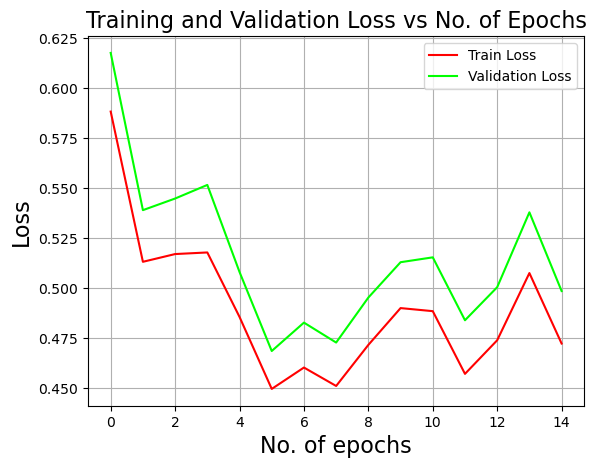

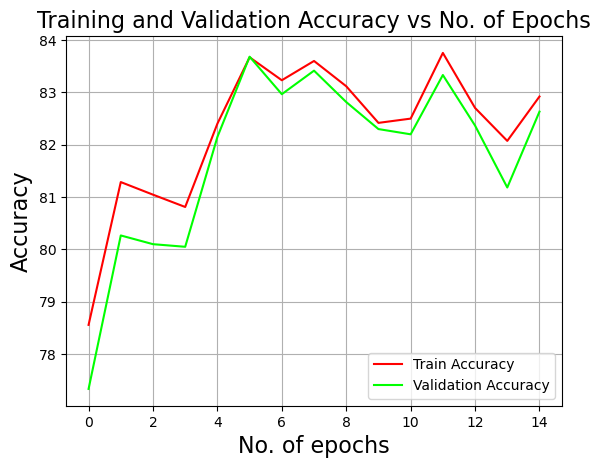

accuracy_train,▁▅▄▄▆█▇█▇▆▆█▇▆▇
accuracy_validation,▁▄▄▄▆█▇█▇▆▆█▇▅▇
cost_validation,█▄▅▅▃▁▂▁▂▃▃▂▂▄▂
epochs,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
loss_train,█▄▄▄▃▁▂▁▂▃▃▁▂▄▂
accuracy_train,82.92222
accuracy_validation,82.63333
cost_validation,0.49855
epochs,14
loss_train,0.4723


wandb: Agent Starting Run: e14ou00n with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 16
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 15
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.01
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.01_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_15_num_hid_1_loss_cross_entropy_function_batchsize_16_neur_64_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.53  Train accuracy:    81.30 Val error:     0.55 Val accuracy:    80.50
 
 epoch:   3  Train error:      0.51  Train accuracy:    81.18 Val error:     0.53 Val accuracy:    80.72
 
 epoch:   6  Train error:      0.52  Train accuracy:    80.43 Val error:     0.54 Val accuracy:    79.90
 
 epoch:   9  Train error:      0.50  Train accuracy:    81.16 Val error:     0.53 Val accuracy:    80.37
 
 epoch:  12  Train error:      0.46  Train accuracy:    82.23 Val error:     0.49 Val accuracy:    81.58


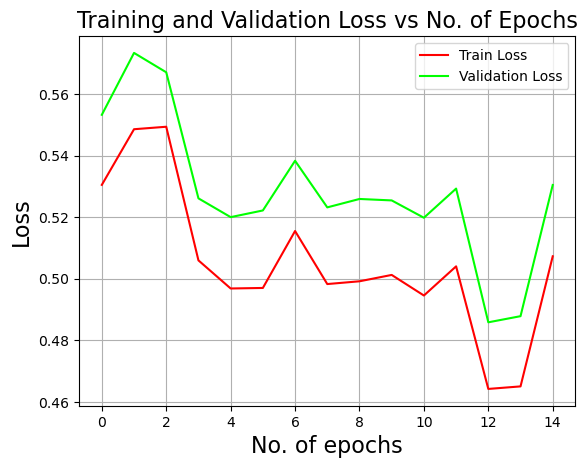

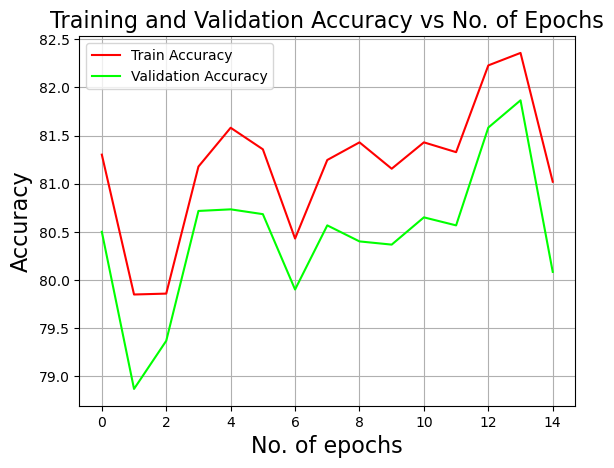

accuracy_train,▅▁▁▅▆▅▃▅▅▅▅▅██▄
accuracy_validation,▅▁▂▅▅▅▃▅▅▅▅▅▇█▄
cost_validation,▆█▇▄▄▄▅▄▄▄▄▄▁▁▅
epochs,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
loss_train,▆██▄▄▄▅▄▄▄▃▄▁▁▅
accuracy_train,81.02037
accuracy_validation,80.08333
cost_validation,0.53049
epochs,14
loss_train,0.50731


wandb: Agent Starting Run: pnjb8ehs with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 16
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 15
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 32
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_15_num_hid_1_loss_cross_entropy_function_batchsize_16_neur_32_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 32, 10]
 
 epoch:   0  Train error:      0.56  Train accuracy:    80.23 Val error:     0.58 Val accuracy:    79.42
 
 epoch:   3  Train error:      0.38  Train accuracy:    86.24 Val error:     0.42 Val accuracy:    84.78
 
 epoch:   6  Train error:      0.35  Train accuracy:    87.61 Val error:     0.39 Val accuracy:    85.88
 
 epoch:   9  Train error:      0.34  Train accuracy:    87.89 Val error:     0.38 Val accuracy:    86.23
 
 epoch:  12  Train error:      0.33  Train accuracy:    88.09 Val error:     0.38 Val accuracy:    86.15


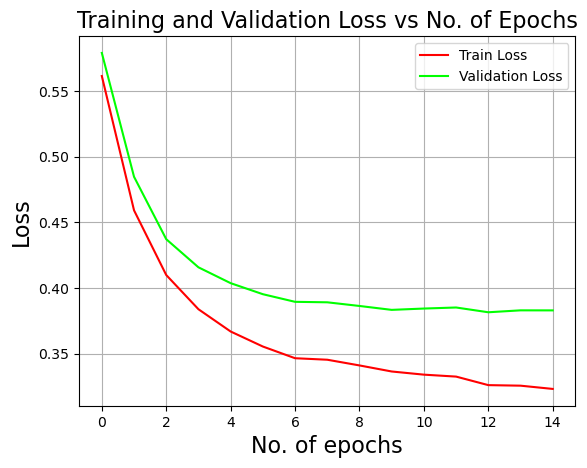

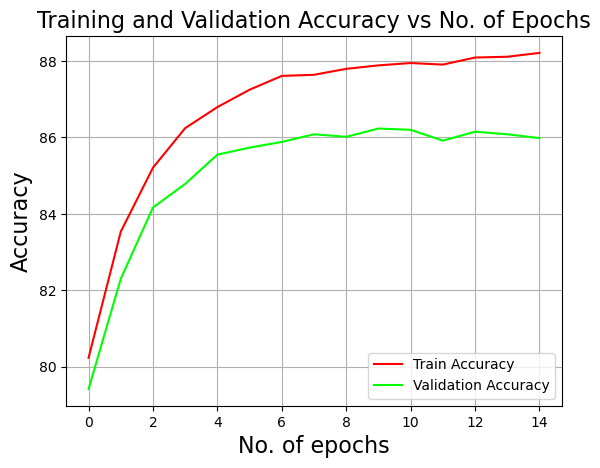

accuracy_train,▁▄▅▆▇▇▇▇███████
accuracy_validation,▁▄▆▇▇▇█████████
cost_validation,█▅▃▂▂▁▁▁▁▁▁▁▁▁▁
epochs,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
loss_train,█▅▄▃▂▂▂▂▂▁▁▁▁▁▁
accuracy_train,88.21296
accuracy_validation,85.98333
cost_validation,0.38296
epochs,14
loss_train,0.32312


wandb: Agent Starting Run: nad0fr2f with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 16
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 15
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 32
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_15_num_hid_1_loss_cross_entropy_function_batchsize_16_neur_32_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 32, 10]
 
 epoch:   0  Train error:      0.57  Train accuracy:    80.23 Val error:     0.58 Val accuracy:    79.50
 
 epoch:   3  Train error:      0.38  Train accuracy:    86.26 Val error:     0.41 Val accuracy:    85.07
 
 epoch:   6  Train error:      0.35  Train accuracy:    87.23 Val error:     0.39 Val accuracy:    85.87
 
 epoch:   9  Train error:      0.33  Train accuracy:    87.86 Val error:     0.38 Val accuracy:    86.10
 
 epoch:  12  Train error:      0.32  Train accuracy:    88.22 Val error:     0.38 Val accuracy:    86.12


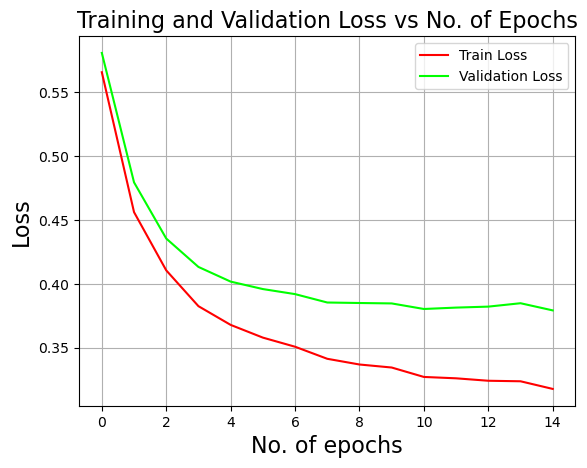

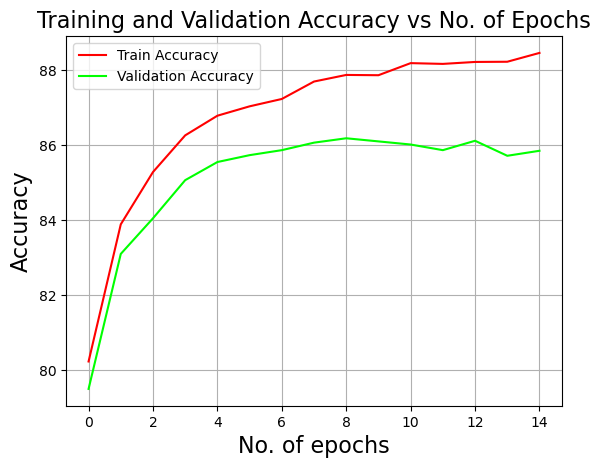

accuracy_train,▁▄▅▆▇▇▇▇█▇█████
accuracy_validation,▁▅▆▇▇██████████
cost_validation,█▄▃▂▂▂▁▁▁▁▁▁▁▁▁
epochs,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
loss_train,█▅▄▃▂▂▂▂▂▁▁▁▁▁▁
accuracy_train,88.45926
accuracy_validation,85.85
cost_validation,0.37927
epochs,14
loss_train,0.31777


wandb: Agent Starting Run: kj5eqnjl with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 16
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 15
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_15_num_hid_1_loss_cross_entropy_function_batchsize_16_neur_64_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.55  Train accuracy:    81.07 Val error:     0.58 Val accuracy:    80.48
 
 epoch:   3  Train error:      0.37  Train accuracy:    86.73 Val error:     0.41 Val accuracy:    85.28
 
 epoch:   6  Train error:      0.33  Train accuracy:    88.18 Val error:     0.38 Val accuracy:    85.73
 
 epoch:   9  Train error:      0.31  Train accuracy:    88.69 Val error:     0.37 Val accuracy:    86.18
 
 epoch:  12  Train error:      0.30  Train accuracy:    89.20 Val error:     0.36 Val accuracy:    86.42


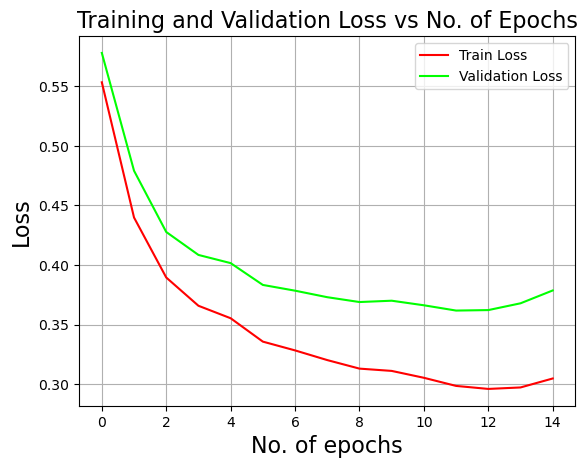

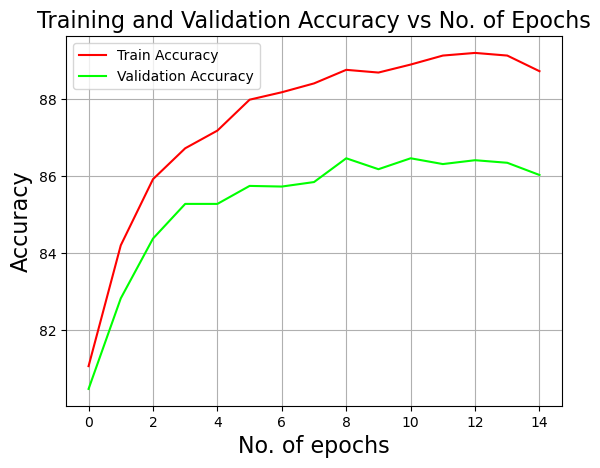

accuracy_train,▁▄▅▆▆▇▇▇███████
accuracy_validation,▁▄▆▇▇▇▇▇██████▇
cost_validation,█▅▃▃▂▂▂▁▁▁▁▁▁▁▂
epochs,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
loss_train,█▅▄▃▃▂▂▂▁▁▁▁▁▁▁
accuracy_train,88.72593
accuracy_validation,86.03333
cost_validation,0.37868
epochs,14
loss_train,0.30483


wandb: Agent Starting Run: 5037lrmo with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 16
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 15
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_15_num_hid_1_loss_cross_entropy_function_batchsize_16_neur_64_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.55  Train accuracy:    80.74 Val error:     0.58 Val accuracy:    79.87
 
 epoch:   3  Train error:      0.37  Train accuracy:    86.55 Val error:     0.41 Val accuracy:    85.03
 
 epoch:   6  Train error:      0.33  Train accuracy:    88.13 Val error:     0.38 Val accuracy:    86.23
 
 epoch:   9  Train error:      0.32  Train accuracy:    88.30 Val error:     0.38 Val accuracy:    85.95
 
 epoch:  12  Train error:      0.30  Train accuracy:    89.05 Val error:     0.37 Val accuracy:    86.38


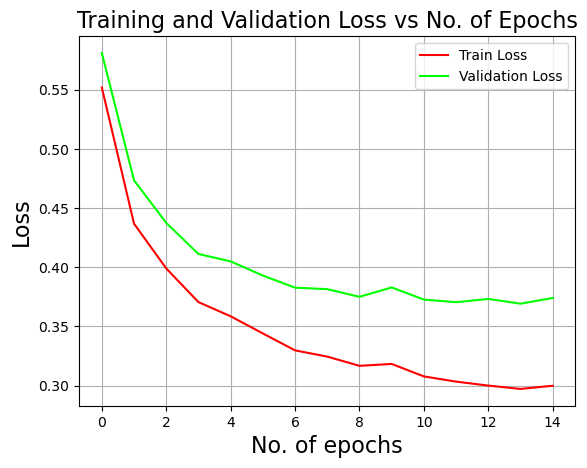

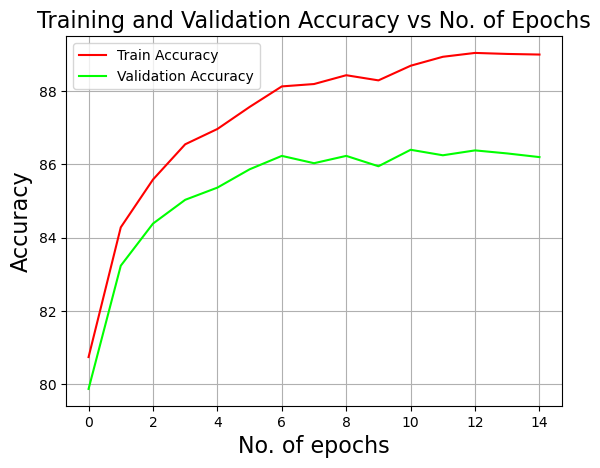

accuracy_train,▁▄▅▆▆▇▇▇▇▇█████
accuracy_validation,▁▅▆▇▇▇█████████
cost_validation,█▄▃▂▂▂▁▁▁▁▁▁▁▁▁
epochs,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
loss_train,█▅▄▃▃▂▂▂▂▂▁▁▁▁▁
accuracy_train,89.00185
accuracy_validation,86.2
cost_validation,0.37401
epochs,14
loss_train,0.29983


wandb: Agent Starting Run: wt199uk3 with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 16
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 20
wandb: 	lambd: 0
wandb: 	learning_rate: 0.01
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 32
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.01_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_20_num_hid_1_loss_cross_entropy_function_batchsize_16_neur_32_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 32, 10]
 
 epoch:   0  Train error:      0.51  Train accuracy:    81.69 Val error:     0.54 Val accuracy:    81.18
 
 epoch:   2  Train error:      0.44  Train accuracy:    84.04 Val error:     0.51 Val accuracy:    82.88
 
 epoch:   4  Train error:      0.43  Train accuracy:    84.69 Val error:     0.50 Val accuracy:    83.30
 
 epoch:   6  Train error:      0.40  Train accuracy:    85.38 Val error:     0.49 Val accuracy:    83.90
 
 epoch:   8  Train error:      0.41  Train accuracy:    85.61 Val error:     0.51 Val accuracy:    83.58
 
 epoch:  10  Train error:      0.39  Train accuracy:    85.92 Val error:     0.51 Val accuracy:    83.90
 
 epoch:  12  Train error:      0.40  Train accuracy:    86.07 Val error:     0.53 Val accuracy:    83.42
 
 epoch:  14  Train error:      0.

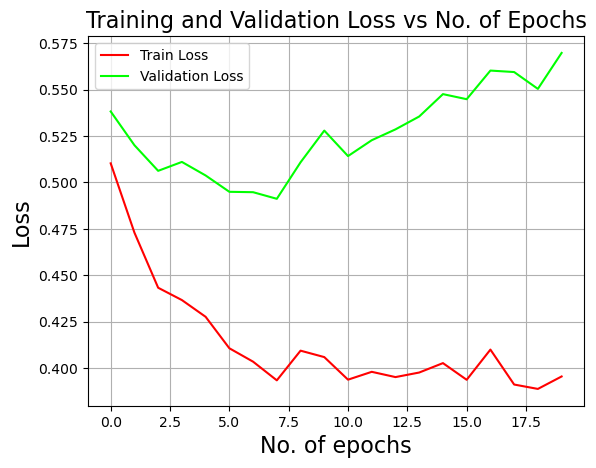

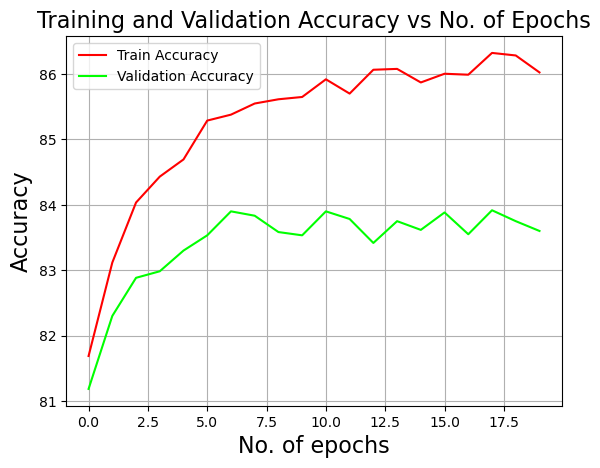

accuracy_train,▁▃▅▅▆▆▇▇▇▇▇▇██▇█▇███
accuracy_validation,▁▄▅▆▆▇██▇▇██▇█▇█▇██▇
cost_validation,▅▄▂▃▂▁▁▁▃▄▃▄▄▅▆▆▇▇▆█
epochs,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss_train,█▆▄▄▃▂▂▁▂▂▁▂▁▂▂▁▂▁▁▁
accuracy_train,86.02593
accuracy_validation,83.6
cost_validation,0.56969
epochs,19
loss_train,0.39555


wandb: Agent Starting Run: ddyiixby with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 16
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 20
wandb: 	lambd: 0
wandb: 	learning_rate: 0.01
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 32
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.01_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_20_num_hid_1_loss_cross_entropy_function_batchsize_16_neur_32_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 32, 10]
 
 epoch:   0  Train error:      0.57  Train accuracy:    80.23 Val error:     0.59 Val accuracy:    78.93
 
 epoch:   2  Train error:      0.46  Train accuracy:    83.83 Val error:     0.51 Val accuracy:    82.80
 
 epoch:   4  Train error:      0.47  Train accuracy:    84.53 Val error:     0.53 Val accuracy:    83.62
 
 epoch:   6  Train error:      0.42  Train accuracy:    85.51 Val error:     0.49 Val accuracy:    84.25
 
 epoch:   8  Train error:      0.42  Train accuracy:    84.98 Val error:     0.50 Val accuracy:    83.70
 
 epoch:  10  Train error:      0.38  Train accuracy:    86.04 Val error:     0.48 Val accuracy:    84.37
 
 epoch:  12  Train error:      0.38  Train accuracy:    86.14 Val error:     0.49 Val accuracy:    84.37
 
 epoch:  14  Train error:      0.3

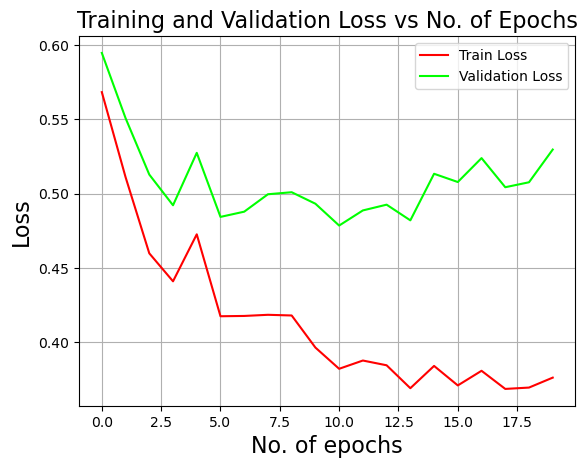

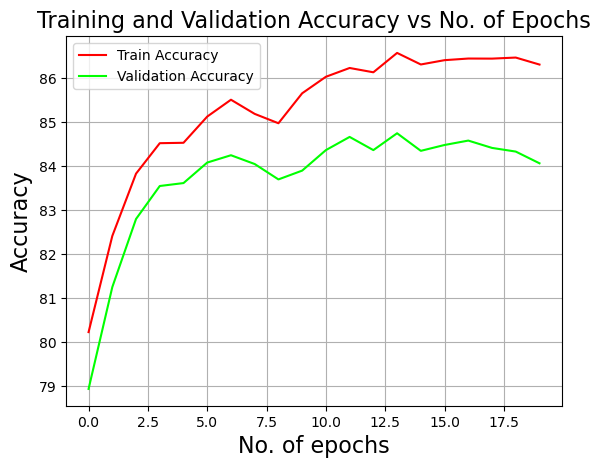

accuracy_train,▁▃▅▆▆▆▇▆▆▇▇█████████
accuracy_validation,▁▄▆▇▇▇▇▇▇▇████████▇▇
cost_validation,█▅▃▂▄▁▂▂▂▂▁▂▂▁▃▃▄▃▃▄
epochs,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss_train,█▆▄▄▅▃▃▃▃▂▁▂▂▁▂▁▁▁▁▁
accuracy_train,86.31296
accuracy_validation,84.06667
cost_validation,0.52963
epochs,19
loss_train,0.37607


wandb: Agent Starting Run: g75x1jqm with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 16
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 20
wandb: 	lambd: 0
wandb: 	learning_rate: 0.01
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.01_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_20_num_hid_1_loss_cross_entropy_function_batchsize_16_neur_64_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.52  Train accuracy:    82.25 Val error:     0.55 Val accuracy:    81.38
 
 epoch:   2  Train error:      0.46  Train accuracy:    83.87 Val error:     0.53 Val accuracy:    82.82
 
 epoch:   4  Train error:      0.42  Train accuracy:    85.17 Val error:     0.50 Val accuracy:    84.08
 
 epoch:   6  Train error:      0.44  Train accuracy:    85.65 Val error:     0.54 Val accuracy:    84.10
 
 epoch:   8  Train error:      0.39  Train accuracy:    86.27 Val error:     0.50 Val accuracy:    84.67
 
 epoch:  10  Train error:      0.39  Train accuracy:    85.84 Val error:     0.51 Val accuracy:    84.15
 
 epoch:  12  Train error:      0.51  Train accuracy:    84.71 Val error:     0.65 Val accuracy:    83.02
 
 epoch:  14  Train error:      0.

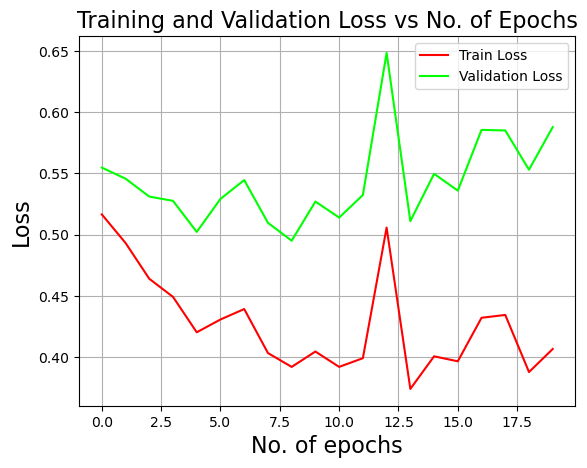

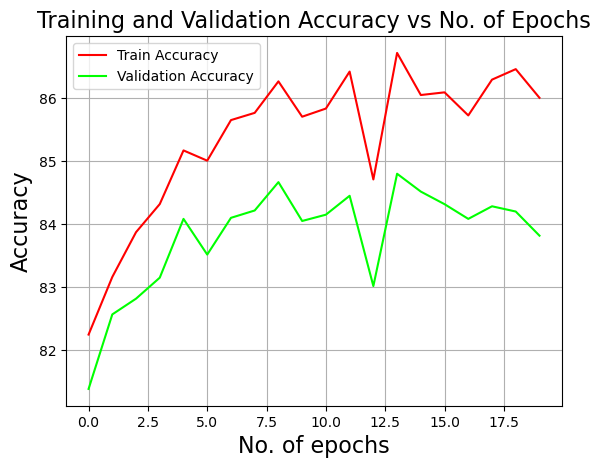

accuracy_train,▁▂▄▄▆▅▆▇▇▆▇█▅█▇▇▆▇█▇
accuracy_validation,▁▃▄▅▇▅▇▇█▆▇▇▄█▇▇▇▇▇▆
cost_validation,▄▃▃▂▁▃▃▂▁▂▂▃█▂▃▃▅▅▄▅
epochs,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss_train,█▇▅▅▃▄▄▂▂▂▂▂▇▁▂▂▄▄▂▃
accuracy_train,86.00556
accuracy_validation,83.81667
cost_validation,0.58787
epochs,19
loss_train,0.40656


wandb: Agent Starting Run: krrogao6 with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 16
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 20
wandb: 	lambd: 0
wandb: 	learning_rate: 0.01
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.01_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_20_num_hid_1_loss_cross_entropy_function_batchsize_16_neur_64_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.55  Train accuracy:    81.55 Val error:     0.59 Val accuracy:    80.33
 
 epoch:   2  Train error:      0.45  Train accuracy:    84.64 Val error:     0.49 Val accuracy:    83.57
 
 epoch:   4  Train error:      0.42  Train accuracy:    85.46 Val error:     0.48 Val accuracy:    84.53
 
 epoch:   6  Train error:      0.41  Train accuracy:    85.78 Val error:     0.50 Val accuracy:    84.67
 
 epoch:   8  Train error:      0.42  Train accuracy:    85.74 Val error:     0.50 Val accuracy:    84.33
 
 epoch:  10  Train error:      0.43  Train accuracy:    85.94 Val error:     0.54 Val accuracy:    84.40
 
 epoch:  12  Train error:      0.41  Train accuracy:    86.33 Val error:     0.52 Val accuracy:    84.60
 
 epoch:  14  Train error:      0.4

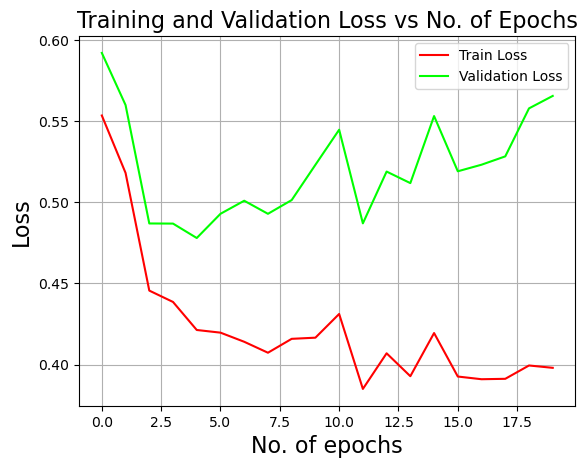

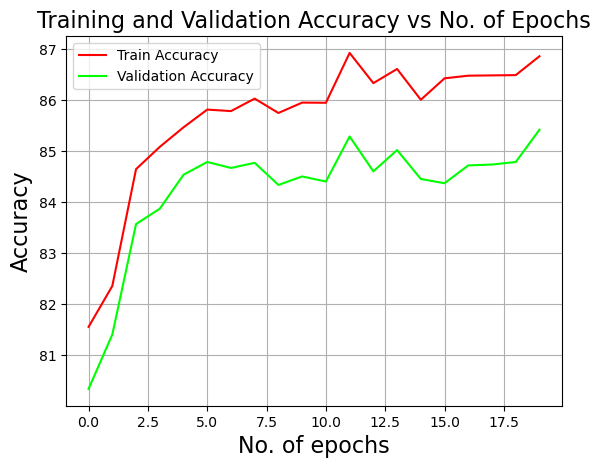

accuracy_train,▁▂▅▆▆▇▇▇▆▇▇█▇█▇▇▇▇▇█
accuracy_validation,▁▂▅▆▇▇▇▇▇▇▇█▇▇▇▇▇▇▇█
cost_validation,█▆▂▂▁▂▂▂▂▄▅▂▄▃▆▄▄▄▆▆
epochs,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss_train,█▇▄▃▃▂▂▂▂▂▃▁▂▁▂▁▁▁▂▂
accuracy_train,86.85741
accuracy_validation,85.41667
cost_validation,0.56547
epochs,19
loss_train,0.39796


wandb: Agent Starting Run: h616ag5f with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 16
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 20
wandb: 	lambd: 0
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 32
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_20_num_hid_1_loss_cross_entropy_function_batchsize_16_neur_32_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 32, 10]
 
 epoch:   0  Train error:      0.60  Train accuracy:    78.18 Val error:     0.62 Val accuracy:    77.82
 
 epoch:   2  Train error:      0.46  Train accuracy:    83.72 Val error:     0.49 Val accuracy:    82.27
 
 epoch:   4  Train error:      0.42  Train accuracy:    84.99 Val error:     0.45 Val accuracy:    84.18
 
 epoch:   6  Train error:      0.40  Train accuracy:    85.70 Val error:     0.43 Val accuracy:    84.72
 
 epoch:   8  Train error:      0.38  Train accuracy:    86.25 Val error:     0.43 Val accuracy:    85.17
 
 epoch:  10  Train error:      0.37  Train accuracy:    86.61 Val error:     0.43 Val accuracy:    85.15
 
 epoch:  12  Train error:      0.36  Train accuracy:    86.87 Val error:     0.42 Val accuracy:    85.35
 
 epoch:  14  Train error:      0

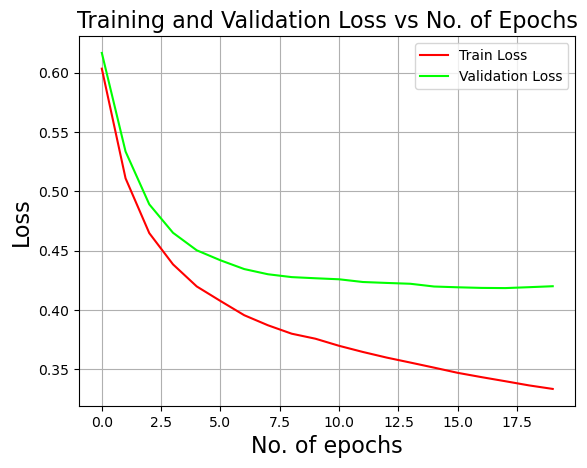

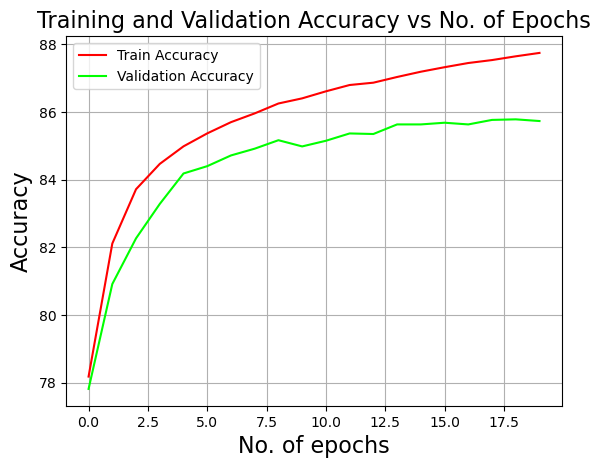

accuracy_train,▁▄▅▆▆▆▇▇▇▇▇▇▇▇██████
accuracy_validation,▁▄▅▆▇▇▇▇▇▇▇█████████
cost_validation,█▅▃▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
epochs,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss_train,█▆▄▄▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁
accuracy_train,87.7463
accuracy_validation,85.73333
cost_validation,0.41996
epochs,19
loss_train,0.33339


wandb: Agent Starting Run: er1whkic with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 16
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 20
wandb: 	lambd: 0
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 32
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_20_num_hid_1_loss_cross_entropy_function_batchsize_16_neur_32_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 32, 10]
 
 epoch:   0  Train error:      0.61  Train accuracy:    78.17 Val error:     0.62 Val accuracy:    77.67
 
 epoch:   2  Train error:      0.46  Train accuracy:    83.71 Val error:     0.49 Val accuracy:    82.33
 
 epoch:   4  Train error:      0.42  Train accuracy:    85.00 Val error:     0.45 Val accuracy:    83.95
 
 epoch:   6  Train error:      0.39  Train accuracy:    85.72 Val error:     0.43 Val accuracy:    84.77
 
 epoch:   8  Train error:      0.38  Train accuracy:    86.28 Val error:     0.42 Val accuracy:    85.07
 
 epoch:  10  Train error:      0.36  Train accuracy:    86.74 Val error:     0.42 Val accuracy:    85.47
 
 epoch:  12  Train error:      0.35  Train accuracy:    87.03 Val error:     0.42 Val accuracy:    85.55
 
 epoch:  14  Train error:      0.

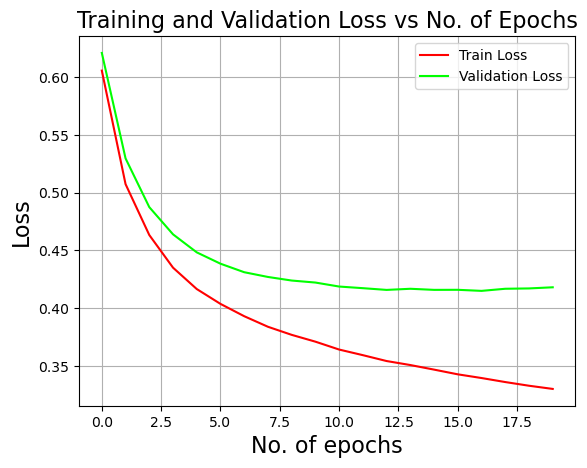

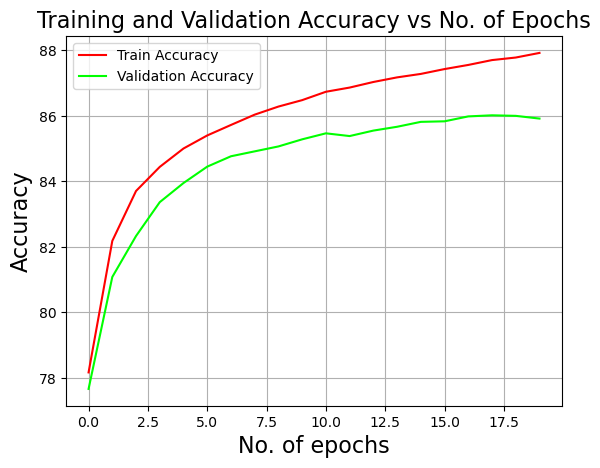

accuracy_train,▁▄▅▆▆▆▆▇▇▇▇▇▇▇██████
accuracy_validation,▁▄▅▆▆▇▇▇▇▇█▇████████
cost_validation,█▅▃▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
epochs,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss_train,█▆▄▄▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁
accuracy_train,87.92037
accuracy_validation,85.91667
cost_validation,0.41814
epochs,19
loss_train,0.33018


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: fv5lifxg with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 16
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 20
wandb: 	lambd: 0
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_20_num_hid_1_loss_cross_entropy_function_batchsize_16_neur_64_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.59  Train accuracy:    80.49 Val error:     0.62 Val accuracy:    79.35
 
 epoch:   2  Train error:      0.41  Train accuracy:    85.28 Val error:     0.46 Val accuracy:    83.92
 
 epoch:   4  Train error:      0.37  Train accuracy:    86.80 Val error:     0.43 Val accuracy:    84.92
 
 epoch:   6  Train error:      0.34  Train accuracy:    87.61 Val error:     0.43 Val accuracy:    85.47
 
 epoch:   8  Train error:      0.33  Train accuracy:    88.19 Val error:     0.42 Val accuracy:    85.95
 
 epoch:  10  Train error:      0.31  Train accuracy:    88.72 Val error:     0.42 Val accuracy:    86.12
 
 epoch:  12  Train error:      0.30  Train accuracy:    89.08 Val error:     0.42 Val accuracy:    86.25
 
 epoch:  14  Train error:      0

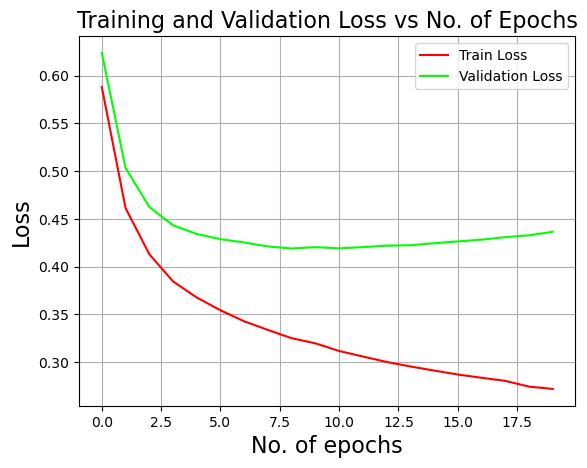

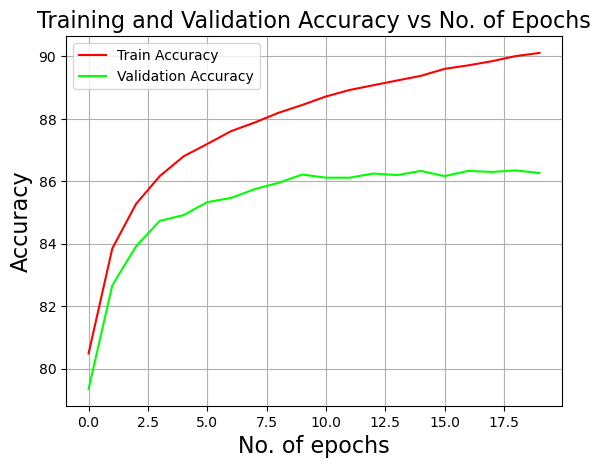

accuracy_train,▁▃▄▅▆▆▆▆▇▇▇▇▇▇▇█████
accuracy_validation,▁▄▆▆▇▇▇▇████████████
cost_validation,█▄▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂
epochs,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss_train,█▅▄▃▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁
accuracy_train,90.11296
accuracy_validation,86.26667
cost_validation,0.43648
epochs,19
loss_train,0.27196


wandb: Agent Starting Run: m6cbk0as with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 16
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 20
wandb: 	lambd: 0
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_20_num_hid_1_loss_cross_entropy_function_batchsize_16_neur_64_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.58  Train accuracy:    80.93 Val error:     0.61 Val accuracy:    79.75
 
 epoch:   2  Train error:      0.41  Train accuracy:    85.42 Val error:     0.46 Val accuracy:    83.93
 
 epoch:   4  Train error:      0.37  Train accuracy:    86.83 Val error:     0.44 Val accuracy:    85.15
 
 epoch:   6  Train error:      0.34  Train accuracy:    87.67 Val error:     0.43 Val accuracy:    85.52
 
 epoch:   8  Train error:      0.33  Train accuracy:    88.24 Val error:     0.42 Val accuracy:    85.82
 
 epoch:  10  Train error:      0.32  Train accuracy:    88.65 Val error:     0.43 Val accuracy:    85.97
 
 epoch:  12  Train error:      0.31  Train accuracy:    88.92 Val error:     0.43 Val accuracy:    85.95
 
 epoch:  14  Train error:      0.

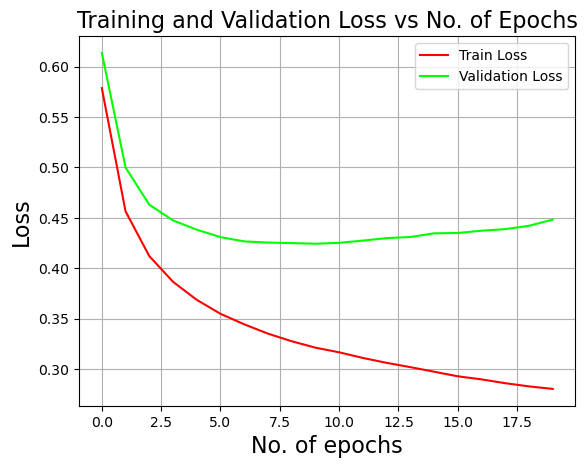

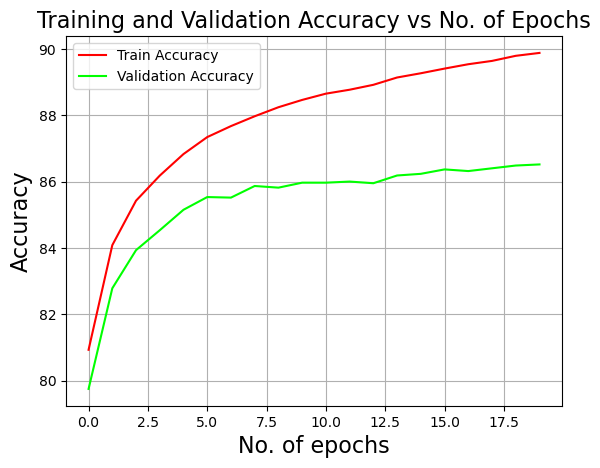

accuracy_train,▁▃▅▅▆▆▆▇▇▇▇▇▇▇██████
accuracy_validation,▁▄▅▆▇▇▇▇▇▇▇▇▇███████
cost_validation,█▄▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▂▂▂
epochs,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss_train,█▅▄▃▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁
accuracy_train,89.87778
accuracy_validation,86.51667
cost_validation,0.4483
epochs,19
loss_train,0.28038


wandb: Agent Starting Run: 1qeqa4pr with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 16
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 20
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.01
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 32
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.01_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_20_num_hid_1_loss_cross_entropy_function_batchsize_16_neur_32_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 32, 10]
 
 epoch:   0  Train error:      0.62  Train accuracy:    77.78 Val error:     0.64 Val accuracy:    76.67
 
 epoch:   2  Train error:      0.51  Train accuracy:    81.14 Val error:     0.54 Val accuracy:    80.37
 
 epoch:   4  Train error:      0.53  Train accuracy:    81.00 Val error:     0.56 Val accuracy:    80.78
 
 epoch:   6  Train error:      0.50  Train accuracy:    82.18 Val error:     0.53 Val accuracy:    81.58
 
 epoch:   8  Train error:      0.49  Train accuracy:    81.91 Val error:     0.51 Val accuracy:    81.57
 
 epoch:  10  Train error:      0.47  Train accuracy:    82.39 Val error:     0.49 Val accuracy:    81.72
 
 epoch:  12  Train error:      0.49  Train accuracy:    81.76 Val error:     0.51 Val accuracy:    81.17
 
 epoch:  14  Train error:    

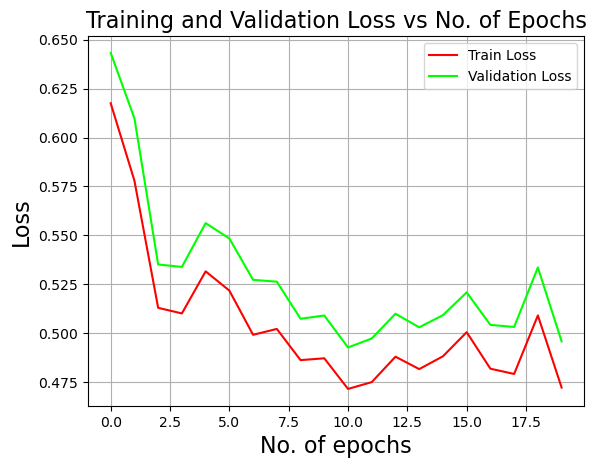

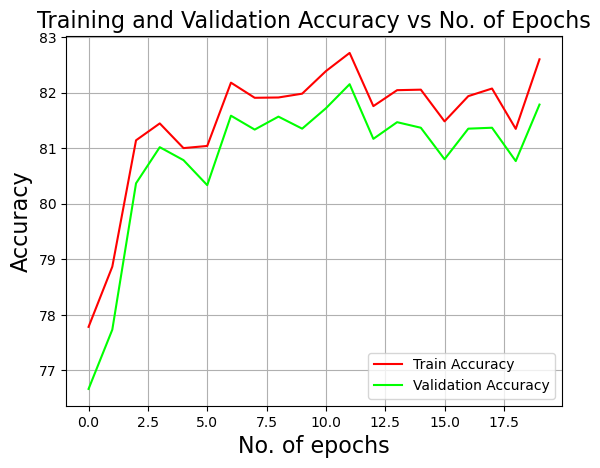

accuracy_train,▁▃▆▆▆▆▇▇▇▇██▇▇▇▆▇▇▆█
accuracy_validation,▁▂▆▇▆▆▇▇▇▇▇█▇▇▇▆▇▇▆█
cost_validation,█▆▃▃▄▄▃▃▂▂▁▁▂▁▂▂▂▁▃▁
epochs,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss_train,█▆▃▃▄▃▂▂▂▂▁▁▂▁▂▂▁▁▃▁
accuracy_train,82.59815
accuracy_validation,81.78333
cost_validation,0.49581
epochs,19
loss_train,0.47219


wandb: Agent Starting Run: rsn765xb with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 16
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 20
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.01
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 32
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.01_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_20_num_hid_1_loss_cross_entropy_function_batchsize_16_neur_32_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 32, 10]
 
 epoch:   0  Train error:      0.62  Train accuracy:    76.52 Val error:     0.65 Val accuracy:    75.70
 
 epoch:   2  Train error:      0.56  Train accuracy:    80.19 Val error:     0.58 Val accuracy:    79.58
 
 epoch:   4  Train error:      0.53  Train accuracy:    80.81 Val error:     0.55 Val accuracy:    80.32
 
 epoch:   6  Train error:      0.48  Train accuracy:    82.53 Val error:     0.50 Val accuracy:    82.27
 
 epoch:   8  Train error:      0.46  Train accuracy:    82.98 Val error:     0.48 Val accuracy:    82.72
 
 epoch:  10  Train error:      0.48  Train accuracy:    82.60 Val error:     0.50 Val accuracy:    82.52
 
 epoch:  12  Train error:      0.47  Train accuracy:    82.65 Val error:     0.49 Val accuracy:    82.77
 
 epoch:  14  Train error:     

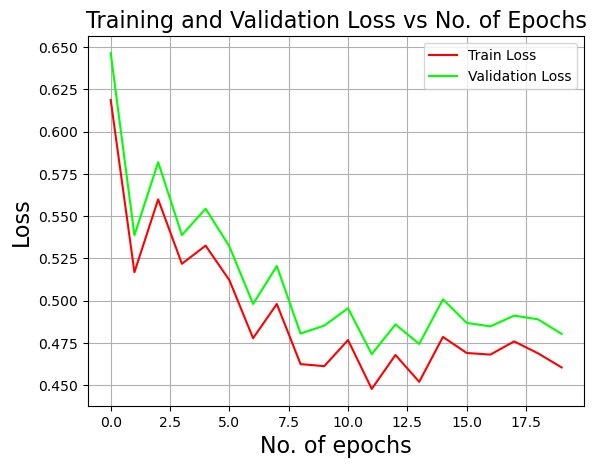

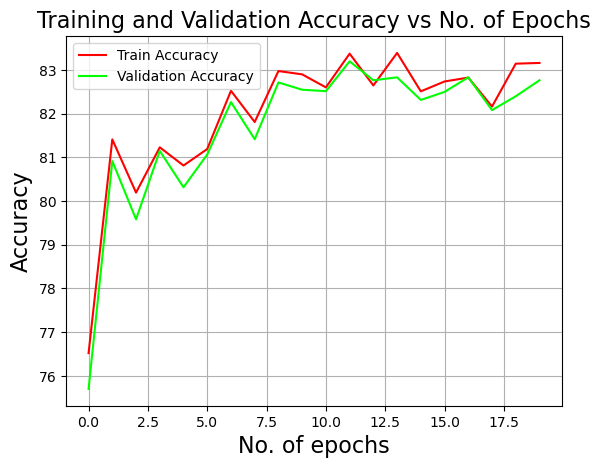

accuracy_train,▁▆▅▆▅▆▇▆██▇█▇█▇▇▇▇██
accuracy_validation,▁▆▅▆▅▆▇▆█▇▇███▇▇█▇▇█
cost_validation,█▄▅▄▄▄▂▃▁▂▂▁▂▁▂▂▂▂▂▁
epochs,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss_train,█▄▆▄▄▄▂▃▂▂▂▁▂▁▂▂▂▂▂▂
accuracy_train,83.16296
accuracy_validation,82.76667
cost_validation,0.48033
epochs,19
loss_train,0.46051


wandb: Agent Starting Run: 507zq6t7 with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 16
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 20
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.01
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.01_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_20_num_hid_1_loss_cross_entropy_function_batchsize_16_neur_64_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.59  Train accuracy:    78.56 Val error:     0.62 Val accuracy:    77.33
 
 epoch:   2  Train error:      0.52  Train accuracy:    81.05 Val error:     0.54 Val accuracy:    80.10
 
 epoch:   4  Train error:      0.49  Train accuracy:    82.40 Val error:     0.51 Val accuracy:    82.15
 
 epoch:   6  Train error:      0.46  Train accuracy:    83.23 Val error:     0.48 Val accuracy:    82.97
 
 epoch:   8  Train error:      0.47  Train accuracy:    83.12 Val error:     0.50 Val accuracy:    82.82
 
 epoch:  10  Train error:      0.49  Train accuracy:    82.50 Val error:     0.52 Val accuracy:    82.20
 
 epoch:  12  Train error:      0.47  Train accuracy:    82.70 Val error:     0.50 Val accuracy:    82.37
 
 epoch:  14  Train error:    

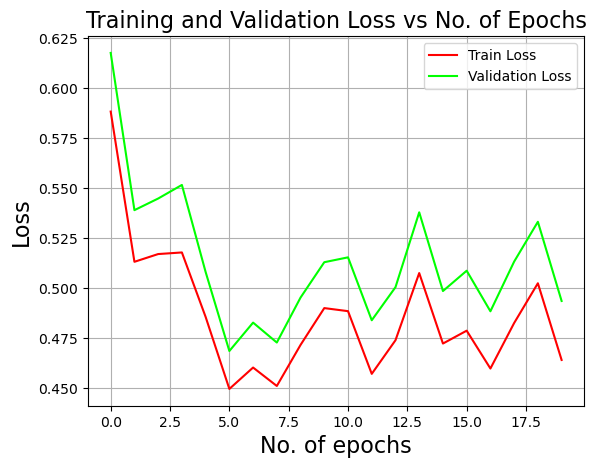

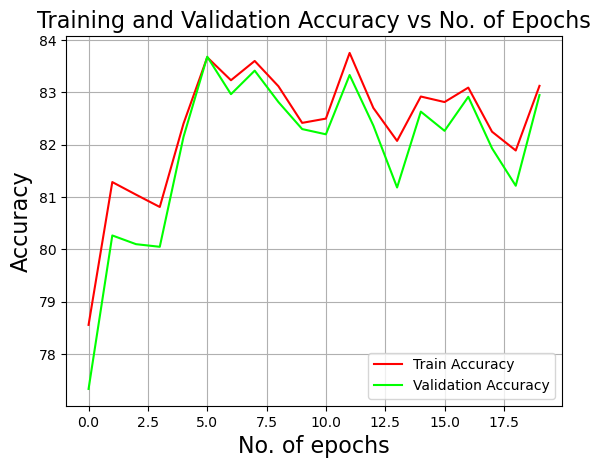

accuracy_train,▁▅▄▄▆█▇█▇▆▆█▇▆▇▇▇▆▅▇
accuracy_validation,▁▄▄▄▆█▇█▇▆▆█▇▅▇▆▇▆▅▇
cost_validation,█▄▅▅▃▁▂▁▂▃▃▂▂▄▂▃▂▃▄▂
epochs,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss_train,█▄▄▄▃▁▂▁▂▃▃▁▂▄▂▂▂▃▄▂
accuracy_train,83.12593
accuracy_validation,82.95
cost_validation,0.49358
epochs,19
loss_train,0.46409


wandb: Agent Starting Run: wvjrl3x0 with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 16
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 20
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.01
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.01_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_20_num_hid_1_loss_cross_entropy_function_batchsize_16_neur_64_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.53  Train accuracy:    81.30 Val error:     0.55 Val accuracy:    80.50
 
 epoch:   2  Train error:      0.55  Train accuracy:    79.86 Val error:     0.57 Val accuracy:    79.37
 
 epoch:   4  Train error:      0.50  Train accuracy:    81.58 Val error:     0.52 Val accuracy:    80.73
 
 epoch:   6  Train error:      0.52  Train accuracy:    80.43 Val error:     0.54 Val accuracy:    79.90
 
 epoch:   8  Train error:      0.50  Train accuracy:    81.43 Val error:     0.53 Val accuracy:    80.40
 
 epoch:  10  Train error:      0.49  Train accuracy:    81.43 Val error:     0.52 Val accuracy:    80.65
 
 epoch:  12  Train error:      0.46  Train accuracy:    82.23 Val error:     0.49 Val accuracy:    81.58
 
 epoch:  14  Train error:     

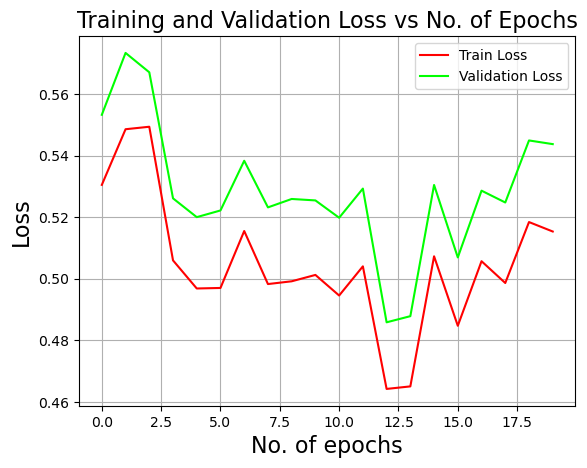

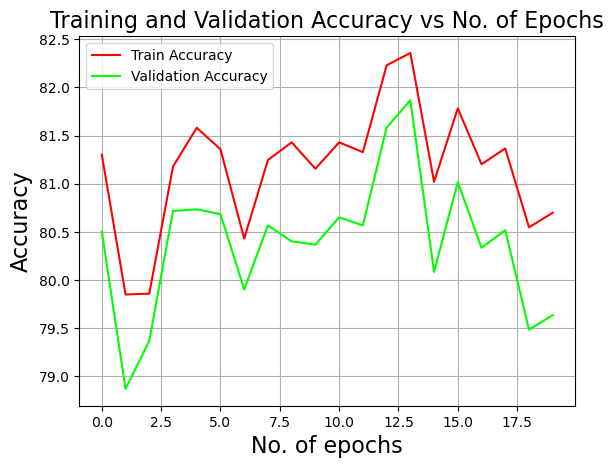

accuracy_train,▅▁▁▅▆▅▃▅▅▅▅▅██▄▆▅▅▃▃
accuracy_validation,▅▁▂▅▅▅▃▅▅▅▅▅▇█▄▆▄▅▂▃
cost_validation,▆█▇▄▄▄▅▄▄▄▄▄▁▁▅▃▄▄▆▆
epochs,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss_train,▆██▄▄▄▅▄▄▄▃▄▁▁▅▃▄▄▅▅
accuracy_train,80.69815
accuracy_validation,79.63333
cost_validation,0.54377
epochs,19
loss_train,0.51537


wandb: Agent Starting Run: 1jrz1fsu with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 16
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 20
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 32
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_20_num_hid_1_loss_cross_entropy_function_batchsize_16_neur_32_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 32, 10]
 
 epoch:   0  Train error:      0.56  Train accuracy:    80.23 Val error:     0.58 Val accuracy:    79.42
 
 epoch:   2  Train error:      0.41  Train accuracy:    85.21 Val error:     0.44 Val accuracy:    84.17
 
 epoch:   4  Train error:      0.37  Train accuracy:    86.79 Val error:     0.40 Val accuracy:    85.55
 
 epoch:   6  Train error:      0.35  Train accuracy:    87.61 Val error:     0.39 Val accuracy:    85.88
 
 epoch:   8  Train error:      0.34  Train accuracy:    87.80 Val error:     0.39 Val accuracy:    86.02
 
 epoch:  10  Train error:      0.33  Train accuracy:    87.95 Val error:     0.38 Val accuracy:    86.20
 
 epoch:  12  Train error:      0.33  Train accuracy:    88.09 Val error:     0.38 Val accuracy:    86.15
 
 epoch:  14  Train error:   

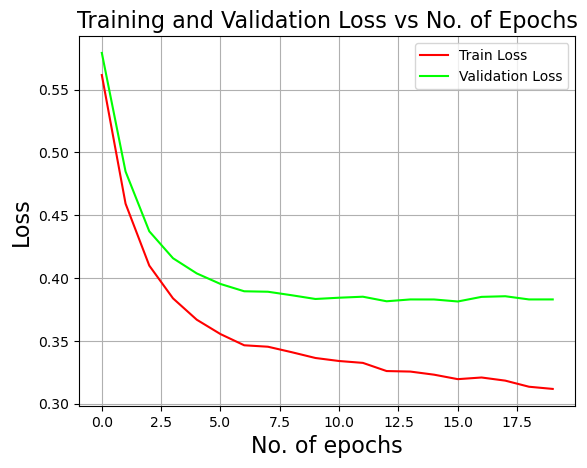

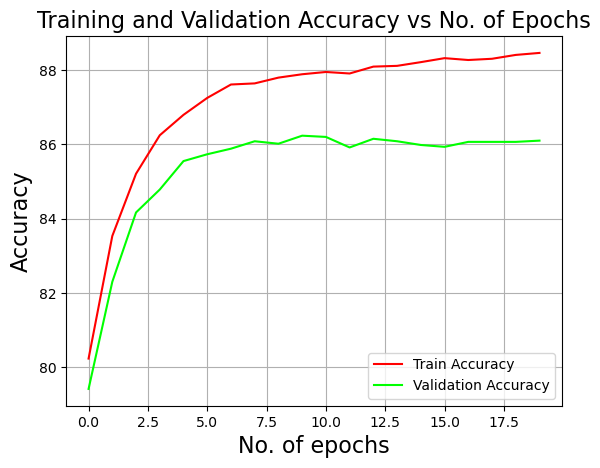

accuracy_train,▁▄▅▆▇▇▇▇▇███████████
accuracy_validation,▁▄▆▇▇▇██████████████
cost_validation,█▅▃▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epochs,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss_train,█▅▄▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁
accuracy_train,88.46111
accuracy_validation,86.1
cost_validation,0.383
epochs,19
loss_train,0.3118


wandb: Agent Starting Run: lvvynp5w with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 16
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 20
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 32
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_20_num_hid_1_loss_cross_entropy_function_batchsize_16_neur_32_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 32, 10]
 
 epoch:   0  Train error:      0.57  Train accuracy:    80.23 Val error:     0.58 Val accuracy:    79.50
 
 epoch:   2  Train error:      0.41  Train accuracy:    85.28 Val error:     0.44 Val accuracy:    84.05
 
 epoch:   4  Train error:      0.37  Train accuracy:    86.79 Val error:     0.40 Val accuracy:    85.55
 
 epoch:   6  Train error:      0.35  Train accuracy:    87.23 Val error:     0.39 Val accuracy:    85.87
 
 epoch:   8  Train error:      0.34  Train accuracy:    87.87 Val error:     0.39 Val accuracy:    86.18
 
 epoch:  10  Train error:      0.33  Train accuracy:    88.19 Val error:     0.38 Val accuracy:    86.02
 
 epoch:  12  Train error:      0.32  Train accuracy:    88.22 Val error:     0.38 Val accuracy:    86.12
 
 epoch:  14  Train error:    

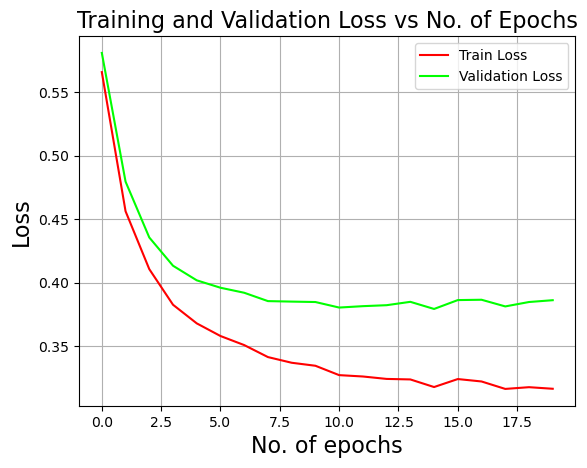

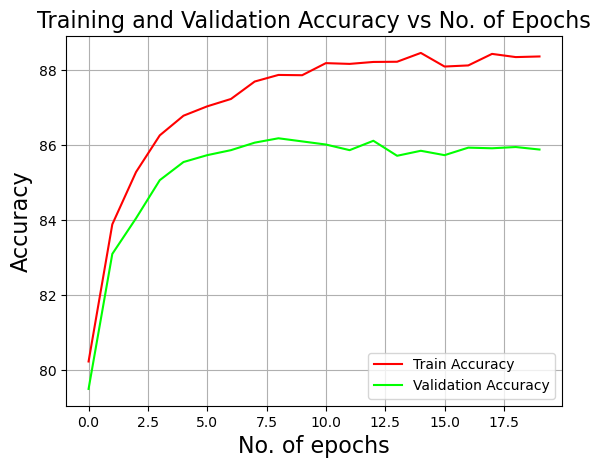

accuracy_train,▁▄▅▆▇▇▇▇█▇██████████
accuracy_validation,▁▅▆▇▇███████████████
cost_validation,█▄▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epochs,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss_train,█▅▄▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
accuracy_train,88.36481
accuracy_validation,85.88333
cost_validation,0.38617
epochs,19
loss_train,0.31641


wandb: Agent Starting Run: 3okafban with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 16
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 20
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_20_num_hid_1_loss_cross_entropy_function_batchsize_16_neur_64_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.55  Train accuracy:    81.07 Val error:     0.58 Val accuracy:    80.48
 
 epoch:   2  Train error:      0.39  Train accuracy:    85.92 Val error:     0.43 Val accuracy:    84.38
 
 epoch:   4  Train error:      0.36  Train accuracy:    87.19 Val error:     0.40 Val accuracy:    85.28
 
 epoch:   6  Train error:      0.33  Train accuracy:    88.18 Val error:     0.38 Val accuracy:    85.73
 
 epoch:   8  Train error:      0.31  Train accuracy:    88.76 Val error:     0.37 Val accuracy:    86.47
 
 epoch:  10  Train error:      0.31  Train accuracy:    88.90 Val error:     0.37 Val accuracy:    86.47
 
 epoch:  12  Train error:      0.30  Train accuracy:    89.20 Val error:     0.36 Val accuracy:    86.42
 
 epoch:  14  Train error:   

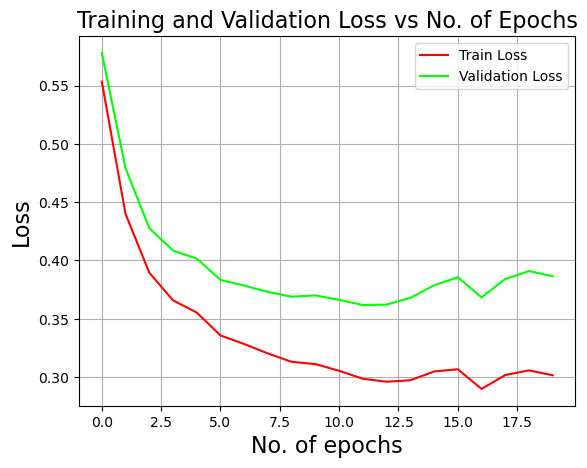

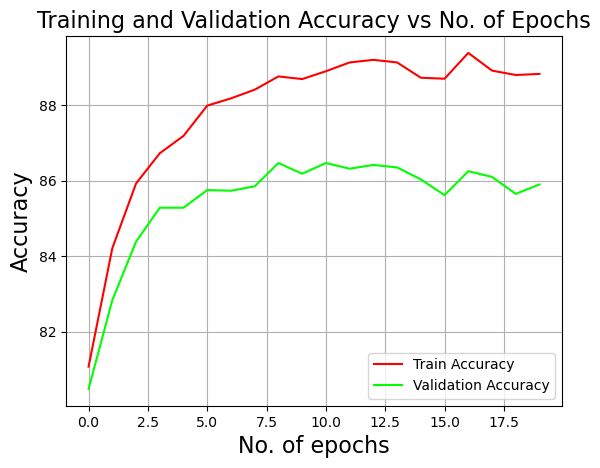

accuracy_train,▁▄▅▆▆▇▇▇▇▇████▇▇████
accuracy_validation,▁▄▆▇▇▇▇▇██████▇▇██▇▇
cost_validation,█▅▃▃▂▂▂▁▁▁▁▁▁▁▂▂▁▂▂▂
epochs,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss_train,█▅▄▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
accuracy_train,88.82778
accuracy_validation,85.9
cost_validation,0.38646
epochs,19
loss_train,0.30159


wandb: Agent Starting Run: xy146gsk with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 16
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 20
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_20_num_hid_1_loss_cross_entropy_function_batchsize_16_neur_64_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.55  Train accuracy:    80.74 Val error:     0.58 Val accuracy:    79.87
 
 epoch:   2  Train error:      0.40  Train accuracy:    85.59 Val error:     0.44 Val accuracy:    84.38
 
 epoch:   4  Train error:      0.36  Train accuracy:    86.97 Val error:     0.40 Val accuracy:    85.37
 
 epoch:   6  Train error:      0.33  Train accuracy:    88.13 Val error:     0.38 Val accuracy:    86.23
 
 epoch:   8  Train error:      0.32  Train accuracy:    88.44 Val error:     0.37 Val accuracy:    86.23
 
 epoch:  10  Train error:      0.31  Train accuracy:    88.70 Val error:     0.37 Val accuracy:    86.40
 
 epoch:  12  Train error:      0.30  Train accuracy:    89.05 Val error:     0.37 Val accuracy:    86.38
 
 epoch:  14  Train error:    

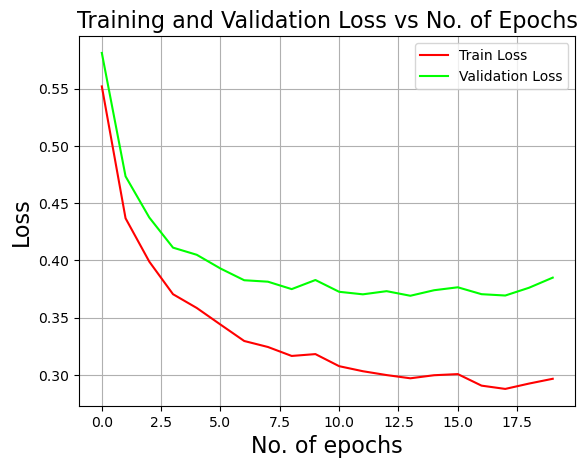

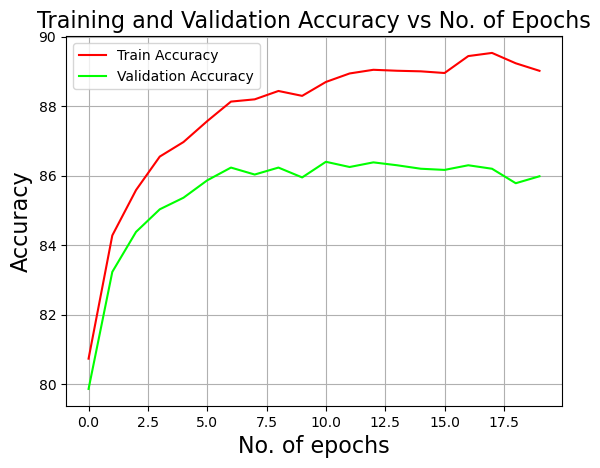

accuracy_train,▁▄▅▆▆▆▇▇▇▇▇█████████
accuracy_validation,▁▅▆▇▇▇████████████▇█
cost_validation,█▄▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▂
epochs,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss_train,█▅▄▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁
accuracy_train,89.01667
accuracy_validation,85.98333
cost_validation,0.385
epochs,19
loss_train,0.29673


wandb: Sweep Agent: Waiting for job.
wandb: Sweep Agent: Exiting.


In [198]:
'''data augmentation-gaussian error addition'''
sweep_config = {
  "name": "Loss and Accuracy-Highest validation accuracy",
  "metric": {
      "name":"accuracy_validation",
      "goal": "maximize"
  },
  "method": "grid",
  "parameters": {
        "learning_rate": {
            "values": [0.01,0.001]
        },
        "activation": {
            "values": ["relu_function"]
        },
        "weight_init": {
            "values": ["random_initialization"]
        },
        "optimizer": {
            "values": ["nadam","adam"]
        },
        "batch_size": {
            "values": [8,16]
        },
        "epochs": {
            "values": [10,15,20]
        },
        "lambd": {
            "values": [0,0.001]
        },
        "neurons": {
            "values": [32,64]
        },
        "num_hidden_layers": {
            "values": [1]
        },
        "momentum": {
            "values": [0.9]
        },
        "beta": {
            "values": [0.9]
        },
        "beta1": {
            "values": [0.9]
        },
        "beta2": {
            "values": [0.99]
        },
        "loss": {
            "values": ['cross_entropy_function']
        }
    }
}

sweep_id = wandb.sweep(sweep_config, project="CS6910_DL_ASS1")
wandb.agent(sweep_id, neural_network)



Create sweep with ID: 90p0dhbq
Sweep URL: https://wandb.ai/ananthu2014/CS6910_DL_ASS1/sweeps/90p0dhbq


wandb: Agent Starting Run: a8m6x66x with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 32
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 20
wandb: 	lambd: 0
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_20_num_hid_1_loss_cross_entropy_function_batchsize_32_neur_64_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.78  Train accuracy:    70.98 Val error:     0.76 Val accuracy:    74.58
 
 epoch:   2  Train error:      0.58  Train accuracy:    78.28 Val error:     0.59 Val accuracy:    80.35
 
 epoch:   4  Train error:      0.50  Train accuracy:    81.15 Val error:     0.54 Val accuracy:    82.20
 
 epoch:   6  Train error:      0.46  Train accuracy:    82.80 Val error:     0.51 Val accuracy:    83.40
 
 epoch:   8  Train error:      0.43  Train accuracy:    83.79 Val error:     0.50 Val accuracy:    84.10
 
 epoch:  10  Train error:      0.41  Train accuracy:    84.57 Val error:     0.49 Val accuracy:    84.25
 
 epoch:  12  Train error:      0.40  Train accuracy:    85.22 Val error:     0.49 Val accuracy:    84.50
 
 epoch:  14  Train error:      0.

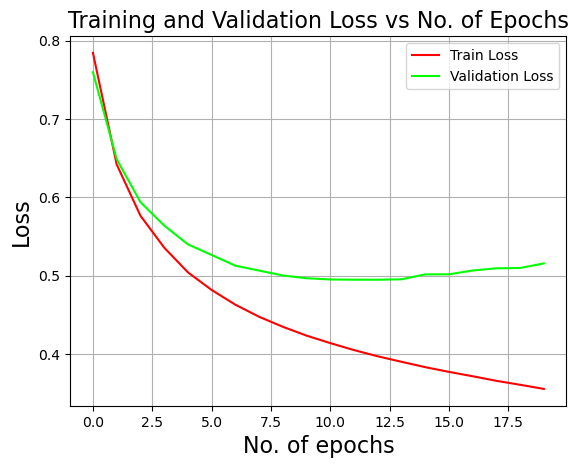

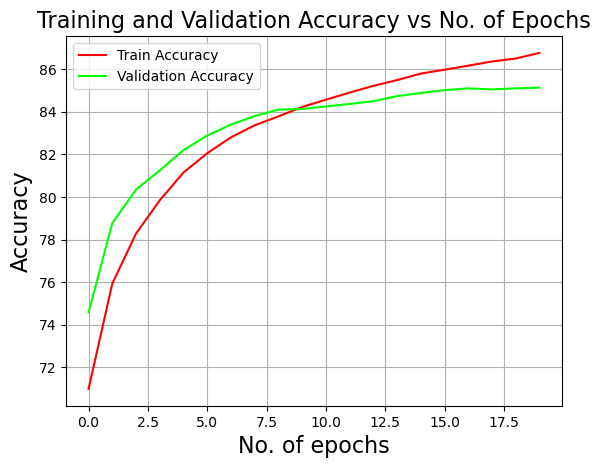

accuracy_train,▁▃▄▅▆▆▆▆▇▇▇▇▇▇██████
accuracy_validation,▁▄▅▅▆▇▇▇▇▇▇▇████████
cost_validation,█▅▄▃▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▂
epochs,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss_train,█▆▅▄▃▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁
accuracy_train,86.76481
accuracy_validation,85.13333
cost_validation,0.51549
epochs,19
loss_train,0.35516


wandb: Sweep Agent: Waiting for job.
wandb: Sweep Agent: Exiting.


In [60]:
'''data augmentation-gaussian error addition'''
sweep_config = {
  "name": "Loss and Accuracy-Highest validation accuracy",
  "metric": {
      "name":"accuracy_validation",
      "goal": "maximize"
  },
  "method": "grid",
  "parameters": {
        "learning_rate": {
            "values": [0.001]
        },
        "activation": {
            "values": ["relu_function"]
        },
        "weight_init": {
            "values": ["random_initialization"]
        },
        "optimizer": {
            "values": ["adam"]
        },
        "batch_size": {
            "values": [32]
        },
        "epochs": {
            "values": [20]
        },
        "lambd": {
            "values": [0]
        },
        "neurons": {
            "values": [64]
        },
        "num_hidden_layers": {
            "values": [1]
        },
        "momentum": {
            "values": [0.9]
        },
        "beta": {
            "values": [0.9]
        },
        "beta1": {
            "values": [0.9]
        },
        "beta2": {
            "values": [0.99]
        },
        "loss": {
            "values": ['cross_entropy_function']
        }
    }
}

sweep_id = wandb.sweep(sweep_config, project="CS6910_DL_ASS1")
wandb.agent(sweep_id, neural_network)



In [73]:
'''MNIST DATASET'''
'''LOADING TRAIN AND TEST DATA SET'''
(X_train_MNIST,Y_train_MNIST),(X_test_MNIST,Y_test_MNIST) = mnist.load_data()

In [74]:
print(f'Shape of input train data is : {X_train_MNIST.shape}')
print(f'Shape of input test data is : {X_test_MNIST.shape}')
print(f'Shape of output train data is : {Y_train_MNIST.shape}')
print(f'Shape of output test data is : {Y_test_MNIST.shape}')

Shape of input train data is : (60000, 28, 28)
Shape of input test data is : (10000, 28, 28)
Shape of output train data is : (60000,)
Shape of output test data is : (10000,)


In [75]:
'''CHANGING THE SHAPE OF INPUT DATA'''
x_train_MNIST=np.zeros((60000,784))
for i in range(X_train_MNIST.shape[0]):
    a=X_train_MNIST[i].reshape(1,784)
    x_train_MNIST[i]=a
print('Train data',x_train_MNIST.shape)
x_test_MNIST=np.zeros((10000,784))
for i in range(X_test_MNIST.shape[0]):
    a=X_test_MNIST[i].reshape(1,784)
    x_test_MNIST[i]=a
print('Test data',x_test_MNIST.shape)

Train data (60000, 784)
Test data (10000, 784)


In [76]:
'''CONVERTING OUTPUT DATA INTO ONE HOT VECTOR FORM'''
a = np.max(Y_train_MNIST)+1
y_train_MNIST=np.zeros((Y_train_MNIST.shape[0],a))
for i in range(Y_train_MNIST.shape[0]):
    for j in range(a):
        if Y_train_MNIST[i]==j:
            y_train_MNIST[i,j]=1
print('Train data',y_train_MNIST.shape)
y_test_MNIST=np.zeros((Y_test_MNIST.shape[0],a))
for i in range(Y_test_MNIST.shape[0]):
    for j in range(a):
        if Y_test_MNIST[i]==j:
            y_test_MNIST[i,j]=1
#print(y_test[0,:])
print('Test data',y_test_MNIST.shape)

Train data (60000, 10)
Test data (10000, 10)


In [77]:
'''CREATING VALIDATION DATA SET'''
'''The input data is split into train and validation data where validation comprises of 10% of the data.'''

x_train_MNIST,x_val_MNIST,y_train_MNIST,y_val_MNIST = train_test_split(x_train_MNIST,y_train_MNIST,test_size=0.10,random_state=10)
x_train_MNIST=x_train_MNIST.T/255
y_train_MNIST=y_train_MNIST.T
x_test_MNIST=x_test_MNIST.T/255
y_test_MNIST=y_test_MNIST.T
x_val_MNIST=x_val_MNIST.T/255
y_val_MNIST=y_val_MNIST.T
print(f'The shape of train data is:{x_train_MNIST.shape}')
print(f'The shape of test data is:{x_test_MNIST.shape}')
print(f'The shape of validation data is:{x_val_MNIST.shape}')

The shape of train data is:(784, 54000)
The shape of test data is:(784, 10000)
The shape of validation data is:(784, 6000)


Create sweep with ID: hbbovfqh
Sweep URL: https://wandb.ai/ananthu2014/CS6910_DL_ASS1/sweeps/hbbovfqh


wandb: Agent Starting Run: 5qhu8rch with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 16
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 20
wandb: 	lambd: 0
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 128
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_20_num_hid_1_loss_cross_entropy_function_batchsize_16_neur_128_lam_0_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 128, 10]
 
 epoch:   0  Train error:      0.49  Train accuracy:    91.83 Val error:     0.61 Val accuracy:    90.77
 
 epoch:   2  Train error:      0.20  Train accuracy:    95.76 Val error:     0.35 Val accuracy:    93.90
 
 epoch:   4  Train error:      0.11  Train accuracy:    97.38 Val error:     0.28 Val accuracy:    94.65
 
 epoch:   6  Train error:      0.07  Train accuracy:    98.14 Val error:     0.25 Val accuracy:    95.08
 
 epoch:   8  Train error:      0.05  Train accuracy:    98.64 Val error:     0.23 Val accuracy:    95.20
 
 epoch:  10  Train error:      0.04  Train accuracy:    98.92 Val error:     0.23 Val accuracy:    95.35
 
 epoch:  12  Train error:      0.03  Train accuracy:    99.11 Val error:     0.23 Val accuracy:    95.55
 
 epoch:  14  Train error:      

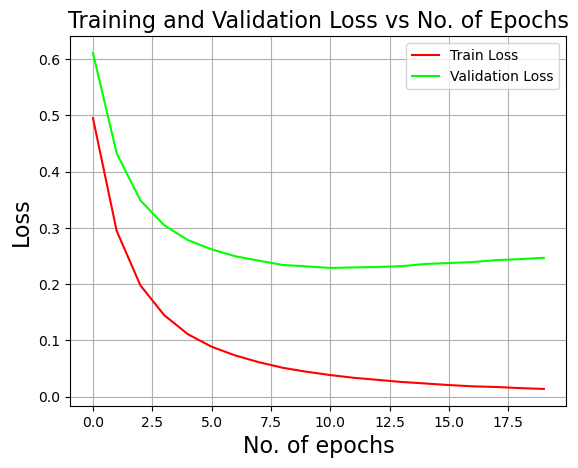

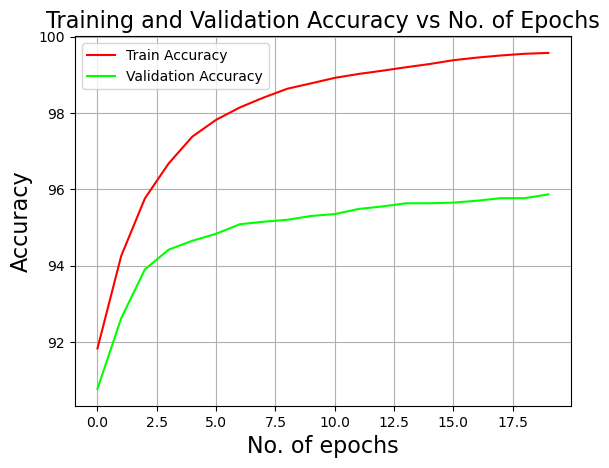

accuracy_train,▁▃▅▅▆▆▇▇▇▇▇█████████
accuracy_validation,▁▄▅▆▆▇▇▇▇▇▇▇████████
cost_validation,█▅▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epochs,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss_train,█▅▄▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
accuracy_train,99.57407
accuracy_validation,95.86667
cost_validation,0.24672
epochs,19
loss_train,0.01385


wandb: Sweep Agent: Waiting for job.
wandb: Sweep Agent: Exiting.


In [31]:
'''HIGHEST ACCURACY PLOT FOR MNIST DATASET'''
sweep_config = {
  "name": "Loss and Accuracy-MNIST",
  "metric": {
      "name":"accuracy_validation",
      "goal": "maximize"
  },
  "method": "grid",
  "parameters": {
        "learning_rate": {
            "values": [0.001]
        },
        "activation": {
            "values": ["relu_function"]
        },
        "weight_init": {
            "values": ["random_initialization"]
        },
        "optimizer": {
            "values": ["adam"]
        },
        "batch_size": {
            "values": [16]
        },
        "epochs": {
            "values": [20]
        },
        "lambd": {
            "values": [0]
        },
        "neurons": {
            "values": [128]
        },
        "num_hidden_layers": {
            "values": [1]
        },
        "momentum": {
            "values": [0.9]
        },
        "beta": {
            "values": [0.9]
        },
        "beta1": {
            "values": [0.9]
        },
        "beta2": {
            "values": [0.99]
        },
        "loss": {
            "values": ['cross_entropy_function']
        }
    }
}

sweep_id = wandb.sweep(sweep_config, project="CS6910_DL_ASS1")
wandb.agent(sweep_id, neural_network)



Create sweep with ID: hugsgssl
Sweep URL: https://wandb.ai/ananthu2014/CS6910_DL_ASS1/sweeps/hugsgssl


wandb: Agent Starting Run: fk12wu04 with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 10
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_10_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_64_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.26  Train accuracy:    92.76 Val error:     0.29 Val accuracy:    92.32
 
 epoch:   1  Train error:      0.15  Train accuracy:    95.68 Val error:     0.18 Val accuracy:    94.70
 
 epoch:   2  Train error:      0.11  Train accuracy:    96.81 Val error:     0.14 Val accuracy:    95.95
 
 epoch:   3  Train error:      0.10  Train accuracy:    97.25 Val error:     0.12 Val accuracy:    96.40
 
 epoch:   4  Train error:      0.09  Train accuracy:    97.56 Val error:     0.11 Val accuracy:    96.60
 
 epoch:   5  Train error:      0.08  Train accuracy:    97.69 Val error:     0.11 Val accuracy:    96.77
 
 epoch:   6  Train error:      0.08  Train accuracy:    97.78 Val error:     0.10 Val accuracy:    96.90
 
 epoch:   7  Train error:     

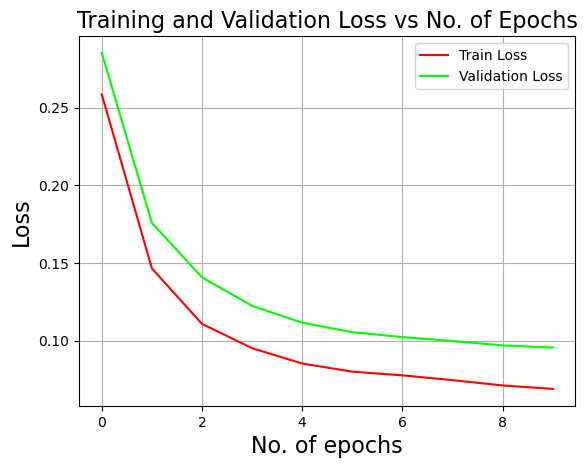

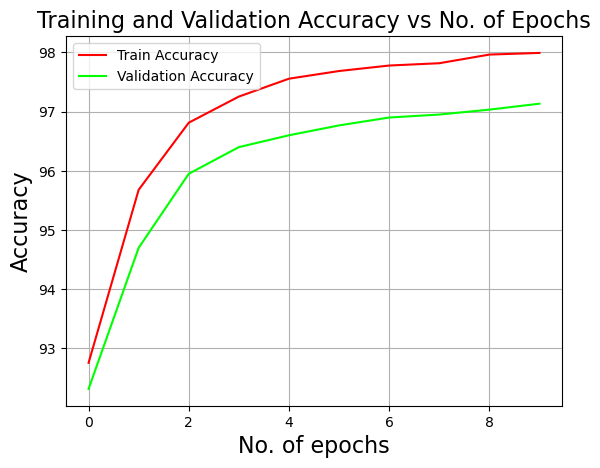

wandb: WARNING Calling wandb.run.save without any arguments is deprecated.Changes to attributes are automatically persisted.


accuracy_train,▁▅▆▇▇█████
accuracy_validation,▁▄▆▇▇▇████
cost_validation,█▄▃▂▂▁▁▁▁▁
epochs,▁▂▃▃▄▅▆▆▇█
loss_train,█▄▃▂▂▁▁▁▁▁
accuracy_train,97.99074
accuracy_validation,97.13333
cost_validation,0.09547
epochs,9
loss_train,0.06881


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: hownsj4h with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 10
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_10_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_64_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.26  Train accuracy:    92.74 Val error:     0.29 Val accuracy:    92.55
 
 epoch:   1  Train error:      0.15  Train accuracy:    95.68 Val error:     0.17 Val accuracy:    94.85
 
 epoch:   2  Train error:      0.11  Train accuracy:    96.78 Val error:     0.14 Val accuracy:    95.88
 
 epoch:   3  Train error:      0.10  Train accuracy:    97.23 Val error:     0.12 Val accuracy:    96.52
 
 epoch:   4  Train error:      0.09  Train accuracy:    97.47 Val error:     0.11 Val accuracy:    96.73
 
 epoch:   5  Train error:      0.08  Train accuracy:    97.57 Val error:     0.10 Val accuracy:    96.90
 
 epoch:   6  Train error:      0.08  Train accuracy:    97.78 Val error:     0.10 Val accuracy:    97.05
 
 epoch:   7  Train error:    

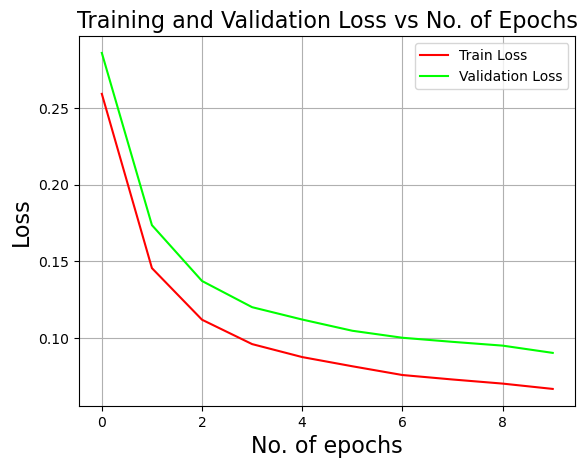

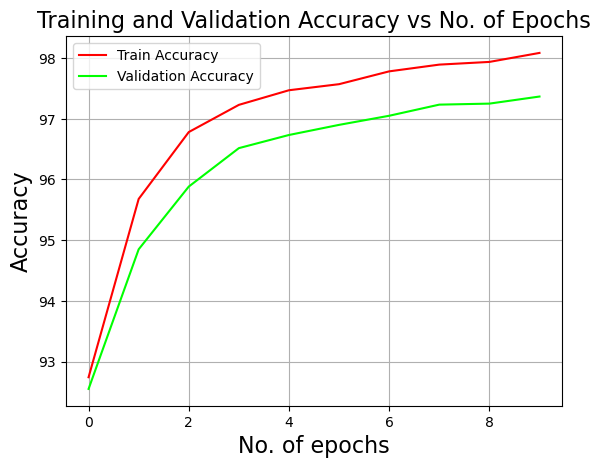

accuracy_train,▁▅▆▇▇▇████
accuracy_validation,▁▄▆▇▇▇████
cost_validation,█▄▃▂▂▂▁▁▁▁
epochs,▁▂▃▃▄▅▆▆▇█
loss_train,█▄▃▂▂▂▁▁▁▁
accuracy_train,98.08519
accuracy_validation,97.36667
cost_validation,0.09031
epochs,9
loss_train,0.06681


wandb: Agent Starting Run: 5j709r5d with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 20
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_20_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_64_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.26  Train accuracy:    92.76 Val error:     0.29 Val accuracy:    92.32
 
 epoch:   2  Train error:      0.11  Train accuracy:    96.81 Val error:     0.14 Val accuracy:    95.95
 
 epoch:   4  Train error:      0.09  Train accuracy:    97.56 Val error:     0.11 Val accuracy:    96.60
 
 epoch:   6  Train error:      0.08  Train accuracy:    97.78 Val error:     0.10 Val accuracy:    96.90
 
 epoch:   8  Train error:      0.07  Train accuracy:    97.96 Val error:     0.10 Val accuracy:    97.03
 
 epoch:  10  Train error:      0.07  Train accuracy:    98.07 Val error:     0.09 Val accuracy:    97.32
 
 epoch:  12  Train error:      0.06  Train accuracy:    98.19 Val error:     0.09 Val accuracy:    97.33
 
 epoch:  14  Train error:     

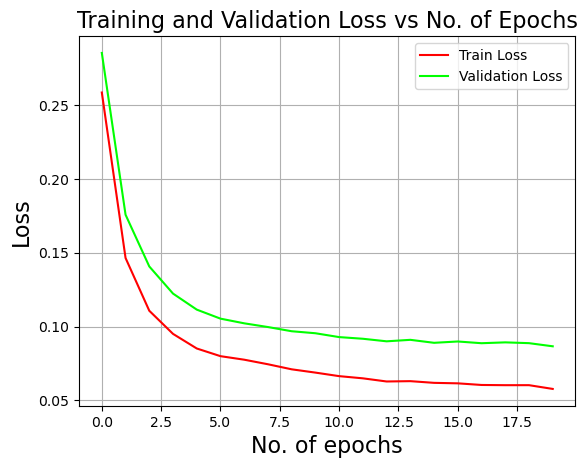

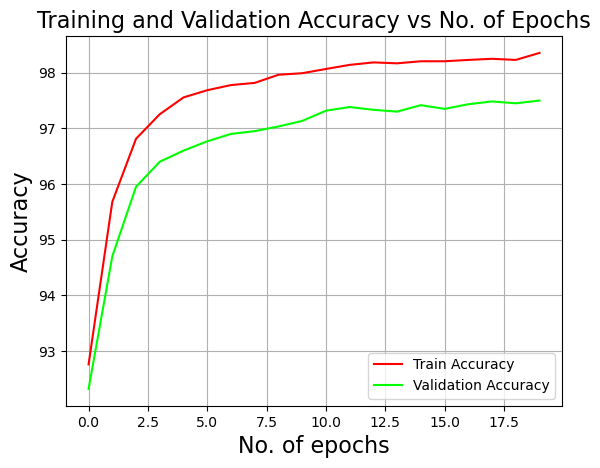

accuracy_train,▁▅▆▇▇▇▇▇████████████
accuracy_validation,▁▄▆▇▇▇▇▇▇███████████
cost_validation,█▄▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
epochs,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss_train,█▄▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
accuracy_train,98.35556
accuracy_validation,97.5
cost_validation,0.08663
epochs,19
loss_train,0.05776


wandb: Agent Starting Run: dv08tqvc with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 8
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 20
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_20_num_hid_1_loss_cross_entropy_function_batchsize_8_neur_64_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.26  Train accuracy:    92.74 Val error:     0.29 Val accuracy:    92.55
 
 epoch:   2  Train error:      0.11  Train accuracy:    96.78 Val error:     0.14 Val accuracy:    95.88
 
 epoch:   4  Train error:      0.09  Train accuracy:    97.47 Val error:     0.11 Val accuracy:    96.73
 
 epoch:   6  Train error:      0.08  Train accuracy:    97.78 Val error:     0.10 Val accuracy:    97.05
 
 epoch:   8  Train error:      0.07  Train accuracy:    97.94 Val error:     0.10 Val accuracy:    97.25
 
 epoch:  10  Train error:      0.07  Train accuracy:    98.13 Val error:     0.09 Val accuracy:    97.35
 
 epoch:  12  Train error:      0.06  Train accuracy:    98.13 Val error:     0.09 Val accuracy:    97.18
 
 epoch:  14  Train error:    

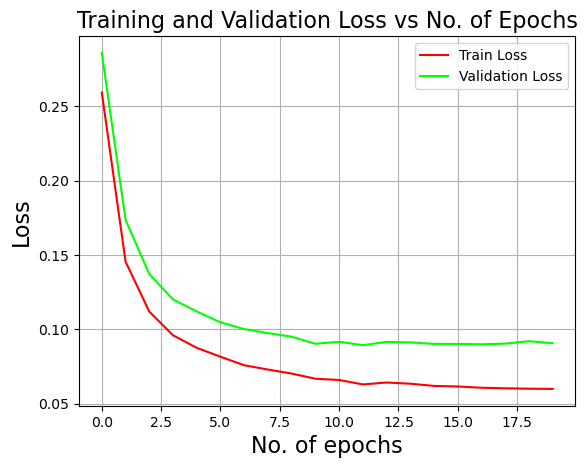

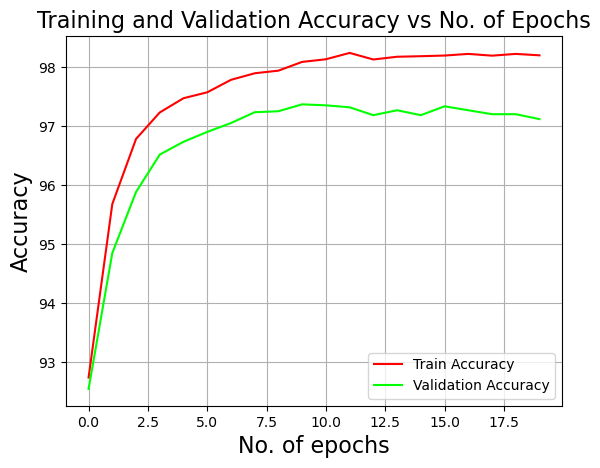

accuracy_train,▁▅▆▇▇▇▇█████████████
accuracy_validation,▁▄▆▇▇▇██████████████
cost_validation,█▄▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epochs,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss_train,█▄▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
accuracy_train,98.1963
accuracy_validation,97.11667
cost_validation,0.09067
epochs,19
loss_train,0.05995


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: ryb7qqth with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 16
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 10
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_10_num_hid_1_loss_cross_entropy_function_batchsize_16_neur_64_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.32  Train accuracy:    91.51 Val error:     0.35 Val accuracy:    91.05
 
 epoch:   1  Train error:      0.18  Train accuracy:    94.59 Val error:     0.22 Val accuracy:    93.68
 
 epoch:   2  Train error:      0.13  Train accuracy:    96.06 Val error:     0.17 Val accuracy:    95.02
 
 epoch:   3  Train error:      0.11  Train accuracy:    96.81 Val error:     0.14 Val accuracy:    95.72
 
 epoch:   4  Train error:      0.09  Train accuracy:    97.29 Val error:     0.13 Val accuracy:    96.37
 
 epoch:   5  Train error:      0.08  Train accuracy:    97.60 Val error:     0.12 Val accuracy:    96.63
 
 epoch:   6  Train error:      0.08  Train accuracy:    97.82 Val error:     0.11 Val accuracy:    96.83
 
 epoch:   7  Train error:    

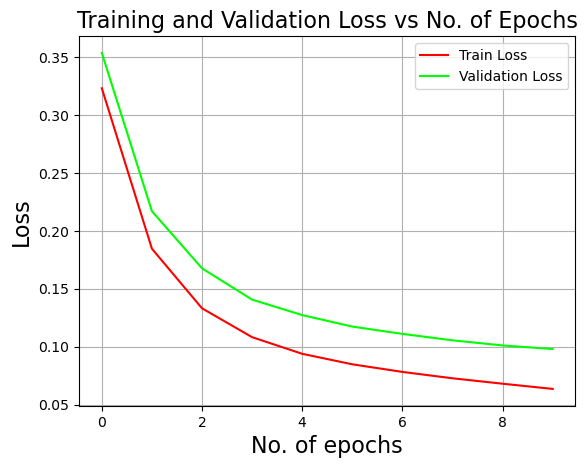

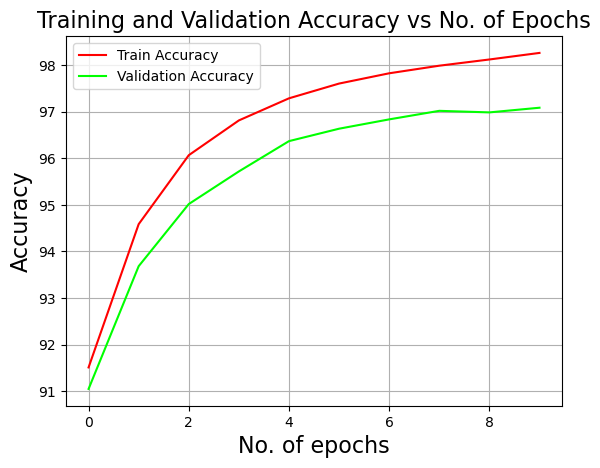

accuracy_train,▁▄▆▆▇▇████
accuracy_validation,▁▄▆▆▇▇████
cost_validation,█▄▃▂▂▂▁▁▁▁
epochs,▁▂▃▃▄▅▆▆▇█
loss_train,█▄▃▂▂▂▁▁▁▁
accuracy_train,98.25926
accuracy_validation,97.08333
cost_validation,0.09795
epochs,9
loss_train,0.06354


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: ow3s5jt9 with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 16
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 10
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_10_num_hid_1_loss_cross_entropy_function_batchsize_16_neur_64_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.32  Train accuracy:    91.39 Val error:     0.35 Val accuracy:    90.98
 
 epoch:   1  Train error:      0.18  Train accuracy:    94.69 Val error:     0.22 Val accuracy:    93.78
 
 epoch:   2  Train error:      0.13  Train accuracy:    96.09 Val error:     0.17 Val accuracy:    94.95
 
 epoch:   3  Train error:      0.11  Train accuracy:    96.82 Val error:     0.14 Val accuracy:    95.75
 
 epoch:   4  Train error:      0.10  Train accuracy:    97.22 Val error:     0.13 Val accuracy:    96.35
 
 epoch:   5  Train error:      0.09  Train accuracy:    97.55 Val error:     0.12 Val accuracy:    96.65
 
 epoch:   6  Train error:      0.08  Train accuracy:    97.82 Val error:     0.11 Val accuracy:    96.82
 
 epoch:   7  Train error:   

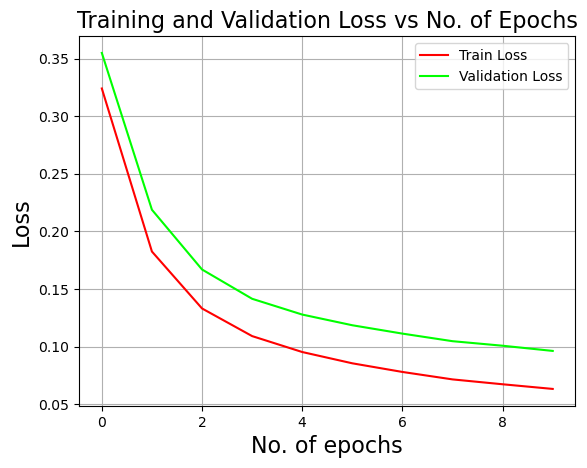

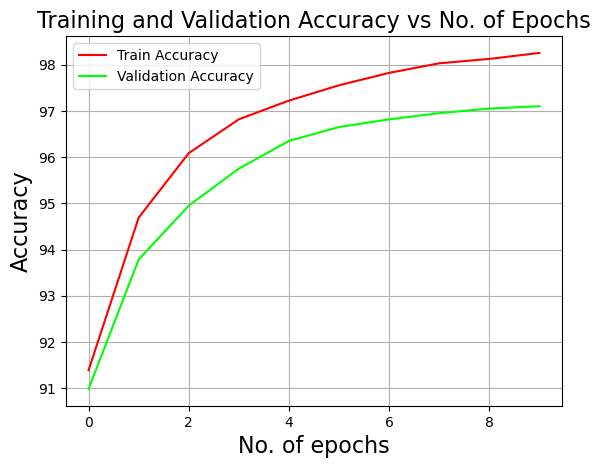

accuracy_train,▁▄▆▇▇▇████
accuracy_validation,▁▄▆▆▇▇████
cost_validation,█▄▃▂▂▂▁▁▁▁
epochs,▁▂▃▃▄▅▆▆▇█
loss_train,█▄▃▂▂▂▁▁▁▁
accuracy_train,98.2537
accuracy_validation,97.1
cost_validation,0.0963
epochs,9
loss_train,0.06332


wandb: Agent Starting Run: jbb8s3b6 with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 16
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 20
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: adam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_adam_epoch_20_num_hid_1_loss_cross_entropy_function_batchsize_16_neur_64_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.32  Train accuracy:    91.51 Val error:     0.35 Val accuracy:    91.05
 
 epoch:   2  Train error:      0.13  Train accuracy:    96.06 Val error:     0.17 Val accuracy:    95.02
 
 epoch:   4  Train error:      0.09  Train accuracy:    97.29 Val error:     0.13 Val accuracy:    96.37
 
 epoch:   6  Train error:      0.08  Train accuracy:    97.82 Val error:     0.11 Val accuracy:    96.83
 
 epoch:   8  Train error:      0.07  Train accuracy:    98.12 Val error:     0.10 Val accuracy:    96.98
 
 epoch:  10  Train error:      0.06  Train accuracy:    98.31 Val error:     0.10 Val accuracy:    97.15
 
 epoch:  12  Train error:      0.05  Train accuracy:    98.55 Val error:     0.09 Val accuracy:    97.37
 
 epoch:  14  Train error:    

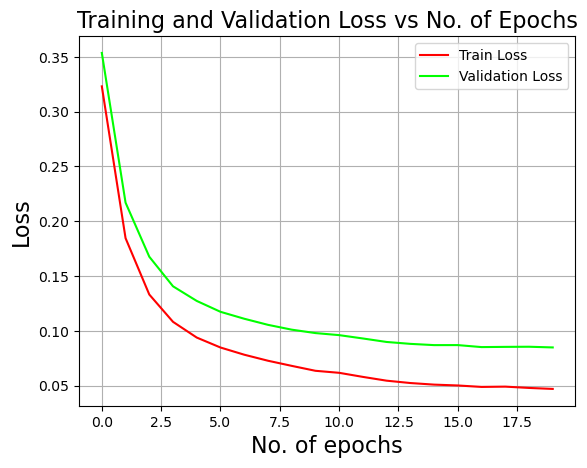

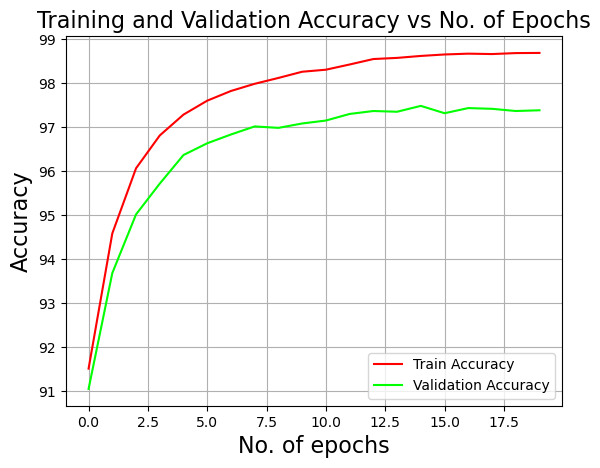

accuracy_train,▁▄▅▆▇▇▇▇▇███████████
accuracy_validation,▁▄▅▆▇▇▇▇▇███████████
cost_validation,█▄▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
epochs,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss_train,█▄▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
accuracy_train,98.68704
accuracy_validation,97.38333
cost_validation,0.08485
epochs,19
loss_train,0.047


wandb: Agent Starting Run: xo468nha with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 16
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 20
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.001
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 64
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: nadam
wandb: 	weight_init: random_initialization


lr_0.001_acti_relu_function_w_inrandom_initialization_opt_nadam_epoch_20_num_hid_1_loss_cross_entropy_function_batchsize_16_neur_64_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 64, 10]
 
 epoch:   0  Train error:      0.32  Train accuracy:    91.39 Val error:     0.35 Val accuracy:    90.98
 
 epoch:   2  Train error:      0.13  Train accuracy:    96.09 Val error:     0.17 Val accuracy:    94.95
 
 epoch:   4  Train error:      0.10  Train accuracy:    97.22 Val error:     0.13 Val accuracy:    96.35
 
 epoch:   6  Train error:      0.08  Train accuracy:    97.82 Val error:     0.11 Val accuracy:    96.82
 
 epoch:   8  Train error:      0.07  Train accuracy:    98.12 Val error:     0.10 Val accuracy:    97.05
 
 epoch:  10  Train error:      0.06  Train accuracy:    98.37 Val error:     0.09 Val accuracy:    97.15
 
 epoch:  12  Train error:      0.06  Train accuracy:    98.46 Val error:     0.09 Val accuracy:    97.30
 
 epoch:  14  Train error:   

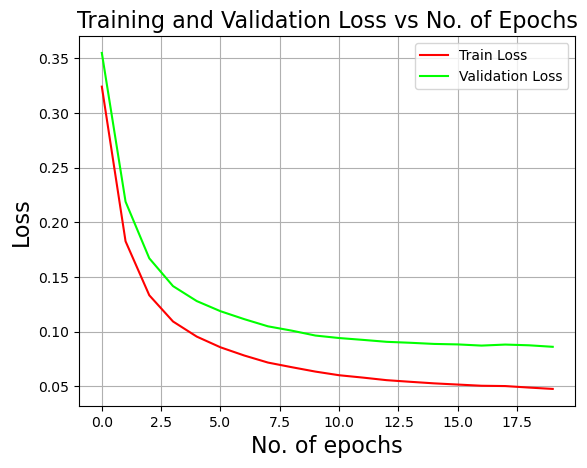

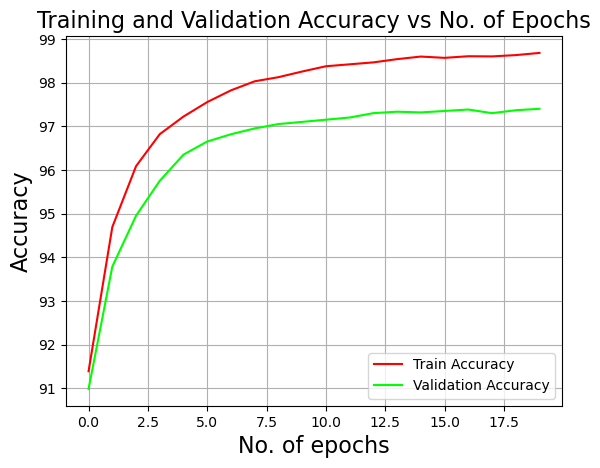

accuracy_train,▁▄▆▆▇▇▇▇▇███████████
accuracy_validation,▁▄▅▆▇▇▇█████████████
cost_validation,█▄▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
epochs,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
loss_train,█▄▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
accuracy_train,98.67963
accuracy_validation,97.4
cost_validation,0.086
epochs,19
loss_train,0.04747


wandb: Sweep Agent: Waiting for job.
wandb: Sweep Agent: Exiting.


In [50]:
'''HIGHEST ACCURACY PLOT FOR MNIST DATASET'''
sweep_config = {
  "name": "Loss and Accuracy-MNIST",
  "metric": {
      "name":"accuracy_validation",
      "goal": "maximize"
  },
  "method": "grid",
  "parameters": {
        "learning_rate": {
            "values": [0.001]
        },
        "activation": {
            "values": ["relu_function"]
        },
        "weight_init": {
            "values": ["random_initialization"]
        },
        "optimizer": {
            "values": ["adam","nadam"]
        },
        "batch_size": {
            "values": [8,16]
        },
        "epochs": {
            "values": [10,20]
        },
        "lambd": {
            "values": [0.001]
        },
        "neurons": {
            "values": [64]
        },
        "num_hidden_layers": {
            "values": [1]
        },
        "momentum": {
            "values": [0.9]
        },
        "beta": {
            "values": [0.9]
        },
        "beta1": {
            "values": [0.9]
        },
        "beta2": {
            "values": [0.99]
        },
        "loss": {
            "values": ['cross_entropy_function']
        }
    }
}

sweep_id = wandb.sweep(sweep_config, project="CS6910_DL_ASS1")
wandb.agent(sweep_id, neural_network)



Create sweep with ID: p9tlr7dn
Sweep URL: https://wandb.ai/ananthu2014/CS6910_DL_ASS1/sweeps/p9tlr7dn


wandb: Agent Starting Run: thm3456n with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 32
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 10
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.01
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 32
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: rms_prop
wandb: 	weight_init: random_initialization


lr_0.01_acti_relu_function_w_inrandom_initialization_opt_rms_prop_epoch_10_num_hid_1_loss_cross_entropy_function_batchsize_32_neur_32_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 32, 10]
 
 epoch:   0  Train error:      0.35  Train accuracy:    90.22 Val error:     0.36 Val accuracy:    90.13
 
 epoch:   1  Train error:      0.29  Train accuracy:    91.90 Val error:     0.31 Val accuracy:    91.43
 
 epoch:   2  Train error:      0.32  Train accuracy:    91.24 Val error:     0.34 Val accuracy:    90.83
 
 epoch:   3  Train error:      0.30  Train accuracy:    91.49 Val error:     0.32 Val accuracy:    91.12
 
 epoch:   4  Train error:      0.31  Train accuracy:    91.31 Val error:     0.33 Val accuracy:    90.70
 
 epoch:   5  Train error:      0.32  Train accuracy:    91.05 Val error:     0.33 Val accuracy:    91.00
 
 epoch:   6  Train error:      0.45  Train accuracy:    87.56 Val error:     0.47 Val accuracy:    87.63
 
 epoch:   7  Train error: 

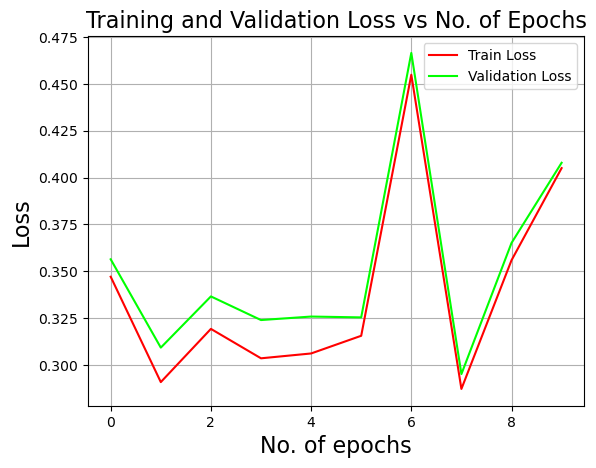

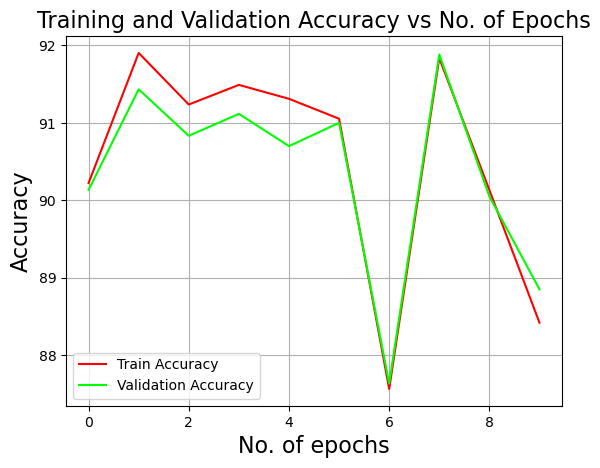

accuracy_train,▅█▇▇▇▇▁█▅▂
accuracy_validation,▅▇▆▇▆▇▁█▅▃
cost_validation,▄▂▃▂▂▂█▁▄▆
epochs,▁▂▃▃▄▅▆▆▇█
loss_train,▃▁▂▂▂▂█▁▄▆
accuracy_train,88.41852
accuracy_validation,88.85
cost_validation,0.40789
epochs,9
loss_train,0.40504


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 7fpgixvb with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 32
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 10
wandb: 	lambd: 0.01
wandb: 	learning_rate: 0.01
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 32
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: rms_prop
wandb: 	weight_init: random_initialization


lr_0.01_acti_relu_function_w_inrandom_initialization_opt_rms_prop_epoch_10_num_hid_1_loss_cross_entropy_function_batchsize_32_neur_32_lam_0.01_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 32, 10]
 
 epoch:   0  Train error:      0.73  Train accuracy:    79.54 Val error:     0.73 Val accuracy:    79.95
 
 epoch:   1  Train error:      0.53  Train accuracy:    83.22 Val error:     0.53 Val accuracy:    83.32
 
 epoch:   2  Train error:      0.49  Train accuracy:    85.03 Val error:     0.49 Val accuracy:    85.15
 
 epoch:   3  Train error:      0.47  Train accuracy:    85.86 Val error:     0.47 Val accuracy:    86.02
 
 epoch:   4  Train error:      0.57  Train accuracy:    82.64 Val error:     0.57 Val accuracy:    83.00
 
 epoch:   5  Train error:      0.55  Train accuracy:    83.01 Val error:     0.55 Val accuracy:    83.13
 
 epoch:   6  Train error:      0.54  Train accuracy:    83.21 Val error:     0.54 Val accuracy:    83.53
 
 epoch:   7  Train error:  

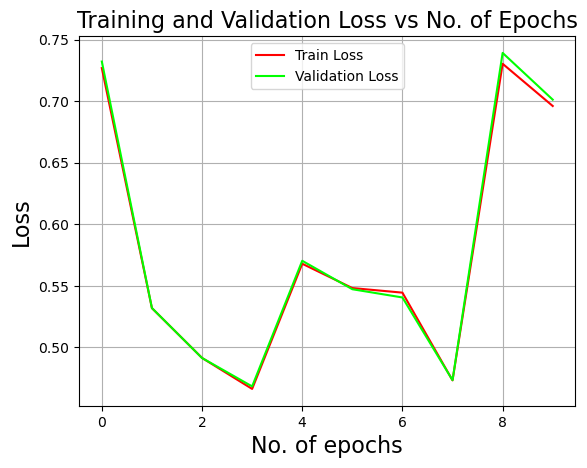

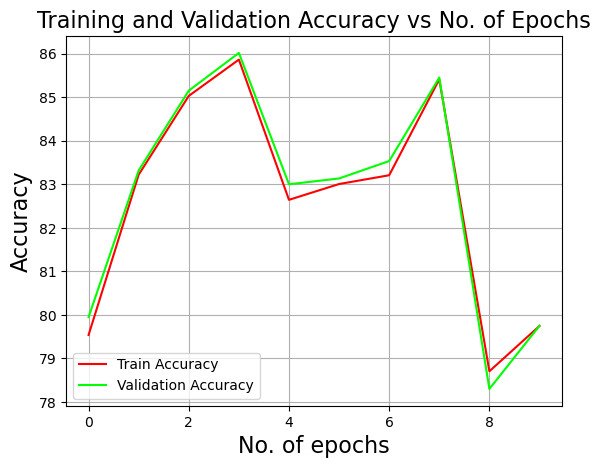

accuracy_train,▂▅▇█▅▅▅█▁▂
accuracy_validation,▂▆▇█▅▅▆▇▁▂
cost_validation,█▃▂▁▄▃▃▁█▇
epochs,▁▂▃▃▄▅▆▆▇█
loss_train,█▃▂▁▄▃▃▁█▇
accuracy_train,79.7463
accuracy_validation,79.75
cost_validation,0.70128
epochs,9
loss_train,0.69612


wandb: Agent Starting Run: k1oxuktg with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 64
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 10
wandb: 	lambd: 0.001
wandb: 	learning_rate: 0.01
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 32
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: rms_prop
wandb: 	weight_init: random_initialization


lr_0.01_acti_relu_function_w_inrandom_initialization_opt_rms_prop_epoch_10_num_hid_1_loss_cross_entropy_function_batchsize_64_neur_32_lam_0.001_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 32, 10]
 
 epoch:   0  Train error:      0.34  Train accuracy:    90.32 Val error:     0.34 Val accuracy:    90.60
 
 epoch:   1  Train error:      0.28  Train accuracy:    91.83 Val error:     0.29 Val accuracy:    91.83
 
 epoch:   2  Train error:      0.23  Train accuracy:    93.42 Val error:     0.25 Val accuracy:    93.30
 
 epoch:   3  Train error:      0.21  Train accuracy:    93.89 Val error:     0.22 Val accuracy:    93.68
 
 epoch:   4  Train error:      0.26  Train accuracy:    92.38 Val error:     0.28 Val accuracy:    92.07
 
 epoch:   5  Train error:      0.30  Train accuracy:    91.50 Val error:     0.32 Val accuracy:    90.80
 
 epoch:   6  Train error:      0.24  Train accuracy:    93.06 Val error:     0.26 Val accuracy:    92.43
 
 epoch:   7  Train error: 

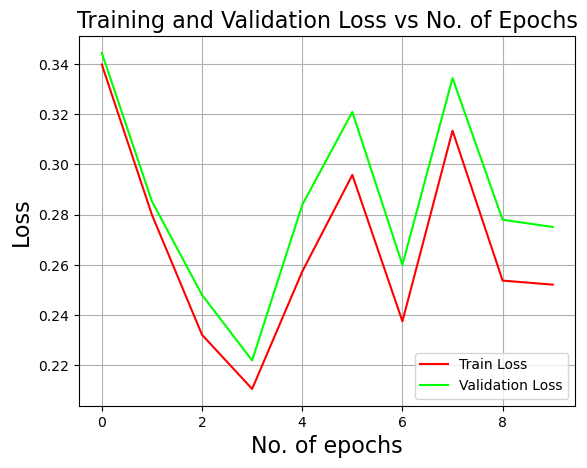

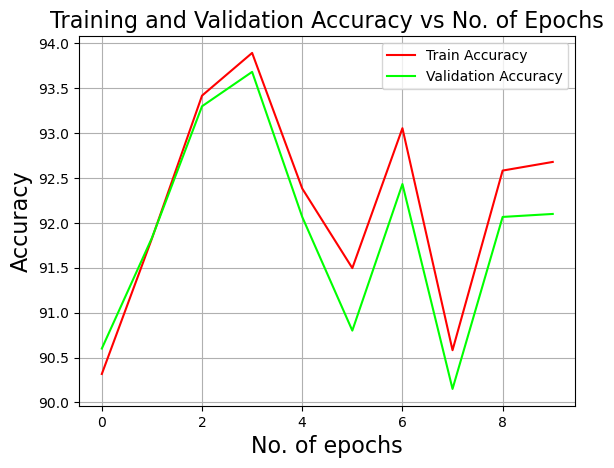

accuracy_train,▁▄▇█▅▃▆▂▅▆
accuracy_validation,▂▄▇█▅▂▆▁▅▅
cost_validation,█▅▂▁▅▇▃▇▄▄
epochs,▁▂▃▃▄▅▆▆▇█
loss_train,█▅▂▁▄▆▂▇▃▃
accuracy_train,92.67963
accuracy_validation,92.1
cost_validation,0.27512
epochs,9
loss_train,0.25216


wandb: Agent Starting Run: ndhctcva with config:
wandb: 	activation: relu_function
wandb: 	batch_size: 64
wandb: 	beta: 0.9
wandb: 	beta1: 0.9
wandb: 	beta2: 0.99
wandb: 	epochs: 10
wandb: 	lambd: 0.01
wandb: 	learning_rate: 0.01
wandb: 	loss: cross_entropy_function
wandb: 	momentum: 0.9
wandb: 	neurons: 32
wandb: 	num_hidden_layers: 1
wandb: 	optimizer: rms_prop
wandb: 	weight_init: random_initialization


lr_0.01_acti_relu_function_w_inrandom_initialization_opt_rms_prop_epoch_10_num_hid_1_loss_cross_entropy_function_batchsize_64_neur_32_lam_0.01_momentum_0.9_beta_0.9_beta1_0.9_beta2_0.99
neuron configuration: [784, 32, 10]
 
 epoch:   0  Train error:      0.96  Train accuracy:    72.32 Val error:     0.96 Val accuracy:    72.18
 
 epoch:   1  Train error:      0.80  Train accuracy:    75.88 Val error:     0.80 Val accuracy:    76.12
 
 epoch:   2  Train error:      1.00  Train accuracy:    71.35 Val error:     0.98 Val accuracy:    72.12
 
 epoch:   3  Train error:      0.78  Train accuracy:    77.99 Val error:     0.76 Val accuracy:    78.53
 
 epoch:   4  Train error:      0.89  Train accuracy:    73.58 Val error:     0.88 Val accuracy:    73.90
 
 epoch:   5  Train error:      0.73  Train accuracy:    76.30 Val error:     0.71 Val accuracy:    77.30
 
 epoch:   6  Train error:      0.80  Train accuracy:    75.62 Val error:     0.80 Val accuracy:    75.53
 
 epoch:   7  Train error:  

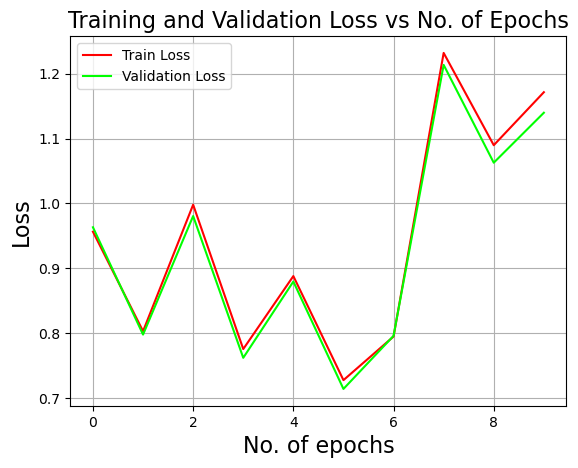

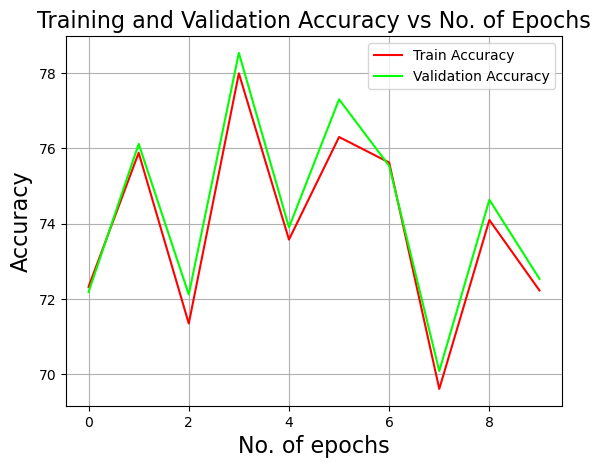

accuracy_train,▃▆▂█▄▇▆▁▅▃
accuracy_validation,▃▆▃█▄▇▆▁▅▃
cost_validation,▄▂▅▂▃▁▂█▆▇
epochs,▁▂▃▃▄▅▆▆▇█
loss_train,▄▂▅▂▃▁▂█▆▇
accuracy_train,72.22407
accuracy_validation,72.53333
cost_validation,1.13971
epochs,9
loss_train,1.17132


wandb: Sweep Agent: Waiting for job.
wandb: Sweep Agent: Exiting.


In [78]:
'''HIGHEST ACCURACY PLOT FOR MNIST DATASET'''
sweep_config = {
  "name": "Loss and Accuracy-MNIST",
  "metric": {
      "name":"accuracy_validation",
      "goal": "maximize"
  },
  "method": "grid",
  "parameters": {
        "learning_rate": {
            "values": [0.01]
        },
        "activation": {
            "values": ["relu_function"]
        },
        "weight_init": {
            "values": ["random_initialization"]
        },
        "optimizer": {
            "values": ["rms_prop"]
        },
        "batch_size": {
            "values": [32,64]
        },
        "epochs": {
            "values": [10]
        },
        "lambd": {
            "values": [0.001,0.01]
        },
        "neurons": {
            "values": [32]
        },
        "num_hidden_layers": {
            "values": [1]
        },
        "momentum": {
            "values": [0.9]
        },
        "beta": {
            "values": [0.9]
        },
        "beta1": {
            "values": [0.9]
        },
        "beta2": {
            "values": [0.99]
        },
        "loss": {
            "values": ['cross_entropy_function']
        }
    }
}

sweep_id = wandb.sweep(sweep_config, project="CS6910_DL_ASS1")
wandb.agent(sweep_id, neural_network)

